### Exploration: Let's explore this Zillow dataset.  We will examine and prepare the data we have using what we have written in our preparation scripts and plot/test our data to examine trends and identify clusters to help us indicate what perhaps may be driving the error in the Zestimate.

Prepare your environment:

In [1]:
# for acquiring:
import numpy as np
import pandas as pd
# for plotting:
import matplotlib.pyplot as plt
import seaborn as sns
# for analysis:
import scipy.stats as stats
# for plotting:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
#for specific acq and prep:
from acquire_zillow import *
from prepare_zillow import *
from explore_zillow import *

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error
from sklearn.cluster import KMeans

from scipy.stats import pearsonr



Get your data: get_zillow acquires the data from an sql query and creates a csv.  We will run this to acquire our dataset for reproducability.  (I have included a commented line for reading from the csv once created to ease my personal workflow after the initial query)

In [2]:
# df = get_zillow()
df = pd.read_csv('zillow.csv')

/usr/local/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (56) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
# take a quick look at our data:
peekatdata(df)
value_counts(df)

        id  parcelid  basementsqft  bathroomcnt  bedroomcnt  \
0  2931667  11016594           NaN          2.0         3.0   
1   475764  14366692           NaN          3.5         4.0   
2  2444575  12098116           NaN          3.0         2.0   
3  1584730  12643413           NaN          2.0         2.0   
4  2926916  14432541           NaN          2.5         4.0   

   buildingqualitytypeid  calculatedbathnbr  decktypeid  \
0                    4.0                2.0         NaN   
1                    NaN                3.5         NaN   
2                    4.0                3.0         NaN   
3                    4.0                2.0         NaN   
4                    NaN                2.5         NaN   

   finishedfloor1squarefeet  calculatedfinishedsquarefeet  \
0                       NaN                        1684.0   
1                       NaN                        2263.0   
2                       NaN                        2217.0   
3                     

KeyError: "['parcel_id'] not found in axis"

In [4]:
# Below we will utilize a combination of functions into a prep_zillow() function.
# descriptions are in prepare_zillow.py, but we will proceed to fill some zeros, then use our main
# prepatory function.  We will drop columns if more than half is empty, and rows if more than 3/4 is empty.
# we will remove establishments not perceived to be single peroperties.
# we will impute lotsize based on a linear regression with tax value of property.
# we will remove outliers that don't fit our perception of utility in this context.




# def prep_zillow(df):
#     df = handle_missing_values(df, prop_required_column=.5, prop_required_row=.75)
#     df = groom_singles(df)
#     df = numeric_to_categorical(df)
#     df = impute_lotsize(df)
#     df = maggies_manual_outliers(df)
#     df = drop_nas(df)
#     df.reset_index(inplace=True, drop=True)


In [5]:
#fill some of the column values with zeros based on what we see in our data dictionary.  
# pools and decks seem to only have values if they were observed based on the descriptions.
# fireplace, hot tub, and garage would generally be defaulted to zero as well unless noted as a feature to sell property
fill_zeros(df, ['decktypeid', 'fireplacecnt', 'garagecarcnt', 'hashottuborspa'])

/usr/local/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


In [3]:
#Let's look at some outliers in our data to 
# examine what we might want to remove:
get_nulls_by_row(df)


row: 0 count nulls: 27, percent nulls in row: 44.26.
row: 1 count nulls: 31, percent nulls in row: 50.82.
row: 2 count nulls: 27, percent nulls in row: 44.26.
row: 3 count nulls: 27, percent nulls in row: 44.26.
row: 4 count nulls: 27, percent nulls in row: 44.26.
row: 5 count nulls: 28, percent nulls in row: 45.90.
row: 6 count nulls: 29, percent nulls in row: 47.54.
row: 7 count nulls: 27, percent nulls in row: 44.26.
row: 8 count nulls: 32, percent nulls in row: 52.46.
row: 9 count nulls: 31, percent nulls in row: 50.82.
row: 10 count nulls: 28, percent nulls in row: 45.90.
row: 11 count nulls: 27, percent nulls in row: 44.26.
row: 12 count nulls: 29, percent nulls in row: 47.54.
row: 13 count nulls: 33, percent nulls in row: 54.10.
row: 14 count nulls: 29, percent nulls in row: 47.54.
row: 15 count nulls: 27, percent nulls in row: 44.26.
row: 16 count nulls: 26, percent nulls in row: 42.62.
row: 17 count nulls: 26, percent nulls in row: 42.62.
row: 18 count nulls: 30, percent nulls

row: 279 count nulls: 29, percent nulls in row: 47.54.
row: 280 count nulls: 25, percent nulls in row: 40.98.
row: 281 count nulls: 28, percent nulls in row: 45.90.
row: 282 count nulls: 27, percent nulls in row: 44.26.
row: 283 count nulls: 29, percent nulls in row: 47.54.
row: 284 count nulls: 31, percent nulls in row: 50.82.
row: 285 count nulls: 27, percent nulls in row: 44.26.
row: 286 count nulls: 27, percent nulls in row: 44.26.
row: 287 count nulls: 28, percent nulls in row: 45.90.
row: 288 count nulls: 29, percent nulls in row: 47.54.
row: 289 count nulls: 28, percent nulls in row: 45.90.
row: 290 count nulls: 28, percent nulls in row: 45.90.
row: 291 count nulls: 26, percent nulls in row: 42.62.
row: 292 count nulls: 29, percent nulls in row: 47.54.
row: 293 count nulls: 38, percent nulls in row: 62.30.
row: 294 count nulls: 30, percent nulls in row: 49.18.
row: 295 count nulls: 27, percent nulls in row: 44.26.
row: 296 count nulls: 25, percent nulls in row: 40.98.
row: 297 c

row: 561 count nulls: 27, percent nulls in row: 44.26.
row: 562 count nulls: 27, percent nulls in row: 44.26.
row: 563 count nulls: 28, percent nulls in row: 45.90.
row: 564 count nulls: 27, percent nulls in row: 44.26.
row: 565 count nulls: 26, percent nulls in row: 42.62.
row: 566 count nulls: 28, percent nulls in row: 45.90.
row: 567 count nulls: 29, percent nulls in row: 47.54.
row: 568 count nulls: 28, percent nulls in row: 45.90.
row: 569 count nulls: 29, percent nulls in row: 47.54.
row: 570 count nulls: 31, percent nulls in row: 50.82.
row: 571 count nulls: 28, percent nulls in row: 45.90.
row: 572 count nulls: 29, percent nulls in row: 47.54.
row: 573 count nulls: 31, percent nulls in row: 50.82.
row: 574 count nulls: 26, percent nulls in row: 42.62.
row: 575 count nulls: 28, percent nulls in row: 45.90.
row: 576 count nulls: 29, percent nulls in row: 47.54.
row: 577 count nulls: 28, percent nulls in row: 45.90.
row: 578 count nulls: 28, percent nulls in row: 45.90.
row: 579 c

row: 866 count nulls: 30, percent nulls in row: 49.18.
row: 867 count nulls: 28, percent nulls in row: 45.90.
row: 868 count nulls: 32, percent nulls in row: 52.46.
row: 869 count nulls: 28, percent nulls in row: 45.90.
row: 870 count nulls: 28, percent nulls in row: 45.90.
row: 871 count nulls: 27, percent nulls in row: 44.26.
row: 872 count nulls: 31, percent nulls in row: 50.82.
row: 873 count nulls: 27, percent nulls in row: 44.26.
row: 874 count nulls: 26, percent nulls in row: 42.62.
row: 875 count nulls: 31, percent nulls in row: 50.82.
row: 876 count nulls: 28, percent nulls in row: 45.90.
row: 877 count nulls: 29, percent nulls in row: 47.54.
row: 878 count nulls: 27, percent nulls in row: 44.26.
row: 879 count nulls: 29, percent nulls in row: 47.54.
row: 880 count nulls: 28, percent nulls in row: 45.90.
row: 881 count nulls: 26, percent nulls in row: 42.62.
row: 882 count nulls: 27, percent nulls in row: 44.26.
row: 883 count nulls: 27, percent nulls in row: 44.26.
row: 884 c

row: 1167 count nulls: 29, percent nulls in row: 47.54.
row: 1168 count nulls: 29, percent nulls in row: 47.54.
row: 1169 count nulls: 25, percent nulls in row: 40.98.
row: 1170 count nulls: 29, percent nulls in row: 47.54.
row: 1171 count nulls: 28, percent nulls in row: 45.90.
row: 1172 count nulls: 32, percent nulls in row: 52.46.
row: 1173 count nulls: 30, percent nulls in row: 49.18.
row: 1174 count nulls: 28, percent nulls in row: 45.90.
row: 1175 count nulls: 26, percent nulls in row: 42.62.
row: 1176 count nulls: 29, percent nulls in row: 47.54.
row: 1177 count nulls: 28, percent nulls in row: 45.90.
row: 1178 count nulls: 28, percent nulls in row: 45.90.
row: 1179 count nulls: 28, percent nulls in row: 45.90.
row: 1180 count nulls: 29, percent nulls in row: 47.54.
row: 1181 count nulls: 28, percent nulls in row: 45.90.
row: 1182 count nulls: 27, percent nulls in row: 44.26.
row: 1183 count nulls: 28, percent nulls in row: 45.90.
row: 1184 count nulls: 31, percent nulls in row:

row: 1471 count nulls: 27, percent nulls in row: 44.26.
row: 1472 count nulls: 29, percent nulls in row: 47.54.
row: 1473 count nulls: 28, percent nulls in row: 45.90.
row: 1474 count nulls: 28, percent nulls in row: 45.90.
row: 1475 count nulls: 25, percent nulls in row: 40.98.
row: 1476 count nulls: 29, percent nulls in row: 47.54.
row: 1477 count nulls: 29, percent nulls in row: 47.54.
row: 1478 count nulls: 27, percent nulls in row: 44.26.
row: 1479 count nulls: 25, percent nulls in row: 40.98.
row: 1480 count nulls: 28, percent nulls in row: 45.90.
row: 1481 count nulls: 28, percent nulls in row: 45.90.
row: 1482 count nulls: 29, percent nulls in row: 47.54.
row: 1483 count nulls: 28, percent nulls in row: 45.90.
row: 1484 count nulls: 28, percent nulls in row: 45.90.
row: 1485 count nulls: 26, percent nulls in row: 42.62.
row: 1486 count nulls: 29, percent nulls in row: 47.54.
row: 1487 count nulls: 28, percent nulls in row: 45.90.
row: 1488 count nulls: 27, percent nulls in row:

row: 1730 count nulls: 29, percent nulls in row: 47.54.
row: 1731 count nulls: 27, percent nulls in row: 44.26.
row: 1732 count nulls: 29, percent nulls in row: 47.54.
row: 1733 count nulls: 26, percent nulls in row: 42.62.
row: 1734 count nulls: 29, percent nulls in row: 47.54.
row: 1735 count nulls: 28, percent nulls in row: 45.90.
row: 1736 count nulls: 26, percent nulls in row: 42.62.
row: 1737 count nulls: 39, percent nulls in row: 63.93.
row: 1738 count nulls: 28, percent nulls in row: 45.90.
row: 1739 count nulls: 28, percent nulls in row: 45.90.
row: 1740 count nulls: 30, percent nulls in row: 49.18.
row: 1741 count nulls: 27, percent nulls in row: 44.26.
row: 1742 count nulls: 28, percent nulls in row: 45.90.
row: 1743 count nulls: 29, percent nulls in row: 47.54.
row: 1744 count nulls: 27, percent nulls in row: 44.26.
row: 1745 count nulls: 30, percent nulls in row: 49.18.
row: 1746 count nulls: 26, percent nulls in row: 42.62.
row: 1747 count nulls: 32, percent nulls in row:

row: 1961 count nulls: 27, percent nulls in row: 44.26.
row: 1962 count nulls: 28, percent nulls in row: 45.90.
row: 1963 count nulls: 26, percent nulls in row: 42.62.
row: 1964 count nulls: 28, percent nulls in row: 45.90.
row: 1965 count nulls: 28, percent nulls in row: 45.90.
row: 1966 count nulls: 28, percent nulls in row: 45.90.
row: 1967 count nulls: 28, percent nulls in row: 45.90.
row: 1968 count nulls: 27, percent nulls in row: 44.26.
row: 1969 count nulls: 28, percent nulls in row: 45.90.
row: 1970 count nulls: 27, percent nulls in row: 44.26.
row: 1971 count nulls: 30, percent nulls in row: 49.18.
row: 1972 count nulls: 27, percent nulls in row: 44.26.
row: 1973 count nulls: 30, percent nulls in row: 49.18.
row: 1974 count nulls: 26, percent nulls in row: 42.62.
row: 1975 count nulls: 28, percent nulls in row: 45.90.
row: 1976 count nulls: 30, percent nulls in row: 49.18.
row: 1977 count nulls: 29, percent nulls in row: 47.54.
row: 1978 count nulls: 28, percent nulls in row:

row: 2238 count nulls: 31, percent nulls in row: 50.82.
row: 2239 count nulls: 29, percent nulls in row: 47.54.
row: 2240 count nulls: 28, percent nulls in row: 45.90.
row: 2241 count nulls: 26, percent nulls in row: 42.62.
row: 2242 count nulls: 29, percent nulls in row: 47.54.
row: 2243 count nulls: 26, percent nulls in row: 42.62.
row: 2244 count nulls: 26, percent nulls in row: 42.62.
row: 2245 count nulls: 27, percent nulls in row: 44.26.
row: 2246 count nulls: 29, percent nulls in row: 47.54.
row: 2247 count nulls: 27, percent nulls in row: 44.26.
row: 2248 count nulls: 28, percent nulls in row: 45.90.
row: 2249 count nulls: 28, percent nulls in row: 45.90.
row: 2250 count nulls: 30, percent nulls in row: 49.18.
row: 2251 count nulls: 25, percent nulls in row: 40.98.
row: 2252 count nulls: 27, percent nulls in row: 44.26.
row: 2253 count nulls: 27, percent nulls in row: 44.26.
row: 2254 count nulls: 28, percent nulls in row: 45.90.
row: 2255 count nulls: 27, percent nulls in row:

row: 2551 count nulls: 32, percent nulls in row: 52.46.
row: 2552 count nulls: 29, percent nulls in row: 47.54.
row: 2553 count nulls: 26, percent nulls in row: 42.62.
row: 2554 count nulls: 27, percent nulls in row: 44.26.
row: 2555 count nulls: 29, percent nulls in row: 47.54.
row: 2556 count nulls: 26, percent nulls in row: 42.62.
row: 2557 count nulls: 29, percent nulls in row: 47.54.
row: 2558 count nulls: 29, percent nulls in row: 47.54.
row: 2559 count nulls: 32, percent nulls in row: 52.46.
row: 2560 count nulls: 27, percent nulls in row: 44.26.
row: 2561 count nulls: 29, percent nulls in row: 47.54.
row: 2562 count nulls: 28, percent nulls in row: 45.90.
row: 2563 count nulls: 25, percent nulls in row: 40.98.
row: 2564 count nulls: 28, percent nulls in row: 45.90.
row: 2565 count nulls: 30, percent nulls in row: 49.18.
row: 2566 count nulls: 26, percent nulls in row: 42.62.
row: 2567 count nulls: 27, percent nulls in row: 44.26.
row: 2568 count nulls: 27, percent nulls in row:

row: 2722 count nulls: 32, percent nulls in row: 52.46.
row: 2723 count nulls: 29, percent nulls in row: 47.54.
row: 2724 count nulls: 29, percent nulls in row: 47.54.
row: 2725 count nulls: 32, percent nulls in row: 52.46.
row: 2726 count nulls: 32, percent nulls in row: 52.46.
row: 2727 count nulls: 28, percent nulls in row: 45.90.
row: 2728 count nulls: 28, percent nulls in row: 45.90.
row: 2729 count nulls: 29, percent nulls in row: 47.54.
row: 2730 count nulls: 30, percent nulls in row: 49.18.
row: 2731 count nulls: 25, percent nulls in row: 40.98.
row: 2732 count nulls: 29, percent nulls in row: 47.54.
row: 2733 count nulls: 29, percent nulls in row: 47.54.
row: 2734 count nulls: 28, percent nulls in row: 45.90.
row: 2735 count nulls: 30, percent nulls in row: 49.18.
row: 2736 count nulls: 29, percent nulls in row: 47.54.
row: 2737 count nulls: 29, percent nulls in row: 47.54.
row: 2738 count nulls: 28, percent nulls in row: 45.90.
row: 2739 count nulls: 29, percent nulls in row:

row: 3065 count nulls: 30, percent nulls in row: 49.18.
row: 3066 count nulls: 24, percent nulls in row: 39.34.
row: 3067 count nulls: 31, percent nulls in row: 50.82.
row: 3068 count nulls: 30, percent nulls in row: 49.18.
row: 3069 count nulls: 28, percent nulls in row: 45.90.
row: 3070 count nulls: 26, percent nulls in row: 42.62.
row: 3071 count nulls: 29, percent nulls in row: 47.54.
row: 3072 count nulls: 30, percent nulls in row: 49.18.
row: 3073 count nulls: 30, percent nulls in row: 49.18.
row: 3074 count nulls: 40, percent nulls in row: 65.57.
row: 3075 count nulls: 33, percent nulls in row: 54.10.
row: 3076 count nulls: 30, percent nulls in row: 49.18.
row: 3077 count nulls: 27, percent nulls in row: 44.26.
row: 3078 count nulls: 27, percent nulls in row: 44.26.
row: 3079 count nulls: 29, percent nulls in row: 47.54.
row: 3080 count nulls: 28, percent nulls in row: 45.90.
row: 3081 count nulls: 29, percent nulls in row: 47.54.
row: 3082 count nulls: 29, percent nulls in row:

row: 3310 count nulls: 28, percent nulls in row: 45.90.
row: 3311 count nulls: 29, percent nulls in row: 47.54.
row: 3312 count nulls: 29, percent nulls in row: 47.54.
row: 3313 count nulls: 27, percent nulls in row: 44.26.
row: 3314 count nulls: 27, percent nulls in row: 44.26.
row: 3315 count nulls: 25, percent nulls in row: 40.98.
row: 3316 count nulls: 26, percent nulls in row: 42.62.
row: 3317 count nulls: 28, percent nulls in row: 45.90.
row: 3318 count nulls: 31, percent nulls in row: 50.82.
row: 3319 count nulls: 32, percent nulls in row: 52.46.
row: 3320 count nulls: 32, percent nulls in row: 52.46.
row: 3321 count nulls: 32, percent nulls in row: 52.46.
row: 3322 count nulls: 29, percent nulls in row: 47.54.
row: 3323 count nulls: 28, percent nulls in row: 45.90.
row: 3324 count nulls: 28, percent nulls in row: 45.90.
row: 3325 count nulls: 30, percent nulls in row: 49.18.
row: 3326 count nulls: 27, percent nulls in row: 44.26.
row: 3327 count nulls: 29, percent nulls in row:

row: 3539 count nulls: 31, percent nulls in row: 50.82.
row: 3540 count nulls: 25, percent nulls in row: 40.98.
row: 3541 count nulls: 29, percent nulls in row: 47.54.
row: 3542 count nulls: 28, percent nulls in row: 45.90.
row: 3543 count nulls: 26, percent nulls in row: 42.62.
row: 3544 count nulls: 26, percent nulls in row: 42.62.
row: 3545 count nulls: 28, percent nulls in row: 45.90.
row: 3546 count nulls: 28, percent nulls in row: 45.90.
row: 3547 count nulls: 25, percent nulls in row: 40.98.
row: 3548 count nulls: 28, percent nulls in row: 45.90.
row: 3549 count nulls: 30, percent nulls in row: 49.18.
row: 3550 count nulls: 27, percent nulls in row: 44.26.
row: 3551 count nulls: 30, percent nulls in row: 49.18.
row: 3552 count nulls: 28, percent nulls in row: 45.90.
row: 3553 count nulls: 25, percent nulls in row: 40.98.
row: 3554 count nulls: 29, percent nulls in row: 47.54.
row: 3555 count nulls: 26, percent nulls in row: 42.62.
row: 3556 count nulls: 29, percent nulls in row:

row: 3859 count nulls: 27, percent nulls in row: 44.26.
row: 3860 count nulls: 32, percent nulls in row: 52.46.
row: 3861 count nulls: 26, percent nulls in row: 42.62.
row: 3862 count nulls: 27, percent nulls in row: 44.26.
row: 3863 count nulls: 28, percent nulls in row: 45.90.
row: 3864 count nulls: 30, percent nulls in row: 49.18.
row: 3865 count nulls: 29, percent nulls in row: 47.54.
row: 3866 count nulls: 28, percent nulls in row: 45.90.
row: 3867 count nulls: 26, percent nulls in row: 42.62.
row: 3868 count nulls: 31, percent nulls in row: 50.82.
row: 3869 count nulls: 25, percent nulls in row: 40.98.
row: 3870 count nulls: 29, percent nulls in row: 47.54.
row: 3871 count nulls: 25, percent nulls in row: 40.98.
row: 3872 count nulls: 28, percent nulls in row: 45.90.
row: 3873 count nulls: 25, percent nulls in row: 40.98.
row: 3874 count nulls: 29, percent nulls in row: 47.54.
row: 3875 count nulls: 27, percent nulls in row: 44.26.
row: 3876 count nulls: 29, percent nulls in row:

row: 4117 count nulls: 29, percent nulls in row: 47.54.
row: 4118 count nulls: 28, percent nulls in row: 45.90.
row: 4119 count nulls: 28, percent nulls in row: 45.90.
row: 4120 count nulls: 29, percent nulls in row: 47.54.
row: 4121 count nulls: 29, percent nulls in row: 47.54.
row: 4122 count nulls: 31, percent nulls in row: 50.82.
row: 4123 count nulls: 29, percent nulls in row: 47.54.
row: 4124 count nulls: 29, percent nulls in row: 47.54.
row: 4125 count nulls: 28, percent nulls in row: 45.90.
row: 4126 count nulls: 31, percent nulls in row: 50.82.
row: 4127 count nulls: 29, percent nulls in row: 47.54.
row: 4128 count nulls: 27, percent nulls in row: 44.26.
row: 4129 count nulls: 28, percent nulls in row: 45.90.
row: 4130 count nulls: 27, percent nulls in row: 44.26.
row: 4131 count nulls: 39, percent nulls in row: 63.93.
row: 4132 count nulls: 32, percent nulls in row: 52.46.
row: 4133 count nulls: 27, percent nulls in row: 44.26.
row: 4134 count nulls: 28, percent nulls in row:

row: 4415 count nulls: 28, percent nulls in row: 45.90.
row: 4416 count nulls: 26, percent nulls in row: 42.62.
row: 4417 count nulls: 30, percent nulls in row: 49.18.
row: 4418 count nulls: 29, percent nulls in row: 47.54.
row: 4419 count nulls: 28, percent nulls in row: 45.90.
row: 4420 count nulls: 28, percent nulls in row: 45.90.
row: 4421 count nulls: 28, percent nulls in row: 45.90.
row: 4422 count nulls: 29, percent nulls in row: 47.54.
row: 4423 count nulls: 29, percent nulls in row: 47.54.
row: 4424 count nulls: 29, percent nulls in row: 47.54.
row: 4425 count nulls: 26, percent nulls in row: 42.62.
row: 4426 count nulls: 28, percent nulls in row: 45.90.
row: 4427 count nulls: 29, percent nulls in row: 47.54.
row: 4428 count nulls: 30, percent nulls in row: 49.18.
row: 4429 count nulls: 26, percent nulls in row: 42.62.
row: 4430 count nulls: 26, percent nulls in row: 42.62.
row: 4431 count nulls: 27, percent nulls in row: 44.26.
row: 4432 count nulls: 27, percent nulls in row:

row: 4695 count nulls: 29, percent nulls in row: 47.54.
row: 4696 count nulls: 29, percent nulls in row: 47.54.
row: 4697 count nulls: 27, percent nulls in row: 44.26.
row: 4698 count nulls: 28, percent nulls in row: 45.90.
row: 4699 count nulls: 30, percent nulls in row: 49.18.
row: 4700 count nulls: 29, percent nulls in row: 47.54.
row: 4701 count nulls: 31, percent nulls in row: 50.82.
row: 4702 count nulls: 28, percent nulls in row: 45.90.
row: 4703 count nulls: 28, percent nulls in row: 45.90.
row: 4704 count nulls: 27, percent nulls in row: 44.26.
row: 4705 count nulls: 28, percent nulls in row: 45.90.
row: 4706 count nulls: 27, percent nulls in row: 44.26.
row: 4707 count nulls: 30, percent nulls in row: 49.18.
row: 4708 count nulls: 25, percent nulls in row: 40.98.
row: 4709 count nulls: 29, percent nulls in row: 47.54.
row: 4710 count nulls: 28, percent nulls in row: 45.90.
row: 4711 count nulls: 32, percent nulls in row: 52.46.
row: 4712 count nulls: 25, percent nulls in row:

row: 4930 count nulls: 30, percent nulls in row: 49.18.
row: 4931 count nulls: 25, percent nulls in row: 40.98.
row: 4932 count nulls: 29, percent nulls in row: 47.54.
row: 4933 count nulls: 29, percent nulls in row: 47.54.
row: 4934 count nulls: 28, percent nulls in row: 45.90.
row: 4935 count nulls: 28, percent nulls in row: 45.90.
row: 4936 count nulls: 38, percent nulls in row: 62.30.
row: 4937 count nulls: 30, percent nulls in row: 49.18.
row: 4938 count nulls: 28, percent nulls in row: 45.90.
row: 4939 count nulls: 28, percent nulls in row: 45.90.
row: 4940 count nulls: 29, percent nulls in row: 47.54.
row: 4941 count nulls: 28, percent nulls in row: 45.90.
row: 4942 count nulls: 28, percent nulls in row: 45.90.
row: 4943 count nulls: 39, percent nulls in row: 63.93.
row: 4944 count nulls: 25, percent nulls in row: 40.98.
row: 4945 count nulls: 30, percent nulls in row: 49.18.
row: 4946 count nulls: 28, percent nulls in row: 45.90.
row: 4947 count nulls: 26, percent nulls in row:

row: 5272 count nulls: 27, percent nulls in row: 44.26.
row: 5273 count nulls: 27, percent nulls in row: 44.26.
row: 5274 count nulls: 25, percent nulls in row: 40.98.
row: 5275 count nulls: 26, percent nulls in row: 42.62.
row: 5276 count nulls: 28, percent nulls in row: 45.90.
row: 5277 count nulls: 29, percent nulls in row: 47.54.
row: 5278 count nulls: 30, percent nulls in row: 49.18.
row: 5279 count nulls: 28, percent nulls in row: 45.90.
row: 5280 count nulls: 28, percent nulls in row: 45.90.
row: 5281 count nulls: 29, percent nulls in row: 47.54.
row: 5282 count nulls: 27, percent nulls in row: 44.26.
row: 5283 count nulls: 27, percent nulls in row: 44.26.
row: 5284 count nulls: 23, percent nulls in row: 37.70.
row: 5285 count nulls: 28, percent nulls in row: 45.90.
row: 5286 count nulls: 27, percent nulls in row: 44.26.
row: 5287 count nulls: 31, percent nulls in row: 50.82.
row: 5288 count nulls: 27, percent nulls in row: 44.26.
row: 5289 count nulls: 25, percent nulls in row:

row: 5527 count nulls: 32, percent nulls in row: 52.46.
row: 5528 count nulls: 25, percent nulls in row: 40.98.
row: 5529 count nulls: 29, percent nulls in row: 47.54.
row: 5530 count nulls: 34, percent nulls in row: 55.74.
row: 5531 count nulls: 25, percent nulls in row: 40.98.
row: 5532 count nulls: 25, percent nulls in row: 40.98.
row: 5533 count nulls: 28, percent nulls in row: 45.90.
row: 5534 count nulls: 28, percent nulls in row: 45.90.
row: 5535 count nulls: 26, percent nulls in row: 42.62.
row: 5536 count nulls: 26, percent nulls in row: 42.62.
row: 5537 count nulls: 26, percent nulls in row: 42.62.
row: 5538 count nulls: 29, percent nulls in row: 47.54.
row: 5539 count nulls: 31, percent nulls in row: 50.82.
row: 5540 count nulls: 28, percent nulls in row: 45.90.
row: 5541 count nulls: 27, percent nulls in row: 44.26.
row: 5542 count nulls: 29, percent nulls in row: 47.54.
row: 5543 count nulls: 29, percent nulls in row: 47.54.
row: 5544 count nulls: 28, percent nulls in row:

row: 5851 count nulls: 31, percent nulls in row: 50.82.
row: 5852 count nulls: 27, percent nulls in row: 44.26.
row: 5853 count nulls: 32, percent nulls in row: 52.46.
row: 5854 count nulls: 28, percent nulls in row: 45.90.
row: 5855 count nulls: 28, percent nulls in row: 45.90.
row: 5856 count nulls: 29, percent nulls in row: 47.54.
row: 5857 count nulls: 29, percent nulls in row: 47.54.
row: 5858 count nulls: 28, percent nulls in row: 45.90.
row: 5859 count nulls: 29, percent nulls in row: 47.54.
row: 5860 count nulls: 26, percent nulls in row: 42.62.
row: 5861 count nulls: 28, percent nulls in row: 45.90.
row: 5862 count nulls: 29, percent nulls in row: 47.54.
row: 5863 count nulls: 27, percent nulls in row: 44.26.
row: 5864 count nulls: 29, percent nulls in row: 47.54.
row: 5865 count nulls: 26, percent nulls in row: 42.62.
row: 5866 count nulls: 30, percent nulls in row: 49.18.
row: 5867 count nulls: 29, percent nulls in row: 47.54.
row: 5868 count nulls: 28, percent nulls in row:

row: 6072 count nulls: 31, percent nulls in row: 50.82.
row: 6073 count nulls: 31, percent nulls in row: 50.82.
row: 6074 count nulls: 29, percent nulls in row: 47.54.
row: 6075 count nulls: 28, percent nulls in row: 45.90.
row: 6076 count nulls: 27, percent nulls in row: 44.26.
row: 6077 count nulls: 32, percent nulls in row: 52.46.
row: 6078 count nulls: 29, percent nulls in row: 47.54.
row: 6079 count nulls: 30, percent nulls in row: 49.18.
row: 6080 count nulls: 28, percent nulls in row: 45.90.
row: 6081 count nulls: 39, percent nulls in row: 63.93.
row: 6082 count nulls: 28, percent nulls in row: 45.90.
row: 6083 count nulls: 25, percent nulls in row: 40.98.
row: 6084 count nulls: 39, percent nulls in row: 63.93.
row: 6085 count nulls: 27, percent nulls in row: 44.26.
row: 6086 count nulls: 28, percent nulls in row: 45.90.
row: 6087 count nulls: 26, percent nulls in row: 42.62.
row: 6088 count nulls: 30, percent nulls in row: 49.18.
row: 6089 count nulls: 25, percent nulls in row:

row: 6343 count nulls: 26, percent nulls in row: 42.62.
row: 6344 count nulls: 27, percent nulls in row: 44.26.
row: 6345 count nulls: 23, percent nulls in row: 37.70.
row: 6346 count nulls: 26, percent nulls in row: 42.62.
row: 6347 count nulls: 26, percent nulls in row: 42.62.
row: 6348 count nulls: 24, percent nulls in row: 39.34.
row: 6349 count nulls: 27, percent nulls in row: 44.26.
row: 6350 count nulls: 28, percent nulls in row: 45.90.
row: 6351 count nulls: 25, percent nulls in row: 40.98.
row: 6352 count nulls: 32, percent nulls in row: 52.46.
row: 6353 count nulls: 28, percent nulls in row: 45.90.
row: 6354 count nulls: 29, percent nulls in row: 47.54.
row: 6355 count nulls: 31, percent nulls in row: 50.82.
row: 6356 count nulls: 29, percent nulls in row: 47.54.
row: 6357 count nulls: 28, percent nulls in row: 45.90.
row: 6358 count nulls: 28, percent nulls in row: 45.90.
row: 6359 count nulls: 28, percent nulls in row: 45.90.
row: 6360 count nulls: 28, percent nulls in row:

row: 6611 count nulls: 29, percent nulls in row: 47.54.
row: 6612 count nulls: 27, percent nulls in row: 44.26.
row: 6613 count nulls: 27, percent nulls in row: 44.26.
row: 6614 count nulls: 29, percent nulls in row: 47.54.
row: 6615 count nulls: 27, percent nulls in row: 44.26.
row: 6616 count nulls: 27, percent nulls in row: 44.26.
row: 6617 count nulls: 29, percent nulls in row: 47.54.
row: 6618 count nulls: 30, percent nulls in row: 49.18.
row: 6619 count nulls: 28, percent nulls in row: 45.90.
row: 6620 count nulls: 30, percent nulls in row: 49.18.
row: 6621 count nulls: 29, percent nulls in row: 47.54.
row: 6622 count nulls: 25, percent nulls in row: 40.98.
row: 6623 count nulls: 29, percent nulls in row: 47.54.
row: 6624 count nulls: 28, percent nulls in row: 45.90.
row: 6625 count nulls: 28, percent nulls in row: 45.90.
row: 6626 count nulls: 29, percent nulls in row: 47.54.
row: 6627 count nulls: 28, percent nulls in row: 45.90.
row: 6628 count nulls: 29, percent nulls in row:

row: 6815 count nulls: 29, percent nulls in row: 47.54.
row: 6816 count nulls: 29, percent nulls in row: 47.54.
row: 6817 count nulls: 29, percent nulls in row: 47.54.
row: 6818 count nulls: 32, percent nulls in row: 52.46.
row: 6819 count nulls: 25, percent nulls in row: 40.98.
row: 6820 count nulls: 29, percent nulls in row: 47.54.
row: 6821 count nulls: 28, percent nulls in row: 45.90.
row: 6822 count nulls: 29, percent nulls in row: 47.54.
row: 6823 count nulls: 28, percent nulls in row: 45.90.
row: 6824 count nulls: 28, percent nulls in row: 45.90.
row: 6825 count nulls: 31, percent nulls in row: 50.82.
row: 6826 count nulls: 35, percent nulls in row: 57.38.
row: 6827 count nulls: 30, percent nulls in row: 49.18.
row: 6828 count nulls: 26, percent nulls in row: 42.62.
row: 6829 count nulls: 30, percent nulls in row: 49.18.
row: 6830 count nulls: 29, percent nulls in row: 47.54.
row: 6831 count nulls: 31, percent nulls in row: 50.82.
row: 6832 count nulls: 29, percent nulls in row:

row: 6999 count nulls: 25, percent nulls in row: 40.98.
row: 7000 count nulls: 31, percent nulls in row: 50.82.
row: 7001 count nulls: 28, percent nulls in row: 45.90.
row: 7002 count nulls: 28, percent nulls in row: 45.90.
row: 7003 count nulls: 29, percent nulls in row: 47.54.
row: 7004 count nulls: 29, percent nulls in row: 47.54.
row: 7005 count nulls: 25, percent nulls in row: 40.98.
row: 7006 count nulls: 29, percent nulls in row: 47.54.
row: 7007 count nulls: 29, percent nulls in row: 47.54.
row: 7008 count nulls: 25, percent nulls in row: 40.98.
row: 7009 count nulls: 32, percent nulls in row: 52.46.
row: 7010 count nulls: 27, percent nulls in row: 44.26.
row: 7011 count nulls: 30, percent nulls in row: 49.18.
row: 7012 count nulls: 31, percent nulls in row: 50.82.
row: 7013 count nulls: 26, percent nulls in row: 42.62.
row: 7014 count nulls: 27, percent nulls in row: 44.26.
row: 7015 count nulls: 28, percent nulls in row: 45.90.
row: 7016 count nulls: 29, percent nulls in row:

row: 7215 count nulls: 26, percent nulls in row: 42.62.
row: 7216 count nulls: 28, percent nulls in row: 45.90.
row: 7217 count nulls: 28, percent nulls in row: 45.90.
row: 7218 count nulls: 29, percent nulls in row: 47.54.
row: 7219 count nulls: 29, percent nulls in row: 47.54.
row: 7220 count nulls: 24, percent nulls in row: 39.34.
row: 7221 count nulls: 31, percent nulls in row: 50.82.
row: 7222 count nulls: 22, percent nulls in row: 36.07.
row: 7223 count nulls: 26, percent nulls in row: 42.62.
row: 7224 count nulls: 28, percent nulls in row: 45.90.
row: 7225 count nulls: 31, percent nulls in row: 50.82.
row: 7226 count nulls: 29, percent nulls in row: 47.54.
row: 7227 count nulls: 28, percent nulls in row: 45.90.
row: 7228 count nulls: 29, percent nulls in row: 47.54.
row: 7229 count nulls: 33, percent nulls in row: 54.10.
row: 7230 count nulls: 26, percent nulls in row: 42.62.
row: 7231 count nulls: 26, percent nulls in row: 42.62.
row: 7232 count nulls: 25, percent nulls in row:

row: 7445 count nulls: 30, percent nulls in row: 49.18.
row: 7446 count nulls: 28, percent nulls in row: 45.90.
row: 7447 count nulls: 29, percent nulls in row: 47.54.
row: 7448 count nulls: 28, percent nulls in row: 45.90.
row: 7449 count nulls: 27, percent nulls in row: 44.26.
row: 7450 count nulls: 28, percent nulls in row: 45.90.
row: 7451 count nulls: 30, percent nulls in row: 49.18.
row: 7452 count nulls: 28, percent nulls in row: 45.90.
row: 7453 count nulls: 29, percent nulls in row: 47.54.
row: 7454 count nulls: 30, percent nulls in row: 49.18.
row: 7455 count nulls: 30, percent nulls in row: 49.18.
row: 7456 count nulls: 27, percent nulls in row: 44.26.
row: 7457 count nulls: 23, percent nulls in row: 37.70.
row: 7458 count nulls: 28, percent nulls in row: 45.90.
row: 7459 count nulls: 26, percent nulls in row: 42.62.
row: 7460 count nulls: 27, percent nulls in row: 44.26.
row: 7461 count nulls: 28, percent nulls in row: 45.90.
row: 7462 count nulls: 29, percent nulls in row:

row: 7645 count nulls: 28, percent nulls in row: 45.90.
row: 7646 count nulls: 26, percent nulls in row: 42.62.
row: 7647 count nulls: 27, percent nulls in row: 44.26.
row: 7648 count nulls: 28, percent nulls in row: 45.90.
row: 7649 count nulls: 26, percent nulls in row: 42.62.
row: 7650 count nulls: 25, percent nulls in row: 40.98.
row: 7651 count nulls: 25, percent nulls in row: 40.98.
row: 7652 count nulls: 27, percent nulls in row: 44.26.
row: 7653 count nulls: 27, percent nulls in row: 44.26.
row: 7654 count nulls: 28, percent nulls in row: 45.90.
row: 7655 count nulls: 27, percent nulls in row: 44.26.
row: 7656 count nulls: 26, percent nulls in row: 42.62.
row: 7657 count nulls: 27, percent nulls in row: 44.26.
row: 7658 count nulls: 25, percent nulls in row: 40.98.
row: 7659 count nulls: 30, percent nulls in row: 49.18.
row: 7660 count nulls: 31, percent nulls in row: 50.82.
row: 7661 count nulls: 25, percent nulls in row: 40.98.
row: 7662 count nulls: 31, percent nulls in row:

row: 7881 count nulls: 27, percent nulls in row: 44.26.
row: 7882 count nulls: 30, percent nulls in row: 49.18.
row: 7883 count nulls: 28, percent nulls in row: 45.90.
row: 7884 count nulls: 27, percent nulls in row: 44.26.
row: 7885 count nulls: 29, percent nulls in row: 47.54.
row: 7886 count nulls: 28, percent nulls in row: 45.90.
row: 7887 count nulls: 27, percent nulls in row: 44.26.
row: 7888 count nulls: 26, percent nulls in row: 42.62.
row: 7889 count nulls: 26, percent nulls in row: 42.62.
row: 7890 count nulls: 25, percent nulls in row: 40.98.
row: 7891 count nulls: 31, percent nulls in row: 50.82.
row: 7892 count nulls: 28, percent nulls in row: 45.90.
row: 7893 count nulls: 27, percent nulls in row: 44.26.
row: 7894 count nulls: 27, percent nulls in row: 44.26.
row: 7895 count nulls: 27, percent nulls in row: 44.26.
row: 7896 count nulls: 25, percent nulls in row: 40.98.
row: 7897 count nulls: 28, percent nulls in row: 45.90.
row: 7898 count nulls: 27, percent nulls in row:

row: 8101 count nulls: 30, percent nulls in row: 49.18.
row: 8102 count nulls: 28, percent nulls in row: 45.90.
row: 8103 count nulls: 28, percent nulls in row: 45.90.
row: 8104 count nulls: 39, percent nulls in row: 63.93.
row: 8105 count nulls: 26, percent nulls in row: 42.62.
row: 8106 count nulls: 31, percent nulls in row: 50.82.
row: 8107 count nulls: 27, percent nulls in row: 44.26.
row: 8108 count nulls: 25, percent nulls in row: 40.98.
row: 8109 count nulls: 28, percent nulls in row: 45.90.
row: 8110 count nulls: 28, percent nulls in row: 45.90.
row: 8111 count nulls: 29, percent nulls in row: 47.54.
row: 8112 count nulls: 28, percent nulls in row: 45.90.
row: 8113 count nulls: 26, percent nulls in row: 42.62.
row: 8114 count nulls: 26, percent nulls in row: 42.62.
row: 8115 count nulls: 28, percent nulls in row: 45.90.
row: 8116 count nulls: 40, percent nulls in row: 65.57.
row: 8117 count nulls: 28, percent nulls in row: 45.90.
row: 8118 count nulls: 27, percent nulls in row:

row: 8342 count nulls: 28, percent nulls in row: 45.90.
row: 8343 count nulls: 28, percent nulls in row: 45.90.
row: 8344 count nulls: 40, percent nulls in row: 65.57.
row: 8345 count nulls: 29, percent nulls in row: 47.54.
row: 8346 count nulls: 30, percent nulls in row: 49.18.
row: 8347 count nulls: 29, percent nulls in row: 47.54.
row: 8348 count nulls: 27, percent nulls in row: 44.26.
row: 8349 count nulls: 25, percent nulls in row: 40.98.
row: 8350 count nulls: 28, percent nulls in row: 45.90.
row: 8351 count nulls: 28, percent nulls in row: 45.90.
row: 8352 count nulls: 29, percent nulls in row: 47.54.
row: 8353 count nulls: 28, percent nulls in row: 45.90.
row: 8354 count nulls: 29, percent nulls in row: 47.54.
row: 8355 count nulls: 27, percent nulls in row: 44.26.
row: 8356 count nulls: 28, percent nulls in row: 45.90.
row: 8357 count nulls: 29, percent nulls in row: 47.54.
row: 8358 count nulls: 28, percent nulls in row: 45.90.
row: 8359 count nulls: 29, percent nulls in row:

row: 8646 count nulls: 29, percent nulls in row: 47.54.
row: 8647 count nulls: 28, percent nulls in row: 45.90.
row: 8648 count nulls: 28, percent nulls in row: 45.90.
row: 8649 count nulls: 30, percent nulls in row: 49.18.
row: 8650 count nulls: 29, percent nulls in row: 47.54.
row: 8651 count nulls: 30, percent nulls in row: 49.18.
row: 8652 count nulls: 25, percent nulls in row: 40.98.
row: 8653 count nulls: 28, percent nulls in row: 45.90.
row: 8654 count nulls: 28, percent nulls in row: 45.90.
row: 8655 count nulls: 28, percent nulls in row: 45.90.
row: 8656 count nulls: 21, percent nulls in row: 34.43.
row: 8657 count nulls: 27, percent nulls in row: 44.26.
row: 8658 count nulls: 29, percent nulls in row: 47.54.
row: 8659 count nulls: 28, percent nulls in row: 45.90.
row: 8660 count nulls: 27, percent nulls in row: 44.26.
row: 8661 count nulls: 29, percent nulls in row: 47.54.
row: 8662 count nulls: 28, percent nulls in row: 45.90.
row: 8663 count nulls: 29, percent nulls in row:

row: 8957 count nulls: 31, percent nulls in row: 50.82.
row: 8958 count nulls: 30, percent nulls in row: 49.18.
row: 8959 count nulls: 29, percent nulls in row: 47.54.
row: 8960 count nulls: 28, percent nulls in row: 45.90.
row: 8961 count nulls: 27, percent nulls in row: 44.26.
row: 8962 count nulls: 29, percent nulls in row: 47.54.
row: 8963 count nulls: 27, percent nulls in row: 44.26.
row: 8964 count nulls: 26, percent nulls in row: 42.62.
row: 8965 count nulls: 30, percent nulls in row: 49.18.
row: 8966 count nulls: 29, percent nulls in row: 47.54.
row: 8967 count nulls: 29, percent nulls in row: 47.54.
row: 8968 count nulls: 25, percent nulls in row: 40.98.
row: 8969 count nulls: 28, percent nulls in row: 45.90.
row: 8970 count nulls: 27, percent nulls in row: 44.26.
row: 8971 count nulls: 28, percent nulls in row: 45.90.
row: 8972 count nulls: 34, percent nulls in row: 55.74.
row: 8973 count nulls: 29, percent nulls in row: 47.54.
row: 8974 count nulls: 30, percent nulls in row:

row: 9222 count nulls: 28, percent nulls in row: 45.90.
row: 9223 count nulls: 28, percent nulls in row: 45.90.
row: 9224 count nulls: 28, percent nulls in row: 45.90.
row: 9225 count nulls: 29, percent nulls in row: 47.54.
row: 9226 count nulls: 29, percent nulls in row: 47.54.
row: 9227 count nulls: 28, percent nulls in row: 45.90.
row: 9228 count nulls: 28, percent nulls in row: 45.90.
row: 9229 count nulls: 28, percent nulls in row: 45.90.
row: 9230 count nulls: 28, percent nulls in row: 45.90.
row: 9231 count nulls: 28, percent nulls in row: 45.90.
row: 9232 count nulls: 29, percent nulls in row: 47.54.
row: 9233 count nulls: 29, percent nulls in row: 47.54.
row: 9234 count nulls: 29, percent nulls in row: 47.54.
row: 9235 count nulls: 29, percent nulls in row: 47.54.
row: 9236 count nulls: 28, percent nulls in row: 45.90.
row: 9237 count nulls: 28, percent nulls in row: 45.90.
row: 9238 count nulls: 24, percent nulls in row: 39.34.
row: 9239 count nulls: 27, percent nulls in row:

row: 9633 count nulls: 28, percent nulls in row: 45.90.
row: 9634 count nulls: 29, percent nulls in row: 47.54.
row: 9635 count nulls: 26, percent nulls in row: 42.62.
row: 9636 count nulls: 25, percent nulls in row: 40.98.
row: 9637 count nulls: 28, percent nulls in row: 45.90.
row: 9638 count nulls: 27, percent nulls in row: 44.26.
row: 9639 count nulls: 27, percent nulls in row: 44.26.
row: 9640 count nulls: 26, percent nulls in row: 42.62.
row: 9641 count nulls: 27, percent nulls in row: 44.26.
row: 9642 count nulls: 29, percent nulls in row: 47.54.
row: 9643 count nulls: 27, percent nulls in row: 44.26.
row: 9644 count nulls: 28, percent nulls in row: 45.90.
row: 9645 count nulls: 26, percent nulls in row: 42.62.
row: 9646 count nulls: 28, percent nulls in row: 45.90.
row: 9647 count nulls: 29, percent nulls in row: 47.54.
row: 9648 count nulls: 23, percent nulls in row: 37.70.
row: 9649 count nulls: 28, percent nulls in row: 45.90.
row: 9650 count nulls: 28, percent nulls in row:

row: 9967 count nulls: 27, percent nulls in row: 44.26.
row: 9968 count nulls: 29, percent nulls in row: 47.54.
row: 9969 count nulls: 28, percent nulls in row: 45.90.
row: 9970 count nulls: 27, percent nulls in row: 44.26.
row: 9971 count nulls: 29, percent nulls in row: 47.54.
row: 9972 count nulls: 29, percent nulls in row: 47.54.
row: 9973 count nulls: 27, percent nulls in row: 44.26.
row: 9974 count nulls: 27, percent nulls in row: 44.26.
row: 9975 count nulls: 29, percent nulls in row: 47.54.
row: 9976 count nulls: 28, percent nulls in row: 45.90.
row: 9977 count nulls: 29, percent nulls in row: 47.54.
row: 9978 count nulls: 29, percent nulls in row: 47.54.
row: 9979 count nulls: 31, percent nulls in row: 50.82.
row: 9980 count nulls: 28, percent nulls in row: 45.90.
row: 9981 count nulls: 28, percent nulls in row: 45.90.
row: 9982 count nulls: 28, percent nulls in row: 45.90.
row: 9983 count nulls: 26, percent nulls in row: 42.62.
row: 9984 count nulls: 30, percent nulls in row:

row: 10214 count nulls: 27, percent nulls in row: 44.26.
row: 10215 count nulls: 26, percent nulls in row: 42.62.
row: 10216 count nulls: 29, percent nulls in row: 47.54.
row: 10217 count nulls: 27, percent nulls in row: 44.26.
row: 10218 count nulls: 29, percent nulls in row: 47.54.
row: 10219 count nulls: 31, percent nulls in row: 50.82.
row: 10220 count nulls: 28, percent nulls in row: 45.90.
row: 10221 count nulls: 30, percent nulls in row: 49.18.
row: 10222 count nulls: 28, percent nulls in row: 45.90.
row: 10223 count nulls: 27, percent nulls in row: 44.26.
row: 10224 count nulls: 27, percent nulls in row: 44.26.
row: 10225 count nulls: 29, percent nulls in row: 47.54.
row: 10226 count nulls: 28, percent nulls in row: 45.90.
row: 10227 count nulls: 27, percent nulls in row: 44.26.
row: 10228 count nulls: 27, percent nulls in row: 44.26.
row: 10229 count nulls: 27, percent nulls in row: 44.26.
row: 10230 count nulls: 29, percent nulls in row: 47.54.
row: 10231 count nulls: 29, per

row: 10437 count nulls: 40, percent nulls in row: 65.57.
row: 10438 count nulls: 28, percent nulls in row: 45.90.
row: 10439 count nulls: 30, percent nulls in row: 49.18.
row: 10440 count nulls: 30, percent nulls in row: 49.18.
row: 10441 count nulls: 31, percent nulls in row: 50.82.
row: 10442 count nulls: 29, percent nulls in row: 47.54.
row: 10443 count nulls: 29, percent nulls in row: 47.54.
row: 10444 count nulls: 32, percent nulls in row: 52.46.
row: 10445 count nulls: 27, percent nulls in row: 44.26.
row: 10446 count nulls: 28, percent nulls in row: 45.90.
row: 10447 count nulls: 28, percent nulls in row: 45.90.
row: 10448 count nulls: 32, percent nulls in row: 52.46.
row: 10449 count nulls: 28, percent nulls in row: 45.90.
row: 10450 count nulls: 28, percent nulls in row: 45.90.
row: 10451 count nulls: 28, percent nulls in row: 45.90.
row: 10452 count nulls: 28, percent nulls in row: 45.90.
row: 10453 count nulls: 25, percent nulls in row: 40.98.
row: 10454 count nulls: 30, per

row: 10729 count nulls: 29, percent nulls in row: 47.54.
row: 10730 count nulls: 29, percent nulls in row: 47.54.
row: 10731 count nulls: 25, percent nulls in row: 40.98.
row: 10732 count nulls: 29, percent nulls in row: 47.54.
row: 10733 count nulls: 25, percent nulls in row: 40.98.
row: 10734 count nulls: 28, percent nulls in row: 45.90.
row: 10735 count nulls: 34, percent nulls in row: 55.74.
row: 10736 count nulls: 30, percent nulls in row: 49.18.
row: 10737 count nulls: 26, percent nulls in row: 42.62.
row: 10738 count nulls: 28, percent nulls in row: 45.90.
row: 10739 count nulls: 28, percent nulls in row: 45.90.
row: 10740 count nulls: 31, percent nulls in row: 50.82.
row: 10741 count nulls: 28, percent nulls in row: 45.90.
row: 10742 count nulls: 31, percent nulls in row: 50.82.
row: 10743 count nulls: 27, percent nulls in row: 44.26.
row: 10744 count nulls: 26, percent nulls in row: 42.62.
row: 10745 count nulls: 26, percent nulls in row: 42.62.
row: 10746 count nulls: 28, per

row: 10971 count nulls: 29, percent nulls in row: 47.54.
row: 10972 count nulls: 29, percent nulls in row: 47.54.
row: 10973 count nulls: 30, percent nulls in row: 49.18.
row: 10974 count nulls: 25, percent nulls in row: 40.98.
row: 10975 count nulls: 28, percent nulls in row: 45.90.
row: 10976 count nulls: 32, percent nulls in row: 52.46.
row: 10977 count nulls: 28, percent nulls in row: 45.90.
row: 10978 count nulls: 29, percent nulls in row: 47.54.
row: 10979 count nulls: 31, percent nulls in row: 50.82.
row: 10980 count nulls: 30, percent nulls in row: 49.18.
row: 10981 count nulls: 37, percent nulls in row: 60.66.
row: 10982 count nulls: 26, percent nulls in row: 42.62.
row: 10983 count nulls: 25, percent nulls in row: 40.98.
row: 10984 count nulls: 29, percent nulls in row: 47.54.
row: 10985 count nulls: 28, percent nulls in row: 45.90.
row: 10986 count nulls: 30, percent nulls in row: 49.18.
row: 10987 count nulls: 26, percent nulls in row: 42.62.
row: 10988 count nulls: 27, per

row: 11261 count nulls: 25, percent nulls in row: 40.98.
row: 11262 count nulls: 21, percent nulls in row: 34.43.
row: 11263 count nulls: 25, percent nulls in row: 40.98.
row: 11264 count nulls: 25, percent nulls in row: 40.98.
row: 11265 count nulls: 30, percent nulls in row: 49.18.
row: 11266 count nulls: 29, percent nulls in row: 47.54.
row: 11267 count nulls: 30, percent nulls in row: 49.18.
row: 11268 count nulls: 31, percent nulls in row: 50.82.
row: 11269 count nulls: 30, percent nulls in row: 49.18.
row: 11270 count nulls: 29, percent nulls in row: 47.54.
row: 11271 count nulls: 29, percent nulls in row: 47.54.
row: 11272 count nulls: 30, percent nulls in row: 49.18.
row: 11273 count nulls: 26, percent nulls in row: 42.62.
row: 11274 count nulls: 30, percent nulls in row: 49.18.
row: 11275 count nulls: 28, percent nulls in row: 45.90.
row: 11276 count nulls: 31, percent nulls in row: 50.82.
row: 11277 count nulls: 29, percent nulls in row: 47.54.
row: 11278 count nulls: 29, per

row: 11550 count nulls: 31, percent nulls in row: 50.82.
row: 11551 count nulls: 27, percent nulls in row: 44.26.
row: 11552 count nulls: 29, percent nulls in row: 47.54.
row: 11553 count nulls: 28, percent nulls in row: 45.90.
row: 11554 count nulls: 30, percent nulls in row: 49.18.
row: 11555 count nulls: 30, percent nulls in row: 49.18.
row: 11556 count nulls: 29, percent nulls in row: 47.54.
row: 11557 count nulls: 29, percent nulls in row: 47.54.
row: 11558 count nulls: 28, percent nulls in row: 45.90.
row: 11559 count nulls: 32, percent nulls in row: 52.46.
row: 11560 count nulls: 27, percent nulls in row: 44.26.
row: 11561 count nulls: 29, percent nulls in row: 47.54.
row: 11562 count nulls: 26, percent nulls in row: 42.62.
row: 11563 count nulls: 28, percent nulls in row: 45.90.
row: 11564 count nulls: 25, percent nulls in row: 40.98.
row: 11565 count nulls: 29, percent nulls in row: 47.54.
row: 11566 count nulls: 31, percent nulls in row: 50.82.
row: 11567 count nulls: 30, per

row: 11811 count nulls: 28, percent nulls in row: 45.90.
row: 11812 count nulls: 27, percent nulls in row: 44.26.
row: 11813 count nulls: 29, percent nulls in row: 47.54.
row: 11814 count nulls: 28, percent nulls in row: 45.90.
row: 11815 count nulls: 32, percent nulls in row: 52.46.
row: 11816 count nulls: 29, percent nulls in row: 47.54.
row: 11817 count nulls: 29, percent nulls in row: 47.54.
row: 11818 count nulls: 25, percent nulls in row: 40.98.
row: 11819 count nulls: 29, percent nulls in row: 47.54.
row: 11820 count nulls: 32, percent nulls in row: 52.46.
row: 11821 count nulls: 30, percent nulls in row: 49.18.
row: 11822 count nulls: 32, percent nulls in row: 52.46.
row: 11823 count nulls: 28, percent nulls in row: 45.90.
row: 11824 count nulls: 27, percent nulls in row: 44.26.
row: 11825 count nulls: 29, percent nulls in row: 47.54.
row: 11826 count nulls: 27, percent nulls in row: 44.26.
row: 11827 count nulls: 27, percent nulls in row: 44.26.
row: 11828 count nulls: 39, per

row: 12062 count nulls: 29, percent nulls in row: 47.54.
row: 12063 count nulls: 31, percent nulls in row: 50.82.
row: 12064 count nulls: 26, percent nulls in row: 42.62.
row: 12065 count nulls: 27, percent nulls in row: 44.26.
row: 12066 count nulls: 25, percent nulls in row: 40.98.
row: 12067 count nulls: 29, percent nulls in row: 47.54.
row: 12068 count nulls: 30, percent nulls in row: 49.18.
row: 12069 count nulls: 28, percent nulls in row: 45.90.
row: 12070 count nulls: 29, percent nulls in row: 47.54.
row: 12071 count nulls: 27, percent nulls in row: 44.26.
row: 12072 count nulls: 27, percent nulls in row: 44.26.
row: 12073 count nulls: 27, percent nulls in row: 44.26.
row: 12074 count nulls: 26, percent nulls in row: 42.62.
row: 12075 count nulls: 31, percent nulls in row: 50.82.
row: 12076 count nulls: 27, percent nulls in row: 44.26.
row: 12077 count nulls: 27, percent nulls in row: 44.26.
row: 12078 count nulls: 29, percent nulls in row: 47.54.
row: 12079 count nulls: 27, per

row: 12402 count nulls: 28, percent nulls in row: 45.90.
row: 12403 count nulls: 25, percent nulls in row: 40.98.
row: 12404 count nulls: 28, percent nulls in row: 45.90.
row: 12405 count nulls: 30, percent nulls in row: 49.18.
row: 12406 count nulls: 29, percent nulls in row: 47.54.
row: 12407 count nulls: 29, percent nulls in row: 47.54.
row: 12408 count nulls: 30, percent nulls in row: 49.18.
row: 12409 count nulls: 26, percent nulls in row: 42.62.
row: 12410 count nulls: 30, percent nulls in row: 49.18.
row: 12411 count nulls: 26, percent nulls in row: 42.62.
row: 12412 count nulls: 27, percent nulls in row: 44.26.
row: 12413 count nulls: 31, percent nulls in row: 50.82.
row: 12414 count nulls: 29, percent nulls in row: 47.54.
row: 12415 count nulls: 30, percent nulls in row: 49.18.
row: 12416 count nulls: 28, percent nulls in row: 45.90.
row: 12417 count nulls: 27, percent nulls in row: 44.26.
row: 12418 count nulls: 29, percent nulls in row: 47.54.
row: 12419 count nulls: 29, per

row: 12608 count nulls: 29, percent nulls in row: 47.54.
row: 12609 count nulls: 27, percent nulls in row: 44.26.
row: 12610 count nulls: 26, percent nulls in row: 42.62.
row: 12611 count nulls: 27, percent nulls in row: 44.26.
row: 12612 count nulls: 26, percent nulls in row: 42.62.
row: 12613 count nulls: 27, percent nulls in row: 44.26.
row: 12614 count nulls: 28, percent nulls in row: 45.90.
row: 12615 count nulls: 27, percent nulls in row: 44.26.
row: 12616 count nulls: 32, percent nulls in row: 52.46.
row: 12617 count nulls: 29, percent nulls in row: 47.54.
row: 12618 count nulls: 26, percent nulls in row: 42.62.
row: 12619 count nulls: 27, percent nulls in row: 44.26.
row: 12620 count nulls: 25, percent nulls in row: 40.98.
row: 12621 count nulls: 28, percent nulls in row: 45.90.
row: 12622 count nulls: 35, percent nulls in row: 57.38.
row: 12623 count nulls: 27, percent nulls in row: 44.26.
row: 12624 count nulls: 28, percent nulls in row: 45.90.
row: 12625 count nulls: 30, per

row: 12823 count nulls: 30, percent nulls in row: 49.18.
row: 12824 count nulls: 26, percent nulls in row: 42.62.
row: 12825 count nulls: 29, percent nulls in row: 47.54.
row: 12826 count nulls: 26, percent nulls in row: 42.62.
row: 12827 count nulls: 27, percent nulls in row: 44.26.
row: 12828 count nulls: 29, percent nulls in row: 47.54.
row: 12829 count nulls: 27, percent nulls in row: 44.26.
row: 12830 count nulls: 29, percent nulls in row: 47.54.
row: 12831 count nulls: 28, percent nulls in row: 45.90.
row: 12832 count nulls: 33, percent nulls in row: 54.10.
row: 12833 count nulls: 31, percent nulls in row: 50.82.
row: 12834 count nulls: 31, percent nulls in row: 50.82.
row: 12835 count nulls: 28, percent nulls in row: 45.90.
row: 12836 count nulls: 32, percent nulls in row: 52.46.
row: 12837 count nulls: 28, percent nulls in row: 45.90.
row: 12838 count nulls: 30, percent nulls in row: 49.18.
row: 12839 count nulls: 31, percent nulls in row: 50.82.
row: 12840 count nulls: 25, per

row: 13072 count nulls: 32, percent nulls in row: 52.46.
row: 13073 count nulls: 28, percent nulls in row: 45.90.
row: 13074 count nulls: 29, percent nulls in row: 47.54.
row: 13075 count nulls: 29, percent nulls in row: 47.54.
row: 13076 count nulls: 27, percent nulls in row: 44.26.
row: 13077 count nulls: 28, percent nulls in row: 45.90.
row: 13078 count nulls: 29, percent nulls in row: 47.54.
row: 13079 count nulls: 30, percent nulls in row: 49.18.
row: 13080 count nulls: 30, percent nulls in row: 49.18.
row: 13081 count nulls: 27, percent nulls in row: 44.26.
row: 13082 count nulls: 27, percent nulls in row: 44.26.
row: 13083 count nulls: 31, percent nulls in row: 50.82.
row: 13084 count nulls: 30, percent nulls in row: 49.18.
row: 13085 count nulls: 28, percent nulls in row: 45.90.
row: 13086 count nulls: 25, percent nulls in row: 40.98.
row: 13087 count nulls: 28, percent nulls in row: 45.90.
row: 13088 count nulls: 28, percent nulls in row: 45.90.
row: 13089 count nulls: 29, per

row: 13275 count nulls: 27, percent nulls in row: 44.26.
row: 13276 count nulls: 32, percent nulls in row: 52.46.
row: 13277 count nulls: 28, percent nulls in row: 45.90.
row: 13278 count nulls: 30, percent nulls in row: 49.18.
row: 13279 count nulls: 41, percent nulls in row: 67.21.
row: 13280 count nulls: 27, percent nulls in row: 44.26.
row: 13281 count nulls: 31, percent nulls in row: 50.82.
row: 13282 count nulls: 26, percent nulls in row: 42.62.
row: 13283 count nulls: 28, percent nulls in row: 45.90.
row: 13284 count nulls: 26, percent nulls in row: 42.62.
row: 13285 count nulls: 28, percent nulls in row: 45.90.
row: 13286 count nulls: 29, percent nulls in row: 47.54.
row: 13287 count nulls: 28, percent nulls in row: 45.90.
row: 13288 count nulls: 28, percent nulls in row: 45.90.
row: 13289 count nulls: 31, percent nulls in row: 50.82.
row: 13290 count nulls: 28, percent nulls in row: 45.90.
row: 13291 count nulls: 27, percent nulls in row: 44.26.
row: 13292 count nulls: 31, per

row: 13499 count nulls: 27, percent nulls in row: 44.26.
row: 13500 count nulls: 28, percent nulls in row: 45.90.
row: 13501 count nulls: 28, percent nulls in row: 45.90.
row: 13502 count nulls: 38, percent nulls in row: 62.30.
row: 13503 count nulls: 27, percent nulls in row: 44.26.
row: 13504 count nulls: 30, percent nulls in row: 49.18.
row: 13505 count nulls: 28, percent nulls in row: 45.90.
row: 13506 count nulls: 26, percent nulls in row: 42.62.
row: 13507 count nulls: 29, percent nulls in row: 47.54.
row: 13508 count nulls: 28, percent nulls in row: 45.90.
row: 13509 count nulls: 29, percent nulls in row: 47.54.
row: 13510 count nulls: 26, percent nulls in row: 42.62.
row: 13511 count nulls: 33, percent nulls in row: 54.10.
row: 13512 count nulls: 28, percent nulls in row: 45.90.
row: 13513 count nulls: 29, percent nulls in row: 47.54.
row: 13514 count nulls: 27, percent nulls in row: 44.26.
row: 13515 count nulls: 29, percent nulls in row: 47.54.
row: 13516 count nulls: 25, per

row: 13812 count nulls: 28, percent nulls in row: 45.90.
row: 13813 count nulls: 25, percent nulls in row: 40.98.
row: 13814 count nulls: 25, percent nulls in row: 40.98.
row: 13815 count nulls: 29, percent nulls in row: 47.54.
row: 13816 count nulls: 32, percent nulls in row: 52.46.
row: 13817 count nulls: 29, percent nulls in row: 47.54.
row: 13818 count nulls: 27, percent nulls in row: 44.26.
row: 13819 count nulls: 25, percent nulls in row: 40.98.
row: 13820 count nulls: 28, percent nulls in row: 45.90.
row: 13821 count nulls: 31, percent nulls in row: 50.82.
row: 13822 count nulls: 29, percent nulls in row: 47.54.
row: 13823 count nulls: 28, percent nulls in row: 45.90.
row: 13824 count nulls: 30, percent nulls in row: 49.18.
row: 13825 count nulls: 28, percent nulls in row: 45.90.
row: 13826 count nulls: 30, percent nulls in row: 49.18.
row: 13827 count nulls: 29, percent nulls in row: 47.54.
row: 13828 count nulls: 27, percent nulls in row: 44.26.
row: 13829 count nulls: 29, per

row: 14150 count nulls: 30, percent nulls in row: 49.18.
row: 14151 count nulls: 27, percent nulls in row: 44.26.
row: 14152 count nulls: 27, percent nulls in row: 44.26.
row: 14153 count nulls: 25, percent nulls in row: 40.98.
row: 14154 count nulls: 27, percent nulls in row: 44.26.
row: 14155 count nulls: 29, percent nulls in row: 47.54.
row: 14156 count nulls: 25, percent nulls in row: 40.98.
row: 14157 count nulls: 31, percent nulls in row: 50.82.
row: 14158 count nulls: 29, percent nulls in row: 47.54.
row: 14159 count nulls: 29, percent nulls in row: 47.54.
row: 14160 count nulls: 30, percent nulls in row: 49.18.
row: 14161 count nulls: 28, percent nulls in row: 45.90.
row: 14162 count nulls: 28, percent nulls in row: 45.90.
row: 14163 count nulls: 29, percent nulls in row: 47.54.
row: 14164 count nulls: 29, percent nulls in row: 47.54.
row: 14165 count nulls: 30, percent nulls in row: 49.18.
row: 14166 count nulls: 28, percent nulls in row: 45.90.
row: 14167 count nulls: 27, per

row: 14366 count nulls: 25, percent nulls in row: 40.98.
row: 14367 count nulls: 28, percent nulls in row: 45.90.
row: 14368 count nulls: 30, percent nulls in row: 49.18.
row: 14369 count nulls: 28, percent nulls in row: 45.90.
row: 14370 count nulls: 25, percent nulls in row: 40.98.
row: 14371 count nulls: 28, percent nulls in row: 45.90.
row: 14372 count nulls: 28, percent nulls in row: 45.90.
row: 14373 count nulls: 28, percent nulls in row: 45.90.
row: 14374 count nulls: 28, percent nulls in row: 45.90.
row: 14375 count nulls: 30, percent nulls in row: 49.18.
row: 14376 count nulls: 28, percent nulls in row: 45.90.
row: 14377 count nulls: 31, percent nulls in row: 50.82.
row: 14378 count nulls: 29, percent nulls in row: 47.54.
row: 14379 count nulls: 26, percent nulls in row: 42.62.
row: 14380 count nulls: 29, percent nulls in row: 47.54.
row: 14381 count nulls: 29, percent nulls in row: 47.54.
row: 14382 count nulls: 32, percent nulls in row: 52.46.
row: 14383 count nulls: 27, per

row: 14731 count nulls: 29, percent nulls in row: 47.54.
row: 14732 count nulls: 29, percent nulls in row: 47.54.
row: 14733 count nulls: 29, percent nulls in row: 47.54.
row: 14734 count nulls: 30, percent nulls in row: 49.18.
row: 14735 count nulls: 28, percent nulls in row: 45.90.
row: 14736 count nulls: 26, percent nulls in row: 42.62.
row: 14737 count nulls: 29, percent nulls in row: 47.54.
row: 14738 count nulls: 28, percent nulls in row: 45.90.
row: 14739 count nulls: 28, percent nulls in row: 45.90.
row: 14740 count nulls: 31, percent nulls in row: 50.82.
row: 14741 count nulls: 29, percent nulls in row: 47.54.
row: 14742 count nulls: 27, percent nulls in row: 44.26.
row: 14743 count nulls: 29, percent nulls in row: 47.54.
row: 14744 count nulls: 29, percent nulls in row: 47.54.
row: 14745 count nulls: 25, percent nulls in row: 40.98.
row: 14746 count nulls: 29, percent nulls in row: 47.54.
row: 14747 count nulls: 27, percent nulls in row: 44.26.
row: 14748 count nulls: 30, per

row: 15068 count nulls: 29, percent nulls in row: 47.54.
row: 15069 count nulls: 25, percent nulls in row: 40.98.
row: 15070 count nulls: 27, percent nulls in row: 44.26.
row: 15071 count nulls: 26, percent nulls in row: 42.62.
row: 15072 count nulls: 27, percent nulls in row: 44.26.
row: 15073 count nulls: 26, percent nulls in row: 42.62.
row: 15074 count nulls: 32, percent nulls in row: 52.46.
row: 15075 count nulls: 28, percent nulls in row: 45.90.
row: 15076 count nulls: 25, percent nulls in row: 40.98.
row: 15077 count nulls: 28, percent nulls in row: 45.90.
row: 15078 count nulls: 22, percent nulls in row: 36.07.
row: 15079 count nulls: 28, percent nulls in row: 45.90.
row: 15080 count nulls: 25, percent nulls in row: 40.98.
row: 15081 count nulls: 28, percent nulls in row: 45.90.
row: 15082 count nulls: 26, percent nulls in row: 42.62.
row: 15083 count nulls: 28, percent nulls in row: 45.90.
row: 15084 count nulls: 32, percent nulls in row: 52.46.
row: 15085 count nulls: 28, per

row: 15445 count nulls: 28, percent nulls in row: 45.90.
row: 15446 count nulls: 29, percent nulls in row: 47.54.
row: 15447 count nulls: 29, percent nulls in row: 47.54.
row: 15448 count nulls: 29, percent nulls in row: 47.54.
row: 15449 count nulls: 31, percent nulls in row: 50.82.
row: 15450 count nulls: 28, percent nulls in row: 45.90.
row: 15451 count nulls: 28, percent nulls in row: 45.90.
row: 15452 count nulls: 29, percent nulls in row: 47.54.
row: 15453 count nulls: 31, percent nulls in row: 50.82.
row: 15454 count nulls: 26, percent nulls in row: 42.62.
row: 15455 count nulls: 25, percent nulls in row: 40.98.
row: 15456 count nulls: 29, percent nulls in row: 47.54.
row: 15457 count nulls: 25, percent nulls in row: 40.98.
row: 15458 count nulls: 28, percent nulls in row: 45.90.
row: 15459 count nulls: 29, percent nulls in row: 47.54.
row: 15460 count nulls: 30, percent nulls in row: 49.18.
row: 15461 count nulls: 28, percent nulls in row: 45.90.
row: 15462 count nulls: 27, per

row: 15659 count nulls: 28, percent nulls in row: 45.90.
row: 15660 count nulls: 29, percent nulls in row: 47.54.
row: 15661 count nulls: 25, percent nulls in row: 40.98.
row: 15662 count nulls: 29, percent nulls in row: 47.54.
row: 15663 count nulls: 27, percent nulls in row: 44.26.
row: 15664 count nulls: 30, percent nulls in row: 49.18.
row: 15665 count nulls: 29, percent nulls in row: 47.54.
row: 15666 count nulls: 28, percent nulls in row: 45.90.
row: 15667 count nulls: 30, percent nulls in row: 49.18.
row: 15668 count nulls: 29, percent nulls in row: 47.54.
row: 15669 count nulls: 25, percent nulls in row: 40.98.
row: 15670 count nulls: 28, percent nulls in row: 45.90.
row: 15671 count nulls: 27, percent nulls in row: 44.26.
row: 15672 count nulls: 30, percent nulls in row: 49.18.
row: 15673 count nulls: 25, percent nulls in row: 40.98.
row: 15674 count nulls: 29, percent nulls in row: 47.54.
row: 15675 count nulls: 29, percent nulls in row: 47.54.
row: 15676 count nulls: 26, per

row: 15863 count nulls: 29, percent nulls in row: 47.54.
row: 15864 count nulls: 30, percent nulls in row: 49.18.
row: 15865 count nulls: 28, percent nulls in row: 45.90.
row: 15866 count nulls: 25, percent nulls in row: 40.98.
row: 15867 count nulls: 28, percent nulls in row: 45.90.
row: 15868 count nulls: 29, percent nulls in row: 47.54.
row: 15869 count nulls: 27, percent nulls in row: 44.26.
row: 15870 count nulls: 25, percent nulls in row: 40.98.
row: 15871 count nulls: 25, percent nulls in row: 40.98.
row: 15872 count nulls: 29, percent nulls in row: 47.54.
row: 15873 count nulls: 29, percent nulls in row: 47.54.
row: 15874 count nulls: 29, percent nulls in row: 47.54.
row: 15875 count nulls: 27, percent nulls in row: 44.26.
row: 15876 count nulls: 29, percent nulls in row: 47.54.
row: 15877 count nulls: 31, percent nulls in row: 50.82.
row: 15878 count nulls: 29, percent nulls in row: 47.54.
row: 15879 count nulls: 28, percent nulls in row: 45.90.
row: 15880 count nulls: 27, per

row: 16216 count nulls: 25, percent nulls in row: 40.98.
row: 16217 count nulls: 28, percent nulls in row: 45.90.
row: 16218 count nulls: 29, percent nulls in row: 47.54.
row: 16219 count nulls: 29, percent nulls in row: 47.54.
row: 16220 count nulls: 27, percent nulls in row: 44.26.
row: 16221 count nulls: 29, percent nulls in row: 47.54.
row: 16222 count nulls: 29, percent nulls in row: 47.54.
row: 16223 count nulls: 28, percent nulls in row: 45.90.
row: 16224 count nulls: 28, percent nulls in row: 45.90.
row: 16225 count nulls: 26, percent nulls in row: 42.62.
row: 16226 count nulls: 28, percent nulls in row: 45.90.
row: 16227 count nulls: 28, percent nulls in row: 45.90.
row: 16228 count nulls: 30, percent nulls in row: 49.18.
row: 16229 count nulls: 29, percent nulls in row: 47.54.
row: 16230 count nulls: 30, percent nulls in row: 49.18.
row: 16231 count nulls: 27, percent nulls in row: 44.26.
row: 16232 count nulls: 28, percent nulls in row: 45.90.
row: 16233 count nulls: 30, per

row: 16566 count nulls: 28, percent nulls in row: 45.90.
row: 16567 count nulls: 28, percent nulls in row: 45.90.
row: 16568 count nulls: 29, percent nulls in row: 47.54.
row: 16569 count nulls: 28, percent nulls in row: 45.90.
row: 16570 count nulls: 29, percent nulls in row: 47.54.
row: 16571 count nulls: 26, percent nulls in row: 42.62.
row: 16572 count nulls: 29, percent nulls in row: 47.54.
row: 16573 count nulls: 28, percent nulls in row: 45.90.
row: 16574 count nulls: 25, percent nulls in row: 40.98.
row: 16575 count nulls: 22, percent nulls in row: 36.07.
row: 16576 count nulls: 28, percent nulls in row: 45.90.
row: 16577 count nulls: 29, percent nulls in row: 47.54.
row: 16578 count nulls: 32, percent nulls in row: 52.46.
row: 16579 count nulls: 28, percent nulls in row: 45.90.
row: 16580 count nulls: 27, percent nulls in row: 44.26.
row: 16581 count nulls: 28, percent nulls in row: 45.90.
row: 16582 count nulls: 25, percent nulls in row: 40.98.
row: 16583 count nulls: 25, per

row: 16870 count nulls: 30, percent nulls in row: 49.18.
row: 16871 count nulls: 29, percent nulls in row: 47.54.
row: 16872 count nulls: 29, percent nulls in row: 47.54.
row: 16873 count nulls: 26, percent nulls in row: 42.62.
row: 16874 count nulls: 25, percent nulls in row: 40.98.
row: 16875 count nulls: 29, percent nulls in row: 47.54.
row: 16876 count nulls: 23, percent nulls in row: 37.70.
row: 16877 count nulls: 26, percent nulls in row: 42.62.
row: 16878 count nulls: 29, percent nulls in row: 47.54.
row: 16879 count nulls: 28, percent nulls in row: 45.90.
row: 16880 count nulls: 28, percent nulls in row: 45.90.
row: 16881 count nulls: 25, percent nulls in row: 40.98.
row: 16882 count nulls: 31, percent nulls in row: 50.82.
row: 16883 count nulls: 29, percent nulls in row: 47.54.
row: 16884 count nulls: 27, percent nulls in row: 44.26.
row: 16885 count nulls: 28, percent nulls in row: 45.90.
row: 16886 count nulls: 26, percent nulls in row: 42.62.
row: 16887 count nulls: 27, per

row: 17169 count nulls: 26, percent nulls in row: 42.62.
row: 17170 count nulls: 29, percent nulls in row: 47.54.
row: 17171 count nulls: 29, percent nulls in row: 47.54.
row: 17172 count nulls: 29, percent nulls in row: 47.54.
row: 17173 count nulls: 23, percent nulls in row: 37.70.
row: 17174 count nulls: 29, percent nulls in row: 47.54.
row: 17175 count nulls: 29, percent nulls in row: 47.54.
row: 17176 count nulls: 25, percent nulls in row: 40.98.
row: 17177 count nulls: 29, percent nulls in row: 47.54.
row: 17178 count nulls: 28, percent nulls in row: 45.90.
row: 17179 count nulls: 30, percent nulls in row: 49.18.
row: 17180 count nulls: 25, percent nulls in row: 40.98.
row: 17181 count nulls: 28, percent nulls in row: 45.90.
row: 17182 count nulls: 32, percent nulls in row: 52.46.
row: 17183 count nulls: 27, percent nulls in row: 44.26.
row: 17184 count nulls: 28, percent nulls in row: 45.90.
row: 17185 count nulls: 25, percent nulls in row: 40.98.
row: 17186 count nulls: 25, per

row: 17466 count nulls: 27, percent nulls in row: 44.26.
row: 17467 count nulls: 29, percent nulls in row: 47.54.
row: 17468 count nulls: 28, percent nulls in row: 45.90.
row: 17469 count nulls: 30, percent nulls in row: 49.18.
row: 17470 count nulls: 28, percent nulls in row: 45.90.
row: 17471 count nulls: 26, percent nulls in row: 42.62.
row: 17472 count nulls: 28, percent nulls in row: 45.90.
row: 17473 count nulls: 29, percent nulls in row: 47.54.
row: 17474 count nulls: 26, percent nulls in row: 42.62.
row: 17475 count nulls: 28, percent nulls in row: 45.90.
row: 17476 count nulls: 28, percent nulls in row: 45.90.
row: 17477 count nulls: 28, percent nulls in row: 45.90.
row: 17478 count nulls: 29, percent nulls in row: 47.54.
row: 17479 count nulls: 28, percent nulls in row: 45.90.
row: 17480 count nulls: 31, percent nulls in row: 50.82.
row: 17481 count nulls: 29, percent nulls in row: 47.54.
row: 17482 count nulls: 29, percent nulls in row: 47.54.
row: 17483 count nulls: 29, per

row: 17887 count nulls: 28, percent nulls in row: 45.90.
row: 17888 count nulls: 29, percent nulls in row: 47.54.
row: 17889 count nulls: 27, percent nulls in row: 44.26.
row: 17890 count nulls: 28, percent nulls in row: 45.90.
row: 17891 count nulls: 28, percent nulls in row: 45.90.
row: 17892 count nulls: 29, percent nulls in row: 47.54.
row: 17893 count nulls: 26, percent nulls in row: 42.62.
row: 17894 count nulls: 27, percent nulls in row: 44.26.
row: 17895 count nulls: 30, percent nulls in row: 49.18.
row: 17896 count nulls: 29, percent nulls in row: 47.54.
row: 17897 count nulls: 25, percent nulls in row: 40.98.
row: 17898 count nulls: 29, percent nulls in row: 47.54.
row: 17899 count nulls: 29, percent nulls in row: 47.54.
row: 17900 count nulls: 26, percent nulls in row: 42.62.
row: 17901 count nulls: 27, percent nulls in row: 44.26.
row: 17902 count nulls: 29, percent nulls in row: 47.54.
row: 17903 count nulls: 31, percent nulls in row: 50.82.
row: 17904 count nulls: 29, per

row: 18213 count nulls: 28, percent nulls in row: 45.90.
row: 18214 count nulls: 29, percent nulls in row: 47.54.
row: 18215 count nulls: 39, percent nulls in row: 63.93.
row: 18216 count nulls: 27, percent nulls in row: 44.26.
row: 18217 count nulls: 29, percent nulls in row: 47.54.
row: 18218 count nulls: 27, percent nulls in row: 44.26.
row: 18219 count nulls: 26, percent nulls in row: 42.62.
row: 18220 count nulls: 32, percent nulls in row: 52.46.
row: 18221 count nulls: 32, percent nulls in row: 52.46.
row: 18222 count nulls: 28, percent nulls in row: 45.90.
row: 18223 count nulls: 28, percent nulls in row: 45.90.
row: 18224 count nulls: 38, percent nulls in row: 62.30.
row: 18225 count nulls: 28, percent nulls in row: 45.90.
row: 18226 count nulls: 31, percent nulls in row: 50.82.
row: 18227 count nulls: 27, percent nulls in row: 44.26.
row: 18228 count nulls: 26, percent nulls in row: 42.62.
row: 18229 count nulls: 27, percent nulls in row: 44.26.
row: 18230 count nulls: 27, per

row: 18443 count nulls: 30, percent nulls in row: 49.18.
row: 18444 count nulls: 27, percent nulls in row: 44.26.
row: 18445 count nulls: 26, percent nulls in row: 42.62.
row: 18446 count nulls: 25, percent nulls in row: 40.98.
row: 18447 count nulls: 28, percent nulls in row: 45.90.
row: 18448 count nulls: 28, percent nulls in row: 45.90.
row: 18449 count nulls: 26, percent nulls in row: 42.62.
row: 18450 count nulls: 28, percent nulls in row: 45.90.
row: 18451 count nulls: 29, percent nulls in row: 47.54.
row: 18452 count nulls: 25, percent nulls in row: 40.98.
row: 18453 count nulls: 26, percent nulls in row: 42.62.
row: 18454 count nulls: 39, percent nulls in row: 63.93.
row: 18455 count nulls: 27, percent nulls in row: 44.26.
row: 18456 count nulls: 26, percent nulls in row: 42.62.
row: 18457 count nulls: 25, percent nulls in row: 40.98.
row: 18458 count nulls: 29, percent nulls in row: 47.54.
row: 18459 count nulls: 28, percent nulls in row: 45.90.
row: 18460 count nulls: 29, per

row: 18733 count nulls: 28, percent nulls in row: 45.90.
row: 18734 count nulls: 27, percent nulls in row: 44.26.
row: 18735 count nulls: 26, percent nulls in row: 42.62.
row: 18736 count nulls: 30, percent nulls in row: 49.18.
row: 18737 count nulls: 28, percent nulls in row: 45.90.
row: 18738 count nulls: 26, percent nulls in row: 42.62.
row: 18739 count nulls: 27, percent nulls in row: 44.26.
row: 18740 count nulls: 26, percent nulls in row: 42.62.
row: 18741 count nulls: 27, percent nulls in row: 44.26.
row: 18742 count nulls: 25, percent nulls in row: 40.98.
row: 18743 count nulls: 26, percent nulls in row: 42.62.
row: 18744 count nulls: 29, percent nulls in row: 47.54.
row: 18745 count nulls: 28, percent nulls in row: 45.90.
row: 18746 count nulls: 28, percent nulls in row: 45.90.
row: 18747 count nulls: 30, percent nulls in row: 49.18.
row: 18748 count nulls: 28, percent nulls in row: 45.90.
row: 18749 count nulls: 28, percent nulls in row: 45.90.
row: 18750 count nulls: 28, per

row: 19015 count nulls: 29, percent nulls in row: 47.54.
row: 19016 count nulls: 29, percent nulls in row: 47.54.
row: 19017 count nulls: 30, percent nulls in row: 49.18.
row: 19018 count nulls: 28, percent nulls in row: 45.90.
row: 19019 count nulls: 26, percent nulls in row: 42.62.
row: 19020 count nulls: 29, percent nulls in row: 47.54.
row: 19021 count nulls: 30, percent nulls in row: 49.18.
row: 19022 count nulls: 25, percent nulls in row: 40.98.
row: 19023 count nulls: 28, percent nulls in row: 45.90.
row: 19024 count nulls: 28, percent nulls in row: 45.90.
row: 19025 count nulls: 28, percent nulls in row: 45.90.
row: 19026 count nulls: 29, percent nulls in row: 47.54.
row: 19027 count nulls: 29, percent nulls in row: 47.54.
row: 19028 count nulls: 28, percent nulls in row: 45.90.
row: 19029 count nulls: 28, percent nulls in row: 45.90.
row: 19030 count nulls: 31, percent nulls in row: 50.82.
row: 19031 count nulls: 28, percent nulls in row: 45.90.
row: 19032 count nulls: 28, per

row: 19344 count nulls: 29, percent nulls in row: 47.54.
row: 19345 count nulls: 27, percent nulls in row: 44.26.
row: 19346 count nulls: 28, percent nulls in row: 45.90.
row: 19347 count nulls: 29, percent nulls in row: 47.54.
row: 19348 count nulls: 26, percent nulls in row: 42.62.
row: 19349 count nulls: 32, percent nulls in row: 52.46.
row: 19350 count nulls: 29, percent nulls in row: 47.54.
row: 19351 count nulls: 29, percent nulls in row: 47.54.
row: 19352 count nulls: 27, percent nulls in row: 44.26.
row: 19353 count nulls: 27, percent nulls in row: 44.26.
row: 19354 count nulls: 25, percent nulls in row: 40.98.
row: 19355 count nulls: 27, percent nulls in row: 44.26.
row: 19356 count nulls: 28, percent nulls in row: 45.90.
row: 19357 count nulls: 31, percent nulls in row: 50.82.
row: 19358 count nulls: 30, percent nulls in row: 49.18.
row: 19359 count nulls: 28, percent nulls in row: 45.90.
row: 19360 count nulls: 29, percent nulls in row: 47.54.
row: 19361 count nulls: 27, per

row: 19601 count nulls: 28, percent nulls in row: 45.90.
row: 19602 count nulls: 25, percent nulls in row: 40.98.
row: 19603 count nulls: 28, percent nulls in row: 45.90.
row: 19604 count nulls: 29, percent nulls in row: 47.54.
row: 19605 count nulls: 23, percent nulls in row: 37.70.
row: 19606 count nulls: 28, percent nulls in row: 45.90.
row: 19607 count nulls: 26, percent nulls in row: 42.62.
row: 19608 count nulls: 29, percent nulls in row: 47.54.
row: 19609 count nulls: 27, percent nulls in row: 44.26.
row: 19610 count nulls: 27, percent nulls in row: 44.26.
row: 19611 count nulls: 29, percent nulls in row: 47.54.
row: 19612 count nulls: 28, percent nulls in row: 45.90.
row: 19613 count nulls: 27, percent nulls in row: 44.26.
row: 19614 count nulls: 28, percent nulls in row: 45.90.
row: 19615 count nulls: 27, percent nulls in row: 44.26.
row: 19616 count nulls: 28, percent nulls in row: 45.90.
row: 19617 count nulls: 30, percent nulls in row: 49.18.
row: 19618 count nulls: 28, per

row: 19928 count nulls: 29, percent nulls in row: 47.54.
row: 19929 count nulls: 29, percent nulls in row: 47.54.
row: 19930 count nulls: 28, percent nulls in row: 45.90.
row: 19931 count nulls: 21, percent nulls in row: 34.43.
row: 19932 count nulls: 27, percent nulls in row: 44.26.
row: 19933 count nulls: 30, percent nulls in row: 49.18.
row: 19934 count nulls: 27, percent nulls in row: 44.26.
row: 19935 count nulls: 29, percent nulls in row: 47.54.
row: 19936 count nulls: 28, percent nulls in row: 45.90.
row: 19937 count nulls: 30, percent nulls in row: 49.18.
row: 19938 count nulls: 25, percent nulls in row: 40.98.
row: 19939 count nulls: 28, percent nulls in row: 45.90.
row: 19940 count nulls: 28, percent nulls in row: 45.90.
row: 19941 count nulls: 29, percent nulls in row: 47.54.
row: 19942 count nulls: 30, percent nulls in row: 49.18.
row: 19943 count nulls: 30, percent nulls in row: 49.18.
row: 19944 count nulls: 30, percent nulls in row: 49.18.
row: 19945 count nulls: 27, per

row: 20261 count nulls: 28, percent nulls in row: 45.90.
row: 20262 count nulls: 28, percent nulls in row: 45.90.
row: 20263 count nulls: 28, percent nulls in row: 45.90.
row: 20264 count nulls: 24, percent nulls in row: 39.34.
row: 20265 count nulls: 27, percent nulls in row: 44.26.
row: 20266 count nulls: 27, percent nulls in row: 44.26.
row: 20267 count nulls: 30, percent nulls in row: 49.18.
row: 20268 count nulls: 25, percent nulls in row: 40.98.
row: 20269 count nulls: 27, percent nulls in row: 44.26.
row: 20270 count nulls: 26, percent nulls in row: 42.62.
row: 20271 count nulls: 26, percent nulls in row: 42.62.
row: 20272 count nulls: 26, percent nulls in row: 42.62.
row: 20273 count nulls: 29, percent nulls in row: 47.54.
row: 20274 count nulls: 29, percent nulls in row: 47.54.
row: 20275 count nulls: 28, percent nulls in row: 45.90.
row: 20276 count nulls: 32, percent nulls in row: 52.46.
row: 20277 count nulls: 40, percent nulls in row: 65.57.
row: 20278 count nulls: 31, per

row: 20519 count nulls: 28, percent nulls in row: 45.90.
row: 20520 count nulls: 25, percent nulls in row: 40.98.
row: 20521 count nulls: 29, percent nulls in row: 47.54.
row: 20522 count nulls: 25, percent nulls in row: 40.98.
row: 20523 count nulls: 27, percent nulls in row: 44.26.
row: 20524 count nulls: 27, percent nulls in row: 44.26.
row: 20525 count nulls: 27, percent nulls in row: 44.26.
row: 20526 count nulls: 25, percent nulls in row: 40.98.
row: 20527 count nulls: 29, percent nulls in row: 47.54.
row: 20528 count nulls: 29, percent nulls in row: 47.54.
row: 20529 count nulls: 28, percent nulls in row: 45.90.
row: 20530 count nulls: 28, percent nulls in row: 45.90.
row: 20531 count nulls: 29, percent nulls in row: 47.54.
row: 20532 count nulls: 29, percent nulls in row: 47.54.
row: 20533 count nulls: 31, percent nulls in row: 50.82.
row: 20534 count nulls: 29, percent nulls in row: 47.54.
row: 20535 count nulls: 25, percent nulls in row: 40.98.
row: 20536 count nulls: 29, per

row: 20699 count nulls: 29, percent nulls in row: 47.54.
row: 20700 count nulls: 25, percent nulls in row: 40.98.
row: 20701 count nulls: 31, percent nulls in row: 50.82.
row: 20702 count nulls: 25, percent nulls in row: 40.98.
row: 20703 count nulls: 30, percent nulls in row: 49.18.
row: 20704 count nulls: 25, percent nulls in row: 40.98.
row: 20705 count nulls: 31, percent nulls in row: 50.82.
row: 20706 count nulls: 29, percent nulls in row: 47.54.
row: 20707 count nulls: 28, percent nulls in row: 45.90.
row: 20708 count nulls: 29, percent nulls in row: 47.54.
row: 20709 count nulls: 38, percent nulls in row: 62.30.
row: 20710 count nulls: 27, percent nulls in row: 44.26.
row: 20711 count nulls: 31, percent nulls in row: 50.82.
row: 20712 count nulls: 28, percent nulls in row: 45.90.
row: 20713 count nulls: 29, percent nulls in row: 47.54.
row: 20714 count nulls: 27, percent nulls in row: 44.26.
row: 20715 count nulls: 27, percent nulls in row: 44.26.
row: 20716 count nulls: 29, per

row: 20996 count nulls: 33, percent nulls in row: 54.10.
row: 20997 count nulls: 30, percent nulls in row: 49.18.
row: 20998 count nulls: 27, percent nulls in row: 44.26.
row: 20999 count nulls: 39, percent nulls in row: 63.93.
row: 21000 count nulls: 27, percent nulls in row: 44.26.
row: 21001 count nulls: 29, percent nulls in row: 47.54.
row: 21002 count nulls: 30, percent nulls in row: 49.18.
row: 21003 count nulls: 28, percent nulls in row: 45.90.
row: 21004 count nulls: 29, percent nulls in row: 47.54.
row: 21005 count nulls: 28, percent nulls in row: 45.90.
row: 21006 count nulls: 32, percent nulls in row: 52.46.
row: 21007 count nulls: 29, percent nulls in row: 47.54.
row: 21008 count nulls: 26, percent nulls in row: 42.62.
row: 21009 count nulls: 26, percent nulls in row: 42.62.
row: 21010 count nulls: 28, percent nulls in row: 45.90.
row: 21011 count nulls: 27, percent nulls in row: 44.26.
row: 21012 count nulls: 28, percent nulls in row: 45.90.
row: 21013 count nulls: 26, per

row: 21325 count nulls: 28, percent nulls in row: 45.90.
row: 21326 count nulls: 32, percent nulls in row: 52.46.
row: 21327 count nulls: 25, percent nulls in row: 40.98.
row: 21328 count nulls: 29, percent nulls in row: 47.54.
row: 21329 count nulls: 30, percent nulls in row: 49.18.
row: 21330 count nulls: 27, percent nulls in row: 44.26.
row: 21331 count nulls: 25, percent nulls in row: 40.98.
row: 21332 count nulls: 30, percent nulls in row: 49.18.
row: 21333 count nulls: 25, percent nulls in row: 40.98.
row: 21334 count nulls: 28, percent nulls in row: 45.90.
row: 21335 count nulls: 26, percent nulls in row: 42.62.
row: 21336 count nulls: 28, percent nulls in row: 45.90.
row: 21337 count nulls: 28, percent nulls in row: 45.90.
row: 21338 count nulls: 31, percent nulls in row: 50.82.
row: 21339 count nulls: 29, percent nulls in row: 47.54.
row: 21340 count nulls: 27, percent nulls in row: 44.26.
row: 21341 count nulls: 30, percent nulls in row: 49.18.
row: 21342 count nulls: 29, per

row: 21533 count nulls: 27, percent nulls in row: 44.26.
row: 21534 count nulls: 25, percent nulls in row: 40.98.
row: 21535 count nulls: 29, percent nulls in row: 47.54.
row: 21536 count nulls: 29, percent nulls in row: 47.54.
row: 21537 count nulls: 30, percent nulls in row: 49.18.
row: 21538 count nulls: 31, percent nulls in row: 50.82.
row: 21539 count nulls: 29, percent nulls in row: 47.54.
row: 21540 count nulls: 29, percent nulls in row: 47.54.
row: 21541 count nulls: 27, percent nulls in row: 44.26.
row: 21542 count nulls: 26, percent nulls in row: 42.62.
row: 21543 count nulls: 26, percent nulls in row: 42.62.
row: 21544 count nulls: 27, percent nulls in row: 44.26.
row: 21545 count nulls: 31, percent nulls in row: 50.82.
row: 21546 count nulls: 28, percent nulls in row: 45.90.
row: 21547 count nulls: 27, percent nulls in row: 44.26.
row: 21548 count nulls: 29, percent nulls in row: 47.54.
row: 21549 count nulls: 29, percent nulls in row: 47.54.
row: 21550 count nulls: 30, per

row: 21835 count nulls: 25, percent nulls in row: 40.98.
row: 21836 count nulls: 25, percent nulls in row: 40.98.
row: 21837 count nulls: 30, percent nulls in row: 49.18.
row: 21838 count nulls: 29, percent nulls in row: 47.54.
row: 21839 count nulls: 28, percent nulls in row: 45.90.
row: 21840 count nulls: 27, percent nulls in row: 44.26.
row: 21841 count nulls: 27, percent nulls in row: 44.26.
row: 21842 count nulls: 30, percent nulls in row: 49.18.
row: 21843 count nulls: 30, percent nulls in row: 49.18.
row: 21844 count nulls: 28, percent nulls in row: 45.90.
row: 21845 count nulls: 27, percent nulls in row: 44.26.
row: 21846 count nulls: 26, percent nulls in row: 42.62.
row: 21847 count nulls: 28, percent nulls in row: 45.90.
row: 21848 count nulls: 27, percent nulls in row: 44.26.
row: 21849 count nulls: 26, percent nulls in row: 42.62.
row: 21850 count nulls: 30, percent nulls in row: 49.18.
row: 21851 count nulls: 28, percent nulls in row: 45.90.
row: 21852 count nulls: 29, per

row: 22144 count nulls: 28, percent nulls in row: 45.90.
row: 22145 count nulls: 25, percent nulls in row: 40.98.
row: 22146 count nulls: 28, percent nulls in row: 45.90.
row: 22147 count nulls: 26, percent nulls in row: 42.62.
row: 22148 count nulls: 28, percent nulls in row: 45.90.
row: 22149 count nulls: 25, percent nulls in row: 40.98.
row: 22150 count nulls: 28, percent nulls in row: 45.90.
row: 22151 count nulls: 29, percent nulls in row: 47.54.
row: 22152 count nulls: 21, percent nulls in row: 34.43.
row: 22153 count nulls: 28, percent nulls in row: 45.90.
row: 22154 count nulls: 30, percent nulls in row: 49.18.
row: 22155 count nulls: 29, percent nulls in row: 47.54.
row: 22156 count nulls: 28, percent nulls in row: 45.90.
row: 22157 count nulls: 31, percent nulls in row: 50.82.
row: 22158 count nulls: 25, percent nulls in row: 40.98.
row: 22159 count nulls: 26, percent nulls in row: 42.62.
row: 22160 count nulls: 39, percent nulls in row: 63.93.
row: 22161 count nulls: 26, per

row: 22423 count nulls: 31, percent nulls in row: 50.82.
row: 22424 count nulls: 27, percent nulls in row: 44.26.
row: 22425 count nulls: 27, percent nulls in row: 44.26.
row: 22426 count nulls: 29, percent nulls in row: 47.54.
row: 22427 count nulls: 25, percent nulls in row: 40.98.
row: 22428 count nulls: 32, percent nulls in row: 52.46.
row: 22429 count nulls: 28, percent nulls in row: 45.90.
row: 22430 count nulls: 32, percent nulls in row: 52.46.
row: 22431 count nulls: 28, percent nulls in row: 45.90.
row: 22432 count nulls: 28, percent nulls in row: 45.90.
row: 22433 count nulls: 28, percent nulls in row: 45.90.
row: 22434 count nulls: 26, percent nulls in row: 42.62.
row: 22435 count nulls: 27, percent nulls in row: 44.26.
row: 22436 count nulls: 28, percent nulls in row: 45.90.
row: 22437 count nulls: 29, percent nulls in row: 47.54.
row: 22438 count nulls: 28, percent nulls in row: 45.90.
row: 22439 count nulls: 28, percent nulls in row: 45.90.
row: 22440 count nulls: 27, per

row: 22682 count nulls: 31, percent nulls in row: 50.82.
row: 22683 count nulls: 31, percent nulls in row: 50.82.
row: 22684 count nulls: 28, percent nulls in row: 45.90.
row: 22685 count nulls: 28, percent nulls in row: 45.90.
row: 22686 count nulls: 32, percent nulls in row: 52.46.
row: 22687 count nulls: 27, percent nulls in row: 44.26.
row: 22688 count nulls: 27, percent nulls in row: 44.26.
row: 22689 count nulls: 29, percent nulls in row: 47.54.
row: 22690 count nulls: 25, percent nulls in row: 40.98.
row: 22691 count nulls: 29, percent nulls in row: 47.54.
row: 22692 count nulls: 29, percent nulls in row: 47.54.
row: 22693 count nulls: 28, percent nulls in row: 45.90.
row: 22694 count nulls: 27, percent nulls in row: 44.26.
row: 22695 count nulls: 28, percent nulls in row: 45.90.
row: 22696 count nulls: 27, percent nulls in row: 44.26.
row: 22697 count nulls: 28, percent nulls in row: 45.90.
row: 22698 count nulls: 29, percent nulls in row: 47.54.
row: 22699 count nulls: 27, per

row: 22932 count nulls: 27, percent nulls in row: 44.26.
row: 22933 count nulls: 29, percent nulls in row: 47.54.
row: 22934 count nulls: 28, percent nulls in row: 45.90.
row: 22935 count nulls: 29, percent nulls in row: 47.54.
row: 22936 count nulls: 24, percent nulls in row: 39.34.
row: 22937 count nulls: 27, percent nulls in row: 44.26.
row: 22938 count nulls: 28, percent nulls in row: 45.90.
row: 22939 count nulls: 25, percent nulls in row: 40.98.
row: 22940 count nulls: 28, percent nulls in row: 45.90.
row: 22941 count nulls: 27, percent nulls in row: 44.26.
row: 22942 count nulls: 29, percent nulls in row: 47.54.
row: 22943 count nulls: 29, percent nulls in row: 47.54.
row: 22944 count nulls: 31, percent nulls in row: 50.82.
row: 22945 count nulls: 27, percent nulls in row: 44.26.
row: 22946 count nulls: 32, percent nulls in row: 52.46.
row: 22947 count nulls: 28, percent nulls in row: 45.90.
row: 22948 count nulls: 29, percent nulls in row: 47.54.
row: 22949 count nulls: 27, per

row: 23226 count nulls: 28, percent nulls in row: 45.90.
row: 23227 count nulls: 27, percent nulls in row: 44.26.
row: 23228 count nulls: 28, percent nulls in row: 45.90.
row: 23229 count nulls: 27, percent nulls in row: 44.26.
row: 23230 count nulls: 29, percent nulls in row: 47.54.
row: 23231 count nulls: 27, percent nulls in row: 44.26.
row: 23232 count nulls: 28, percent nulls in row: 45.90.
row: 23233 count nulls: 31, percent nulls in row: 50.82.
row: 23234 count nulls: 29, percent nulls in row: 47.54.
row: 23235 count nulls: 31, percent nulls in row: 50.82.
row: 23236 count nulls: 27, percent nulls in row: 44.26.
row: 23237 count nulls: 29, percent nulls in row: 47.54.
row: 23238 count nulls: 28, percent nulls in row: 45.90.
row: 23239 count nulls: 26, percent nulls in row: 42.62.
row: 23240 count nulls: 28, percent nulls in row: 45.90.
row: 23241 count nulls: 27, percent nulls in row: 44.26.
row: 23242 count nulls: 29, percent nulls in row: 47.54.
row: 23243 count nulls: 25, per

row: 23509 count nulls: 30, percent nulls in row: 49.18.
row: 23510 count nulls: 29, percent nulls in row: 47.54.
row: 23511 count nulls: 26, percent nulls in row: 42.62.
row: 23512 count nulls: 27, percent nulls in row: 44.26.
row: 23513 count nulls: 28, percent nulls in row: 45.90.
row: 23514 count nulls: 27, percent nulls in row: 44.26.
row: 23515 count nulls: 30, percent nulls in row: 49.18.
row: 23516 count nulls: 30, percent nulls in row: 49.18.
row: 23517 count nulls: 28, percent nulls in row: 45.90.
row: 23518 count nulls: 30, percent nulls in row: 49.18.
row: 23519 count nulls: 32, percent nulls in row: 52.46.
row: 23520 count nulls: 29, percent nulls in row: 47.54.
row: 23521 count nulls: 32, percent nulls in row: 52.46.
row: 23522 count nulls: 28, percent nulls in row: 45.90.
row: 23523 count nulls: 28, percent nulls in row: 45.90.
row: 23524 count nulls: 29, percent nulls in row: 47.54.
row: 23525 count nulls: 29, percent nulls in row: 47.54.
row: 23526 count nulls: 30, per

row: 23776 count nulls: 24, percent nulls in row: 39.34.
row: 23777 count nulls: 28, percent nulls in row: 45.90.
row: 23778 count nulls: 28, percent nulls in row: 45.90.
row: 23779 count nulls: 25, percent nulls in row: 40.98.
row: 23780 count nulls: 29, percent nulls in row: 47.54.
row: 23781 count nulls: 27, percent nulls in row: 44.26.
row: 23782 count nulls: 28, percent nulls in row: 45.90.
row: 23783 count nulls: 27, percent nulls in row: 44.26.
row: 23784 count nulls: 27, percent nulls in row: 44.26.
row: 23785 count nulls: 28, percent nulls in row: 45.90.
row: 23786 count nulls: 28, percent nulls in row: 45.90.
row: 23787 count nulls: 25, percent nulls in row: 40.98.
row: 23788 count nulls: 29, percent nulls in row: 47.54.
row: 23789 count nulls: 29, percent nulls in row: 47.54.
row: 23790 count nulls: 26, percent nulls in row: 42.62.
row: 23791 count nulls: 29, percent nulls in row: 47.54.
row: 23792 count nulls: 28, percent nulls in row: 45.90.
row: 23793 count nulls: 29, per

row: 24067 count nulls: 27, percent nulls in row: 44.26.
row: 24068 count nulls: 28, percent nulls in row: 45.90.
row: 24069 count nulls: 32, percent nulls in row: 52.46.
row: 24070 count nulls: 30, percent nulls in row: 49.18.
row: 24071 count nulls: 27, percent nulls in row: 44.26.
row: 24072 count nulls: 28, percent nulls in row: 45.90.
row: 24073 count nulls: 30, percent nulls in row: 49.18.
row: 24074 count nulls: 29, percent nulls in row: 47.54.
row: 24075 count nulls: 25, percent nulls in row: 40.98.
row: 24076 count nulls: 26, percent nulls in row: 42.62.
row: 24077 count nulls: 26, percent nulls in row: 42.62.
row: 24078 count nulls: 29, percent nulls in row: 47.54.
row: 24079 count nulls: 27, percent nulls in row: 44.26.
row: 24080 count nulls: 23, percent nulls in row: 37.70.
row: 24081 count nulls: 27, percent nulls in row: 44.26.
row: 24082 count nulls: 28, percent nulls in row: 45.90.
row: 24083 count nulls: 29, percent nulls in row: 47.54.
row: 24084 count nulls: 27, per

row: 24348 count nulls: 27, percent nulls in row: 44.26.
row: 24349 count nulls: 29, percent nulls in row: 47.54.
row: 24350 count nulls: 29, percent nulls in row: 47.54.
row: 24351 count nulls: 28, percent nulls in row: 45.90.
row: 24352 count nulls: 29, percent nulls in row: 47.54.
row: 24353 count nulls: 30, percent nulls in row: 49.18.
row: 24354 count nulls: 28, percent nulls in row: 45.90.
row: 24355 count nulls: 29, percent nulls in row: 47.54.
row: 24356 count nulls: 30, percent nulls in row: 49.18.
row: 24357 count nulls: 28, percent nulls in row: 45.90.
row: 24358 count nulls: 29, percent nulls in row: 47.54.
row: 24359 count nulls: 28, percent nulls in row: 45.90.
row: 24360 count nulls: 28, percent nulls in row: 45.90.
row: 24361 count nulls: 27, percent nulls in row: 44.26.
row: 24362 count nulls: 30, percent nulls in row: 49.18.
row: 24363 count nulls: 28, percent nulls in row: 45.90.
row: 24364 count nulls: 24, percent nulls in row: 39.34.
row: 24365 count nulls: 26, per

row: 24582 count nulls: 27, percent nulls in row: 44.26.
row: 24583 count nulls: 27, percent nulls in row: 44.26.
row: 24584 count nulls: 28, percent nulls in row: 45.90.
row: 24585 count nulls: 26, percent nulls in row: 42.62.
row: 24586 count nulls: 28, percent nulls in row: 45.90.
row: 24587 count nulls: 27, percent nulls in row: 44.26.
row: 24588 count nulls: 26, percent nulls in row: 42.62.
row: 24589 count nulls: 29, percent nulls in row: 47.54.
row: 24590 count nulls: 29, percent nulls in row: 47.54.
row: 24591 count nulls: 29, percent nulls in row: 47.54.
row: 24592 count nulls: 29, percent nulls in row: 47.54.
row: 24593 count nulls: 30, percent nulls in row: 49.18.
row: 24594 count nulls: 27, percent nulls in row: 44.26.
row: 24595 count nulls: 29, percent nulls in row: 47.54.
row: 24596 count nulls: 27, percent nulls in row: 44.26.
row: 24597 count nulls: 29, percent nulls in row: 47.54.
row: 24598 count nulls: 26, percent nulls in row: 42.62.
row: 24599 count nulls: 27, per

row: 24928 count nulls: 28, percent nulls in row: 45.90.
row: 24929 count nulls: 29, percent nulls in row: 47.54.
row: 24930 count nulls: 28, percent nulls in row: 45.90.
row: 24931 count nulls: 27, percent nulls in row: 44.26.
row: 24932 count nulls: 27, percent nulls in row: 44.26.
row: 24933 count nulls: 26, percent nulls in row: 42.62.
row: 24934 count nulls: 30, percent nulls in row: 49.18.
row: 24935 count nulls: 30, percent nulls in row: 49.18.
row: 24936 count nulls: 28, percent nulls in row: 45.90.
row: 24937 count nulls: 32, percent nulls in row: 52.46.
row: 24938 count nulls: 28, percent nulls in row: 45.90.
row: 24939 count nulls: 30, percent nulls in row: 49.18.
row: 24940 count nulls: 29, percent nulls in row: 47.54.
row: 24941 count nulls: 27, percent nulls in row: 44.26.
row: 24942 count nulls: 28, percent nulls in row: 45.90.
row: 24943 count nulls: 28, percent nulls in row: 45.90.
row: 24944 count nulls: 25, percent nulls in row: 40.98.
row: 24945 count nulls: 28, per

row: 25235 count nulls: 29, percent nulls in row: 47.54.
row: 25236 count nulls: 25, percent nulls in row: 40.98.
row: 25237 count nulls: 26, percent nulls in row: 42.62.
row: 25238 count nulls: 28, percent nulls in row: 45.90.
row: 25239 count nulls: 24, percent nulls in row: 39.34.
row: 25240 count nulls: 29, percent nulls in row: 47.54.
row: 25241 count nulls: 29, percent nulls in row: 47.54.
row: 25242 count nulls: 25, percent nulls in row: 40.98.
row: 25243 count nulls: 28, percent nulls in row: 45.90.
row: 25244 count nulls: 26, percent nulls in row: 42.62.
row: 25245 count nulls: 22, percent nulls in row: 36.07.
row: 25246 count nulls: 27, percent nulls in row: 44.26.
row: 25247 count nulls: 29, percent nulls in row: 47.54.
row: 25248 count nulls: 30, percent nulls in row: 49.18.
row: 25249 count nulls: 27, percent nulls in row: 44.26.
row: 25250 count nulls: 31, percent nulls in row: 50.82.
row: 25251 count nulls: 30, percent nulls in row: 49.18.
row: 25252 count nulls: 30, per

row: 25499 count nulls: 29, percent nulls in row: 47.54.
row: 25500 count nulls: 31, percent nulls in row: 50.82.
row: 25501 count nulls: 29, percent nulls in row: 47.54.
row: 25502 count nulls: 28, percent nulls in row: 45.90.
row: 25503 count nulls: 29, percent nulls in row: 47.54.
row: 25504 count nulls: 25, percent nulls in row: 40.98.
row: 25505 count nulls: 28, percent nulls in row: 45.90.
row: 25506 count nulls: 31, percent nulls in row: 50.82.
row: 25507 count nulls: 29, percent nulls in row: 47.54.
row: 25508 count nulls: 29, percent nulls in row: 47.54.
row: 25509 count nulls: 29, percent nulls in row: 47.54.
row: 25510 count nulls: 29, percent nulls in row: 47.54.
row: 25511 count nulls: 27, percent nulls in row: 44.26.
row: 25512 count nulls: 26, percent nulls in row: 42.62.
row: 25513 count nulls: 26, percent nulls in row: 42.62.
row: 25514 count nulls: 29, percent nulls in row: 47.54.
row: 25515 count nulls: 26, percent nulls in row: 42.62.
row: 25516 count nulls: 26, per

row: 25793 count nulls: 27, percent nulls in row: 44.26.
row: 25794 count nulls: 28, percent nulls in row: 45.90.
row: 25795 count nulls: 29, percent nulls in row: 47.54.
row: 25796 count nulls: 27, percent nulls in row: 44.26.
row: 25797 count nulls: 28, percent nulls in row: 45.90.
row: 25798 count nulls: 26, percent nulls in row: 42.62.
row: 25799 count nulls: 32, percent nulls in row: 52.46.
row: 25800 count nulls: 28, percent nulls in row: 45.90.
row: 25801 count nulls: 28, percent nulls in row: 45.90.
row: 25802 count nulls: 27, percent nulls in row: 44.26.
row: 25803 count nulls: 32, percent nulls in row: 52.46.
row: 25804 count nulls: 28, percent nulls in row: 45.90.
row: 25805 count nulls: 28, percent nulls in row: 45.90.
row: 25806 count nulls: 28, percent nulls in row: 45.90.
row: 25807 count nulls: 25, percent nulls in row: 40.98.
row: 25808 count nulls: 23, percent nulls in row: 37.70.
row: 25809 count nulls: 28, percent nulls in row: 45.90.
row: 25810 count nulls: 27, per

row: 26070 count nulls: 27, percent nulls in row: 44.26.
row: 26071 count nulls: 28, percent nulls in row: 45.90.
row: 26072 count nulls: 27, percent nulls in row: 44.26.
row: 26073 count nulls: 27, percent nulls in row: 44.26.
row: 26074 count nulls: 25, percent nulls in row: 40.98.
row: 26075 count nulls: 29, percent nulls in row: 47.54.
row: 26076 count nulls: 28, percent nulls in row: 45.90.
row: 26077 count nulls: 28, percent nulls in row: 45.90.
row: 26078 count nulls: 30, percent nulls in row: 49.18.
row: 26079 count nulls: 27, percent nulls in row: 44.26.
row: 26080 count nulls: 26, percent nulls in row: 42.62.
row: 26081 count nulls: 27, percent nulls in row: 44.26.
row: 26082 count nulls: 27, percent nulls in row: 44.26.
row: 26083 count nulls: 29, percent nulls in row: 47.54.
row: 26084 count nulls: 29, percent nulls in row: 47.54.
row: 26085 count nulls: 28, percent nulls in row: 45.90.
row: 26086 count nulls: 27, percent nulls in row: 44.26.
row: 26087 count nulls: 26, per

row: 26342 count nulls: 31, percent nulls in row: 50.82.
row: 26343 count nulls: 25, percent nulls in row: 40.98.
row: 26344 count nulls: 28, percent nulls in row: 45.90.
row: 26345 count nulls: 26, percent nulls in row: 42.62.
row: 26346 count nulls: 30, percent nulls in row: 49.18.
row: 26347 count nulls: 31, percent nulls in row: 50.82.
row: 26348 count nulls: 29, percent nulls in row: 47.54.
row: 26349 count nulls: 28, percent nulls in row: 45.90.
row: 26350 count nulls: 26, percent nulls in row: 42.62.
row: 26351 count nulls: 39, percent nulls in row: 63.93.
row: 26352 count nulls: 29, percent nulls in row: 47.54.
row: 26353 count nulls: 29, percent nulls in row: 47.54.
row: 26354 count nulls: 28, percent nulls in row: 45.90.
row: 26355 count nulls: 29, percent nulls in row: 47.54.
row: 26356 count nulls: 26, percent nulls in row: 42.62.
row: 26357 count nulls: 28, percent nulls in row: 45.90.
row: 26358 count nulls: 29, percent nulls in row: 47.54.
row: 26359 count nulls: 28, per

row: 26634 count nulls: 25, percent nulls in row: 40.98.
row: 26635 count nulls: 39, percent nulls in row: 63.93.
row: 26636 count nulls: 28, percent nulls in row: 45.90.
row: 26637 count nulls: 28, percent nulls in row: 45.90.
row: 26638 count nulls: 30, percent nulls in row: 49.18.
row: 26639 count nulls: 27, percent nulls in row: 44.26.
row: 26640 count nulls: 29, percent nulls in row: 47.54.
row: 26641 count nulls: 29, percent nulls in row: 47.54.
row: 26642 count nulls: 27, percent nulls in row: 44.26.
row: 26643 count nulls: 29, percent nulls in row: 47.54.
row: 26644 count nulls: 28, percent nulls in row: 45.90.
row: 26645 count nulls: 32, percent nulls in row: 52.46.
row: 26646 count nulls: 27, percent nulls in row: 44.26.
row: 26647 count nulls: 24, percent nulls in row: 39.34.
row: 26648 count nulls: 28, percent nulls in row: 45.90.
row: 26649 count nulls: 27, percent nulls in row: 44.26.
row: 26650 count nulls: 28, percent nulls in row: 45.90.
row: 26651 count nulls: 29, per

row: 26925 count nulls: 28, percent nulls in row: 45.90.
row: 26926 count nulls: 28, percent nulls in row: 45.90.
row: 26927 count nulls: 29, percent nulls in row: 47.54.
row: 26928 count nulls: 26, percent nulls in row: 42.62.
row: 26929 count nulls: 28, percent nulls in row: 45.90.
row: 26930 count nulls: 28, percent nulls in row: 45.90.
row: 26931 count nulls: 30, percent nulls in row: 49.18.
row: 26932 count nulls: 27, percent nulls in row: 44.26.
row: 26933 count nulls: 29, percent nulls in row: 47.54.
row: 26934 count nulls: 26, percent nulls in row: 42.62.
row: 26935 count nulls: 30, percent nulls in row: 49.18.
row: 26936 count nulls: 27, percent nulls in row: 44.26.
row: 26937 count nulls: 28, percent nulls in row: 45.90.
row: 26938 count nulls: 25, percent nulls in row: 40.98.
row: 26939 count nulls: 31, percent nulls in row: 50.82.
row: 26940 count nulls: 26, percent nulls in row: 42.62.
row: 26941 count nulls: 29, percent nulls in row: 47.54.
row: 26942 count nulls: 26, per

row: 27325 count nulls: 30, percent nulls in row: 49.18.
row: 27326 count nulls: 28, percent nulls in row: 45.90.
row: 27327 count nulls: 27, percent nulls in row: 44.26.
row: 27328 count nulls: 29, percent nulls in row: 47.54.
row: 27329 count nulls: 28, percent nulls in row: 45.90.
row: 27330 count nulls: 30, percent nulls in row: 49.18.
row: 27331 count nulls: 28, percent nulls in row: 45.90.
row: 27332 count nulls: 31, percent nulls in row: 50.82.
row: 27333 count nulls: 28, percent nulls in row: 45.90.
row: 27334 count nulls: 29, percent nulls in row: 47.54.
row: 27335 count nulls: 32, percent nulls in row: 52.46.
row: 27336 count nulls: 27, percent nulls in row: 44.26.
row: 27337 count nulls: 27, percent nulls in row: 44.26.
row: 27338 count nulls: 29, percent nulls in row: 47.54.
row: 27339 count nulls: 28, percent nulls in row: 45.90.
row: 27340 count nulls: 31, percent nulls in row: 50.82.
row: 27341 count nulls: 29, percent nulls in row: 47.54.
row: 27342 count nulls: 29, per

row: 27624 count nulls: 29, percent nulls in row: 47.54.
row: 27625 count nulls: 26, percent nulls in row: 42.62.
row: 27626 count nulls: 30, percent nulls in row: 49.18.
row: 27627 count nulls: 31, percent nulls in row: 50.82.
row: 27628 count nulls: 28, percent nulls in row: 45.90.
row: 27629 count nulls: 27, percent nulls in row: 44.26.
row: 27630 count nulls: 27, percent nulls in row: 44.26.
row: 27631 count nulls: 28, percent nulls in row: 45.90.
row: 27632 count nulls: 30, percent nulls in row: 49.18.
row: 27633 count nulls: 29, percent nulls in row: 47.54.
row: 27634 count nulls: 28, percent nulls in row: 45.90.
row: 27635 count nulls: 29, percent nulls in row: 47.54.
row: 27636 count nulls: 30, percent nulls in row: 49.18.
row: 27637 count nulls: 30, percent nulls in row: 49.18.
row: 27638 count nulls: 29, percent nulls in row: 47.54.
row: 27639 count nulls: 25, percent nulls in row: 40.98.
row: 27640 count nulls: 25, percent nulls in row: 40.98.
row: 27641 count nulls: 28, per

row: 27935 count nulls: 25, percent nulls in row: 40.98.
row: 27936 count nulls: 25, percent nulls in row: 40.98.
row: 27937 count nulls: 26, percent nulls in row: 42.62.
row: 27938 count nulls: 31, percent nulls in row: 50.82.
row: 27939 count nulls: 25, percent nulls in row: 40.98.
row: 27940 count nulls: 29, percent nulls in row: 47.54.
row: 27941 count nulls: 29, percent nulls in row: 47.54.
row: 27942 count nulls: 28, percent nulls in row: 45.90.
row: 27943 count nulls: 29, percent nulls in row: 47.54.
row: 27944 count nulls: 26, percent nulls in row: 42.62.
row: 27945 count nulls: 28, percent nulls in row: 45.90.
row: 27946 count nulls: 29, percent nulls in row: 47.54.
row: 27947 count nulls: 27, percent nulls in row: 44.26.
row: 27948 count nulls: 30, percent nulls in row: 49.18.
row: 27949 count nulls: 28, percent nulls in row: 45.90.
row: 27950 count nulls: 28, percent nulls in row: 45.90.
row: 27951 count nulls: 28, percent nulls in row: 45.90.
row: 27952 count nulls: 28, per

row: 28334 count nulls: 30, percent nulls in row: 49.18.
row: 28335 count nulls: 30, percent nulls in row: 49.18.
row: 28336 count nulls: 29, percent nulls in row: 47.54.
row: 28337 count nulls: 27, percent nulls in row: 44.26.
row: 28338 count nulls: 28, percent nulls in row: 45.90.
row: 28339 count nulls: 30, percent nulls in row: 49.18.
row: 28340 count nulls: 27, percent nulls in row: 44.26.
row: 28341 count nulls: 29, percent nulls in row: 47.54.
row: 28342 count nulls: 27, percent nulls in row: 44.26.
row: 28343 count nulls: 30, percent nulls in row: 49.18.
row: 28344 count nulls: 29, percent nulls in row: 47.54.
row: 28345 count nulls: 29, percent nulls in row: 47.54.
row: 28346 count nulls: 28, percent nulls in row: 45.90.
row: 28347 count nulls: 29, percent nulls in row: 47.54.
row: 28348 count nulls: 27, percent nulls in row: 44.26.
row: 28349 count nulls: 29, percent nulls in row: 47.54.
row: 28350 count nulls: 28, percent nulls in row: 45.90.
row: 28351 count nulls: 27, per

row: 28657 count nulls: 29, percent nulls in row: 47.54.
row: 28658 count nulls: 27, percent nulls in row: 44.26.
row: 28659 count nulls: 30, percent nulls in row: 49.18.
row: 28660 count nulls: 26, percent nulls in row: 42.62.
row: 28661 count nulls: 29, percent nulls in row: 47.54.
row: 28662 count nulls: 27, percent nulls in row: 44.26.
row: 28663 count nulls: 29, percent nulls in row: 47.54.
row: 28664 count nulls: 27, percent nulls in row: 44.26.
row: 28665 count nulls: 30, percent nulls in row: 49.18.
row: 28666 count nulls: 29, percent nulls in row: 47.54.
row: 28667 count nulls: 29, percent nulls in row: 47.54.
row: 28668 count nulls: 28, percent nulls in row: 45.90.
row: 28669 count nulls: 30, percent nulls in row: 49.18.
row: 28670 count nulls: 26, percent nulls in row: 42.62.
row: 28671 count nulls: 29, percent nulls in row: 47.54.
row: 28672 count nulls: 28, percent nulls in row: 45.90.
row: 28673 count nulls: 29, percent nulls in row: 47.54.
row: 28674 count nulls: 27, per

row: 28860 count nulls: 31, percent nulls in row: 50.82.
row: 28861 count nulls: 27, percent nulls in row: 44.26.
row: 28862 count nulls: 31, percent nulls in row: 50.82.
row: 28863 count nulls: 25, percent nulls in row: 40.98.
row: 28864 count nulls: 29, percent nulls in row: 47.54.
row: 28865 count nulls: 25, percent nulls in row: 40.98.
row: 28866 count nulls: 28, percent nulls in row: 45.90.
row: 28867 count nulls: 29, percent nulls in row: 47.54.
row: 28868 count nulls: 30, percent nulls in row: 49.18.
row: 28869 count nulls: 28, percent nulls in row: 45.90.
row: 28870 count nulls: 27, percent nulls in row: 44.26.
row: 28871 count nulls: 29, percent nulls in row: 47.54.
row: 28872 count nulls: 29, percent nulls in row: 47.54.
row: 28873 count nulls: 28, percent nulls in row: 45.90.
row: 28874 count nulls: 30, percent nulls in row: 49.18.
row: 28875 count nulls: 29, percent nulls in row: 47.54.
row: 28876 count nulls: 28, percent nulls in row: 45.90.
row: 28877 count nulls: 27, per

row: 29122 count nulls: 27, percent nulls in row: 44.26.
row: 29123 count nulls: 30, percent nulls in row: 49.18.
row: 29124 count nulls: 32, percent nulls in row: 52.46.
row: 29125 count nulls: 30, percent nulls in row: 49.18.
row: 29126 count nulls: 28, percent nulls in row: 45.90.
row: 29127 count nulls: 27, percent nulls in row: 44.26.
row: 29128 count nulls: 31, percent nulls in row: 50.82.
row: 29129 count nulls: 31, percent nulls in row: 50.82.
row: 29130 count nulls: 28, percent nulls in row: 45.90.
row: 29131 count nulls: 29, percent nulls in row: 47.54.
row: 29132 count nulls: 30, percent nulls in row: 49.18.
row: 29133 count nulls: 29, percent nulls in row: 47.54.
row: 29134 count nulls: 27, percent nulls in row: 44.26.
row: 29135 count nulls: 31, percent nulls in row: 50.82.
row: 29136 count nulls: 29, percent nulls in row: 47.54.
row: 29137 count nulls: 28, percent nulls in row: 45.90.
row: 29138 count nulls: 26, percent nulls in row: 42.62.
row: 29139 count nulls: 26, per

row: 29352 count nulls: 28, percent nulls in row: 45.90.
row: 29353 count nulls: 26, percent nulls in row: 42.62.
row: 29354 count nulls: 28, percent nulls in row: 45.90.
row: 29355 count nulls: 26, percent nulls in row: 42.62.
row: 29356 count nulls: 31, percent nulls in row: 50.82.
row: 29357 count nulls: 25, percent nulls in row: 40.98.
row: 29358 count nulls: 28, percent nulls in row: 45.90.
row: 29359 count nulls: 28, percent nulls in row: 45.90.
row: 29360 count nulls: 28, percent nulls in row: 45.90.
row: 29361 count nulls: 30, percent nulls in row: 49.18.
row: 29362 count nulls: 29, percent nulls in row: 47.54.
row: 29363 count nulls: 28, percent nulls in row: 45.90.
row: 29364 count nulls: 28, percent nulls in row: 45.90.
row: 29365 count nulls: 28, percent nulls in row: 45.90.
row: 29366 count nulls: 31, percent nulls in row: 50.82.
row: 29367 count nulls: 26, percent nulls in row: 42.62.
row: 29368 count nulls: 27, percent nulls in row: 44.26.
row: 29369 count nulls: 30, per

row: 29601 count nulls: 28, percent nulls in row: 45.90.
row: 29602 count nulls: 30, percent nulls in row: 49.18.
row: 29603 count nulls: 28, percent nulls in row: 45.90.
row: 29604 count nulls: 28, percent nulls in row: 45.90.
row: 29605 count nulls: 28, percent nulls in row: 45.90.
row: 29606 count nulls: 29, percent nulls in row: 47.54.
row: 29607 count nulls: 28, percent nulls in row: 45.90.
row: 29608 count nulls: 25, percent nulls in row: 40.98.
row: 29609 count nulls: 29, percent nulls in row: 47.54.
row: 29610 count nulls: 28, percent nulls in row: 45.90.
row: 29611 count nulls: 30, percent nulls in row: 49.18.
row: 29612 count nulls: 27, percent nulls in row: 44.26.
row: 29613 count nulls: 28, percent nulls in row: 45.90.
row: 29614 count nulls: 29, percent nulls in row: 47.54.
row: 29615 count nulls: 28, percent nulls in row: 45.90.
row: 29616 count nulls: 25, percent nulls in row: 40.98.
row: 29617 count nulls: 28, percent nulls in row: 45.90.
row: 29618 count nulls: 27, per

row: 29899 count nulls: 28, percent nulls in row: 45.90.
row: 29900 count nulls: 28, percent nulls in row: 45.90.
row: 29901 count nulls: 29, percent nulls in row: 47.54.
row: 29902 count nulls: 29, percent nulls in row: 47.54.
row: 29903 count nulls: 30, percent nulls in row: 49.18.
row: 29904 count nulls: 29, percent nulls in row: 47.54.
row: 29905 count nulls: 25, percent nulls in row: 40.98.
row: 29906 count nulls: 29, percent nulls in row: 47.54.
row: 29907 count nulls: 29, percent nulls in row: 47.54.
row: 29908 count nulls: 28, percent nulls in row: 45.90.
row: 29909 count nulls: 32, percent nulls in row: 52.46.
row: 29910 count nulls: 29, percent nulls in row: 47.54.
row: 29911 count nulls: 30, percent nulls in row: 49.18.
row: 29912 count nulls: 27, percent nulls in row: 44.26.
row: 29913 count nulls: 24, percent nulls in row: 39.34.
row: 29914 count nulls: 27, percent nulls in row: 44.26.
row: 29915 count nulls: 26, percent nulls in row: 42.62.
row: 29916 count nulls: 26, per

row: 30082 count nulls: 29, percent nulls in row: 47.54.
row: 30083 count nulls: 27, percent nulls in row: 44.26.
row: 30084 count nulls: 28, percent nulls in row: 45.90.
row: 30085 count nulls: 28, percent nulls in row: 45.90.
row: 30086 count nulls: 29, percent nulls in row: 47.54.
row: 30087 count nulls: 27, percent nulls in row: 44.26.
row: 30088 count nulls: 28, percent nulls in row: 45.90.
row: 30089 count nulls: 29, percent nulls in row: 47.54.
row: 30090 count nulls: 25, percent nulls in row: 40.98.
row: 30091 count nulls: 29, percent nulls in row: 47.54.
row: 30092 count nulls: 28, percent nulls in row: 45.90.
row: 30093 count nulls: 29, percent nulls in row: 47.54.
row: 30094 count nulls: 27, percent nulls in row: 44.26.
row: 30095 count nulls: 28, percent nulls in row: 45.90.
row: 30096 count nulls: 29, percent nulls in row: 47.54.
row: 30097 count nulls: 30, percent nulls in row: 49.18.
row: 30098 count nulls: 24, percent nulls in row: 39.34.
row: 30099 count nulls: 27, per

row: 30307 count nulls: 26, percent nulls in row: 42.62.
row: 30308 count nulls: 28, percent nulls in row: 45.90.
row: 30309 count nulls: 25, percent nulls in row: 40.98.
row: 30310 count nulls: 28, percent nulls in row: 45.90.
row: 30311 count nulls: 27, percent nulls in row: 44.26.
row: 30312 count nulls: 27, percent nulls in row: 44.26.
row: 30313 count nulls: 30, percent nulls in row: 49.18.
row: 30314 count nulls: 29, percent nulls in row: 47.54.
row: 30315 count nulls: 30, percent nulls in row: 49.18.
row: 30316 count nulls: 29, percent nulls in row: 47.54.
row: 30317 count nulls: 26, percent nulls in row: 42.62.
row: 30318 count nulls: 26, percent nulls in row: 42.62.
row: 30319 count nulls: 29, percent nulls in row: 47.54.
row: 30320 count nulls: 29, percent nulls in row: 47.54.
row: 30321 count nulls: 31, percent nulls in row: 50.82.
row: 30322 count nulls: 38, percent nulls in row: 62.30.
row: 30323 count nulls: 28, percent nulls in row: 45.90.
row: 30324 count nulls: 29, per

row: 30587 count nulls: 28, percent nulls in row: 45.90.
row: 30588 count nulls: 27, percent nulls in row: 44.26.
row: 30589 count nulls: 26, percent nulls in row: 42.62.
row: 30590 count nulls: 28, percent nulls in row: 45.90.
row: 30591 count nulls: 28, percent nulls in row: 45.90.
row: 30592 count nulls: 30, percent nulls in row: 49.18.
row: 30593 count nulls: 27, percent nulls in row: 44.26.
row: 30594 count nulls: 28, percent nulls in row: 45.90.
row: 30595 count nulls: 30, percent nulls in row: 49.18.
row: 30596 count nulls: 28, percent nulls in row: 45.90.
row: 30597 count nulls: 28, percent nulls in row: 45.90.
row: 30598 count nulls: 29, percent nulls in row: 47.54.
row: 30599 count nulls: 27, percent nulls in row: 44.26.
row: 30600 count nulls: 27, percent nulls in row: 44.26.
row: 30601 count nulls: 29, percent nulls in row: 47.54.
row: 30602 count nulls: 39, percent nulls in row: 63.93.
row: 30603 count nulls: 28, percent nulls in row: 45.90.
row: 30604 count nulls: 30, per

row: 30808 count nulls: 26, percent nulls in row: 42.62.
row: 30809 count nulls: 23, percent nulls in row: 37.70.
row: 30810 count nulls: 25, percent nulls in row: 40.98.
row: 30811 count nulls: 28, percent nulls in row: 45.90.
row: 30812 count nulls: 25, percent nulls in row: 40.98.
row: 30813 count nulls: 29, percent nulls in row: 47.54.
row: 30814 count nulls: 28, percent nulls in row: 45.90.
row: 30815 count nulls: 30, percent nulls in row: 49.18.
row: 30816 count nulls: 29, percent nulls in row: 47.54.
row: 30817 count nulls: 29, percent nulls in row: 47.54.
row: 30818 count nulls: 29, percent nulls in row: 47.54.
row: 30819 count nulls: 26, percent nulls in row: 42.62.
row: 30820 count nulls: 29, percent nulls in row: 47.54.
row: 30821 count nulls: 27, percent nulls in row: 44.26.
row: 30822 count nulls: 28, percent nulls in row: 45.90.
row: 30823 count nulls: 30, percent nulls in row: 49.18.
row: 30824 count nulls: 22, percent nulls in row: 36.07.
row: 30825 count nulls: 29, per

row: 30997 count nulls: 29, percent nulls in row: 47.54.
row: 30998 count nulls: 32, percent nulls in row: 52.46.
row: 30999 count nulls: 28, percent nulls in row: 45.90.
row: 31000 count nulls: 25, percent nulls in row: 40.98.
row: 31001 count nulls: 27, percent nulls in row: 44.26.
row: 31002 count nulls: 29, percent nulls in row: 47.54.
row: 31003 count nulls: 28, percent nulls in row: 45.90.
row: 31004 count nulls: 26, percent nulls in row: 42.62.
row: 31005 count nulls: 26, percent nulls in row: 42.62.
row: 31006 count nulls: 29, percent nulls in row: 47.54.
row: 31007 count nulls: 28, percent nulls in row: 45.90.
row: 31008 count nulls: 27, percent nulls in row: 44.26.
row: 31009 count nulls: 28, percent nulls in row: 45.90.
row: 31010 count nulls: 41, percent nulls in row: 67.21.
row: 31011 count nulls: 23, percent nulls in row: 37.70.
row: 31012 count nulls: 28, percent nulls in row: 45.90.
row: 31013 count nulls: 29, percent nulls in row: 47.54.
row: 31014 count nulls: 29, per

row: 31244 count nulls: 31, percent nulls in row: 50.82.
row: 31245 count nulls: 31, percent nulls in row: 50.82.
row: 31246 count nulls: 28, percent nulls in row: 45.90.
row: 31247 count nulls: 26, percent nulls in row: 42.62.
row: 31248 count nulls: 22, percent nulls in row: 36.07.
row: 31249 count nulls: 26, percent nulls in row: 42.62.
row: 31250 count nulls: 27, percent nulls in row: 44.26.
row: 31251 count nulls: 29, percent nulls in row: 47.54.
row: 31252 count nulls: 29, percent nulls in row: 47.54.
row: 31253 count nulls: 25, percent nulls in row: 40.98.
row: 31254 count nulls: 26, percent nulls in row: 42.62.
row: 31255 count nulls: 27, percent nulls in row: 44.26.
row: 31256 count nulls: 22, percent nulls in row: 36.07.
row: 31257 count nulls: 29, percent nulls in row: 47.54.
row: 31258 count nulls: 31, percent nulls in row: 50.82.
row: 31259 count nulls: 23, percent nulls in row: 37.70.
row: 31260 count nulls: 28, percent nulls in row: 45.90.
row: 31261 count nulls: 30, per

row: 31550 count nulls: 27, percent nulls in row: 44.26.
row: 31551 count nulls: 28, percent nulls in row: 45.90.
row: 31552 count nulls: 30, percent nulls in row: 49.18.
row: 31553 count nulls: 28, percent nulls in row: 45.90.
row: 31554 count nulls: 28, percent nulls in row: 45.90.
row: 31555 count nulls: 27, percent nulls in row: 44.26.
row: 31556 count nulls: 28, percent nulls in row: 45.90.
row: 31557 count nulls: 26, percent nulls in row: 42.62.
row: 31558 count nulls: 29, percent nulls in row: 47.54.
row: 31559 count nulls: 25, percent nulls in row: 40.98.
row: 31560 count nulls: 22, percent nulls in row: 36.07.
row: 31561 count nulls: 28, percent nulls in row: 45.90.
row: 31562 count nulls: 28, percent nulls in row: 45.90.
row: 31563 count nulls: 28, percent nulls in row: 45.90.
row: 31564 count nulls: 28, percent nulls in row: 45.90.
row: 31565 count nulls: 25, percent nulls in row: 40.98.
row: 31566 count nulls: 26, percent nulls in row: 42.62.
row: 31567 count nulls: 28, per

row: 31763 count nulls: 26, percent nulls in row: 42.62.
row: 31764 count nulls: 28, percent nulls in row: 45.90.
row: 31765 count nulls: 27, percent nulls in row: 44.26.
row: 31766 count nulls: 27, percent nulls in row: 44.26.
row: 31767 count nulls: 28, percent nulls in row: 45.90.
row: 31768 count nulls: 26, percent nulls in row: 42.62.
row: 31769 count nulls: 32, percent nulls in row: 52.46.
row: 31770 count nulls: 26, percent nulls in row: 42.62.
row: 31771 count nulls: 28, percent nulls in row: 45.90.
row: 31772 count nulls: 27, percent nulls in row: 44.26.
row: 31773 count nulls: 28, percent nulls in row: 45.90.
row: 31774 count nulls: 26, percent nulls in row: 42.62.
row: 31775 count nulls: 25, percent nulls in row: 40.98.
row: 31776 count nulls: 28, percent nulls in row: 45.90.
row: 31777 count nulls: 26, percent nulls in row: 42.62.
row: 31778 count nulls: 28, percent nulls in row: 45.90.
row: 31779 count nulls: 22, percent nulls in row: 36.07.
row: 31780 count nulls: 29, per

row: 31941 count nulls: 29, percent nulls in row: 47.54.
row: 31942 count nulls: 29, percent nulls in row: 47.54.
row: 31943 count nulls: 27, percent nulls in row: 44.26.
row: 31944 count nulls: 29, percent nulls in row: 47.54.
row: 31945 count nulls: 28, percent nulls in row: 45.90.
row: 31946 count nulls: 26, percent nulls in row: 42.62.
row: 31947 count nulls: 28, percent nulls in row: 45.90.
row: 31948 count nulls: 35, percent nulls in row: 57.38.
row: 31949 count nulls: 29, percent nulls in row: 47.54.
row: 31950 count nulls: 28, percent nulls in row: 45.90.
row: 31951 count nulls: 27, percent nulls in row: 44.26.
row: 31952 count nulls: 29, percent nulls in row: 47.54.
row: 31953 count nulls: 31, percent nulls in row: 50.82.
row: 31954 count nulls: 26, percent nulls in row: 42.62.
row: 31955 count nulls: 25, percent nulls in row: 40.98.
row: 31956 count nulls: 30, percent nulls in row: 49.18.
row: 31957 count nulls: 27, percent nulls in row: 44.26.
row: 31958 count nulls: 27, per

row: 32154 count nulls: 25, percent nulls in row: 40.98.
row: 32155 count nulls: 30, percent nulls in row: 49.18.
row: 32156 count nulls: 29, percent nulls in row: 47.54.
row: 32157 count nulls: 28, percent nulls in row: 45.90.
row: 32158 count nulls: 27, percent nulls in row: 44.26.
row: 32159 count nulls: 29, percent nulls in row: 47.54.
row: 32160 count nulls: 28, percent nulls in row: 45.90.
row: 32161 count nulls: 26, percent nulls in row: 42.62.
row: 32162 count nulls: 27, percent nulls in row: 44.26.
row: 32163 count nulls: 28, percent nulls in row: 45.90.
row: 32164 count nulls: 30, percent nulls in row: 49.18.
row: 32165 count nulls: 27, percent nulls in row: 44.26.
row: 32166 count nulls: 26, percent nulls in row: 42.62.
row: 32167 count nulls: 40, percent nulls in row: 65.57.
row: 32168 count nulls: 26, percent nulls in row: 42.62.
row: 32169 count nulls: 24, percent nulls in row: 39.34.
row: 32170 count nulls: 27, percent nulls in row: 44.26.
row: 32171 count nulls: 27, per

row: 32366 count nulls: 29, percent nulls in row: 47.54.
row: 32367 count nulls: 27, percent nulls in row: 44.26.
row: 32368 count nulls: 28, percent nulls in row: 45.90.
row: 32369 count nulls: 30, percent nulls in row: 49.18.
row: 32370 count nulls: 28, percent nulls in row: 45.90.
row: 32371 count nulls: 29, percent nulls in row: 47.54.
row: 32372 count nulls: 28, percent nulls in row: 45.90.
row: 32373 count nulls: 26, percent nulls in row: 42.62.
row: 32374 count nulls: 32, percent nulls in row: 52.46.
row: 32375 count nulls: 28, percent nulls in row: 45.90.
row: 32376 count nulls: 28, percent nulls in row: 45.90.
row: 32377 count nulls: 29, percent nulls in row: 47.54.
row: 32378 count nulls: 25, percent nulls in row: 40.98.
row: 32379 count nulls: 28, percent nulls in row: 45.90.
row: 32380 count nulls: 29, percent nulls in row: 47.54.
row: 32381 count nulls: 30, percent nulls in row: 49.18.
row: 32382 count nulls: 29, percent nulls in row: 47.54.
row: 32383 count nulls: 29, per

row: 32624 count nulls: 29, percent nulls in row: 47.54.
row: 32625 count nulls: 25, percent nulls in row: 40.98.
row: 32626 count nulls: 29, percent nulls in row: 47.54.
row: 32627 count nulls: 29, percent nulls in row: 47.54.
row: 32628 count nulls: 31, percent nulls in row: 50.82.
row: 32629 count nulls: 29, percent nulls in row: 47.54.
row: 32630 count nulls: 29, percent nulls in row: 47.54.
row: 32631 count nulls: 27, percent nulls in row: 44.26.
row: 32632 count nulls: 28, percent nulls in row: 45.90.
row: 32633 count nulls: 28, percent nulls in row: 45.90.
row: 32634 count nulls: 29, percent nulls in row: 47.54.
row: 32635 count nulls: 28, percent nulls in row: 45.90.
row: 32636 count nulls: 28, percent nulls in row: 45.90.
row: 32637 count nulls: 23, percent nulls in row: 37.70.
row: 32638 count nulls: 31, percent nulls in row: 50.82.
row: 32639 count nulls: 27, percent nulls in row: 44.26.
row: 32640 count nulls: 29, percent nulls in row: 47.54.
row: 32641 count nulls: 29, per

row: 32822 count nulls: 28, percent nulls in row: 45.90.
row: 32823 count nulls: 26, percent nulls in row: 42.62.
row: 32824 count nulls: 25, percent nulls in row: 40.98.
row: 32825 count nulls: 28, percent nulls in row: 45.90.
row: 32826 count nulls: 29, percent nulls in row: 47.54.
row: 32827 count nulls: 29, percent nulls in row: 47.54.
row: 32828 count nulls: 29, percent nulls in row: 47.54.
row: 32829 count nulls: 29, percent nulls in row: 47.54.
row: 32830 count nulls: 30, percent nulls in row: 49.18.
row: 32831 count nulls: 26, percent nulls in row: 42.62.
row: 32832 count nulls: 32, percent nulls in row: 52.46.
row: 32833 count nulls: 28, percent nulls in row: 45.90.
row: 32834 count nulls: 25, percent nulls in row: 40.98.
row: 32835 count nulls: 27, percent nulls in row: 44.26.
row: 32836 count nulls: 29, percent nulls in row: 47.54.
row: 32837 count nulls: 28, percent nulls in row: 45.90.
row: 32838 count nulls: 29, percent nulls in row: 47.54.
row: 32839 count nulls: 30, per

row: 33109 count nulls: 30, percent nulls in row: 49.18.
row: 33110 count nulls: 29, percent nulls in row: 47.54.
row: 33111 count nulls: 28, percent nulls in row: 45.90.
row: 33112 count nulls: 27, percent nulls in row: 44.26.
row: 33113 count nulls: 32, percent nulls in row: 52.46.
row: 33114 count nulls: 27, percent nulls in row: 44.26.
row: 33115 count nulls: 25, percent nulls in row: 40.98.
row: 33116 count nulls: 29, percent nulls in row: 47.54.
row: 33117 count nulls: 27, percent nulls in row: 44.26.
row: 33118 count nulls: 25, percent nulls in row: 40.98.
row: 33119 count nulls: 29, percent nulls in row: 47.54.
row: 33120 count nulls: 30, percent nulls in row: 49.18.
row: 33121 count nulls: 29, percent nulls in row: 47.54.
row: 33122 count nulls: 25, percent nulls in row: 40.98.
row: 33123 count nulls: 28, percent nulls in row: 45.90.
row: 33124 count nulls: 29, percent nulls in row: 47.54.
row: 33125 count nulls: 27, percent nulls in row: 44.26.
row: 33126 count nulls: 29, per

row: 33391 count nulls: 29, percent nulls in row: 47.54.
row: 33392 count nulls: 27, percent nulls in row: 44.26.
row: 33393 count nulls: 31, percent nulls in row: 50.82.
row: 33394 count nulls: 25, percent nulls in row: 40.98.
row: 33395 count nulls: 29, percent nulls in row: 47.54.
row: 33396 count nulls: 29, percent nulls in row: 47.54.
row: 33397 count nulls: 29, percent nulls in row: 47.54.
row: 33398 count nulls: 28, percent nulls in row: 45.90.
row: 33399 count nulls: 30, percent nulls in row: 49.18.
row: 33400 count nulls: 29, percent nulls in row: 47.54.
row: 33401 count nulls: 28, percent nulls in row: 45.90.
row: 33402 count nulls: 29, percent nulls in row: 47.54.
row: 33403 count nulls: 28, percent nulls in row: 45.90.
row: 33404 count nulls: 26, percent nulls in row: 42.62.
row: 33405 count nulls: 25, percent nulls in row: 40.98.
row: 33406 count nulls: 29, percent nulls in row: 47.54.
row: 33407 count nulls: 29, percent nulls in row: 47.54.
row: 33408 count nulls: 30, per

row: 33544 count nulls: 25, percent nulls in row: 40.98.
row: 33545 count nulls: 29, percent nulls in row: 47.54.
row: 33546 count nulls: 31, percent nulls in row: 50.82.
row: 33547 count nulls: 29, percent nulls in row: 47.54.
row: 33548 count nulls: 25, percent nulls in row: 40.98.
row: 33549 count nulls: 28, percent nulls in row: 45.90.
row: 33550 count nulls: 26, percent nulls in row: 42.62.
row: 33551 count nulls: 30, percent nulls in row: 49.18.
row: 33552 count nulls: 28, percent nulls in row: 45.90.
row: 33553 count nulls: 30, percent nulls in row: 49.18.
row: 33554 count nulls: 27, percent nulls in row: 44.26.
row: 33555 count nulls: 28, percent nulls in row: 45.90.
row: 33556 count nulls: 29, percent nulls in row: 47.54.
row: 33557 count nulls: 28, percent nulls in row: 45.90.
row: 33558 count nulls: 29, percent nulls in row: 47.54.
row: 33559 count nulls: 27, percent nulls in row: 44.26.
row: 33560 count nulls: 25, percent nulls in row: 40.98.
row: 33561 count nulls: 26, per

row: 33795 count nulls: 28, percent nulls in row: 45.90.
row: 33796 count nulls: 28, percent nulls in row: 45.90.
row: 33797 count nulls: 27, percent nulls in row: 44.26.
row: 33798 count nulls: 25, percent nulls in row: 40.98.
row: 33799 count nulls: 28, percent nulls in row: 45.90.
row: 33800 count nulls: 25, percent nulls in row: 40.98.
row: 33801 count nulls: 29, percent nulls in row: 47.54.
row: 33802 count nulls: 30, percent nulls in row: 49.18.
row: 33803 count nulls: 28, percent nulls in row: 45.90.
row: 33804 count nulls: 30, percent nulls in row: 49.18.
row: 33805 count nulls: 27, percent nulls in row: 44.26.
row: 33806 count nulls: 28, percent nulls in row: 45.90.
row: 33807 count nulls: 37, percent nulls in row: 60.66.
row: 33808 count nulls: 27, percent nulls in row: 44.26.
row: 33809 count nulls: 26, percent nulls in row: 42.62.
row: 33810 count nulls: 29, percent nulls in row: 47.54.
row: 33811 count nulls: 29, percent nulls in row: 47.54.
row: 33812 count nulls: 28, per

row: 34028 count nulls: 28, percent nulls in row: 45.90.
row: 34029 count nulls: 28, percent nulls in row: 45.90.
row: 34030 count nulls: 28, percent nulls in row: 45.90.
row: 34031 count nulls: 27, percent nulls in row: 44.26.
row: 34032 count nulls: 29, percent nulls in row: 47.54.
row: 34033 count nulls: 25, percent nulls in row: 40.98.
row: 34034 count nulls: 27, percent nulls in row: 44.26.
row: 34035 count nulls: 29, percent nulls in row: 47.54.
row: 34036 count nulls: 28, percent nulls in row: 45.90.
row: 34037 count nulls: 28, percent nulls in row: 45.90.
row: 34038 count nulls: 25, percent nulls in row: 40.98.
row: 34039 count nulls: 29, percent nulls in row: 47.54.
row: 34040 count nulls: 28, percent nulls in row: 45.90.
row: 34041 count nulls: 26, percent nulls in row: 42.62.
row: 34042 count nulls: 29, percent nulls in row: 47.54.
row: 34043 count nulls: 28, percent nulls in row: 45.90.
row: 34044 count nulls: 30, percent nulls in row: 49.18.
row: 34045 count nulls: 23, per

row: 34231 count nulls: 29, percent nulls in row: 47.54.
row: 34232 count nulls: 28, percent nulls in row: 45.90.
row: 34233 count nulls: 24, percent nulls in row: 39.34.
row: 34234 count nulls: 28, percent nulls in row: 45.90.
row: 34235 count nulls: 27, percent nulls in row: 44.26.
row: 34236 count nulls: 27, percent nulls in row: 44.26.
row: 34237 count nulls: 25, percent nulls in row: 40.98.
row: 34238 count nulls: 25, percent nulls in row: 40.98.
row: 34239 count nulls: 28, percent nulls in row: 45.90.
row: 34240 count nulls: 28, percent nulls in row: 45.90.
row: 34241 count nulls: 31, percent nulls in row: 50.82.
row: 34242 count nulls: 26, percent nulls in row: 42.62.
row: 34243 count nulls: 31, percent nulls in row: 50.82.
row: 34244 count nulls: 28, percent nulls in row: 45.90.
row: 34245 count nulls: 28, percent nulls in row: 45.90.
row: 34246 count nulls: 28, percent nulls in row: 45.90.
row: 34247 count nulls: 25, percent nulls in row: 40.98.
row: 34248 count nulls: 25, per

row: 34422 count nulls: 29, percent nulls in row: 47.54.
row: 34423 count nulls: 34, percent nulls in row: 55.74.
row: 34424 count nulls: 27, percent nulls in row: 44.26.
row: 34425 count nulls: 29, percent nulls in row: 47.54.
row: 34426 count nulls: 28, percent nulls in row: 45.90.
row: 34427 count nulls: 28, percent nulls in row: 45.90.
row: 34428 count nulls: 26, percent nulls in row: 42.62.
row: 34429 count nulls: 31, percent nulls in row: 50.82.
row: 34430 count nulls: 32, percent nulls in row: 52.46.
row: 34431 count nulls: 28, percent nulls in row: 45.90.
row: 34432 count nulls: 28, percent nulls in row: 45.90.
row: 34433 count nulls: 32, percent nulls in row: 52.46.
row: 34434 count nulls: 27, percent nulls in row: 44.26.
row: 34435 count nulls: 28, percent nulls in row: 45.90.
row: 34436 count nulls: 30, percent nulls in row: 49.18.
row: 34437 count nulls: 29, percent nulls in row: 47.54.
row: 34438 count nulls: 27, percent nulls in row: 44.26.
row: 34439 count nulls: 27, per

row: 34733 count nulls: 30, percent nulls in row: 49.18.
row: 34734 count nulls: 27, percent nulls in row: 44.26.
row: 34735 count nulls: 28, percent nulls in row: 45.90.
row: 34736 count nulls: 26, percent nulls in row: 42.62.
row: 34737 count nulls: 27, percent nulls in row: 44.26.
row: 34738 count nulls: 30, percent nulls in row: 49.18.
row: 34739 count nulls: 28, percent nulls in row: 45.90.
row: 34740 count nulls: 29, percent nulls in row: 47.54.
row: 34741 count nulls: 28, percent nulls in row: 45.90.
row: 34742 count nulls: 32, percent nulls in row: 52.46.
row: 34743 count nulls: 28, percent nulls in row: 45.90.
row: 34744 count nulls: 29, percent nulls in row: 47.54.
row: 34745 count nulls: 25, percent nulls in row: 40.98.
row: 34746 count nulls: 28, percent nulls in row: 45.90.
row: 34747 count nulls: 28, percent nulls in row: 45.90.
row: 34748 count nulls: 25, percent nulls in row: 40.98.
row: 34749 count nulls: 28, percent nulls in row: 45.90.
row: 34750 count nulls: 29, per

row: 35029 count nulls: 27, percent nulls in row: 44.26.
row: 35030 count nulls: 25, percent nulls in row: 40.98.
row: 35031 count nulls: 29, percent nulls in row: 47.54.
row: 35032 count nulls: 28, percent nulls in row: 45.90.
row: 35033 count nulls: 25, percent nulls in row: 40.98.
row: 35034 count nulls: 28, percent nulls in row: 45.90.
row: 35035 count nulls: 28, percent nulls in row: 45.90.
row: 35036 count nulls: 27, percent nulls in row: 44.26.
row: 35037 count nulls: 27, percent nulls in row: 44.26.
row: 35038 count nulls: 25, percent nulls in row: 40.98.
row: 35039 count nulls: 30, percent nulls in row: 49.18.
row: 35040 count nulls: 26, percent nulls in row: 42.62.
row: 35041 count nulls: 28, percent nulls in row: 45.90.
row: 35042 count nulls: 27, percent nulls in row: 44.26.
row: 35043 count nulls: 28, percent nulls in row: 45.90.
row: 35044 count nulls: 27, percent nulls in row: 44.26.
row: 35045 count nulls: 29, percent nulls in row: 47.54.
row: 35046 count nulls: 27, per

row: 35307 count nulls: 28, percent nulls in row: 45.90.
row: 35308 count nulls: 30, percent nulls in row: 49.18.
row: 35309 count nulls: 27, percent nulls in row: 44.26.
row: 35310 count nulls: 29, percent nulls in row: 47.54.
row: 35311 count nulls: 30, percent nulls in row: 49.18.
row: 35312 count nulls: 29, percent nulls in row: 47.54.
row: 35313 count nulls: 27, percent nulls in row: 44.26.
row: 35314 count nulls: 27, percent nulls in row: 44.26.
row: 35315 count nulls: 27, percent nulls in row: 44.26.
row: 35316 count nulls: 28, percent nulls in row: 45.90.
row: 35317 count nulls: 28, percent nulls in row: 45.90.
row: 35318 count nulls: 30, percent nulls in row: 49.18.
row: 35319 count nulls: 27, percent nulls in row: 44.26.
row: 35320 count nulls: 25, percent nulls in row: 40.98.
row: 35321 count nulls: 27, percent nulls in row: 44.26.
row: 35322 count nulls: 25, percent nulls in row: 40.98.
row: 35323 count nulls: 27, percent nulls in row: 44.26.
row: 35324 count nulls: 26, per

row: 35527 count nulls: 28, percent nulls in row: 45.90.
row: 35528 count nulls: 26, percent nulls in row: 42.62.
row: 35529 count nulls: 29, percent nulls in row: 47.54.
row: 35530 count nulls: 26, percent nulls in row: 42.62.
row: 35531 count nulls: 25, percent nulls in row: 40.98.
row: 35532 count nulls: 27, percent nulls in row: 44.26.
row: 35533 count nulls: 28, percent nulls in row: 45.90.
row: 35534 count nulls: 28, percent nulls in row: 45.90.
row: 35535 count nulls: 29, percent nulls in row: 47.54.
row: 35536 count nulls: 28, percent nulls in row: 45.90.
row: 35537 count nulls: 28, percent nulls in row: 45.90.
row: 35538 count nulls: 31, percent nulls in row: 50.82.
row: 35539 count nulls: 25, percent nulls in row: 40.98.
row: 35540 count nulls: 28, percent nulls in row: 45.90.
row: 35541 count nulls: 29, percent nulls in row: 47.54.
row: 35542 count nulls: 23, percent nulls in row: 37.70.
row: 35543 count nulls: 28, percent nulls in row: 45.90.
row: 35544 count nulls: 30, per

row: 35839 count nulls: 28, percent nulls in row: 45.90.
row: 35840 count nulls: 28, percent nulls in row: 45.90.
row: 35841 count nulls: 31, percent nulls in row: 50.82.
row: 35842 count nulls: 29, percent nulls in row: 47.54.
row: 35843 count nulls: 27, percent nulls in row: 44.26.
row: 35844 count nulls: 29, percent nulls in row: 47.54.
row: 35845 count nulls: 29, percent nulls in row: 47.54.
row: 35846 count nulls: 29, percent nulls in row: 47.54.
row: 35847 count nulls: 31, percent nulls in row: 50.82.
row: 35848 count nulls: 30, percent nulls in row: 49.18.
row: 35849 count nulls: 28, percent nulls in row: 45.90.
row: 35850 count nulls: 28, percent nulls in row: 45.90.
row: 35851 count nulls: 31, percent nulls in row: 50.82.
row: 35852 count nulls: 26, percent nulls in row: 42.62.
row: 35853 count nulls: 29, percent nulls in row: 47.54.
row: 35854 count nulls: 29, percent nulls in row: 47.54.
row: 35855 count nulls: 26, percent nulls in row: 42.62.
row: 35856 count nulls: 26, per

row: 36039 count nulls: 30, percent nulls in row: 49.18.
row: 36040 count nulls: 28, percent nulls in row: 45.90.
row: 36041 count nulls: 28, percent nulls in row: 45.90.
row: 36042 count nulls: 28, percent nulls in row: 45.90.
row: 36043 count nulls: 27, percent nulls in row: 44.26.
row: 36044 count nulls: 28, percent nulls in row: 45.90.
row: 36045 count nulls: 28, percent nulls in row: 45.90.
row: 36046 count nulls: 26, percent nulls in row: 42.62.
row: 36047 count nulls: 25, percent nulls in row: 40.98.
row: 36048 count nulls: 25, percent nulls in row: 40.98.
row: 36049 count nulls: 26, percent nulls in row: 42.62.
row: 36050 count nulls: 28, percent nulls in row: 45.90.
row: 36051 count nulls: 28, percent nulls in row: 45.90.
row: 36052 count nulls: 29, percent nulls in row: 47.54.
row: 36053 count nulls: 25, percent nulls in row: 40.98.
row: 36054 count nulls: 28, percent nulls in row: 45.90.
row: 36055 count nulls: 26, percent nulls in row: 42.62.
row: 36056 count nulls: 31, per

row: 36318 count nulls: 28, percent nulls in row: 45.90.
row: 36319 count nulls: 28, percent nulls in row: 45.90.
row: 36320 count nulls: 25, percent nulls in row: 40.98.
row: 36321 count nulls: 28, percent nulls in row: 45.90.
row: 36322 count nulls: 26, percent nulls in row: 42.62.
row: 36323 count nulls: 27, percent nulls in row: 44.26.
row: 36324 count nulls: 28, percent nulls in row: 45.90.
row: 36325 count nulls: 26, percent nulls in row: 42.62.
row: 36326 count nulls: 28, percent nulls in row: 45.90.
row: 36327 count nulls: 26, percent nulls in row: 42.62.
row: 36328 count nulls: 29, percent nulls in row: 47.54.
row: 36329 count nulls: 28, percent nulls in row: 45.90.
row: 36330 count nulls: 28, percent nulls in row: 45.90.
row: 36331 count nulls: 27, percent nulls in row: 44.26.
row: 36332 count nulls: 27, percent nulls in row: 44.26.
row: 36333 count nulls: 27, percent nulls in row: 44.26.
row: 36334 count nulls: 28, percent nulls in row: 45.90.
row: 36335 count nulls: 28, per

row: 36576 count nulls: 25, percent nulls in row: 40.98.
row: 36577 count nulls: 27, percent nulls in row: 44.26.
row: 36578 count nulls: 30, percent nulls in row: 49.18.
row: 36579 count nulls: 26, percent nulls in row: 42.62.
row: 36580 count nulls: 28, percent nulls in row: 45.90.
row: 36581 count nulls: 29, percent nulls in row: 47.54.
row: 36582 count nulls: 28, percent nulls in row: 45.90.
row: 36583 count nulls: 29, percent nulls in row: 47.54.
row: 36584 count nulls: 28, percent nulls in row: 45.90.
row: 36585 count nulls: 32, percent nulls in row: 52.46.
row: 36586 count nulls: 24, percent nulls in row: 39.34.
row: 36587 count nulls: 27, percent nulls in row: 44.26.
row: 36588 count nulls: 29, percent nulls in row: 47.54.
row: 36589 count nulls: 28, percent nulls in row: 45.90.
row: 36590 count nulls: 29, percent nulls in row: 47.54.
row: 36591 count nulls: 32, percent nulls in row: 52.46.
row: 36592 count nulls: 28, percent nulls in row: 45.90.
row: 36593 count nulls: 32, per

row: 36856 count nulls: 39, percent nulls in row: 63.93.
row: 36857 count nulls: 30, percent nulls in row: 49.18.
row: 36858 count nulls: 30, percent nulls in row: 49.18.
row: 36859 count nulls: 28, percent nulls in row: 45.90.
row: 36860 count nulls: 28, percent nulls in row: 45.90.
row: 36861 count nulls: 28, percent nulls in row: 45.90.
row: 36862 count nulls: 33, percent nulls in row: 54.10.
row: 36863 count nulls: 28, percent nulls in row: 45.90.
row: 36864 count nulls: 32, percent nulls in row: 52.46.
row: 36865 count nulls: 29, percent nulls in row: 47.54.
row: 36866 count nulls: 31, percent nulls in row: 50.82.
row: 36867 count nulls: 30, percent nulls in row: 49.18.
row: 36868 count nulls: 28, percent nulls in row: 45.90.
row: 36869 count nulls: 26, percent nulls in row: 42.62.
row: 36870 count nulls: 26, percent nulls in row: 42.62.
row: 36871 count nulls: 28, percent nulls in row: 45.90.
row: 36872 count nulls: 26, percent nulls in row: 42.62.
row: 36873 count nulls: 29, per

row: 37118 count nulls: 28, percent nulls in row: 45.90.
row: 37119 count nulls: 27, percent nulls in row: 44.26.
row: 37120 count nulls: 26, percent nulls in row: 42.62.
row: 37121 count nulls: 27, percent nulls in row: 44.26.
row: 37122 count nulls: 25, percent nulls in row: 40.98.
row: 37123 count nulls: 29, percent nulls in row: 47.54.
row: 37124 count nulls: 28, percent nulls in row: 45.90.
row: 37125 count nulls: 28, percent nulls in row: 45.90.
row: 37126 count nulls: 30, percent nulls in row: 49.18.
row: 37127 count nulls: 29, percent nulls in row: 47.54.
row: 37128 count nulls: 28, percent nulls in row: 45.90.
row: 37129 count nulls: 28, percent nulls in row: 45.90.
row: 37130 count nulls: 27, percent nulls in row: 44.26.
row: 37131 count nulls: 25, percent nulls in row: 40.98.
row: 37132 count nulls: 29, percent nulls in row: 47.54.
row: 37133 count nulls: 30, percent nulls in row: 49.18.
row: 37134 count nulls: 27, percent nulls in row: 44.26.
row: 37135 count nulls: 27, per

row: 37385 count nulls: 26, percent nulls in row: 42.62.
row: 37386 count nulls: 28, percent nulls in row: 45.90.
row: 37387 count nulls: 29, percent nulls in row: 47.54.
row: 37388 count nulls: 28, percent nulls in row: 45.90.
row: 37389 count nulls: 28, percent nulls in row: 45.90.
row: 37390 count nulls: 26, percent nulls in row: 42.62.
row: 37391 count nulls: 27, percent nulls in row: 44.26.
row: 37392 count nulls: 29, percent nulls in row: 47.54.
row: 37393 count nulls: 27, percent nulls in row: 44.26.
row: 37394 count nulls: 28, percent nulls in row: 45.90.
row: 37395 count nulls: 26, percent nulls in row: 42.62.
row: 37396 count nulls: 31, percent nulls in row: 50.82.
row: 37397 count nulls: 29, percent nulls in row: 47.54.
row: 37398 count nulls: 22, percent nulls in row: 36.07.
row: 37399 count nulls: 26, percent nulls in row: 42.62.
row: 37400 count nulls: 28, percent nulls in row: 45.90.
row: 37401 count nulls: 27, percent nulls in row: 44.26.
row: 37402 count nulls: 29, per

row: 37710 count nulls: 31, percent nulls in row: 50.82.
row: 37711 count nulls: 27, percent nulls in row: 44.26.
row: 37712 count nulls: 29, percent nulls in row: 47.54.
row: 37713 count nulls: 29, percent nulls in row: 47.54.
row: 37714 count nulls: 23, percent nulls in row: 37.70.
row: 37715 count nulls: 28, percent nulls in row: 45.90.
row: 37716 count nulls: 29, percent nulls in row: 47.54.
row: 37717 count nulls: 28, percent nulls in row: 45.90.
row: 37718 count nulls: 30, percent nulls in row: 49.18.
row: 37719 count nulls: 29, percent nulls in row: 47.54.
row: 37720 count nulls: 29, percent nulls in row: 47.54.
row: 37721 count nulls: 29, percent nulls in row: 47.54.
row: 37722 count nulls: 29, percent nulls in row: 47.54.
row: 37723 count nulls: 27, percent nulls in row: 44.26.
row: 37724 count nulls: 27, percent nulls in row: 44.26.
row: 37725 count nulls: 25, percent nulls in row: 40.98.
row: 37726 count nulls: 31, percent nulls in row: 50.82.
row: 37727 count nulls: 31, per

row: 37902 count nulls: 29, percent nulls in row: 47.54.
row: 37903 count nulls: 28, percent nulls in row: 45.90.
row: 37904 count nulls: 25, percent nulls in row: 40.98.
row: 37905 count nulls: 28, percent nulls in row: 45.90.
row: 37906 count nulls: 28, percent nulls in row: 45.90.
row: 37907 count nulls: 26, percent nulls in row: 42.62.
row: 37908 count nulls: 30, percent nulls in row: 49.18.
row: 37909 count nulls: 29, percent nulls in row: 47.54.
row: 37910 count nulls: 28, percent nulls in row: 45.90.
row: 37911 count nulls: 25, percent nulls in row: 40.98.
row: 37912 count nulls: 29, percent nulls in row: 47.54.
row: 37913 count nulls: 28, percent nulls in row: 45.90.
row: 37914 count nulls: 27, percent nulls in row: 44.26.
row: 37915 count nulls: 31, percent nulls in row: 50.82.
row: 37916 count nulls: 25, percent nulls in row: 40.98.
row: 37917 count nulls: 26, percent nulls in row: 42.62.
row: 37918 count nulls: 29, percent nulls in row: 47.54.
row: 37919 count nulls: 29, per

row: 38195 count nulls: 30, percent nulls in row: 49.18.
row: 38196 count nulls: 25, percent nulls in row: 40.98.
row: 38197 count nulls: 30, percent nulls in row: 49.18.
row: 38198 count nulls: 31, percent nulls in row: 50.82.
row: 38199 count nulls: 28, percent nulls in row: 45.90.
row: 38200 count nulls: 30, percent nulls in row: 49.18.
row: 38201 count nulls: 39, percent nulls in row: 63.93.
row: 38202 count nulls: 27, percent nulls in row: 44.26.
row: 38203 count nulls: 26, percent nulls in row: 42.62.
row: 38204 count nulls: 27, percent nulls in row: 44.26.
row: 38205 count nulls: 28, percent nulls in row: 45.90.
row: 38206 count nulls: 25, percent nulls in row: 40.98.
row: 38207 count nulls: 25, percent nulls in row: 40.98.
row: 38208 count nulls: 27, percent nulls in row: 44.26.
row: 38209 count nulls: 26, percent nulls in row: 42.62.
row: 38210 count nulls: 27, percent nulls in row: 44.26.
row: 38211 count nulls: 29, percent nulls in row: 47.54.
row: 38212 count nulls: 27, per

row: 38539 count nulls: 29, percent nulls in row: 47.54.
row: 38540 count nulls: 28, percent nulls in row: 45.90.
row: 38541 count nulls: 32, percent nulls in row: 52.46.
row: 38542 count nulls: 27, percent nulls in row: 44.26.
row: 38543 count nulls: 26, percent nulls in row: 42.62.
row: 38544 count nulls: 27, percent nulls in row: 44.26.
row: 38545 count nulls: 28, percent nulls in row: 45.90.
row: 38546 count nulls: 29, percent nulls in row: 47.54.
row: 38547 count nulls: 26, percent nulls in row: 42.62.
row: 38548 count nulls: 29, percent nulls in row: 47.54.
row: 38549 count nulls: 28, percent nulls in row: 45.90.
row: 38550 count nulls: 22, percent nulls in row: 36.07.
row: 38551 count nulls: 31, percent nulls in row: 50.82.
row: 38552 count nulls: 26, percent nulls in row: 42.62.
row: 38553 count nulls: 27, percent nulls in row: 44.26.
row: 38554 count nulls: 29, percent nulls in row: 47.54.
row: 38555 count nulls: 29, percent nulls in row: 47.54.
row: 38556 count nulls: 28, per

row: 38859 count nulls: 27, percent nulls in row: 44.26.
row: 38860 count nulls: 28, percent nulls in row: 45.90.
row: 38861 count nulls: 26, percent nulls in row: 42.62.
row: 38862 count nulls: 29, percent nulls in row: 47.54.
row: 38863 count nulls: 29, percent nulls in row: 47.54.
row: 38864 count nulls: 28, percent nulls in row: 45.90.
row: 38865 count nulls: 28, percent nulls in row: 45.90.
row: 38866 count nulls: 29, percent nulls in row: 47.54.
row: 38867 count nulls: 28, percent nulls in row: 45.90.
row: 38868 count nulls: 28, percent nulls in row: 45.90.
row: 38869 count nulls: 29, percent nulls in row: 47.54.
row: 38870 count nulls: 29, percent nulls in row: 47.54.
row: 38871 count nulls: 29, percent nulls in row: 47.54.
row: 38872 count nulls: 29, percent nulls in row: 47.54.
row: 38873 count nulls: 29, percent nulls in row: 47.54.
row: 38874 count nulls: 27, percent nulls in row: 44.26.
row: 38875 count nulls: 26, percent nulls in row: 42.62.
row: 38876 count nulls: 28, per

row: 39213 count nulls: 27, percent nulls in row: 44.26.
row: 39214 count nulls: 27, percent nulls in row: 44.26.
row: 39215 count nulls: 27, percent nulls in row: 44.26.
row: 39216 count nulls: 28, percent nulls in row: 45.90.
row: 39217 count nulls: 29, percent nulls in row: 47.54.
row: 39218 count nulls: 30, percent nulls in row: 49.18.
row: 39219 count nulls: 28, percent nulls in row: 45.90.
row: 39220 count nulls: 27, percent nulls in row: 44.26.
row: 39221 count nulls: 31, percent nulls in row: 50.82.
row: 39222 count nulls: 28, percent nulls in row: 45.90.
row: 39223 count nulls: 29, percent nulls in row: 47.54.
row: 39224 count nulls: 28, percent nulls in row: 45.90.
row: 39225 count nulls: 26, percent nulls in row: 42.62.
row: 39226 count nulls: 27, percent nulls in row: 44.26.
row: 39227 count nulls: 31, percent nulls in row: 50.82.
row: 39228 count nulls: 28, percent nulls in row: 45.90.
row: 39229 count nulls: 32, percent nulls in row: 52.46.
row: 39230 count nulls: 28, per

row: 39523 count nulls: 25, percent nulls in row: 40.98.
row: 39524 count nulls: 26, percent nulls in row: 42.62.
row: 39525 count nulls: 28, percent nulls in row: 45.90.
row: 39526 count nulls: 28, percent nulls in row: 45.90.
row: 39527 count nulls: 27, percent nulls in row: 44.26.
row: 39528 count nulls: 26, percent nulls in row: 42.62.
row: 39529 count nulls: 27, percent nulls in row: 44.26.
row: 39530 count nulls: 29, percent nulls in row: 47.54.
row: 39531 count nulls: 26, percent nulls in row: 42.62.
row: 39532 count nulls: 34, percent nulls in row: 55.74.
row: 39533 count nulls: 29, percent nulls in row: 47.54.
row: 39534 count nulls: 29, percent nulls in row: 47.54.
row: 39535 count nulls: 38, percent nulls in row: 62.30.
row: 39536 count nulls: 28, percent nulls in row: 45.90.
row: 39537 count nulls: 30, percent nulls in row: 49.18.
row: 39538 count nulls: 28, percent nulls in row: 45.90.
row: 39539 count nulls: 28, percent nulls in row: 45.90.
row: 39540 count nulls: 26, per

row: 39810 count nulls: 29, percent nulls in row: 47.54.
row: 39811 count nulls: 27, percent nulls in row: 44.26.
row: 39812 count nulls: 29, percent nulls in row: 47.54.
row: 39813 count nulls: 25, percent nulls in row: 40.98.
row: 39814 count nulls: 32, percent nulls in row: 52.46.
row: 39815 count nulls: 28, percent nulls in row: 45.90.
row: 39816 count nulls: 26, percent nulls in row: 42.62.
row: 39817 count nulls: 30, percent nulls in row: 49.18.
row: 39818 count nulls: 27, percent nulls in row: 44.26.
row: 39819 count nulls: 31, percent nulls in row: 50.82.
row: 39820 count nulls: 24, percent nulls in row: 39.34.
row: 39821 count nulls: 30, percent nulls in row: 49.18.
row: 39822 count nulls: 27, percent nulls in row: 44.26.
row: 39823 count nulls: 27, percent nulls in row: 44.26.
row: 39824 count nulls: 28, percent nulls in row: 45.90.
row: 39825 count nulls: 30, percent nulls in row: 49.18.
row: 39826 count nulls: 28, percent nulls in row: 45.90.
row: 39827 count nulls: 28, per

row: 39960 count nulls: 29, percent nulls in row: 47.54.
row: 39961 count nulls: 25, percent nulls in row: 40.98.
row: 39962 count nulls: 28, percent nulls in row: 45.90.
row: 39963 count nulls: 27, percent nulls in row: 44.26.
row: 39964 count nulls: 27, percent nulls in row: 44.26.
row: 39965 count nulls: 30, percent nulls in row: 49.18.
row: 39966 count nulls: 27, percent nulls in row: 44.26.
row: 39967 count nulls: 26, percent nulls in row: 42.62.
row: 39968 count nulls: 27, percent nulls in row: 44.26.
row: 39969 count nulls: 25, percent nulls in row: 40.98.
row: 39970 count nulls: 28, percent nulls in row: 45.90.
row: 39971 count nulls: 26, percent nulls in row: 42.62.
row: 39972 count nulls: 30, percent nulls in row: 49.18.
row: 39973 count nulls: 29, percent nulls in row: 47.54.
row: 39974 count nulls: 27, percent nulls in row: 44.26.
row: 39975 count nulls: 26, percent nulls in row: 42.62.
row: 39976 count nulls: 25, percent nulls in row: 40.98.
row: 39977 count nulls: 24, per

row: 40137 count nulls: 28, percent nulls in row: 45.90.
row: 40138 count nulls: 31, percent nulls in row: 50.82.
row: 40139 count nulls: 28, percent nulls in row: 45.90.
row: 40140 count nulls: 28, percent nulls in row: 45.90.
row: 40141 count nulls: 29, percent nulls in row: 47.54.
row: 40142 count nulls: 27, percent nulls in row: 44.26.
row: 40143 count nulls: 25, percent nulls in row: 40.98.
row: 40144 count nulls: 29, percent nulls in row: 47.54.
row: 40145 count nulls: 30, percent nulls in row: 49.18.
row: 40146 count nulls: 25, percent nulls in row: 40.98.
row: 40147 count nulls: 26, percent nulls in row: 42.62.
row: 40148 count nulls: 30, percent nulls in row: 49.18.
row: 40149 count nulls: 25, percent nulls in row: 40.98.
row: 40150 count nulls: 29, percent nulls in row: 47.54.
row: 40151 count nulls: 28, percent nulls in row: 45.90.
row: 40152 count nulls: 32, percent nulls in row: 52.46.
row: 40153 count nulls: 29, percent nulls in row: 47.54.
row: 40154 count nulls: 25, per

row: 40370 count nulls: 31, percent nulls in row: 50.82.
row: 40371 count nulls: 30, percent nulls in row: 49.18.
row: 40372 count nulls: 32, percent nulls in row: 52.46.
row: 40373 count nulls: 27, percent nulls in row: 44.26.
row: 40374 count nulls: 30, percent nulls in row: 49.18.
row: 40375 count nulls: 29, percent nulls in row: 47.54.
row: 40376 count nulls: 29, percent nulls in row: 47.54.
row: 40377 count nulls: 29, percent nulls in row: 47.54.
row: 40378 count nulls: 32, percent nulls in row: 52.46.
row: 40379 count nulls: 29, percent nulls in row: 47.54.
row: 40380 count nulls: 26, percent nulls in row: 42.62.
row: 40381 count nulls: 29, percent nulls in row: 47.54.
row: 40382 count nulls: 39, percent nulls in row: 63.93.
row: 40383 count nulls: 31, percent nulls in row: 50.82.
row: 40384 count nulls: 28, percent nulls in row: 45.90.
row: 40385 count nulls: 31, percent nulls in row: 50.82.
row: 40386 count nulls: 28, percent nulls in row: 45.90.
row: 40387 count nulls: 27, per

row: 40631 count nulls: 28, percent nulls in row: 45.90.
row: 40632 count nulls: 27, percent nulls in row: 44.26.
row: 40633 count nulls: 27, percent nulls in row: 44.26.
row: 40634 count nulls: 30, percent nulls in row: 49.18.
row: 40635 count nulls: 30, percent nulls in row: 49.18.
row: 40636 count nulls: 27, percent nulls in row: 44.26.
row: 40637 count nulls: 29, percent nulls in row: 47.54.
row: 40638 count nulls: 32, percent nulls in row: 52.46.
row: 40639 count nulls: 28, percent nulls in row: 45.90.
row: 40640 count nulls: 26, percent nulls in row: 42.62.
row: 40641 count nulls: 26, percent nulls in row: 42.62.
row: 40642 count nulls: 30, percent nulls in row: 49.18.
row: 40643 count nulls: 28, percent nulls in row: 45.90.
row: 40644 count nulls: 39, percent nulls in row: 63.93.
row: 40645 count nulls: 39, percent nulls in row: 63.93.
row: 40646 count nulls: 23, percent nulls in row: 37.70.
row: 40647 count nulls: 39, percent nulls in row: 63.93.
row: 40648 count nulls: 41, per

row: 40898 count nulls: 25, percent nulls in row: 40.98.
row: 40899 count nulls: 28, percent nulls in row: 45.90.
row: 40900 count nulls: 30, percent nulls in row: 49.18.
row: 40901 count nulls: 31, percent nulls in row: 50.82.
row: 40902 count nulls: 27, percent nulls in row: 44.26.
row: 40903 count nulls: 25, percent nulls in row: 40.98.
row: 40904 count nulls: 29, percent nulls in row: 47.54.
row: 40905 count nulls: 30, percent nulls in row: 49.18.
row: 40906 count nulls: 29, percent nulls in row: 47.54.
row: 40907 count nulls: 27, percent nulls in row: 44.26.
row: 40908 count nulls: 28, percent nulls in row: 45.90.
row: 40909 count nulls: 26, percent nulls in row: 42.62.
row: 40910 count nulls: 31, percent nulls in row: 50.82.
row: 40911 count nulls: 34, percent nulls in row: 55.74.
row: 40912 count nulls: 32, percent nulls in row: 52.46.
row: 40913 count nulls: 27, percent nulls in row: 44.26.
row: 40914 count nulls: 30, percent nulls in row: 49.18.
row: 40915 count nulls: 25, per

row: 41075 count nulls: 29, percent nulls in row: 47.54.
row: 41076 count nulls: 29, percent nulls in row: 47.54.
row: 41077 count nulls: 27, percent nulls in row: 44.26.
row: 41078 count nulls: 25, percent nulls in row: 40.98.
row: 41079 count nulls: 29, percent nulls in row: 47.54.
row: 41080 count nulls: 28, percent nulls in row: 45.90.
row: 41081 count nulls: 30, percent nulls in row: 49.18.
row: 41082 count nulls: 28, percent nulls in row: 45.90.
row: 41083 count nulls: 25, percent nulls in row: 40.98.
row: 41084 count nulls: 29, percent nulls in row: 47.54.
row: 41085 count nulls: 29, percent nulls in row: 47.54.
row: 41086 count nulls: 28, percent nulls in row: 45.90.
row: 41087 count nulls: 27, percent nulls in row: 44.26.
row: 41088 count nulls: 27, percent nulls in row: 44.26.
row: 41089 count nulls: 25, percent nulls in row: 40.98.
row: 41090 count nulls: 25, percent nulls in row: 40.98.
row: 41091 count nulls: 31, percent nulls in row: 50.82.
row: 41092 count nulls: 27, per

row: 41436 count nulls: 26, percent nulls in row: 42.62.
row: 41437 count nulls: 29, percent nulls in row: 47.54.
row: 41438 count nulls: 30, percent nulls in row: 49.18.
row: 41439 count nulls: 31, percent nulls in row: 50.82.
row: 41440 count nulls: 26, percent nulls in row: 42.62.
row: 41441 count nulls: 30, percent nulls in row: 49.18.
row: 41442 count nulls: 28, percent nulls in row: 45.90.
row: 41443 count nulls: 28, percent nulls in row: 45.90.
row: 41444 count nulls: 30, percent nulls in row: 49.18.
row: 41445 count nulls: 28, percent nulls in row: 45.90.
row: 41446 count nulls: 26, percent nulls in row: 42.62.
row: 41447 count nulls: 29, percent nulls in row: 47.54.
row: 41448 count nulls: 28, percent nulls in row: 45.90.
row: 41449 count nulls: 28, percent nulls in row: 45.90.
row: 41450 count nulls: 29, percent nulls in row: 47.54.
row: 41451 count nulls: 25, percent nulls in row: 40.98.
row: 41452 count nulls: 32, percent nulls in row: 52.46.
row: 41453 count nulls: 22, per

row: 41778 count nulls: 27, percent nulls in row: 44.26.
row: 41779 count nulls: 27, percent nulls in row: 44.26.
row: 41780 count nulls: 25, percent nulls in row: 40.98.
row: 41781 count nulls: 26, percent nulls in row: 42.62.
row: 41782 count nulls: 29, percent nulls in row: 47.54.
row: 41783 count nulls: 28, percent nulls in row: 45.90.
row: 41784 count nulls: 30, percent nulls in row: 49.18.
row: 41785 count nulls: 27, percent nulls in row: 44.26.
row: 41786 count nulls: 29, percent nulls in row: 47.54.
row: 41787 count nulls: 39, percent nulls in row: 63.93.
row: 41788 count nulls: 26, percent nulls in row: 42.62.
row: 41789 count nulls: 25, percent nulls in row: 40.98.
row: 41790 count nulls: 26, percent nulls in row: 42.62.
row: 41791 count nulls: 28, percent nulls in row: 45.90.
row: 41792 count nulls: 31, percent nulls in row: 50.82.
row: 41793 count nulls: 32, percent nulls in row: 52.46.
row: 41794 count nulls: 30, percent nulls in row: 49.18.
row: 41795 count nulls: 37, per

row: 42011 count nulls: 28, percent nulls in row: 45.90.
row: 42012 count nulls: 29, percent nulls in row: 47.54.
row: 42013 count nulls: 30, percent nulls in row: 49.18.
row: 42014 count nulls: 29, percent nulls in row: 47.54.
row: 42015 count nulls: 30, percent nulls in row: 49.18.
row: 42016 count nulls: 32, percent nulls in row: 52.46.
row: 42017 count nulls: 29, percent nulls in row: 47.54.
row: 42018 count nulls: 26, percent nulls in row: 42.62.
row: 42019 count nulls: 28, percent nulls in row: 45.90.
row: 42020 count nulls: 28, percent nulls in row: 45.90.
row: 42021 count nulls: 29, percent nulls in row: 47.54.
row: 42022 count nulls: 27, percent nulls in row: 44.26.
row: 42023 count nulls: 28, percent nulls in row: 45.90.
row: 42024 count nulls: 31, percent nulls in row: 50.82.
row: 42025 count nulls: 25, percent nulls in row: 40.98.
row: 42026 count nulls: 31, percent nulls in row: 50.82.
row: 42027 count nulls: 31, percent nulls in row: 50.82.
row: 42028 count nulls: 28, per

row: 42267 count nulls: 27, percent nulls in row: 44.26.
row: 42268 count nulls: 29, percent nulls in row: 47.54.
row: 42269 count nulls: 25, percent nulls in row: 40.98.
row: 42270 count nulls: 30, percent nulls in row: 49.18.
row: 42271 count nulls: 24, percent nulls in row: 39.34.
row: 42272 count nulls: 30, percent nulls in row: 49.18.
row: 42273 count nulls: 28, percent nulls in row: 45.90.
row: 42274 count nulls: 29, percent nulls in row: 47.54.
row: 42275 count nulls: 29, percent nulls in row: 47.54.
row: 42276 count nulls: 26, percent nulls in row: 42.62.
row: 42277 count nulls: 28, percent nulls in row: 45.90.
row: 42278 count nulls: 28, percent nulls in row: 45.90.
row: 42279 count nulls: 28, percent nulls in row: 45.90.
row: 42280 count nulls: 27, percent nulls in row: 44.26.
row: 42281 count nulls: 30, percent nulls in row: 49.18.
row: 42282 count nulls: 29, percent nulls in row: 47.54.
row: 42283 count nulls: 29, percent nulls in row: 47.54.
row: 42284 count nulls: 30, per

row: 42523 count nulls: 29, percent nulls in row: 47.54.
row: 42524 count nulls: 28, percent nulls in row: 45.90.
row: 42525 count nulls: 28, percent nulls in row: 45.90.
row: 42526 count nulls: 29, percent nulls in row: 47.54.
row: 42527 count nulls: 27, percent nulls in row: 44.26.
row: 42528 count nulls: 28, percent nulls in row: 45.90.
row: 42529 count nulls: 31, percent nulls in row: 50.82.
row: 42530 count nulls: 25, percent nulls in row: 40.98.
row: 42531 count nulls: 27, percent nulls in row: 44.26.
row: 42532 count nulls: 29, percent nulls in row: 47.54.
row: 42533 count nulls: 25, percent nulls in row: 40.98.
row: 42534 count nulls: 29, percent nulls in row: 47.54.
row: 42535 count nulls: 30, percent nulls in row: 49.18.
row: 42536 count nulls: 28, percent nulls in row: 45.90.
row: 42537 count nulls: 27, percent nulls in row: 44.26.
row: 42538 count nulls: 25, percent nulls in row: 40.98.
row: 42539 count nulls: 28, percent nulls in row: 45.90.
row: 42540 count nulls: 25, per

row: 42793 count nulls: 28, percent nulls in row: 45.90.
row: 42794 count nulls: 29, percent nulls in row: 47.54.
row: 42795 count nulls: 27, percent nulls in row: 44.26.
row: 42796 count nulls: 29, percent nulls in row: 47.54.
row: 42797 count nulls: 31, percent nulls in row: 50.82.
row: 42798 count nulls: 28, percent nulls in row: 45.90.
row: 42799 count nulls: 29, percent nulls in row: 47.54.
row: 42800 count nulls: 27, percent nulls in row: 44.26.
row: 42801 count nulls: 29, percent nulls in row: 47.54.
row: 42802 count nulls: 32, percent nulls in row: 52.46.
row: 42803 count nulls: 26, percent nulls in row: 42.62.
row: 42804 count nulls: 29, percent nulls in row: 47.54.
row: 42805 count nulls: 26, percent nulls in row: 42.62.
row: 42806 count nulls: 28, percent nulls in row: 45.90.
row: 42807 count nulls: 29, percent nulls in row: 47.54.
row: 42808 count nulls: 27, percent nulls in row: 44.26.
row: 42809 count nulls: 29, percent nulls in row: 47.54.
row: 42810 count nulls: 28, per

row: 42998 count nulls: 29, percent nulls in row: 47.54.
row: 42999 count nulls: 28, percent nulls in row: 45.90.
row: 43000 count nulls: 26, percent nulls in row: 42.62.
row: 43001 count nulls: 31, percent nulls in row: 50.82.
row: 43002 count nulls: 28, percent nulls in row: 45.90.
row: 43003 count nulls: 26, percent nulls in row: 42.62.
row: 43004 count nulls: 29, percent nulls in row: 47.54.
row: 43005 count nulls: 31, percent nulls in row: 50.82.
row: 43006 count nulls: 28, percent nulls in row: 45.90.
row: 43007 count nulls: 27, percent nulls in row: 44.26.
row: 43008 count nulls: 28, percent nulls in row: 45.90.
row: 43009 count nulls: 30, percent nulls in row: 49.18.
row: 43010 count nulls: 29, percent nulls in row: 47.54.
row: 43011 count nulls: 29, percent nulls in row: 47.54.
row: 43012 count nulls: 28, percent nulls in row: 45.90.
row: 43013 count nulls: 27, percent nulls in row: 44.26.
row: 43014 count nulls: 27, percent nulls in row: 44.26.
row: 43015 count nulls: 26, per

row: 43396 count nulls: 28, percent nulls in row: 45.90.
row: 43397 count nulls: 26, percent nulls in row: 42.62.
row: 43398 count nulls: 29, percent nulls in row: 47.54.
row: 43399 count nulls: 25, percent nulls in row: 40.98.
row: 43400 count nulls: 30, percent nulls in row: 49.18.
row: 43401 count nulls: 32, percent nulls in row: 52.46.
row: 43402 count nulls: 29, percent nulls in row: 47.54.
row: 43403 count nulls: 30, percent nulls in row: 49.18.
row: 43404 count nulls: 27, percent nulls in row: 44.26.
row: 43405 count nulls: 29, percent nulls in row: 47.54.
row: 43406 count nulls: 27, percent nulls in row: 44.26.
row: 43407 count nulls: 29, percent nulls in row: 47.54.
row: 43408 count nulls: 29, percent nulls in row: 47.54.
row: 43409 count nulls: 27, percent nulls in row: 44.26.
row: 43410 count nulls: 28, percent nulls in row: 45.90.
row: 43411 count nulls: 29, percent nulls in row: 47.54.
row: 43412 count nulls: 30, percent nulls in row: 49.18.
row: 43413 count nulls: 29, per

row: 43761 count nulls: 29, percent nulls in row: 47.54.
row: 43762 count nulls: 28, percent nulls in row: 45.90.
row: 43763 count nulls: 29, percent nulls in row: 47.54.
row: 43764 count nulls: 27, percent nulls in row: 44.26.
row: 43765 count nulls: 25, percent nulls in row: 40.98.
row: 43766 count nulls: 29, percent nulls in row: 47.54.
row: 43767 count nulls: 29, percent nulls in row: 47.54.
row: 43768 count nulls: 29, percent nulls in row: 47.54.
row: 43769 count nulls: 29, percent nulls in row: 47.54.
row: 43770 count nulls: 31, percent nulls in row: 50.82.
row: 43771 count nulls: 26, percent nulls in row: 42.62.
row: 43772 count nulls: 28, percent nulls in row: 45.90.
row: 43773 count nulls: 27, percent nulls in row: 44.26.
row: 43774 count nulls: 30, percent nulls in row: 49.18.
row: 43775 count nulls: 26, percent nulls in row: 42.62.
row: 43776 count nulls: 29, percent nulls in row: 47.54.
row: 43777 count nulls: 27, percent nulls in row: 44.26.
row: 43778 count nulls: 32, per

row: 43939 count nulls: 27, percent nulls in row: 44.26.
row: 43940 count nulls: 28, percent nulls in row: 45.90.
row: 43941 count nulls: 31, percent nulls in row: 50.82.
row: 43942 count nulls: 28, percent nulls in row: 45.90.
row: 43943 count nulls: 29, percent nulls in row: 47.54.
row: 43944 count nulls: 28, percent nulls in row: 45.90.
row: 43945 count nulls: 30, percent nulls in row: 49.18.
row: 43946 count nulls: 29, percent nulls in row: 47.54.
row: 43947 count nulls: 29, percent nulls in row: 47.54.
row: 43948 count nulls: 30, percent nulls in row: 49.18.
row: 43949 count nulls: 30, percent nulls in row: 49.18.
row: 43950 count nulls: 29, percent nulls in row: 47.54.
row: 43951 count nulls: 27, percent nulls in row: 44.26.
row: 43952 count nulls: 31, percent nulls in row: 50.82.
row: 43953 count nulls: 30, percent nulls in row: 49.18.
row: 43954 count nulls: 27, percent nulls in row: 44.26.
row: 43955 count nulls: 27, percent nulls in row: 44.26.
row: 43956 count nulls: 37, per

row: 44164 count nulls: 27, percent nulls in row: 44.26.
row: 44165 count nulls: 28, percent nulls in row: 45.90.
row: 44166 count nulls: 26, percent nulls in row: 42.62.
row: 44167 count nulls: 28, percent nulls in row: 45.90.
row: 44168 count nulls: 31, percent nulls in row: 50.82.
row: 44169 count nulls: 29, percent nulls in row: 47.54.
row: 44170 count nulls: 29, percent nulls in row: 47.54.
row: 44171 count nulls: 29, percent nulls in row: 47.54.
row: 44172 count nulls: 26, percent nulls in row: 42.62.
row: 44173 count nulls: 29, percent nulls in row: 47.54.
row: 44174 count nulls: 28, percent nulls in row: 45.90.
row: 44175 count nulls: 27, percent nulls in row: 44.26.
row: 44176 count nulls: 25, percent nulls in row: 40.98.
row: 44177 count nulls: 29, percent nulls in row: 47.54.
row: 44178 count nulls: 26, percent nulls in row: 42.62.
row: 44179 count nulls: 27, percent nulls in row: 44.26.
row: 44180 count nulls: 28, percent nulls in row: 45.90.
row: 44181 count nulls: 26, per

row: 44350 count nulls: 29, percent nulls in row: 47.54.
row: 44351 count nulls: 29, percent nulls in row: 47.54.
row: 44352 count nulls: 28, percent nulls in row: 45.90.
row: 44353 count nulls: 30, percent nulls in row: 49.18.
row: 44354 count nulls: 28, percent nulls in row: 45.90.
row: 44355 count nulls: 21, percent nulls in row: 34.43.
row: 44356 count nulls: 29, percent nulls in row: 47.54.
row: 44357 count nulls: 28, percent nulls in row: 45.90.
row: 44358 count nulls: 27, percent nulls in row: 44.26.
row: 44359 count nulls: 29, percent nulls in row: 47.54.
row: 44360 count nulls: 32, percent nulls in row: 52.46.
row: 44361 count nulls: 28, percent nulls in row: 45.90.
row: 44362 count nulls: 29, percent nulls in row: 47.54.
row: 44363 count nulls: 28, percent nulls in row: 45.90.
row: 44364 count nulls: 28, percent nulls in row: 45.90.
row: 44365 count nulls: 28, percent nulls in row: 45.90.
row: 44366 count nulls: 30, percent nulls in row: 49.18.
row: 44367 count nulls: 28, per

row: 44602 count nulls: 29, percent nulls in row: 47.54.
row: 44603 count nulls: 30, percent nulls in row: 49.18.
row: 44604 count nulls: 28, percent nulls in row: 45.90.
row: 44605 count nulls: 31, percent nulls in row: 50.82.
row: 44606 count nulls: 26, percent nulls in row: 42.62.
row: 44607 count nulls: 28, percent nulls in row: 45.90.
row: 44608 count nulls: 30, percent nulls in row: 49.18.
row: 44609 count nulls: 28, percent nulls in row: 45.90.
row: 44610 count nulls: 25, percent nulls in row: 40.98.
row: 44611 count nulls: 25, percent nulls in row: 40.98.
row: 44612 count nulls: 29, percent nulls in row: 47.54.
row: 44613 count nulls: 27, percent nulls in row: 44.26.
row: 44614 count nulls: 27, percent nulls in row: 44.26.
row: 44615 count nulls: 27, percent nulls in row: 44.26.
row: 44616 count nulls: 27, percent nulls in row: 44.26.
row: 44617 count nulls: 27, percent nulls in row: 44.26.
row: 44618 count nulls: 28, percent nulls in row: 45.90.
row: 44619 count nulls: 28, per

row: 44921 count nulls: 27, percent nulls in row: 44.26.
row: 44922 count nulls: 27, percent nulls in row: 44.26.
row: 44923 count nulls: 28, percent nulls in row: 45.90.
row: 44924 count nulls: 28, percent nulls in row: 45.90.
row: 44925 count nulls: 29, percent nulls in row: 47.54.
row: 44926 count nulls: 30, percent nulls in row: 49.18.
row: 44927 count nulls: 28, percent nulls in row: 45.90.
row: 44928 count nulls: 29, percent nulls in row: 47.54.
row: 44929 count nulls: 28, percent nulls in row: 45.90.
row: 44930 count nulls: 30, percent nulls in row: 49.18.
row: 44931 count nulls: 30, percent nulls in row: 49.18.
row: 44932 count nulls: 27, percent nulls in row: 44.26.
row: 44933 count nulls: 24, percent nulls in row: 39.34.
row: 44934 count nulls: 25, percent nulls in row: 40.98.
row: 44935 count nulls: 26, percent nulls in row: 42.62.
row: 44936 count nulls: 28, percent nulls in row: 45.90.
row: 44937 count nulls: 28, percent nulls in row: 45.90.
row: 44938 count nulls: 32, per

row: 45123 count nulls: 30, percent nulls in row: 49.18.
row: 45124 count nulls: 26, percent nulls in row: 42.62.
row: 45125 count nulls: 31, percent nulls in row: 50.82.
row: 45126 count nulls: 27, percent nulls in row: 44.26.
row: 45127 count nulls: 28, percent nulls in row: 45.90.
row: 45128 count nulls: 27, percent nulls in row: 44.26.
row: 45129 count nulls: 29, percent nulls in row: 47.54.
row: 45130 count nulls: 29, percent nulls in row: 47.54.
row: 45131 count nulls: 28, percent nulls in row: 45.90.
row: 45132 count nulls: 29, percent nulls in row: 47.54.
row: 45133 count nulls: 28, percent nulls in row: 45.90.
row: 45134 count nulls: 25, percent nulls in row: 40.98.
row: 45135 count nulls: 26, percent nulls in row: 42.62.
row: 45136 count nulls: 27, percent nulls in row: 44.26.
row: 45137 count nulls: 23, percent nulls in row: 37.70.
row: 45138 count nulls: 27, percent nulls in row: 44.26.
row: 45139 count nulls: 26, percent nulls in row: 42.62.
row: 45140 count nulls: 28, per

row: 45400 count nulls: 25, percent nulls in row: 40.98.
row: 45401 count nulls: 27, percent nulls in row: 44.26.
row: 45402 count nulls: 27, percent nulls in row: 44.26.
row: 45403 count nulls: 28, percent nulls in row: 45.90.
row: 45404 count nulls: 28, percent nulls in row: 45.90.
row: 45405 count nulls: 28, percent nulls in row: 45.90.
row: 45406 count nulls: 29, percent nulls in row: 47.54.
row: 45407 count nulls: 32, percent nulls in row: 52.46.
row: 45408 count nulls: 27, percent nulls in row: 44.26.
row: 45409 count nulls: 29, percent nulls in row: 47.54.
row: 45410 count nulls: 29, percent nulls in row: 47.54.
row: 45411 count nulls: 31, percent nulls in row: 50.82.
row: 45412 count nulls: 27, percent nulls in row: 44.26.
row: 45413 count nulls: 31, percent nulls in row: 50.82.
row: 45414 count nulls: 26, percent nulls in row: 42.62.
row: 45415 count nulls: 26, percent nulls in row: 42.62.
row: 45416 count nulls: 30, percent nulls in row: 49.18.
row: 45417 count nulls: 29, per

row: 45724 count nulls: 32, percent nulls in row: 52.46.
row: 45725 count nulls: 24, percent nulls in row: 39.34.
row: 45726 count nulls: 26, percent nulls in row: 42.62.
row: 45727 count nulls: 32, percent nulls in row: 52.46.
row: 45728 count nulls: 25, percent nulls in row: 40.98.
row: 45729 count nulls: 30, percent nulls in row: 49.18.
row: 45730 count nulls: 30, percent nulls in row: 49.18.
row: 45731 count nulls: 29, percent nulls in row: 47.54.
row: 45732 count nulls: 28, percent nulls in row: 45.90.
row: 45733 count nulls: 29, percent nulls in row: 47.54.
row: 45734 count nulls: 30, percent nulls in row: 49.18.
row: 45735 count nulls: 29, percent nulls in row: 47.54.
row: 45736 count nulls: 30, percent nulls in row: 49.18.
row: 45737 count nulls: 28, percent nulls in row: 45.90.
row: 45738 count nulls: 32, percent nulls in row: 52.46.
row: 45739 count nulls: 27, percent nulls in row: 44.26.
row: 45740 count nulls: 30, percent nulls in row: 49.18.
row: 45741 count nulls: 28, per

row: 46017 count nulls: 29, percent nulls in row: 47.54.
row: 46018 count nulls: 25, percent nulls in row: 40.98.
row: 46019 count nulls: 30, percent nulls in row: 49.18.
row: 46020 count nulls: 26, percent nulls in row: 42.62.
row: 46021 count nulls: 22, percent nulls in row: 36.07.
row: 46022 count nulls: 27, percent nulls in row: 44.26.
row: 46023 count nulls: 30, percent nulls in row: 49.18.
row: 46024 count nulls: 30, percent nulls in row: 49.18.
row: 46025 count nulls: 28, percent nulls in row: 45.90.
row: 46026 count nulls: 28, percent nulls in row: 45.90.
row: 46027 count nulls: 28, percent nulls in row: 45.90.
row: 46028 count nulls: 27, percent nulls in row: 44.26.
row: 46029 count nulls: 25, percent nulls in row: 40.98.
row: 46030 count nulls: 27, percent nulls in row: 44.26.
row: 46031 count nulls: 26, percent nulls in row: 42.62.
row: 46032 count nulls: 28, percent nulls in row: 45.90.
row: 46033 count nulls: 28, percent nulls in row: 45.90.
row: 46034 count nulls: 28, per

row: 46286 count nulls: 28, percent nulls in row: 45.90.
row: 46287 count nulls: 31, percent nulls in row: 50.82.
row: 46288 count nulls: 26, percent nulls in row: 42.62.
row: 46289 count nulls: 29, percent nulls in row: 47.54.
row: 46290 count nulls: 30, percent nulls in row: 49.18.
row: 46291 count nulls: 28, percent nulls in row: 45.90.
row: 46292 count nulls: 28, percent nulls in row: 45.90.
row: 46293 count nulls: 28, percent nulls in row: 45.90.
row: 46294 count nulls: 28, percent nulls in row: 45.90.
row: 46295 count nulls: 28, percent nulls in row: 45.90.
row: 46296 count nulls: 27, percent nulls in row: 44.26.
row: 46297 count nulls: 28, percent nulls in row: 45.90.
row: 46298 count nulls: 28, percent nulls in row: 45.90.
row: 46299 count nulls: 26, percent nulls in row: 42.62.
row: 46300 count nulls: 27, percent nulls in row: 44.26.
row: 46301 count nulls: 28, percent nulls in row: 45.90.
row: 46302 count nulls: 30, percent nulls in row: 49.18.
row: 46303 count nulls: 31, per

row: 46544 count nulls: 28, percent nulls in row: 45.90.
row: 46545 count nulls: 27, percent nulls in row: 44.26.
row: 46546 count nulls: 26, percent nulls in row: 42.62.
row: 46547 count nulls: 28, percent nulls in row: 45.90.
row: 46548 count nulls: 28, percent nulls in row: 45.90.
row: 46549 count nulls: 26, percent nulls in row: 42.62.
row: 46550 count nulls: 29, percent nulls in row: 47.54.
row: 46551 count nulls: 27, percent nulls in row: 44.26.
row: 46552 count nulls: 29, percent nulls in row: 47.54.
row: 46553 count nulls: 27, percent nulls in row: 44.26.
row: 46554 count nulls: 23, percent nulls in row: 37.70.
row: 46555 count nulls: 28, percent nulls in row: 45.90.
row: 46556 count nulls: 25, percent nulls in row: 40.98.
row: 46557 count nulls: 30, percent nulls in row: 49.18.
row: 46558 count nulls: 32, percent nulls in row: 52.46.
row: 46559 count nulls: 27, percent nulls in row: 44.26.
row: 46560 count nulls: 30, percent nulls in row: 49.18.
row: 46561 count nulls: 29, per

row: 46846 count nulls: 29, percent nulls in row: 47.54.
row: 46847 count nulls: 26, percent nulls in row: 42.62.
row: 46848 count nulls: 25, percent nulls in row: 40.98.
row: 46849 count nulls: 28, percent nulls in row: 45.90.
row: 46850 count nulls: 24, percent nulls in row: 39.34.
row: 46851 count nulls: 26, percent nulls in row: 42.62.
row: 46852 count nulls: 29, percent nulls in row: 47.54.
row: 46853 count nulls: 26, percent nulls in row: 42.62.
row: 46854 count nulls: 28, percent nulls in row: 45.90.
row: 46855 count nulls: 29, percent nulls in row: 47.54.
row: 46856 count nulls: 28, percent nulls in row: 45.90.
row: 46857 count nulls: 26, percent nulls in row: 42.62.
row: 46858 count nulls: 28, percent nulls in row: 45.90.
row: 46859 count nulls: 29, percent nulls in row: 47.54.
row: 46860 count nulls: 29, percent nulls in row: 47.54.
row: 46861 count nulls: 27, percent nulls in row: 44.26.
row: 46862 count nulls: 25, percent nulls in row: 40.98.
row: 46863 count nulls: 29, per

row: 47096 count nulls: 26, percent nulls in row: 42.62.
row: 47097 count nulls: 29, percent nulls in row: 47.54.
row: 47098 count nulls: 27, percent nulls in row: 44.26.
row: 47099 count nulls: 27, percent nulls in row: 44.26.
row: 47100 count nulls: 27, percent nulls in row: 44.26.
row: 47101 count nulls: 30, percent nulls in row: 49.18.
row: 47102 count nulls: 27, percent nulls in row: 44.26.
row: 47103 count nulls: 30, percent nulls in row: 49.18.
row: 47104 count nulls: 31, percent nulls in row: 50.82.
row: 47105 count nulls: 28, percent nulls in row: 45.90.
row: 47106 count nulls: 25, percent nulls in row: 40.98.
row: 47107 count nulls: 28, percent nulls in row: 45.90.
row: 47108 count nulls: 30, percent nulls in row: 49.18.
row: 47109 count nulls: 32, percent nulls in row: 52.46.
row: 47110 count nulls: 28, percent nulls in row: 45.90.
row: 47111 count nulls: 29, percent nulls in row: 47.54.
row: 47112 count nulls: 29, percent nulls in row: 47.54.
row: 47113 count nulls: 26, per

row: 47383 count nulls: 29, percent nulls in row: 47.54.
row: 47384 count nulls: 27, percent nulls in row: 44.26.
row: 47385 count nulls: 28, percent nulls in row: 45.90.
row: 47386 count nulls: 26, percent nulls in row: 42.62.
row: 47387 count nulls: 27, percent nulls in row: 44.26.
row: 47388 count nulls: 29, percent nulls in row: 47.54.
row: 47389 count nulls: 30, percent nulls in row: 49.18.
row: 47390 count nulls: 28, percent nulls in row: 45.90.
row: 47391 count nulls: 29, percent nulls in row: 47.54.
row: 47392 count nulls: 26, percent nulls in row: 42.62.
row: 47393 count nulls: 28, percent nulls in row: 45.90.
row: 47394 count nulls: 29, percent nulls in row: 47.54.
row: 47395 count nulls: 28, percent nulls in row: 45.90.
row: 47396 count nulls: 28, percent nulls in row: 45.90.
row: 47397 count nulls: 30, percent nulls in row: 49.18.
row: 47398 count nulls: 28, percent nulls in row: 45.90.
row: 47399 count nulls: 28, percent nulls in row: 45.90.
row: 47400 count nulls: 32, per

row: 47700 count nulls: 32, percent nulls in row: 52.46.
row: 47701 count nulls: 28, percent nulls in row: 45.90.
row: 47702 count nulls: 27, percent nulls in row: 44.26.
row: 47703 count nulls: 30, percent nulls in row: 49.18.
row: 47704 count nulls: 25, percent nulls in row: 40.98.
row: 47705 count nulls: 28, percent nulls in row: 45.90.
row: 47706 count nulls: 28, percent nulls in row: 45.90.
row: 47707 count nulls: 28, percent nulls in row: 45.90.
row: 47708 count nulls: 25, percent nulls in row: 40.98.
row: 47709 count nulls: 30, percent nulls in row: 49.18.
row: 47710 count nulls: 28, percent nulls in row: 45.90.
row: 47711 count nulls: 31, percent nulls in row: 50.82.
row: 47712 count nulls: 29, percent nulls in row: 47.54.
row: 47713 count nulls: 28, percent nulls in row: 45.90.
row: 47714 count nulls: 32, percent nulls in row: 52.46.
row: 47715 count nulls: 29, percent nulls in row: 47.54.
row: 47716 count nulls: 29, percent nulls in row: 47.54.
row: 47717 count nulls: 25, per

row: 47887 count nulls: 23, percent nulls in row: 37.70.
row: 47888 count nulls: 27, percent nulls in row: 44.26.
row: 47889 count nulls: 28, percent nulls in row: 45.90.
row: 47890 count nulls: 29, percent nulls in row: 47.54.
row: 47891 count nulls: 28, percent nulls in row: 45.90.
row: 47892 count nulls: 30, percent nulls in row: 49.18.
row: 47893 count nulls: 29, percent nulls in row: 47.54.
row: 47894 count nulls: 29, percent nulls in row: 47.54.
row: 47895 count nulls: 27, percent nulls in row: 44.26.
row: 47896 count nulls: 29, percent nulls in row: 47.54.
row: 47897 count nulls: 29, percent nulls in row: 47.54.
row: 47898 count nulls: 26, percent nulls in row: 42.62.
row: 47899 count nulls: 26, percent nulls in row: 42.62.
row: 47900 count nulls: 25, percent nulls in row: 40.98.
row: 47901 count nulls: 27, percent nulls in row: 44.26.
row: 47902 count nulls: 28, percent nulls in row: 45.90.
row: 47903 count nulls: 29, percent nulls in row: 47.54.
row: 47904 count nulls: 30, per

row: 48066 count nulls: 25, percent nulls in row: 40.98.
row: 48067 count nulls: 29, percent nulls in row: 47.54.
row: 48068 count nulls: 29, percent nulls in row: 47.54.
row: 48069 count nulls: 29, percent nulls in row: 47.54.
row: 48070 count nulls: 29, percent nulls in row: 47.54.
row: 48071 count nulls: 30, percent nulls in row: 49.18.
row: 48072 count nulls: 29, percent nulls in row: 47.54.
row: 48073 count nulls: 27, percent nulls in row: 44.26.
row: 48074 count nulls: 30, percent nulls in row: 49.18.
row: 48075 count nulls: 28, percent nulls in row: 45.90.
row: 48076 count nulls: 30, percent nulls in row: 49.18.
row: 48077 count nulls: 27, percent nulls in row: 44.26.
row: 48078 count nulls: 27, percent nulls in row: 44.26.
row: 48079 count nulls: 30, percent nulls in row: 49.18.
row: 48080 count nulls: 29, percent nulls in row: 47.54.
row: 48081 count nulls: 32, percent nulls in row: 52.46.
row: 48082 count nulls: 27, percent nulls in row: 44.26.
row: 48083 count nulls: 26, per

row: 48313 count nulls: 28, percent nulls in row: 45.90.
row: 48314 count nulls: 27, percent nulls in row: 44.26.
row: 48315 count nulls: 29, percent nulls in row: 47.54.
row: 48316 count nulls: 27, percent nulls in row: 44.26.
row: 48317 count nulls: 26, percent nulls in row: 42.62.
row: 48318 count nulls: 27, percent nulls in row: 44.26.
row: 48319 count nulls: 28, percent nulls in row: 45.90.
row: 48320 count nulls: 31, percent nulls in row: 50.82.
row: 48321 count nulls: 30, percent nulls in row: 49.18.
row: 48322 count nulls: 26, percent nulls in row: 42.62.
row: 48323 count nulls: 27, percent nulls in row: 44.26.
row: 48324 count nulls: 28, percent nulls in row: 45.90.
row: 48325 count nulls: 28, percent nulls in row: 45.90.
row: 48326 count nulls: 30, percent nulls in row: 49.18.
row: 48327 count nulls: 32, percent nulls in row: 52.46.
row: 48328 count nulls: 29, percent nulls in row: 47.54.
row: 48329 count nulls: 29, percent nulls in row: 47.54.
row: 48330 count nulls: 30, per

row: 48602 count nulls: 29, percent nulls in row: 47.54.
row: 48603 count nulls: 29, percent nulls in row: 47.54.
row: 48604 count nulls: 28, percent nulls in row: 45.90.
row: 48605 count nulls: 27, percent nulls in row: 44.26.
row: 48606 count nulls: 29, percent nulls in row: 47.54.
row: 48607 count nulls: 27, percent nulls in row: 44.26.
row: 48608 count nulls: 25, percent nulls in row: 40.98.
row: 48609 count nulls: 28, percent nulls in row: 45.90.
row: 48610 count nulls: 27, percent nulls in row: 44.26.
row: 48611 count nulls: 30, percent nulls in row: 49.18.
row: 48612 count nulls: 29, percent nulls in row: 47.54.
row: 48613 count nulls: 27, percent nulls in row: 44.26.
row: 48614 count nulls: 29, percent nulls in row: 47.54.
row: 48615 count nulls: 25, percent nulls in row: 40.98.
row: 48616 count nulls: 27, percent nulls in row: 44.26.
row: 48617 count nulls: 29, percent nulls in row: 47.54.
row: 48618 count nulls: 28, percent nulls in row: 45.90.
row: 48619 count nulls: 29, per

row: 48858 count nulls: 29, percent nulls in row: 47.54.
row: 48859 count nulls: 29, percent nulls in row: 47.54.
row: 48860 count nulls: 29, percent nulls in row: 47.54.
row: 48861 count nulls: 25, percent nulls in row: 40.98.
row: 48862 count nulls: 29, percent nulls in row: 47.54.
row: 48863 count nulls: 28, percent nulls in row: 45.90.
row: 48864 count nulls: 27, percent nulls in row: 44.26.
row: 48865 count nulls: 29, percent nulls in row: 47.54.
row: 48866 count nulls: 25, percent nulls in row: 40.98.
row: 48867 count nulls: 26, percent nulls in row: 42.62.
row: 48868 count nulls: 28, percent nulls in row: 45.90.
row: 48869 count nulls: 28, percent nulls in row: 45.90.
row: 48870 count nulls: 26, percent nulls in row: 42.62.
row: 48871 count nulls: 28, percent nulls in row: 45.90.
row: 48872 count nulls: 27, percent nulls in row: 44.26.
row: 48873 count nulls: 29, percent nulls in row: 47.54.
row: 48874 count nulls: 28, percent nulls in row: 45.90.
row: 48875 count nulls: 27, per

row: 49050 count nulls: 30, percent nulls in row: 49.18.
row: 49051 count nulls: 29, percent nulls in row: 47.54.
row: 49052 count nulls: 29, percent nulls in row: 47.54.
row: 49053 count nulls: 31, percent nulls in row: 50.82.
row: 49054 count nulls: 26, percent nulls in row: 42.62.
row: 49055 count nulls: 30, percent nulls in row: 49.18.
row: 49056 count nulls: 30, percent nulls in row: 49.18.
row: 49057 count nulls: 29, percent nulls in row: 47.54.
row: 49058 count nulls: 26, percent nulls in row: 42.62.
row: 49059 count nulls: 27, percent nulls in row: 44.26.
row: 49060 count nulls: 31, percent nulls in row: 50.82.
row: 49061 count nulls: 26, percent nulls in row: 42.62.
row: 49062 count nulls: 31, percent nulls in row: 50.82.
row: 49063 count nulls: 28, percent nulls in row: 45.90.
row: 49064 count nulls: 27, percent nulls in row: 44.26.
row: 49065 count nulls: 29, percent nulls in row: 47.54.
row: 49066 count nulls: 27, percent nulls in row: 44.26.
row: 49067 count nulls: 29, per

row: 49316 count nulls: 28, percent nulls in row: 45.90.
row: 49317 count nulls: 26, percent nulls in row: 42.62.
row: 49318 count nulls: 26, percent nulls in row: 42.62.
row: 49319 count nulls: 25, percent nulls in row: 40.98.
row: 49320 count nulls: 30, percent nulls in row: 49.18.
row: 49321 count nulls: 30, percent nulls in row: 49.18.
row: 49322 count nulls: 28, percent nulls in row: 45.90.
row: 49323 count nulls: 29, percent nulls in row: 47.54.
row: 49324 count nulls: 27, percent nulls in row: 44.26.
row: 49325 count nulls: 28, percent nulls in row: 45.90.
row: 49326 count nulls: 28, percent nulls in row: 45.90.
row: 49327 count nulls: 27, percent nulls in row: 44.26.
row: 49328 count nulls: 28, percent nulls in row: 45.90.
row: 49329 count nulls: 29, percent nulls in row: 47.54.
row: 49330 count nulls: 26, percent nulls in row: 42.62.
row: 49331 count nulls: 25, percent nulls in row: 40.98.
row: 49332 count nulls: 29, percent nulls in row: 47.54.
row: 49333 count nulls: 31, per

row: 49584 count nulls: 27, percent nulls in row: 44.26.
row: 49585 count nulls: 26, percent nulls in row: 42.62.
row: 49586 count nulls: 28, percent nulls in row: 45.90.
row: 49587 count nulls: 29, percent nulls in row: 47.54.
row: 49588 count nulls: 31, percent nulls in row: 50.82.
row: 49589 count nulls: 27, percent nulls in row: 44.26.
row: 49590 count nulls: 28, percent nulls in row: 45.90.
row: 49591 count nulls: 28, percent nulls in row: 45.90.
row: 49592 count nulls: 28, percent nulls in row: 45.90.
row: 49593 count nulls: 30, percent nulls in row: 49.18.
row: 49594 count nulls: 28, percent nulls in row: 45.90.
row: 49595 count nulls: 26, percent nulls in row: 42.62.
row: 49596 count nulls: 31, percent nulls in row: 50.82.
row: 49597 count nulls: 29, percent nulls in row: 47.54.
row: 49598 count nulls: 31, percent nulls in row: 50.82.
row: 49599 count nulls: 26, percent nulls in row: 42.62.
row: 49600 count nulls: 29, percent nulls in row: 47.54.
row: 49601 count nulls: 27, per

row: 49872 count nulls: 32, percent nulls in row: 52.46.
row: 49873 count nulls: 26, percent nulls in row: 42.62.
row: 49874 count nulls: 25, percent nulls in row: 40.98.
row: 49875 count nulls: 26, percent nulls in row: 42.62.
row: 49876 count nulls: 27, percent nulls in row: 44.26.
row: 49877 count nulls: 29, percent nulls in row: 47.54.
row: 49878 count nulls: 27, percent nulls in row: 44.26.
row: 49879 count nulls: 29, percent nulls in row: 47.54.
row: 49880 count nulls: 28, percent nulls in row: 45.90.
row: 49881 count nulls: 27, percent nulls in row: 44.26.
row: 49882 count nulls: 26, percent nulls in row: 42.62.
row: 49883 count nulls: 26, percent nulls in row: 42.62.
row: 49884 count nulls: 26, percent nulls in row: 42.62.
row: 49885 count nulls: 25, percent nulls in row: 40.98.
row: 49886 count nulls: 28, percent nulls in row: 45.90.
row: 49887 count nulls: 28, percent nulls in row: 45.90.
row: 49888 count nulls: 28, percent nulls in row: 45.90.
row: 49889 count nulls: 29, per

row: 50130 count nulls: 29, percent nulls in row: 47.54.
row: 50131 count nulls: 27, percent nulls in row: 44.26.
row: 50132 count nulls: 24, percent nulls in row: 39.34.
row: 50133 count nulls: 29, percent nulls in row: 47.54.
row: 50134 count nulls: 28, percent nulls in row: 45.90.
row: 50135 count nulls: 31, percent nulls in row: 50.82.
row: 50136 count nulls: 29, percent nulls in row: 47.54.
row: 50137 count nulls: 29, percent nulls in row: 47.54.
row: 50138 count nulls: 32, percent nulls in row: 52.46.
row: 50139 count nulls: 32, percent nulls in row: 52.46.
row: 50140 count nulls: 27, percent nulls in row: 44.26.
row: 50141 count nulls: 28, percent nulls in row: 45.90.
row: 50142 count nulls: 27, percent nulls in row: 44.26.
row: 50143 count nulls: 26, percent nulls in row: 42.62.
row: 50144 count nulls: 27, percent nulls in row: 44.26.
row: 50145 count nulls: 22, percent nulls in row: 36.07.
row: 50146 count nulls: 26, percent nulls in row: 42.62.
row: 50147 count nulls: 26, per

row: 50369 count nulls: 27, percent nulls in row: 44.26.
row: 50370 count nulls: 29, percent nulls in row: 47.54.
row: 50371 count nulls: 28, percent nulls in row: 45.90.
row: 50372 count nulls: 30, percent nulls in row: 49.18.
row: 50373 count nulls: 27, percent nulls in row: 44.26.
row: 50374 count nulls: 29, percent nulls in row: 47.54.
row: 50375 count nulls: 31, percent nulls in row: 50.82.
row: 50376 count nulls: 30, percent nulls in row: 49.18.
row: 50377 count nulls: 28, percent nulls in row: 45.90.
row: 50378 count nulls: 28, percent nulls in row: 45.90.
row: 50379 count nulls: 28, percent nulls in row: 45.90.
row: 50380 count nulls: 26, percent nulls in row: 42.62.
row: 50381 count nulls: 27, percent nulls in row: 44.26.
row: 50382 count nulls: 30, percent nulls in row: 49.18.
row: 50383 count nulls: 26, percent nulls in row: 42.62.
row: 50384 count nulls: 32, percent nulls in row: 52.46.
row: 50385 count nulls: 30, percent nulls in row: 49.18.
row: 50386 count nulls: 29, per

row: 50525 count nulls: 31, percent nulls in row: 50.82.
row: 50526 count nulls: 29, percent nulls in row: 47.54.
row: 50527 count nulls: 28, percent nulls in row: 45.90.
row: 50528 count nulls: 25, percent nulls in row: 40.98.
row: 50529 count nulls: 30, percent nulls in row: 49.18.
row: 50530 count nulls: 28, percent nulls in row: 45.90.
row: 50531 count nulls: 30, percent nulls in row: 49.18.
row: 50532 count nulls: 29, percent nulls in row: 47.54.
row: 50533 count nulls: 28, percent nulls in row: 45.90.
row: 50534 count nulls: 27, percent nulls in row: 44.26.
row: 50535 count nulls: 28, percent nulls in row: 45.90.
row: 50536 count nulls: 25, percent nulls in row: 40.98.
row: 50537 count nulls: 28, percent nulls in row: 45.90.
row: 50538 count nulls: 27, percent nulls in row: 44.26.
row: 50539 count nulls: 32, percent nulls in row: 52.46.
row: 50540 count nulls: 29, percent nulls in row: 47.54.
row: 50541 count nulls: 28, percent nulls in row: 45.90.
row: 50542 count nulls: 26, per

row: 50737 count nulls: 25, percent nulls in row: 40.98.
row: 50738 count nulls: 29, percent nulls in row: 47.54.
row: 50739 count nulls: 29, percent nulls in row: 47.54.
row: 50740 count nulls: 29, percent nulls in row: 47.54.
row: 50741 count nulls: 26, percent nulls in row: 42.62.
row: 50742 count nulls: 32, percent nulls in row: 52.46.
row: 50743 count nulls: 29, percent nulls in row: 47.54.
row: 50744 count nulls: 28, percent nulls in row: 45.90.
row: 50745 count nulls: 28, percent nulls in row: 45.90.
row: 50746 count nulls: 27, percent nulls in row: 44.26.
row: 50747 count nulls: 30, percent nulls in row: 49.18.
row: 50748 count nulls: 28, percent nulls in row: 45.90.
row: 50749 count nulls: 28, percent nulls in row: 45.90.
row: 50750 count nulls: 28, percent nulls in row: 45.90.
row: 50751 count nulls: 29, percent nulls in row: 47.54.
row: 50752 count nulls: 32, percent nulls in row: 52.46.
row: 50753 count nulls: 24, percent nulls in row: 39.34.
row: 50754 count nulls: 27, per

row: 50966 count nulls: 26, percent nulls in row: 42.62.
row: 50967 count nulls: 30, percent nulls in row: 49.18.
row: 50968 count nulls: 26, percent nulls in row: 42.62.
row: 50969 count nulls: 30, percent nulls in row: 49.18.
row: 50970 count nulls: 24, percent nulls in row: 39.34.
row: 50971 count nulls: 31, percent nulls in row: 50.82.
row: 50972 count nulls: 26, percent nulls in row: 42.62.
row: 50973 count nulls: 29, percent nulls in row: 47.54.
row: 50974 count nulls: 28, percent nulls in row: 45.90.
row: 50975 count nulls: 29, percent nulls in row: 47.54.
row: 50976 count nulls: 26, percent nulls in row: 42.62.
row: 50977 count nulls: 28, percent nulls in row: 45.90.
row: 50978 count nulls: 28, percent nulls in row: 45.90.
row: 50979 count nulls: 32, percent nulls in row: 52.46.
row: 50980 count nulls: 27, percent nulls in row: 44.26.
row: 50981 count nulls: 28, percent nulls in row: 45.90.
row: 50982 count nulls: 29, percent nulls in row: 47.54.
row: 50983 count nulls: 28, per

row: 51180 count nulls: 27, percent nulls in row: 44.26.
row: 51181 count nulls: 26, percent nulls in row: 42.62.
row: 51182 count nulls: 31, percent nulls in row: 50.82.
row: 51183 count nulls: 29, percent nulls in row: 47.54.
row: 51184 count nulls: 28, percent nulls in row: 45.90.
row: 51185 count nulls: 27, percent nulls in row: 44.26.
row: 51186 count nulls: 29, percent nulls in row: 47.54.
row: 51187 count nulls: 28, percent nulls in row: 45.90.
row: 51188 count nulls: 30, percent nulls in row: 49.18.
row: 51189 count nulls: 22, percent nulls in row: 36.07.
row: 51190 count nulls: 29, percent nulls in row: 47.54.
row: 51191 count nulls: 29, percent nulls in row: 47.54.
row: 51192 count nulls: 27, percent nulls in row: 44.26.
row: 51193 count nulls: 39, percent nulls in row: 63.93.
row: 51194 count nulls: 25, percent nulls in row: 40.98.
row: 51195 count nulls: 28, percent nulls in row: 45.90.
row: 51196 count nulls: 26, percent nulls in row: 42.62.
row: 51197 count nulls: 28, per

row: 51423 count nulls: 24, percent nulls in row: 39.34.
row: 51424 count nulls: 28, percent nulls in row: 45.90.
row: 51425 count nulls: 28, percent nulls in row: 45.90.
row: 51426 count nulls: 27, percent nulls in row: 44.26.
row: 51427 count nulls: 29, percent nulls in row: 47.54.
row: 51428 count nulls: 28, percent nulls in row: 45.90.
row: 51429 count nulls: 28, percent nulls in row: 45.90.
row: 51430 count nulls: 25, percent nulls in row: 40.98.
row: 51431 count nulls: 29, percent nulls in row: 47.54.
row: 51432 count nulls: 32, percent nulls in row: 52.46.
row: 51433 count nulls: 28, percent nulls in row: 45.90.
row: 51434 count nulls: 30, percent nulls in row: 49.18.
row: 51435 count nulls: 28, percent nulls in row: 45.90.
row: 51436 count nulls: 27, percent nulls in row: 44.26.
row: 51437 count nulls: 22, percent nulls in row: 36.07.
row: 51438 count nulls: 29, percent nulls in row: 47.54.
row: 51439 count nulls: 27, percent nulls in row: 44.26.
row: 51440 count nulls: 25, per

row: 51744 count nulls: 27, percent nulls in row: 44.26.
row: 51745 count nulls: 29, percent nulls in row: 47.54.
row: 51746 count nulls: 29, percent nulls in row: 47.54.
row: 51747 count nulls: 27, percent nulls in row: 44.26.
row: 51748 count nulls: 27, percent nulls in row: 44.26.
row: 51749 count nulls: 27, percent nulls in row: 44.26.
row: 51750 count nulls: 29, percent nulls in row: 47.54.
row: 51751 count nulls: 30, percent nulls in row: 49.18.
row: 51752 count nulls: 25, percent nulls in row: 40.98.
row: 51753 count nulls: 29, percent nulls in row: 47.54.
row: 51754 count nulls: 28, percent nulls in row: 45.90.
row: 51755 count nulls: 26, percent nulls in row: 42.62.
row: 51756 count nulls: 29, percent nulls in row: 47.54.
row: 51757 count nulls: 29, percent nulls in row: 47.54.
row: 51758 count nulls: 30, percent nulls in row: 49.18.
row: 51759 count nulls: 28, percent nulls in row: 45.90.
row: 51760 count nulls: 26, percent nulls in row: 42.62.
row: 51761 count nulls: 27, per

row: 52048 count nulls: 27, percent nulls in row: 44.26.
row: 52049 count nulls: 28, percent nulls in row: 45.90.
row: 52050 count nulls: 27, percent nulls in row: 44.26.
row: 52051 count nulls: 29, percent nulls in row: 47.54.
row: 52052 count nulls: 29, percent nulls in row: 47.54.
row: 52053 count nulls: 26, percent nulls in row: 42.62.
row: 52054 count nulls: 30, percent nulls in row: 49.18.
row: 52055 count nulls: 28, percent nulls in row: 45.90.
row: 52056 count nulls: 25, percent nulls in row: 40.98.
row: 52057 count nulls: 30, percent nulls in row: 49.18.
row: 52058 count nulls: 26, percent nulls in row: 42.62.
row: 52059 count nulls: 26, percent nulls in row: 42.62.
row: 52060 count nulls: 26, percent nulls in row: 42.62.
row: 52061 count nulls: 28, percent nulls in row: 45.90.
row: 52062 count nulls: 26, percent nulls in row: 42.62.
row: 52063 count nulls: 30, percent nulls in row: 49.18.
row: 52064 count nulls: 29, percent nulls in row: 47.54.
row: 52065 count nulls: 29, per

row: 52321 count nulls: 25, percent nulls in row: 40.98.
row: 52322 count nulls: 32, percent nulls in row: 52.46.
row: 52323 count nulls: 26, percent nulls in row: 42.62.
row: 52324 count nulls: 29, percent nulls in row: 47.54.
row: 52325 count nulls: 29, percent nulls in row: 47.54.
row: 52326 count nulls: 27, percent nulls in row: 44.26.
row: 52327 count nulls: 34, percent nulls in row: 55.74.
row: 52328 count nulls: 26, percent nulls in row: 42.62.
row: 52329 count nulls: 28, percent nulls in row: 45.90.
row: 52330 count nulls: 30, percent nulls in row: 49.18.
row: 52331 count nulls: 30, percent nulls in row: 49.18.
row: 52332 count nulls: 28, percent nulls in row: 45.90.
row: 52333 count nulls: 31, percent nulls in row: 50.82.
row: 52334 count nulls: 29, percent nulls in row: 47.54.
row: 52335 count nulls: 30, percent nulls in row: 49.18.
row: 52336 count nulls: 28, percent nulls in row: 45.90.
row: 52337 count nulls: 28, percent nulls in row: 45.90.
row: 52338 count nulls: 28, per

row: 52614 count nulls: 30, percent nulls in row: 49.18.
row: 52615 count nulls: 22, percent nulls in row: 36.07.
row: 52616 count nulls: 30, percent nulls in row: 49.18.
row: 52617 count nulls: 28, percent nulls in row: 45.90.
row: 52618 count nulls: 28, percent nulls in row: 45.90.
row: 52619 count nulls: 32, percent nulls in row: 52.46.
row: 52620 count nulls: 27, percent nulls in row: 44.26.
row: 52621 count nulls: 29, percent nulls in row: 47.54.
row: 52622 count nulls: 32, percent nulls in row: 52.46.
row: 52623 count nulls: 28, percent nulls in row: 45.90.
row: 52624 count nulls: 29, percent nulls in row: 47.54.
row: 52625 count nulls: 28, percent nulls in row: 45.90.
row: 52626 count nulls: 27, percent nulls in row: 44.26.
row: 52627 count nulls: 30, percent nulls in row: 49.18.
row: 52628 count nulls: 33, percent nulls in row: 54.10.
row: 52629 count nulls: 26, percent nulls in row: 42.62.
row: 52630 count nulls: 32, percent nulls in row: 52.46.
row: 52631 count nulls: 30, per

row: 52914 count nulls: 30, percent nulls in row: 49.18.
row: 52915 count nulls: 33, percent nulls in row: 54.10.
row: 52916 count nulls: 28, percent nulls in row: 45.90.
row: 52917 count nulls: 27, percent nulls in row: 44.26.
row: 52918 count nulls: 28, percent nulls in row: 45.90.
row: 52919 count nulls: 28, percent nulls in row: 45.90.
row: 52920 count nulls: 29, percent nulls in row: 47.54.
row: 52921 count nulls: 27, percent nulls in row: 44.26.
row: 52922 count nulls: 27, percent nulls in row: 44.26.
row: 52923 count nulls: 30, percent nulls in row: 49.18.
row: 52924 count nulls: 29, percent nulls in row: 47.54.
row: 52925 count nulls: 27, percent nulls in row: 44.26.
row: 52926 count nulls: 27, percent nulls in row: 44.26.
row: 52927 count nulls: 29, percent nulls in row: 47.54.
row: 52928 count nulls: 29, percent nulls in row: 47.54.
row: 52929 count nulls: 29, percent nulls in row: 47.54.
row: 52930 count nulls: 36, percent nulls in row: 59.02.
row: 52931 count nulls: 26, per

row: 53263 count nulls: 28, percent nulls in row: 45.90.
row: 53264 count nulls: 29, percent nulls in row: 47.54.
row: 53265 count nulls: 29, percent nulls in row: 47.54.
row: 53266 count nulls: 25, percent nulls in row: 40.98.
row: 53267 count nulls: 28, percent nulls in row: 45.90.
row: 53268 count nulls: 29, percent nulls in row: 47.54.
row: 53269 count nulls: 29, percent nulls in row: 47.54.
row: 53270 count nulls: 27, percent nulls in row: 44.26.
row: 53271 count nulls: 28, percent nulls in row: 45.90.
row: 53272 count nulls: 28, percent nulls in row: 45.90.
row: 53273 count nulls: 26, percent nulls in row: 42.62.
row: 53274 count nulls: 30, percent nulls in row: 49.18.
row: 53275 count nulls: 29, percent nulls in row: 47.54.
row: 53276 count nulls: 27, percent nulls in row: 44.26.
row: 53277 count nulls: 27, percent nulls in row: 44.26.
row: 53278 count nulls: 26, percent nulls in row: 42.62.
row: 53279 count nulls: 28, percent nulls in row: 45.90.
row: 53280 count nulls: 26, per

row: 53565 count nulls: 27, percent nulls in row: 44.26.
row: 53566 count nulls: 27, percent nulls in row: 44.26.
row: 53567 count nulls: 27, percent nulls in row: 44.26.
row: 53568 count nulls: 29, percent nulls in row: 47.54.
row: 53569 count nulls: 27, percent nulls in row: 44.26.
row: 53570 count nulls: 30, percent nulls in row: 49.18.
row: 53571 count nulls: 31, percent nulls in row: 50.82.
row: 53572 count nulls: 32, percent nulls in row: 52.46.
row: 53573 count nulls: 30, percent nulls in row: 49.18.
row: 53574 count nulls: 26, percent nulls in row: 42.62.
row: 53575 count nulls: 27, percent nulls in row: 44.26.
row: 53576 count nulls: 29, percent nulls in row: 47.54.
row: 53577 count nulls: 25, percent nulls in row: 40.98.
row: 53578 count nulls: 27, percent nulls in row: 44.26.
row: 53579 count nulls: 27, percent nulls in row: 44.26.
row: 53580 count nulls: 28, percent nulls in row: 45.90.
row: 53581 count nulls: 29, percent nulls in row: 47.54.
row: 53582 count nulls: 27, per

row: 53871 count nulls: 28, percent nulls in row: 45.90.
row: 53872 count nulls: 25, percent nulls in row: 40.98.
row: 53873 count nulls: 26, percent nulls in row: 42.62.
row: 53874 count nulls: 27, percent nulls in row: 44.26.
row: 53875 count nulls: 28, percent nulls in row: 45.90.
row: 53876 count nulls: 28, percent nulls in row: 45.90.
row: 53877 count nulls: 28, percent nulls in row: 45.90.
row: 53878 count nulls: 28, percent nulls in row: 45.90.
row: 53879 count nulls: 27, percent nulls in row: 44.26.
row: 53880 count nulls: 26, percent nulls in row: 42.62.
row: 53881 count nulls: 32, percent nulls in row: 52.46.
row: 53882 count nulls: 30, percent nulls in row: 49.18.
row: 53883 count nulls: 29, percent nulls in row: 47.54.
row: 53884 count nulls: 26, percent nulls in row: 42.62.
row: 53885 count nulls: 31, percent nulls in row: 50.82.
row: 53886 count nulls: 30, percent nulls in row: 49.18.
row: 53887 count nulls: 27, percent nulls in row: 44.26.
row: 53888 count nulls: 32, per

row: 54203 count nulls: 30, percent nulls in row: 49.18.
row: 54204 count nulls: 30, percent nulls in row: 49.18.
row: 54205 count nulls: 27, percent nulls in row: 44.26.
row: 54206 count nulls: 31, percent nulls in row: 50.82.
row: 54207 count nulls: 28, percent nulls in row: 45.90.
row: 54208 count nulls: 29, percent nulls in row: 47.54.
row: 54209 count nulls: 30, percent nulls in row: 49.18.
row: 54210 count nulls: 25, percent nulls in row: 40.98.
row: 54211 count nulls: 31, percent nulls in row: 50.82.
row: 54212 count nulls: 28, percent nulls in row: 45.90.
row: 54213 count nulls: 29, percent nulls in row: 47.54.
row: 54214 count nulls: 25, percent nulls in row: 40.98.
row: 54215 count nulls: 26, percent nulls in row: 42.62.
row: 54216 count nulls: 29, percent nulls in row: 47.54.
row: 54217 count nulls: 29, percent nulls in row: 47.54.
row: 54218 count nulls: 31, percent nulls in row: 50.82.
row: 54219 count nulls: 29, percent nulls in row: 47.54.
row: 54220 count nulls: 27, per

row: 54473 count nulls: 30, percent nulls in row: 49.18.
row: 54474 count nulls: 27, percent nulls in row: 44.26.
row: 54475 count nulls: 28, percent nulls in row: 45.90.
row: 54476 count nulls: 30, percent nulls in row: 49.18.
row: 54477 count nulls: 29, percent nulls in row: 47.54.
row: 54478 count nulls: 28, percent nulls in row: 45.90.
row: 54479 count nulls: 27, percent nulls in row: 44.26.
row: 54480 count nulls: 30, percent nulls in row: 49.18.
row: 54481 count nulls: 30, percent nulls in row: 49.18.
row: 54482 count nulls: 29, percent nulls in row: 47.54.
row: 54483 count nulls: 28, percent nulls in row: 45.90.
row: 54484 count nulls: 27, percent nulls in row: 44.26.
row: 54485 count nulls: 28, percent nulls in row: 45.90.
row: 54486 count nulls: 31, percent nulls in row: 50.82.
row: 54487 count nulls: 31, percent nulls in row: 50.82.
row: 54488 count nulls: 29, percent nulls in row: 47.54.
row: 54489 count nulls: 30, percent nulls in row: 49.18.
row: 54490 count nulls: 31, per

row: 54820 count nulls: 29, percent nulls in row: 47.54.
row: 54821 count nulls: 28, percent nulls in row: 45.90.
row: 54822 count nulls: 29, percent nulls in row: 47.54.
row: 54823 count nulls: 25, percent nulls in row: 40.98.
row: 54824 count nulls: 27, percent nulls in row: 44.26.
row: 54825 count nulls: 28, percent nulls in row: 45.90.
row: 54826 count nulls: 28, percent nulls in row: 45.90.
row: 54827 count nulls: 28, percent nulls in row: 45.90.
row: 54828 count nulls: 29, percent nulls in row: 47.54.
row: 54829 count nulls: 31, percent nulls in row: 50.82.
row: 54830 count nulls: 31, percent nulls in row: 50.82.
row: 54831 count nulls: 32, percent nulls in row: 52.46.
row: 54832 count nulls: 28, percent nulls in row: 45.90.
row: 54833 count nulls: 28, percent nulls in row: 45.90.
row: 54834 count nulls: 25, percent nulls in row: 40.98.
row: 54835 count nulls: 22, percent nulls in row: 36.07.
row: 54836 count nulls: 25, percent nulls in row: 40.98.
row: 54837 count nulls: 27, per

row: 55153 count nulls: 26, percent nulls in row: 42.62.
row: 55154 count nulls: 28, percent nulls in row: 45.90.
row: 55155 count nulls: 29, percent nulls in row: 47.54.
row: 55156 count nulls: 27, percent nulls in row: 44.26.
row: 55157 count nulls: 29, percent nulls in row: 47.54.
row: 55158 count nulls: 26, percent nulls in row: 42.62.
row: 55159 count nulls: 29, percent nulls in row: 47.54.
row: 55160 count nulls: 27, percent nulls in row: 44.26.
row: 55161 count nulls: 25, percent nulls in row: 40.98.
row: 55162 count nulls: 32, percent nulls in row: 52.46.
row: 55163 count nulls: 30, percent nulls in row: 49.18.
row: 55164 count nulls: 27, percent nulls in row: 44.26.
row: 55165 count nulls: 27, percent nulls in row: 44.26.
row: 55166 count nulls: 27, percent nulls in row: 44.26.
row: 55167 count nulls: 29, percent nulls in row: 47.54.
row: 55168 count nulls: 28, percent nulls in row: 45.90.
row: 55169 count nulls: 25, percent nulls in row: 40.98.
row: 55170 count nulls: 20, per

row: 55462 count nulls: 28, percent nulls in row: 45.90.
row: 55463 count nulls: 28, percent nulls in row: 45.90.
row: 55464 count nulls: 26, percent nulls in row: 42.62.
row: 55465 count nulls: 28, percent nulls in row: 45.90.
row: 55466 count nulls: 29, percent nulls in row: 47.54.
row: 55467 count nulls: 29, percent nulls in row: 47.54.
row: 55468 count nulls: 27, percent nulls in row: 44.26.
row: 55469 count nulls: 23, percent nulls in row: 37.70.
row: 55470 count nulls: 30, percent nulls in row: 49.18.
row: 55471 count nulls: 32, percent nulls in row: 52.46.
row: 55472 count nulls: 30, percent nulls in row: 49.18.
row: 55473 count nulls: 26, percent nulls in row: 42.62.
row: 55474 count nulls: 28, percent nulls in row: 45.90.
row: 55475 count nulls: 28, percent nulls in row: 45.90.
row: 55476 count nulls: 30, percent nulls in row: 49.18.
row: 55477 count nulls: 29, percent nulls in row: 47.54.
row: 55478 count nulls: 30, percent nulls in row: 49.18.
row: 55479 count nulls: 25, per

row: 55868 count nulls: 29, percent nulls in row: 47.54.
row: 55869 count nulls: 28, percent nulls in row: 45.90.
row: 55870 count nulls: 27, percent nulls in row: 44.26.
row: 55871 count nulls: 28, percent nulls in row: 45.90.
row: 55872 count nulls: 30, percent nulls in row: 49.18.
row: 55873 count nulls: 26, percent nulls in row: 42.62.
row: 55874 count nulls: 28, percent nulls in row: 45.90.
row: 55875 count nulls: 28, percent nulls in row: 45.90.
row: 55876 count nulls: 31, percent nulls in row: 50.82.
row: 55877 count nulls: 26, percent nulls in row: 42.62.
row: 55878 count nulls: 27, percent nulls in row: 44.26.
row: 55879 count nulls: 26, percent nulls in row: 42.62.
row: 55880 count nulls: 28, percent nulls in row: 45.90.
row: 55881 count nulls: 28, percent nulls in row: 45.90.
row: 55882 count nulls: 29, percent nulls in row: 47.54.
row: 55883 count nulls: 30, percent nulls in row: 49.18.
row: 55884 count nulls: 26, percent nulls in row: 42.62.
row: 55885 count nulls: 29, per

row: 56200 count nulls: 29, percent nulls in row: 47.54.
row: 56201 count nulls: 28, percent nulls in row: 45.90.
row: 56202 count nulls: 29, percent nulls in row: 47.54.
row: 56203 count nulls: 25, percent nulls in row: 40.98.
row: 56204 count nulls: 28, percent nulls in row: 45.90.
row: 56205 count nulls: 23, percent nulls in row: 37.70.
row: 56206 count nulls: 28, percent nulls in row: 45.90.
row: 56207 count nulls: 27, percent nulls in row: 44.26.
row: 56208 count nulls: 23, percent nulls in row: 37.70.
row: 56209 count nulls: 27, percent nulls in row: 44.26.
row: 56210 count nulls: 28, percent nulls in row: 45.90.
row: 56211 count nulls: 31, percent nulls in row: 50.82.
row: 56212 count nulls: 27, percent nulls in row: 44.26.
row: 56213 count nulls: 29, percent nulls in row: 47.54.
row: 56214 count nulls: 28, percent nulls in row: 45.90.
row: 56215 count nulls: 33, percent nulls in row: 54.10.
row: 56216 count nulls: 28, percent nulls in row: 45.90.
row: 56217 count nulls: 25, per

row: 56542 count nulls: 27, percent nulls in row: 44.26.
row: 56543 count nulls: 31, percent nulls in row: 50.82.
row: 56544 count nulls: 29, percent nulls in row: 47.54.
row: 56545 count nulls: 29, percent nulls in row: 47.54.
row: 56546 count nulls: 26, percent nulls in row: 42.62.
row: 56547 count nulls: 29, percent nulls in row: 47.54.
row: 56548 count nulls: 28, percent nulls in row: 45.90.
row: 56549 count nulls: 27, percent nulls in row: 44.26.
row: 56550 count nulls: 25, percent nulls in row: 40.98.
row: 56551 count nulls: 32, percent nulls in row: 52.46.
row: 56552 count nulls: 28, percent nulls in row: 45.90.
row: 56553 count nulls: 28, percent nulls in row: 45.90.
row: 56554 count nulls: 29, percent nulls in row: 47.54.
row: 56555 count nulls: 27, percent nulls in row: 44.26.
row: 56556 count nulls: 30, percent nulls in row: 49.18.
row: 56557 count nulls: 27, percent nulls in row: 44.26.
row: 56558 count nulls: 29, percent nulls in row: 47.54.
row: 56559 count nulls: 31, per

row: 56866 count nulls: 39, percent nulls in row: 63.93.
row: 56867 count nulls: 29, percent nulls in row: 47.54.
row: 56868 count nulls: 28, percent nulls in row: 45.90.
row: 56869 count nulls: 29, percent nulls in row: 47.54.
row: 56870 count nulls: 28, percent nulls in row: 45.90.
row: 56871 count nulls: 27, percent nulls in row: 44.26.
row: 56872 count nulls: 29, percent nulls in row: 47.54.
row: 56873 count nulls: 39, percent nulls in row: 63.93.
row: 56874 count nulls: 30, percent nulls in row: 49.18.
row: 56875 count nulls: 30, percent nulls in row: 49.18.
row: 56876 count nulls: 30, percent nulls in row: 49.18.
row: 56877 count nulls: 25, percent nulls in row: 40.98.
row: 56878 count nulls: 28, percent nulls in row: 45.90.
row: 56879 count nulls: 25, percent nulls in row: 40.98.
row: 56880 count nulls: 28, percent nulls in row: 45.90.
row: 56881 count nulls: 28, percent nulls in row: 45.90.
row: 56882 count nulls: 30, percent nulls in row: 49.18.
row: 56883 count nulls: 28, per

row: 57218 count nulls: 28, percent nulls in row: 45.90.
row: 57219 count nulls: 33, percent nulls in row: 54.10.
row: 57220 count nulls: 26, percent nulls in row: 42.62.
row: 57221 count nulls: 27, percent nulls in row: 44.26.
row: 57222 count nulls: 26, percent nulls in row: 42.62.
row: 57223 count nulls: 25, percent nulls in row: 40.98.
row: 57224 count nulls: 28, percent nulls in row: 45.90.
row: 57225 count nulls: 27, percent nulls in row: 44.26.
row: 57226 count nulls: 29, percent nulls in row: 47.54.
row: 57227 count nulls: 32, percent nulls in row: 52.46.
row: 57228 count nulls: 32, percent nulls in row: 52.46.
row: 57229 count nulls: 30, percent nulls in row: 49.18.
row: 57230 count nulls: 28, percent nulls in row: 45.90.
row: 57231 count nulls: 29, percent nulls in row: 47.54.
row: 57232 count nulls: 29, percent nulls in row: 47.54.
row: 57233 count nulls: 30, percent nulls in row: 49.18.
row: 57234 count nulls: 29, percent nulls in row: 47.54.
row: 57235 count nulls: 28, per

row: 57546 count nulls: 25, percent nulls in row: 40.98.
row: 57547 count nulls: 28, percent nulls in row: 45.90.
row: 57548 count nulls: 26, percent nulls in row: 42.62.
row: 57549 count nulls: 29, percent nulls in row: 47.54.
row: 57550 count nulls: 29, percent nulls in row: 47.54.
row: 57551 count nulls: 28, percent nulls in row: 45.90.
row: 57552 count nulls: 29, percent nulls in row: 47.54.
row: 57553 count nulls: 28, percent nulls in row: 45.90.
row: 57554 count nulls: 29, percent nulls in row: 47.54.
row: 57555 count nulls: 29, percent nulls in row: 47.54.
row: 57556 count nulls: 29, percent nulls in row: 47.54.
row: 57557 count nulls: 28, percent nulls in row: 45.90.
row: 57558 count nulls: 29, percent nulls in row: 47.54.
row: 57559 count nulls: 30, percent nulls in row: 49.18.
row: 57560 count nulls: 28, percent nulls in row: 45.90.
row: 57561 count nulls: 29, percent nulls in row: 47.54.
row: 57562 count nulls: 28, percent nulls in row: 45.90.
row: 57563 count nulls: 28, per

row: 57865 count nulls: 25, percent nulls in row: 40.98.
row: 57866 count nulls: 26, percent nulls in row: 42.62.
row: 57867 count nulls: 26, percent nulls in row: 42.62.
row: 57868 count nulls: 29, percent nulls in row: 47.54.
row: 57869 count nulls: 32, percent nulls in row: 52.46.
row: 57870 count nulls: 28, percent nulls in row: 45.90.
row: 57871 count nulls: 27, percent nulls in row: 44.26.
row: 57872 count nulls: 32, percent nulls in row: 52.46.
row: 57873 count nulls: 28, percent nulls in row: 45.90.
row: 57874 count nulls: 28, percent nulls in row: 45.90.
row: 57875 count nulls: 31, percent nulls in row: 50.82.
row: 57876 count nulls: 30, percent nulls in row: 49.18.
row: 57877 count nulls: 26, percent nulls in row: 42.62.
row: 57878 count nulls: 25, percent nulls in row: 40.98.
row: 57879 count nulls: 28, percent nulls in row: 45.90.
row: 57880 count nulls: 29, percent nulls in row: 47.54.
row: 57881 count nulls: 29, percent nulls in row: 47.54.
row: 57882 count nulls: 31, per

row: 58206 count nulls: 29, percent nulls in row: 47.54.
row: 58207 count nulls: 31, percent nulls in row: 50.82.
row: 58208 count nulls: 25, percent nulls in row: 40.98.
row: 58209 count nulls: 27, percent nulls in row: 44.26.
row: 58210 count nulls: 29, percent nulls in row: 47.54.
row: 58211 count nulls: 28, percent nulls in row: 45.90.
row: 58212 count nulls: 28, percent nulls in row: 45.90.
row: 58213 count nulls: 29, percent nulls in row: 47.54.
row: 58214 count nulls: 29, percent nulls in row: 47.54.
row: 58215 count nulls: 34, percent nulls in row: 55.74.
row: 58216 count nulls: 29, percent nulls in row: 47.54.
row: 58217 count nulls: 27, percent nulls in row: 44.26.
row: 58218 count nulls: 29, percent nulls in row: 47.54.
row: 58219 count nulls: 28, percent nulls in row: 45.90.
row: 58220 count nulls: 26, percent nulls in row: 42.62.
row: 58221 count nulls: 27, percent nulls in row: 44.26.
row: 58222 count nulls: 28, percent nulls in row: 45.90.
row: 58223 count nulls: 26, per

row: 58519 count nulls: 29, percent nulls in row: 47.54.
row: 58520 count nulls: 31, percent nulls in row: 50.82.
row: 58521 count nulls: 28, percent nulls in row: 45.90.
row: 58522 count nulls: 25, percent nulls in row: 40.98.
row: 58523 count nulls: 29, percent nulls in row: 47.54.
row: 58524 count nulls: 30, percent nulls in row: 49.18.
row: 58525 count nulls: 28, percent nulls in row: 45.90.
row: 58526 count nulls: 28, percent nulls in row: 45.90.
row: 58527 count nulls: 32, percent nulls in row: 52.46.
row: 58528 count nulls: 27, percent nulls in row: 44.26.
row: 58529 count nulls: 25, percent nulls in row: 40.98.
row: 58530 count nulls: 26, percent nulls in row: 42.62.
row: 58531 count nulls: 28, percent nulls in row: 45.90.
row: 58532 count nulls: 29, percent nulls in row: 47.54.
row: 58533 count nulls: 28, percent nulls in row: 45.90.
row: 58534 count nulls: 26, percent nulls in row: 42.62.
row: 58535 count nulls: 27, percent nulls in row: 44.26.
row: 58536 count nulls: 29, per

row: 58863 count nulls: 29, percent nulls in row: 47.54.
row: 58864 count nulls: 28, percent nulls in row: 45.90.
row: 58865 count nulls: 30, percent nulls in row: 49.18.
row: 58866 count nulls: 28, percent nulls in row: 45.90.
row: 58867 count nulls: 29, percent nulls in row: 47.54.
row: 58868 count nulls: 28, percent nulls in row: 45.90.
row: 58869 count nulls: 25, percent nulls in row: 40.98.
row: 58870 count nulls: 27, percent nulls in row: 44.26.
row: 58871 count nulls: 25, percent nulls in row: 40.98.
row: 58872 count nulls: 28, percent nulls in row: 45.90.
row: 58873 count nulls: 31, percent nulls in row: 50.82.
row: 58874 count nulls: 28, percent nulls in row: 45.90.
row: 58875 count nulls: 29, percent nulls in row: 47.54.
row: 58876 count nulls: 25, percent nulls in row: 40.98.
row: 58877 count nulls: 38, percent nulls in row: 62.30.
row: 58878 count nulls: 26, percent nulls in row: 42.62.
row: 58879 count nulls: 26, percent nulls in row: 42.62.
row: 58880 count nulls: 28, per

row: 59167 count nulls: 30, percent nulls in row: 49.18.
row: 59168 count nulls: 29, percent nulls in row: 47.54.
row: 59169 count nulls: 27, percent nulls in row: 44.26.
row: 59170 count nulls: 27, percent nulls in row: 44.26.
row: 59171 count nulls: 29, percent nulls in row: 47.54.
row: 59172 count nulls: 29, percent nulls in row: 47.54.
row: 59173 count nulls: 28, percent nulls in row: 45.90.
row: 59174 count nulls: 29, percent nulls in row: 47.54.
row: 59175 count nulls: 28, percent nulls in row: 45.90.
row: 59176 count nulls: 26, percent nulls in row: 42.62.
row: 59177 count nulls: 31, percent nulls in row: 50.82.
row: 59178 count nulls: 28, percent nulls in row: 45.90.
row: 59179 count nulls: 30, percent nulls in row: 49.18.
row: 59180 count nulls: 27, percent nulls in row: 44.26.
row: 59181 count nulls: 32, percent nulls in row: 52.46.
row: 59182 count nulls: 32, percent nulls in row: 52.46.
row: 59183 count nulls: 32, percent nulls in row: 52.46.
row: 59184 count nulls: 30, per

row: 59435 count nulls: 25, percent nulls in row: 40.98.
row: 59436 count nulls: 28, percent nulls in row: 45.90.
row: 59437 count nulls: 28, percent nulls in row: 45.90.
row: 59438 count nulls: 28, percent nulls in row: 45.90.
row: 59439 count nulls: 27, percent nulls in row: 44.26.
row: 59440 count nulls: 28, percent nulls in row: 45.90.
row: 59441 count nulls: 26, percent nulls in row: 42.62.
row: 59442 count nulls: 30, percent nulls in row: 49.18.
row: 59443 count nulls: 25, percent nulls in row: 40.98.
row: 59444 count nulls: 27, percent nulls in row: 44.26.
row: 59445 count nulls: 29, percent nulls in row: 47.54.
row: 59446 count nulls: 25, percent nulls in row: 40.98.
row: 59447 count nulls: 28, percent nulls in row: 45.90.
row: 59448 count nulls: 28, percent nulls in row: 45.90.
row: 59449 count nulls: 27, percent nulls in row: 44.26.
row: 59450 count nulls: 26, percent nulls in row: 42.62.
row: 59451 count nulls: 26, percent nulls in row: 42.62.
row: 59452 count nulls: 26, per

row: 59794 count nulls: 29, percent nulls in row: 47.54.
row: 59795 count nulls: 28, percent nulls in row: 45.90.
row: 59796 count nulls: 27, percent nulls in row: 44.26.
row: 59797 count nulls: 28, percent nulls in row: 45.90.
row: 59798 count nulls: 27, percent nulls in row: 44.26.
row: 59799 count nulls: 29, percent nulls in row: 47.54.
row: 59800 count nulls: 26, percent nulls in row: 42.62.
row: 59801 count nulls: 27, percent nulls in row: 44.26.
row: 59802 count nulls: 28, percent nulls in row: 45.90.
row: 59803 count nulls: 28, percent nulls in row: 45.90.
row: 59804 count nulls: 25, percent nulls in row: 40.98.
row: 59805 count nulls: 32, percent nulls in row: 52.46.
row: 59806 count nulls: 25, percent nulls in row: 40.98.
row: 59807 count nulls: 31, percent nulls in row: 50.82.
row: 59808 count nulls: 24, percent nulls in row: 39.34.
row: 59809 count nulls: 28, percent nulls in row: 45.90.
row: 59810 count nulls: 28, percent nulls in row: 45.90.
row: 59811 count nulls: 27, per

row: 60151 count nulls: 26, percent nulls in row: 42.62.
row: 60152 count nulls: 28, percent nulls in row: 45.90.
row: 60153 count nulls: 29, percent nulls in row: 47.54.
row: 60154 count nulls: 31, percent nulls in row: 50.82.
row: 60155 count nulls: 29, percent nulls in row: 47.54.
row: 60156 count nulls: 27, percent nulls in row: 44.26.
row: 60157 count nulls: 28, percent nulls in row: 45.90.
row: 60158 count nulls: 25, percent nulls in row: 40.98.
row: 60159 count nulls: 26, percent nulls in row: 42.62.
row: 60160 count nulls: 26, percent nulls in row: 42.62.
row: 60161 count nulls: 29, percent nulls in row: 47.54.
row: 60162 count nulls: 28, percent nulls in row: 45.90.
row: 60163 count nulls: 25, percent nulls in row: 40.98.
row: 60164 count nulls: 31, percent nulls in row: 50.82.
row: 60165 count nulls: 27, percent nulls in row: 44.26.
row: 60166 count nulls: 27, percent nulls in row: 44.26.
row: 60167 count nulls: 28, percent nulls in row: 45.90.
row: 60168 count nulls: 30, per

row: 60531 count nulls: 29, percent nulls in row: 47.54.
row: 60532 count nulls: 31, percent nulls in row: 50.82.
row: 60533 count nulls: 28, percent nulls in row: 45.90.
row: 60534 count nulls: 27, percent nulls in row: 44.26.
row: 60535 count nulls: 28, percent nulls in row: 45.90.
row: 60536 count nulls: 27, percent nulls in row: 44.26.
row: 60537 count nulls: 28, percent nulls in row: 45.90.
row: 60538 count nulls: 29, percent nulls in row: 47.54.
row: 60539 count nulls: 31, percent nulls in row: 50.82.
row: 60540 count nulls: 28, percent nulls in row: 45.90.
row: 60541 count nulls: 31, percent nulls in row: 50.82.
row: 60542 count nulls: 30, percent nulls in row: 49.18.
row: 60543 count nulls: 28, percent nulls in row: 45.90.
row: 60544 count nulls: 29, percent nulls in row: 47.54.
row: 60545 count nulls: 29, percent nulls in row: 47.54.
row: 60546 count nulls: 27, percent nulls in row: 44.26.
row: 60547 count nulls: 26, percent nulls in row: 42.62.
row: 60548 count nulls: 27, per

row: 60860 count nulls: 27, percent nulls in row: 44.26.
row: 60861 count nulls: 31, percent nulls in row: 50.82.
row: 60862 count nulls: 30, percent nulls in row: 49.18.
row: 60863 count nulls: 29, percent nulls in row: 47.54.
row: 60864 count nulls: 27, percent nulls in row: 44.26.
row: 60865 count nulls: 27, percent nulls in row: 44.26.
row: 60866 count nulls: 29, percent nulls in row: 47.54.
row: 60867 count nulls: 29, percent nulls in row: 47.54.
row: 60868 count nulls: 28, percent nulls in row: 45.90.
row: 60869 count nulls: 29, percent nulls in row: 47.54.
row: 60870 count nulls: 28, percent nulls in row: 45.90.
row: 60871 count nulls: 30, percent nulls in row: 49.18.
row: 60872 count nulls: 33, percent nulls in row: 54.10.
row: 60873 count nulls: 28, percent nulls in row: 45.90.
row: 60874 count nulls: 28, percent nulls in row: 45.90.
row: 60875 count nulls: 26, percent nulls in row: 42.62.
row: 60876 count nulls: 30, percent nulls in row: 49.18.
row: 60877 count nulls: 28, per

row: 61237 count nulls: 26, percent nulls in row: 42.62.
row: 61238 count nulls: 30, percent nulls in row: 49.18.
row: 61239 count nulls: 27, percent nulls in row: 44.26.
row: 61240 count nulls: 29, percent nulls in row: 47.54.
row: 61241 count nulls: 27, percent nulls in row: 44.26.
row: 61242 count nulls: 26, percent nulls in row: 42.62.
row: 61243 count nulls: 23, percent nulls in row: 37.70.
row: 61244 count nulls: 28, percent nulls in row: 45.90.
row: 61245 count nulls: 30, percent nulls in row: 49.18.
row: 61246 count nulls: 31, percent nulls in row: 50.82.
row: 61247 count nulls: 29, percent nulls in row: 47.54.
row: 61248 count nulls: 29, percent nulls in row: 47.54.
row: 61249 count nulls: 26, percent nulls in row: 42.62.
row: 61250 count nulls: 30, percent nulls in row: 49.18.
row: 61251 count nulls: 29, percent nulls in row: 47.54.
row: 61252 count nulls: 27, percent nulls in row: 44.26.
row: 61253 count nulls: 31, percent nulls in row: 50.82.
row: 61254 count nulls: 26, per

row: 61561 count nulls: 28, percent nulls in row: 45.90.
row: 61562 count nulls: 28, percent nulls in row: 45.90.
row: 61563 count nulls: 26, percent nulls in row: 42.62.
row: 61564 count nulls: 26, percent nulls in row: 42.62.
row: 61565 count nulls: 26, percent nulls in row: 42.62.
row: 61566 count nulls: 27, percent nulls in row: 44.26.
row: 61567 count nulls: 25, percent nulls in row: 40.98.
row: 61568 count nulls: 28, percent nulls in row: 45.90.
row: 61569 count nulls: 29, percent nulls in row: 47.54.
row: 61570 count nulls: 31, percent nulls in row: 50.82.
row: 61571 count nulls: 29, percent nulls in row: 47.54.
row: 61572 count nulls: 23, percent nulls in row: 37.70.
row: 61573 count nulls: 28, percent nulls in row: 45.90.
row: 61574 count nulls: 31, percent nulls in row: 50.82.
row: 61575 count nulls: 26, percent nulls in row: 42.62.
row: 61576 count nulls: 30, percent nulls in row: 49.18.
row: 61577 count nulls: 30, percent nulls in row: 49.18.
row: 61578 count nulls: 32, per

row: 61934 count nulls: 29, percent nulls in row: 47.54.
row: 61935 count nulls: 28, percent nulls in row: 45.90.
row: 61936 count nulls: 27, percent nulls in row: 44.26.
row: 61937 count nulls: 26, percent nulls in row: 42.62.
row: 61938 count nulls: 31, percent nulls in row: 50.82.
row: 61939 count nulls: 28, percent nulls in row: 45.90.
row: 61940 count nulls: 28, percent nulls in row: 45.90.
row: 61941 count nulls: 29, percent nulls in row: 47.54.
row: 61942 count nulls: 25, percent nulls in row: 40.98.
row: 61943 count nulls: 29, percent nulls in row: 47.54.
row: 61944 count nulls: 26, percent nulls in row: 42.62.
row: 61945 count nulls: 25, percent nulls in row: 40.98.
row: 61946 count nulls: 25, percent nulls in row: 40.98.
row: 61947 count nulls: 27, percent nulls in row: 44.26.
row: 61948 count nulls: 29, percent nulls in row: 47.54.
row: 61949 count nulls: 25, percent nulls in row: 40.98.
row: 61950 count nulls: 29, percent nulls in row: 47.54.
row: 61951 count nulls: 26, per

row: 62321 count nulls: 27, percent nulls in row: 44.26.
row: 62322 count nulls: 28, percent nulls in row: 45.90.
row: 62323 count nulls: 28, percent nulls in row: 45.90.
row: 62324 count nulls: 30, percent nulls in row: 49.18.
row: 62325 count nulls: 28, percent nulls in row: 45.90.
row: 62326 count nulls: 28, percent nulls in row: 45.90.
row: 62327 count nulls: 27, percent nulls in row: 44.26.
row: 62328 count nulls: 29, percent nulls in row: 47.54.
row: 62329 count nulls: 29, percent nulls in row: 47.54.
row: 62330 count nulls: 30, percent nulls in row: 49.18.
row: 62331 count nulls: 25, percent nulls in row: 40.98.
row: 62332 count nulls: 26, percent nulls in row: 42.62.
row: 62333 count nulls: 25, percent nulls in row: 40.98.
row: 62334 count nulls: 28, percent nulls in row: 45.90.
row: 62335 count nulls: 29, percent nulls in row: 47.54.
row: 62336 count nulls: 27, percent nulls in row: 44.26.
row: 62337 count nulls: 28, percent nulls in row: 45.90.
row: 62338 count nulls: 29, per

row: 62693 count nulls: 29, percent nulls in row: 47.54.
row: 62694 count nulls: 29, percent nulls in row: 47.54.
row: 62695 count nulls: 29, percent nulls in row: 47.54.
row: 62696 count nulls: 27, percent nulls in row: 44.26.
row: 62697 count nulls: 28, percent nulls in row: 45.90.
row: 62698 count nulls: 30, percent nulls in row: 49.18.
row: 62699 count nulls: 29, percent nulls in row: 47.54.
row: 62700 count nulls: 28, percent nulls in row: 45.90.
row: 62701 count nulls: 29, percent nulls in row: 47.54.
row: 62702 count nulls: 28, percent nulls in row: 45.90.
row: 62703 count nulls: 29, percent nulls in row: 47.54.
row: 62704 count nulls: 29, percent nulls in row: 47.54.
row: 62705 count nulls: 28, percent nulls in row: 45.90.
row: 62706 count nulls: 28, percent nulls in row: 45.90.
row: 62707 count nulls: 28, percent nulls in row: 45.90.
row: 62708 count nulls: 29, percent nulls in row: 47.54.
row: 62709 count nulls: 32, percent nulls in row: 52.46.
row: 62710 count nulls: 25, per

row: 63039 count nulls: 26, percent nulls in row: 42.62.
row: 63040 count nulls: 22, percent nulls in row: 36.07.
row: 63041 count nulls: 27, percent nulls in row: 44.26.
row: 63042 count nulls: 25, percent nulls in row: 40.98.
row: 63043 count nulls: 26, percent nulls in row: 42.62.
row: 63044 count nulls: 27, percent nulls in row: 44.26.
row: 63045 count nulls: 29, percent nulls in row: 47.54.
row: 63046 count nulls: 27, percent nulls in row: 44.26.
row: 63047 count nulls: 28, percent nulls in row: 45.90.
row: 63048 count nulls: 29, percent nulls in row: 47.54.
row: 63049 count nulls: 28, percent nulls in row: 45.90.
row: 63050 count nulls: 30, percent nulls in row: 49.18.
row: 63051 count nulls: 25, percent nulls in row: 40.98.
row: 63052 count nulls: 28, percent nulls in row: 45.90.
row: 63053 count nulls: 27, percent nulls in row: 44.26.
row: 63054 count nulls: 27, percent nulls in row: 44.26.
row: 63055 count nulls: 28, percent nulls in row: 45.90.
row: 63056 count nulls: 29, per

row: 63357 count nulls: 31, percent nulls in row: 50.82.
row: 63358 count nulls: 29, percent nulls in row: 47.54.
row: 63359 count nulls: 29, percent nulls in row: 47.54.
row: 63360 count nulls: 29, percent nulls in row: 47.54.
row: 63361 count nulls: 29, percent nulls in row: 47.54.
row: 63362 count nulls: 29, percent nulls in row: 47.54.
row: 63363 count nulls: 25, percent nulls in row: 40.98.
row: 63364 count nulls: 28, percent nulls in row: 45.90.
row: 63365 count nulls: 31, percent nulls in row: 50.82.
row: 63366 count nulls: 27, percent nulls in row: 44.26.
row: 63367 count nulls: 25, percent nulls in row: 40.98.
row: 63368 count nulls: 29, percent nulls in row: 47.54.
row: 63369 count nulls: 31, percent nulls in row: 50.82.
row: 63370 count nulls: 31, percent nulls in row: 50.82.
row: 63371 count nulls: 28, percent nulls in row: 45.90.
row: 63372 count nulls: 27, percent nulls in row: 44.26.
row: 63373 count nulls: 29, percent nulls in row: 47.54.
row: 63374 count nulls: 28, per

row: 63774 count nulls: 28, percent nulls in row: 45.90.
row: 63775 count nulls: 27, percent nulls in row: 44.26.
row: 63776 count nulls: 27, percent nulls in row: 44.26.
row: 63777 count nulls: 29, percent nulls in row: 47.54.
row: 63778 count nulls: 28, percent nulls in row: 45.90.
row: 63779 count nulls: 29, percent nulls in row: 47.54.
row: 63780 count nulls: 28, percent nulls in row: 45.90.
row: 63781 count nulls: 29, percent nulls in row: 47.54.
row: 63782 count nulls: 28, percent nulls in row: 45.90.
row: 63783 count nulls: 31, percent nulls in row: 50.82.
row: 63784 count nulls: 28, percent nulls in row: 45.90.
row: 63785 count nulls: 25, percent nulls in row: 40.98.
row: 63786 count nulls: 30, percent nulls in row: 49.18.
row: 63787 count nulls: 28, percent nulls in row: 45.90.
row: 63788 count nulls: 28, percent nulls in row: 45.90.
row: 63789 count nulls: 28, percent nulls in row: 45.90.
row: 63790 count nulls: 25, percent nulls in row: 40.98.
row: 63791 count nulls: 30, per

row: 64151 count nulls: 28, percent nulls in row: 45.90.
row: 64152 count nulls: 32, percent nulls in row: 52.46.
row: 64153 count nulls: 32, percent nulls in row: 52.46.
row: 64154 count nulls: 26, percent nulls in row: 42.62.
row: 64155 count nulls: 28, percent nulls in row: 45.90.
row: 64156 count nulls: 28, percent nulls in row: 45.90.
row: 64157 count nulls: 25, percent nulls in row: 40.98.
row: 64158 count nulls: 26, percent nulls in row: 42.62.
row: 64159 count nulls: 28, percent nulls in row: 45.90.
row: 64160 count nulls: 26, percent nulls in row: 42.62.
row: 64161 count nulls: 24, percent nulls in row: 39.34.
row: 64162 count nulls: 25, percent nulls in row: 40.98.
row: 64163 count nulls: 27, percent nulls in row: 44.26.
row: 64164 count nulls: 31, percent nulls in row: 50.82.
row: 64165 count nulls: 28, percent nulls in row: 45.90.
row: 64166 count nulls: 25, percent nulls in row: 40.98.
row: 64167 count nulls: 28, percent nulls in row: 45.90.
row: 64168 count nulls: 31, per

row: 64497 count nulls: 27, percent nulls in row: 44.26.
row: 64498 count nulls: 27, percent nulls in row: 44.26.
row: 64499 count nulls: 25, percent nulls in row: 40.98.
row: 64500 count nulls: 26, percent nulls in row: 42.62.
row: 64501 count nulls: 26, percent nulls in row: 42.62.
row: 64502 count nulls: 26, percent nulls in row: 42.62.
row: 64503 count nulls: 27, percent nulls in row: 44.26.
row: 64504 count nulls: 28, percent nulls in row: 45.90.
row: 64505 count nulls: 28, percent nulls in row: 45.90.
row: 64506 count nulls: 29, percent nulls in row: 47.54.
row: 64507 count nulls: 27, percent nulls in row: 44.26.
row: 64508 count nulls: 37, percent nulls in row: 60.66.
row: 64509 count nulls: 27, percent nulls in row: 44.26.
row: 64510 count nulls: 28, percent nulls in row: 45.90.
row: 64511 count nulls: 29, percent nulls in row: 47.54.
row: 64512 count nulls: 28, percent nulls in row: 45.90.
row: 64513 count nulls: 28, percent nulls in row: 45.90.
row: 64514 count nulls: 32, per

row: 64855 count nulls: 29, percent nulls in row: 47.54.
row: 64856 count nulls: 29, percent nulls in row: 47.54.
row: 64857 count nulls: 30, percent nulls in row: 49.18.
row: 64858 count nulls: 26, percent nulls in row: 42.62.
row: 64859 count nulls: 31, percent nulls in row: 50.82.
row: 64860 count nulls: 28, percent nulls in row: 45.90.
row: 64861 count nulls: 25, percent nulls in row: 40.98.
row: 64862 count nulls: 26, percent nulls in row: 42.62.
row: 64863 count nulls: 32, percent nulls in row: 52.46.
row: 64864 count nulls: 27, percent nulls in row: 44.26.
row: 64865 count nulls: 28, percent nulls in row: 45.90.
row: 64866 count nulls: 26, percent nulls in row: 42.62.
row: 64867 count nulls: 29, percent nulls in row: 47.54.
row: 64868 count nulls: 25, percent nulls in row: 40.98.
row: 64869 count nulls: 30, percent nulls in row: 49.18.
row: 64870 count nulls: 27, percent nulls in row: 44.26.
row: 64871 count nulls: 28, percent nulls in row: 45.90.
row: 64872 count nulls: 24, per

row: 65278 count nulls: 28, percent nulls in row: 45.90.
row: 65279 count nulls: 32, percent nulls in row: 52.46.
row: 65280 count nulls: 26, percent nulls in row: 42.62.
row: 65281 count nulls: 29, percent nulls in row: 47.54.
row: 65282 count nulls: 27, percent nulls in row: 44.26.
row: 65283 count nulls: 29, percent nulls in row: 47.54.
row: 65284 count nulls: 27, percent nulls in row: 44.26.
row: 65285 count nulls: 32, percent nulls in row: 52.46.
row: 65286 count nulls: 25, percent nulls in row: 40.98.
row: 65287 count nulls: 28, percent nulls in row: 45.90.
row: 65288 count nulls: 29, percent nulls in row: 47.54.
row: 65289 count nulls: 27, percent nulls in row: 44.26.
row: 65290 count nulls: 28, percent nulls in row: 45.90.
row: 65291 count nulls: 31, percent nulls in row: 50.82.
row: 65292 count nulls: 25, percent nulls in row: 40.98.
row: 65293 count nulls: 30, percent nulls in row: 49.18.
row: 65294 count nulls: 30, percent nulls in row: 49.18.
row: 65295 count nulls: 31, per

row: 65704 count nulls: 26, percent nulls in row: 42.62.
row: 65705 count nulls: 27, percent nulls in row: 44.26.
row: 65706 count nulls: 27, percent nulls in row: 44.26.
row: 65707 count nulls: 30, percent nulls in row: 49.18.
row: 65708 count nulls: 28, percent nulls in row: 45.90.
row: 65709 count nulls: 28, percent nulls in row: 45.90.
row: 65710 count nulls: 28, percent nulls in row: 45.90.
row: 65711 count nulls: 28, percent nulls in row: 45.90.
row: 65712 count nulls: 25, percent nulls in row: 40.98.
row: 65713 count nulls: 25, percent nulls in row: 40.98.
row: 65714 count nulls: 28, percent nulls in row: 45.90.
row: 65715 count nulls: 28, percent nulls in row: 45.90.
row: 65716 count nulls: 31, percent nulls in row: 50.82.
row: 65717 count nulls: 28, percent nulls in row: 45.90.
row: 65718 count nulls: 30, percent nulls in row: 49.18.
row: 65719 count nulls: 25, percent nulls in row: 40.98.
row: 65720 count nulls: 27, percent nulls in row: 44.26.
row: 65721 count nulls: 27, per

row: 66067 count nulls: 27, percent nulls in row: 44.26.
row: 66068 count nulls: 28, percent nulls in row: 45.90.
row: 66069 count nulls: 29, percent nulls in row: 47.54.
row: 66070 count nulls: 31, percent nulls in row: 50.82.
row: 66071 count nulls: 29, percent nulls in row: 47.54.
row: 66072 count nulls: 28, percent nulls in row: 45.90.
row: 66073 count nulls: 30, percent nulls in row: 49.18.
row: 66074 count nulls: 28, percent nulls in row: 45.90.
row: 66075 count nulls: 31, percent nulls in row: 50.82.
row: 66076 count nulls: 25, percent nulls in row: 40.98.
row: 66077 count nulls: 27, percent nulls in row: 44.26.
row: 66078 count nulls: 29, percent nulls in row: 47.54.
row: 66079 count nulls: 27, percent nulls in row: 44.26.
row: 66080 count nulls: 28, percent nulls in row: 45.90.
row: 66081 count nulls: 30, percent nulls in row: 49.18.
row: 66082 count nulls: 31, percent nulls in row: 50.82.
row: 66083 count nulls: 29, percent nulls in row: 47.54.
row: 66084 count nulls: 28, per

row: 66353 count nulls: 27, percent nulls in row: 44.26.
row: 66354 count nulls: 25, percent nulls in row: 40.98.
row: 66355 count nulls: 27, percent nulls in row: 44.26.
row: 66356 count nulls: 28, percent nulls in row: 45.90.
row: 66357 count nulls: 29, percent nulls in row: 47.54.
row: 66358 count nulls: 28, percent nulls in row: 45.90.
row: 66359 count nulls: 32, percent nulls in row: 52.46.
row: 66360 count nulls: 27, percent nulls in row: 44.26.
row: 66361 count nulls: 27, percent nulls in row: 44.26.
row: 66362 count nulls: 36, percent nulls in row: 59.02.
row: 66363 count nulls: 39, percent nulls in row: 63.93.
row: 66364 count nulls: 31, percent nulls in row: 50.82.
row: 66365 count nulls: 28, percent nulls in row: 45.90.
row: 66366 count nulls: 31, percent nulls in row: 50.82.
row: 66367 count nulls: 32, percent nulls in row: 52.46.
row: 66368 count nulls: 30, percent nulls in row: 49.18.
row: 66369 count nulls: 26, percent nulls in row: 42.62.
row: 66370 count nulls: 28, per

row: 66750 count nulls: 27, percent nulls in row: 44.26.
row: 66751 count nulls: 28, percent nulls in row: 45.90.
row: 66752 count nulls: 27, percent nulls in row: 44.26.
row: 66753 count nulls: 28, percent nulls in row: 45.90.
row: 66754 count nulls: 26, percent nulls in row: 42.62.
row: 66755 count nulls: 30, percent nulls in row: 49.18.
row: 66756 count nulls: 28, percent nulls in row: 45.90.
row: 66757 count nulls: 28, percent nulls in row: 45.90.
row: 66758 count nulls: 26, percent nulls in row: 42.62.
row: 66759 count nulls: 30, percent nulls in row: 49.18.
row: 66760 count nulls: 26, percent nulls in row: 42.62.
row: 66761 count nulls: 28, percent nulls in row: 45.90.
row: 66762 count nulls: 28, percent nulls in row: 45.90.
row: 66763 count nulls: 26, percent nulls in row: 42.62.
row: 66764 count nulls: 26, percent nulls in row: 42.62.
row: 66765 count nulls: 26, percent nulls in row: 42.62.
row: 66766 count nulls: 30, percent nulls in row: 49.18.
row: 66767 count nulls: 28, per

row: 67178 count nulls: 29, percent nulls in row: 47.54.
row: 67179 count nulls: 32, percent nulls in row: 52.46.
row: 67180 count nulls: 27, percent nulls in row: 44.26.
row: 67181 count nulls: 31, percent nulls in row: 50.82.
row: 67182 count nulls: 29, percent nulls in row: 47.54.
row: 67183 count nulls: 28, percent nulls in row: 45.90.
row: 67184 count nulls: 31, percent nulls in row: 50.82.
row: 67185 count nulls: 28, percent nulls in row: 45.90.
row: 67186 count nulls: 28, percent nulls in row: 45.90.
row: 67187 count nulls: 28, percent nulls in row: 45.90.
row: 67188 count nulls: 32, percent nulls in row: 52.46.
row: 67189 count nulls: 26, percent nulls in row: 42.62.
row: 67190 count nulls: 28, percent nulls in row: 45.90.
row: 67191 count nulls: 30, percent nulls in row: 49.18.
row: 67192 count nulls: 28, percent nulls in row: 45.90.
row: 67193 count nulls: 25, percent nulls in row: 40.98.
row: 67194 count nulls: 28, percent nulls in row: 45.90.
row: 67195 count nulls: 27, per

row: 67560 count nulls: 29, percent nulls in row: 47.54.
row: 67561 count nulls: 28, percent nulls in row: 45.90.
row: 67562 count nulls: 27, percent nulls in row: 44.26.
row: 67563 count nulls: 28, percent nulls in row: 45.90.
row: 67564 count nulls: 26, percent nulls in row: 42.62.
row: 67565 count nulls: 28, percent nulls in row: 45.90.
row: 67566 count nulls: 29, percent nulls in row: 47.54.
row: 67567 count nulls: 29, percent nulls in row: 47.54.
row: 67568 count nulls: 29, percent nulls in row: 47.54.
row: 67569 count nulls: 30, percent nulls in row: 49.18.
row: 67570 count nulls: 29, percent nulls in row: 47.54.
row: 67571 count nulls: 29, percent nulls in row: 47.54.
row: 67572 count nulls: 28, percent nulls in row: 45.90.
row: 67573 count nulls: 27, percent nulls in row: 44.26.
row: 67574 count nulls: 29, percent nulls in row: 47.54.
row: 67575 count nulls: 28, percent nulls in row: 45.90.
row: 67576 count nulls: 26, percent nulls in row: 42.62.
row: 67577 count nulls: 29, per

row: 67851 count nulls: 28, percent nulls in row: 45.90.
row: 67852 count nulls: 29, percent nulls in row: 47.54.
row: 67853 count nulls: 29, percent nulls in row: 47.54.
row: 67854 count nulls: 27, percent nulls in row: 44.26.
row: 67855 count nulls: 21, percent nulls in row: 34.43.
row: 67856 count nulls: 28, percent nulls in row: 45.90.
row: 67857 count nulls: 26, percent nulls in row: 42.62.
row: 67858 count nulls: 27, percent nulls in row: 44.26.
row: 67859 count nulls: 26, percent nulls in row: 42.62.
row: 67860 count nulls: 26, percent nulls in row: 42.62.
row: 67861 count nulls: 28, percent nulls in row: 45.90.
row: 67862 count nulls: 28, percent nulls in row: 45.90.
row: 67863 count nulls: 28, percent nulls in row: 45.90.
row: 67864 count nulls: 28, percent nulls in row: 45.90.
row: 67865 count nulls: 27, percent nulls in row: 44.26.
row: 67866 count nulls: 28, percent nulls in row: 45.90.
row: 67867 count nulls: 28, percent nulls in row: 45.90.
row: 67868 count nulls: 30, per

row: 68289 count nulls: 26, percent nulls in row: 42.62.
row: 68290 count nulls: 26, percent nulls in row: 42.62.
row: 68291 count nulls: 29, percent nulls in row: 47.54.
row: 68292 count nulls: 28, percent nulls in row: 45.90.
row: 68293 count nulls: 28, percent nulls in row: 45.90.
row: 68294 count nulls: 29, percent nulls in row: 47.54.
row: 68295 count nulls: 28, percent nulls in row: 45.90.
row: 68296 count nulls: 29, percent nulls in row: 47.54.
row: 68297 count nulls: 28, percent nulls in row: 45.90.
row: 68298 count nulls: 27, percent nulls in row: 44.26.
row: 68299 count nulls: 33, percent nulls in row: 54.10.
row: 68300 count nulls: 29, percent nulls in row: 47.54.
row: 68301 count nulls: 32, percent nulls in row: 52.46.
row: 68302 count nulls: 27, percent nulls in row: 44.26.
row: 68303 count nulls: 27, percent nulls in row: 44.26.
row: 68304 count nulls: 29, percent nulls in row: 47.54.
row: 68305 count nulls: 29, percent nulls in row: 47.54.
row: 68306 count nulls: 28, per

row: 68633 count nulls: 28, percent nulls in row: 45.90.
row: 68634 count nulls: 29, percent nulls in row: 47.54.
row: 68635 count nulls: 27, percent nulls in row: 44.26.
row: 68636 count nulls: 26, percent nulls in row: 42.62.
row: 68637 count nulls: 28, percent nulls in row: 45.90.
row: 68638 count nulls: 30, percent nulls in row: 49.18.
row: 68639 count nulls: 28, percent nulls in row: 45.90.
row: 68640 count nulls: 25, percent nulls in row: 40.98.
row: 68641 count nulls: 25, percent nulls in row: 40.98.
row: 68642 count nulls: 31, percent nulls in row: 50.82.
row: 68643 count nulls: 26, percent nulls in row: 42.62.
row: 68644 count nulls: 30, percent nulls in row: 49.18.
row: 68645 count nulls: 25, percent nulls in row: 40.98.
row: 68646 count nulls: 25, percent nulls in row: 40.98.
row: 68647 count nulls: 26, percent nulls in row: 42.62.
row: 68648 count nulls: 28, percent nulls in row: 45.90.
row: 68649 count nulls: 27, percent nulls in row: 44.26.
row: 68650 count nulls: 27, per

row: 69035 count nulls: 27, percent nulls in row: 44.26.
row: 69036 count nulls: 29, percent nulls in row: 47.54.
row: 69037 count nulls: 27, percent nulls in row: 44.26.
row: 69038 count nulls: 25, percent nulls in row: 40.98.
row: 69039 count nulls: 27, percent nulls in row: 44.26.
row: 69040 count nulls: 28, percent nulls in row: 45.90.
row: 69041 count nulls: 31, percent nulls in row: 50.82.
row: 69042 count nulls: 29, percent nulls in row: 47.54.
row: 69043 count nulls: 29, percent nulls in row: 47.54.
row: 69044 count nulls: 31, percent nulls in row: 50.82.
row: 69045 count nulls: 28, percent nulls in row: 45.90.
row: 69046 count nulls: 30, percent nulls in row: 49.18.
row: 69047 count nulls: 26, percent nulls in row: 42.62.
row: 69048 count nulls: 29, percent nulls in row: 47.54.
row: 69049 count nulls: 28, percent nulls in row: 45.90.
row: 69050 count nulls: 28, percent nulls in row: 45.90.
row: 69051 count nulls: 29, percent nulls in row: 47.54.
row: 69052 count nulls: 26, per

row: 69464 count nulls: 26, percent nulls in row: 42.62.
row: 69465 count nulls: 30, percent nulls in row: 49.18.
row: 69466 count nulls: 32, percent nulls in row: 52.46.
row: 69467 count nulls: 29, percent nulls in row: 47.54.
row: 69468 count nulls: 25, percent nulls in row: 40.98.
row: 69469 count nulls: 27, percent nulls in row: 44.26.
row: 69470 count nulls: 28, percent nulls in row: 45.90.
row: 69471 count nulls: 27, percent nulls in row: 44.26.
row: 69472 count nulls: 28, percent nulls in row: 45.90.
row: 69473 count nulls: 26, percent nulls in row: 42.62.
row: 69474 count nulls: 26, percent nulls in row: 42.62.
row: 69475 count nulls: 29, percent nulls in row: 47.54.
row: 69476 count nulls: 25, percent nulls in row: 40.98.
row: 69477 count nulls: 26, percent nulls in row: 42.62.
row: 69478 count nulls: 28, percent nulls in row: 45.90.
row: 69479 count nulls: 26, percent nulls in row: 42.62.
row: 69480 count nulls: 28, percent nulls in row: 45.90.
row: 69481 count nulls: 29, per

row: 69848 count nulls: 26, percent nulls in row: 42.62.
row: 69849 count nulls: 25, percent nulls in row: 40.98.
row: 69850 count nulls: 22, percent nulls in row: 36.07.
row: 69851 count nulls: 30, percent nulls in row: 49.18.
row: 69852 count nulls: 27, percent nulls in row: 44.26.
row: 69853 count nulls: 30, percent nulls in row: 49.18.
row: 69854 count nulls: 23, percent nulls in row: 37.70.
row: 69855 count nulls: 28, percent nulls in row: 45.90.
row: 69856 count nulls: 30, percent nulls in row: 49.18.
row: 69857 count nulls: 28, percent nulls in row: 45.90.
row: 69858 count nulls: 28, percent nulls in row: 45.90.
row: 69859 count nulls: 28, percent nulls in row: 45.90.
row: 69860 count nulls: 27, percent nulls in row: 44.26.
row: 69861 count nulls: 26, percent nulls in row: 42.62.
row: 69862 count nulls: 30, percent nulls in row: 49.18.
row: 69863 count nulls: 28, percent nulls in row: 45.90.
row: 69864 count nulls: 25, percent nulls in row: 40.98.
row: 69865 count nulls: 28, per

row: 70318 count nulls: 26, percent nulls in row: 42.62.
row: 70319 count nulls: 28, percent nulls in row: 45.90.
row: 70320 count nulls: 28, percent nulls in row: 45.90.
row: 70321 count nulls: 30, percent nulls in row: 49.18.
row: 70322 count nulls: 26, percent nulls in row: 42.62.
row: 70323 count nulls: 29, percent nulls in row: 47.54.
row: 70324 count nulls: 26, percent nulls in row: 42.62.
row: 70325 count nulls: 25, percent nulls in row: 40.98.
row: 70326 count nulls: 28, percent nulls in row: 45.90.
row: 70327 count nulls: 28, percent nulls in row: 45.90.
row: 70328 count nulls: 28, percent nulls in row: 45.90.
row: 70329 count nulls: 28, percent nulls in row: 45.90.
row: 70330 count nulls: 28, percent nulls in row: 45.90.
row: 70331 count nulls: 25, percent nulls in row: 40.98.
row: 70332 count nulls: 31, percent nulls in row: 50.82.
row: 70333 count nulls: 29, percent nulls in row: 47.54.
row: 70334 count nulls: 27, percent nulls in row: 44.26.
row: 70335 count nulls: 29, per

row: 70748 count nulls: 30, percent nulls in row: 49.18.
row: 70749 count nulls: 27, percent nulls in row: 44.26.
row: 70750 count nulls: 25, percent nulls in row: 40.98.
row: 70751 count nulls: 29, percent nulls in row: 47.54.
row: 70752 count nulls: 28, percent nulls in row: 45.90.
row: 70753 count nulls: 28, percent nulls in row: 45.90.
row: 70754 count nulls: 30, percent nulls in row: 49.18.
row: 70755 count nulls: 29, percent nulls in row: 47.54.
row: 70756 count nulls: 32, percent nulls in row: 52.46.
row: 70757 count nulls: 30, percent nulls in row: 49.18.
row: 70758 count nulls: 28, percent nulls in row: 45.90.
row: 70759 count nulls: 27, percent nulls in row: 44.26.
row: 70760 count nulls: 26, percent nulls in row: 42.62.
row: 70761 count nulls: 27, percent nulls in row: 44.26.
row: 70762 count nulls: 26, percent nulls in row: 42.62.
row: 70763 count nulls: 25, percent nulls in row: 40.98.
row: 70764 count nulls: 29, percent nulls in row: 47.54.
row: 70765 count nulls: 28, per

row: 71184 count nulls: 28, percent nulls in row: 45.90.
row: 71185 count nulls: 26, percent nulls in row: 42.62.
row: 71186 count nulls: 29, percent nulls in row: 47.54.
row: 71187 count nulls: 27, percent nulls in row: 44.26.
row: 71188 count nulls: 27, percent nulls in row: 44.26.
row: 71189 count nulls: 30, percent nulls in row: 49.18.
row: 71190 count nulls: 26, percent nulls in row: 42.62.
row: 71191 count nulls: 28, percent nulls in row: 45.90.
row: 71192 count nulls: 28, percent nulls in row: 45.90.
row: 71193 count nulls: 29, percent nulls in row: 47.54.
row: 71194 count nulls: 30, percent nulls in row: 49.18.
row: 71195 count nulls: 22, percent nulls in row: 36.07.
row: 71196 count nulls: 26, percent nulls in row: 42.62.
row: 71197 count nulls: 30, percent nulls in row: 49.18.
row: 71198 count nulls: 30, percent nulls in row: 49.18.
row: 71199 count nulls: 29, percent nulls in row: 47.54.
row: 71200 count nulls: 25, percent nulls in row: 40.98.
row: 71201 count nulls: 32, per

row: 71546 count nulls: 27, percent nulls in row: 44.26.
row: 71547 count nulls: 27, percent nulls in row: 44.26.
row: 71548 count nulls: 31, percent nulls in row: 50.82.
row: 71549 count nulls: 28, percent nulls in row: 45.90.
row: 71550 count nulls: 31, percent nulls in row: 50.82.
row: 71551 count nulls: 27, percent nulls in row: 44.26.
row: 71552 count nulls: 27, percent nulls in row: 44.26.
row: 71553 count nulls: 28, percent nulls in row: 45.90.
row: 71554 count nulls: 29, percent nulls in row: 47.54.
row: 71555 count nulls: 28, percent nulls in row: 45.90.
row: 71556 count nulls: 28, percent nulls in row: 45.90.
row: 71557 count nulls: 30, percent nulls in row: 49.18.
row: 71558 count nulls: 28, percent nulls in row: 45.90.
row: 71559 count nulls: 29, percent nulls in row: 47.54.
row: 71560 count nulls: 26, percent nulls in row: 42.62.
row: 71561 count nulls: 27, percent nulls in row: 44.26.
row: 71562 count nulls: 25, percent nulls in row: 40.98.
row: 71563 count nulls: 29, per

row: 71846 count nulls: 28, percent nulls in row: 45.90.
row: 71847 count nulls: 29, percent nulls in row: 47.54.
row: 71848 count nulls: 27, percent nulls in row: 44.26.
row: 71849 count nulls: 29, percent nulls in row: 47.54.
row: 71850 count nulls: 30, percent nulls in row: 49.18.
row: 71851 count nulls: 28, percent nulls in row: 45.90.
row: 71852 count nulls: 28, percent nulls in row: 45.90.
row: 71853 count nulls: 28, percent nulls in row: 45.90.
row: 71854 count nulls: 31, percent nulls in row: 50.82.
row: 71855 count nulls: 30, percent nulls in row: 49.18.
row: 71856 count nulls: 29, percent nulls in row: 47.54.
row: 71857 count nulls: 28, percent nulls in row: 45.90.
row: 71858 count nulls: 29, percent nulls in row: 47.54.
row: 71859 count nulls: 29, percent nulls in row: 47.54.
row: 71860 count nulls: 32, percent nulls in row: 52.46.
row: 71861 count nulls: 28, percent nulls in row: 45.90.
row: 71862 count nulls: 28, percent nulls in row: 45.90.
row: 71863 count nulls: 31, per

row: 72328 count nulls: 27, percent nulls in row: 44.26.
row: 72329 count nulls: 29, percent nulls in row: 47.54.
row: 72330 count nulls: 28, percent nulls in row: 45.90.
row: 72331 count nulls: 28, percent nulls in row: 45.90.
row: 72332 count nulls: 30, percent nulls in row: 49.18.
row: 72333 count nulls: 29, percent nulls in row: 47.54.
row: 72334 count nulls: 28, percent nulls in row: 45.90.
row: 72335 count nulls: 26, percent nulls in row: 42.62.
row: 72336 count nulls: 29, percent nulls in row: 47.54.
row: 72337 count nulls: 28, percent nulls in row: 45.90.
row: 72338 count nulls: 30, percent nulls in row: 49.18.
row: 72339 count nulls: 28, percent nulls in row: 45.90.
row: 72340 count nulls: 28, percent nulls in row: 45.90.
row: 72341 count nulls: 31, percent nulls in row: 50.82.
row: 72342 count nulls: 31, percent nulls in row: 50.82.
row: 72343 count nulls: 28, percent nulls in row: 45.90.
row: 72344 count nulls: 29, percent nulls in row: 47.54.
row: 72345 count nulls: 27, per

row: 72730 count nulls: 25, percent nulls in row: 40.98.
row: 72731 count nulls: 26, percent nulls in row: 42.62.
row: 72732 count nulls: 25, percent nulls in row: 40.98.
row: 72733 count nulls: 32, percent nulls in row: 52.46.
row: 72734 count nulls: 29, percent nulls in row: 47.54.
row: 72735 count nulls: 28, percent nulls in row: 45.90.
row: 72736 count nulls: 26, percent nulls in row: 42.62.
row: 72737 count nulls: 28, percent nulls in row: 45.90.
row: 72738 count nulls: 25, percent nulls in row: 40.98.
row: 72739 count nulls: 26, percent nulls in row: 42.62.
row: 72740 count nulls: 30, percent nulls in row: 49.18.
row: 72741 count nulls: 25, percent nulls in row: 40.98.
row: 72742 count nulls: 26, percent nulls in row: 42.62.
row: 72743 count nulls: 29, percent nulls in row: 47.54.
row: 72744 count nulls: 28, percent nulls in row: 45.90.
row: 72745 count nulls: 29, percent nulls in row: 47.54.
row: 72746 count nulls: 27, percent nulls in row: 44.26.
row: 72747 count nulls: 30, per

row: 73050 count nulls: 31, percent nulls in row: 50.82.
row: 73051 count nulls: 26, percent nulls in row: 42.62.
row: 73052 count nulls: 29, percent nulls in row: 47.54.
row: 73053 count nulls: 26, percent nulls in row: 42.62.
row: 73054 count nulls: 28, percent nulls in row: 45.90.
row: 73055 count nulls: 29, percent nulls in row: 47.54.
row: 73056 count nulls: 29, percent nulls in row: 47.54.
row: 73057 count nulls: 27, percent nulls in row: 44.26.
row: 73058 count nulls: 29, percent nulls in row: 47.54.
row: 73059 count nulls: 32, percent nulls in row: 52.46.
row: 73060 count nulls: 28, percent nulls in row: 45.90.
row: 73061 count nulls: 30, percent nulls in row: 49.18.
row: 73062 count nulls: 26, percent nulls in row: 42.62.
row: 73063 count nulls: 29, percent nulls in row: 47.54.
row: 73064 count nulls: 27, percent nulls in row: 44.26.
row: 73065 count nulls: 31, percent nulls in row: 50.82.
row: 73066 count nulls: 29, percent nulls in row: 47.54.
row: 73067 count nulls: 28, per

row: 73449 count nulls: 25, percent nulls in row: 40.98.
row: 73450 count nulls: 28, percent nulls in row: 45.90.
row: 73451 count nulls: 28, percent nulls in row: 45.90.
row: 73452 count nulls: 28, percent nulls in row: 45.90.
row: 73453 count nulls: 30, percent nulls in row: 49.18.
row: 73454 count nulls: 32, percent nulls in row: 52.46.
row: 73455 count nulls: 29, percent nulls in row: 47.54.
row: 73456 count nulls: 28, percent nulls in row: 45.90.
row: 73457 count nulls: 29, percent nulls in row: 47.54.
row: 73458 count nulls: 26, percent nulls in row: 42.62.
row: 73459 count nulls: 26, percent nulls in row: 42.62.
row: 73460 count nulls: 31, percent nulls in row: 50.82.
row: 73461 count nulls: 31, percent nulls in row: 50.82.
row: 73462 count nulls: 25, percent nulls in row: 40.98.
row: 73463 count nulls: 29, percent nulls in row: 47.54.
row: 73464 count nulls: 27, percent nulls in row: 44.26.
row: 73465 count nulls: 29, percent nulls in row: 47.54.
row: 73466 count nulls: 28, per

row: 73843 count nulls: 26, percent nulls in row: 42.62.
row: 73844 count nulls: 29, percent nulls in row: 47.54.
row: 73845 count nulls: 27, percent nulls in row: 44.26.
row: 73846 count nulls: 25, percent nulls in row: 40.98.
row: 73847 count nulls: 28, percent nulls in row: 45.90.
row: 73848 count nulls: 27, percent nulls in row: 44.26.
row: 73849 count nulls: 28, percent nulls in row: 45.90.
row: 73850 count nulls: 27, percent nulls in row: 44.26.
row: 73851 count nulls: 25, percent nulls in row: 40.98.
row: 73852 count nulls: 27, percent nulls in row: 44.26.
row: 73853 count nulls: 27, percent nulls in row: 44.26.
row: 73854 count nulls: 26, percent nulls in row: 42.62.
row: 73855 count nulls: 28, percent nulls in row: 45.90.
row: 73856 count nulls: 27, percent nulls in row: 44.26.
row: 73857 count nulls: 30, percent nulls in row: 49.18.
row: 73858 count nulls: 28, percent nulls in row: 45.90.
row: 73859 count nulls: 28, percent nulls in row: 45.90.
row: 73860 count nulls: 28, per

row: 74324 count nulls: 29, percent nulls in row: 47.54.
row: 74325 count nulls: 28, percent nulls in row: 45.90.
row: 74326 count nulls: 29, percent nulls in row: 47.54.
row: 74327 count nulls: 28, percent nulls in row: 45.90.
row: 74328 count nulls: 29, percent nulls in row: 47.54.
row: 74329 count nulls: 28, percent nulls in row: 45.90.
row: 74330 count nulls: 28, percent nulls in row: 45.90.
row: 74331 count nulls: 28, percent nulls in row: 45.90.
row: 74332 count nulls: 26, percent nulls in row: 42.62.
row: 74333 count nulls: 26, percent nulls in row: 42.62.
row: 74334 count nulls: 25, percent nulls in row: 40.98.
row: 74335 count nulls: 27, percent nulls in row: 44.26.
row: 74336 count nulls: 27, percent nulls in row: 44.26.
row: 74337 count nulls: 29, percent nulls in row: 47.54.
row: 74338 count nulls: 28, percent nulls in row: 45.90.
row: 74339 count nulls: 28, percent nulls in row: 45.90.
row: 74340 count nulls: 33, percent nulls in row: 54.10.
row: 74341 count nulls: 27, per

row: 74763 count nulls: 25, percent nulls in row: 40.98.
row: 74764 count nulls: 27, percent nulls in row: 44.26.
row: 74765 count nulls: 26, percent nulls in row: 42.62.
row: 74766 count nulls: 28, percent nulls in row: 45.90.
row: 74767 count nulls: 25, percent nulls in row: 40.98.
row: 74768 count nulls: 25, percent nulls in row: 40.98.
row: 74769 count nulls: 27, percent nulls in row: 44.26.
row: 74770 count nulls: 28, percent nulls in row: 45.90.
row: 74771 count nulls: 25, percent nulls in row: 40.98.
row: 74772 count nulls: 31, percent nulls in row: 50.82.
row: 74773 count nulls: 29, percent nulls in row: 47.54.
row: 74774 count nulls: 29, percent nulls in row: 47.54.
row: 74775 count nulls: 27, percent nulls in row: 44.26.
row: 74776 count nulls: 26, percent nulls in row: 42.62.
row: 74777 count nulls: 28, percent nulls in row: 45.90.
row: 74778 count nulls: 27, percent nulls in row: 44.26.
row: 74779 count nulls: 32, percent nulls in row: 52.46.
row: 74780 count nulls: 27, per

row: 75146 count nulls: 27, percent nulls in row: 44.26.
row: 75147 count nulls: 24, percent nulls in row: 39.34.
row: 75148 count nulls: 26, percent nulls in row: 42.62.
row: 75149 count nulls: 28, percent nulls in row: 45.90.
row: 75150 count nulls: 29, percent nulls in row: 47.54.
row: 75151 count nulls: 29, percent nulls in row: 47.54.
row: 75152 count nulls: 25, percent nulls in row: 40.98.
row: 75153 count nulls: 29, percent nulls in row: 47.54.
row: 75154 count nulls: 25, percent nulls in row: 40.98.
row: 75155 count nulls: 32, percent nulls in row: 52.46.
row: 75156 count nulls: 32, percent nulls in row: 52.46.
row: 75157 count nulls: 29, percent nulls in row: 47.54.
row: 75158 count nulls: 28, percent nulls in row: 45.90.
row: 75159 count nulls: 27, percent nulls in row: 44.26.
row: 75160 count nulls: 27, percent nulls in row: 44.26.
row: 75161 count nulls: 29, percent nulls in row: 47.54.
row: 75162 count nulls: 30, percent nulls in row: 49.18.
row: 75163 count nulls: 28, per

row: 75526 count nulls: 28, percent nulls in row: 45.90.
row: 75527 count nulls: 24, percent nulls in row: 39.34.
row: 75528 count nulls: 29, percent nulls in row: 47.54.
row: 75529 count nulls: 25, percent nulls in row: 40.98.
row: 75530 count nulls: 30, percent nulls in row: 49.18.
row: 75531 count nulls: 23, percent nulls in row: 37.70.
row: 75532 count nulls: 29, percent nulls in row: 47.54.
row: 75533 count nulls: 28, percent nulls in row: 45.90.
row: 75534 count nulls: 26, percent nulls in row: 42.62.
row: 75535 count nulls: 27, percent nulls in row: 44.26.
row: 75536 count nulls: 28, percent nulls in row: 45.90.
row: 75537 count nulls: 27, percent nulls in row: 44.26.
row: 75538 count nulls: 29, percent nulls in row: 47.54.
row: 75539 count nulls: 28, percent nulls in row: 45.90.
row: 75540 count nulls: 29, percent nulls in row: 47.54.
row: 75541 count nulls: 29, percent nulls in row: 47.54.
row: 75542 count nulls: 28, percent nulls in row: 45.90.
row: 75543 count nulls: 27, per

row: 75841 count nulls: 27, percent nulls in row: 44.26.
row: 75842 count nulls: 29, percent nulls in row: 47.54.
row: 75843 count nulls: 31, percent nulls in row: 50.82.
row: 75844 count nulls: 25, percent nulls in row: 40.98.
row: 75845 count nulls: 29, percent nulls in row: 47.54.
row: 75846 count nulls: 29, percent nulls in row: 47.54.
row: 75847 count nulls: 27, percent nulls in row: 44.26.
row: 75848 count nulls: 29, percent nulls in row: 47.54.
row: 75849 count nulls: 31, percent nulls in row: 50.82.
row: 75850 count nulls: 27, percent nulls in row: 44.26.
row: 75851 count nulls: 27, percent nulls in row: 44.26.
row: 75852 count nulls: 28, percent nulls in row: 45.90.
row: 75853 count nulls: 29, percent nulls in row: 47.54.
row: 75854 count nulls: 28, percent nulls in row: 45.90.
row: 75855 count nulls: 26, percent nulls in row: 42.62.
row: 75856 count nulls: 25, percent nulls in row: 40.98.
row: 75857 count nulls: 27, percent nulls in row: 44.26.
row: 75858 count nulls: 27, per

row: 76292 count nulls: 29, percent nulls in row: 47.54.
row: 76293 count nulls: 28, percent nulls in row: 45.90.
row: 76294 count nulls: 31, percent nulls in row: 50.82.
row: 76295 count nulls: 27, percent nulls in row: 44.26.
row: 76296 count nulls: 34, percent nulls in row: 55.74.
row: 76297 count nulls: 29, percent nulls in row: 47.54.
row: 76298 count nulls: 25, percent nulls in row: 40.98.
row: 76299 count nulls: 26, percent nulls in row: 42.62.
row: 76300 count nulls: 29, percent nulls in row: 47.54.
row: 76301 count nulls: 26, percent nulls in row: 42.62.
row: 76302 count nulls: 25, percent nulls in row: 40.98.
row: 76303 count nulls: 30, percent nulls in row: 49.18.
row: 76304 count nulls: 28, percent nulls in row: 45.90.
row: 76305 count nulls: 28, percent nulls in row: 45.90.
row: 76306 count nulls: 28, percent nulls in row: 45.90.
row: 76307 count nulls: 28, percent nulls in row: 45.90.
row: 76308 count nulls: 26, percent nulls in row: 42.62.
row: 76309 count nulls: 28, per

row: 76796 count nulls: 27, percent nulls in row: 44.26.
row: 76797 count nulls: 27, percent nulls in row: 44.26.
row: 76798 count nulls: 28, percent nulls in row: 45.90.
row: 76799 count nulls: 26, percent nulls in row: 42.62.
row: 76800 count nulls: 30, percent nulls in row: 49.18.
row: 76801 count nulls: 28, percent nulls in row: 45.90.
row: 76802 count nulls: 27, percent nulls in row: 44.26.
row: 76803 count nulls: 28, percent nulls in row: 45.90.
row: 76804 count nulls: 26, percent nulls in row: 42.62.
row: 76805 count nulls: 27, percent nulls in row: 44.26.
row: 76806 count nulls: 27, percent nulls in row: 44.26.
row: 76807 count nulls: 27, percent nulls in row: 44.26.
row: 76808 count nulls: 30, percent nulls in row: 49.18.
row: 76809 count nulls: 28, percent nulls in row: 45.90.
row: 76810 count nulls: 27, percent nulls in row: 44.26.
row: 76811 count nulls: 30, percent nulls in row: 49.18.
row: 76812 count nulls: 28, percent nulls in row: 45.90.
row: 76813 count nulls: 28, per

row: 77238 count nulls: 25, percent nulls in row: 40.98.
row: 77239 count nulls: 28, percent nulls in row: 45.90.
row: 77240 count nulls: 27, percent nulls in row: 44.26.
row: 77241 count nulls: 29, percent nulls in row: 47.54.
row: 77242 count nulls: 28, percent nulls in row: 45.90.
row: 77243 count nulls: 27, percent nulls in row: 44.26.
row: 77244 count nulls: 27, percent nulls in row: 44.26.
row: 77245 count nulls: 29, percent nulls in row: 47.54.
row: 77246 count nulls: 29, percent nulls in row: 47.54.
row: 77247 count nulls: 28, percent nulls in row: 45.90.
row: 77248 count nulls: 26, percent nulls in row: 42.62.
row: 77249 count nulls: 25, percent nulls in row: 40.98.
row: 77250 count nulls: 26, percent nulls in row: 42.62.
row: 77251 count nulls: 29, percent nulls in row: 47.54.
row: 77252 count nulls: 30, percent nulls in row: 49.18.
row: 77253 count nulls: 27, percent nulls in row: 44.26.
row: 77254 count nulls: 28, percent nulls in row: 45.90.
row: 77255 count nulls: 28, per

row: 77634 count nulls: 28, percent nulls in row: 45.90.
row: 77635 count nulls: 27, percent nulls in row: 44.26.
row: 77636 count nulls: 26, percent nulls in row: 42.62.
row: 77637 count nulls: 28, percent nulls in row: 45.90.
row: 77638 count nulls: 27, percent nulls in row: 44.26.
row: 77639 count nulls: 27, percent nulls in row: 44.26.
row: 77640 count nulls: 26, percent nulls in row: 42.62.
row: 77641 count nulls: 28, percent nulls in row: 45.90.
row: 77642 count nulls: 29, percent nulls in row: 47.54.
row: 77643 count nulls: 26, percent nulls in row: 42.62.
row: 77644 count nulls: 28, percent nulls in row: 45.90.
row: 77645 count nulls: 28, percent nulls in row: 45.90.
row: 77646 count nulls: 30, percent nulls in row: 49.18.
row: 77647 count nulls: 28, percent nulls in row: 45.90.
row: 77648 count nulls: 30, percent nulls in row: 49.18.
row: 77649 count nulls: 28, percent nulls in row: 45.90.
row: 77650 count nulls: 27, percent nulls in row: 44.26.
row: 77651 count nulls: 32, per

row: 78016 count nulls: 26, percent nulls in row: 42.62.
row: 78017 count nulls: 28, percent nulls in row: 45.90.
row: 78018 count nulls: 26, percent nulls in row: 42.62.
row: 78019 count nulls: 27, percent nulls in row: 44.26.
row: 78020 count nulls: 31, percent nulls in row: 50.82.
row: 78021 count nulls: 29, percent nulls in row: 47.54.
row: 78022 count nulls: 28, percent nulls in row: 45.90.
row: 78023 count nulls: 28, percent nulls in row: 45.90.
row: 78024 count nulls: 28, percent nulls in row: 45.90.
row: 78025 count nulls: 28, percent nulls in row: 45.90.
row: 78026 count nulls: 30, percent nulls in row: 49.18.
row: 78027 count nulls: 25, percent nulls in row: 40.98.
row: 78028 count nulls: 29, percent nulls in row: 47.54.
row: 78029 count nulls: 27, percent nulls in row: 44.26.
row: 78030 count nulls: 31, percent nulls in row: 50.82.
row: 78031 count nulls: 27, percent nulls in row: 44.26.
row: 78032 count nulls: 26, percent nulls in row: 42.62.
row: 78033 count nulls: 28, per

row: 78338 count nulls: 27, percent nulls in row: 44.26.
row: 78339 count nulls: 29, percent nulls in row: 47.54.
row: 78340 count nulls: 28, percent nulls in row: 45.90.
row: 78341 count nulls: 29, percent nulls in row: 47.54.
row: 78342 count nulls: 29, percent nulls in row: 47.54.
row: 78343 count nulls: 28, percent nulls in row: 45.90.
row: 78344 count nulls: 27, percent nulls in row: 44.26.
row: 78345 count nulls: 29, percent nulls in row: 47.54.
row: 78346 count nulls: 29, percent nulls in row: 47.54.
row: 78347 count nulls: 29, percent nulls in row: 47.54.
row: 78348 count nulls: 29, percent nulls in row: 47.54.
row: 78349 count nulls: 31, percent nulls in row: 50.82.
row: 78350 count nulls: 29, percent nulls in row: 47.54.
row: 78351 count nulls: 28, percent nulls in row: 45.90.
row: 78352 count nulls: 29, percent nulls in row: 47.54.
row: 78353 count nulls: 29, percent nulls in row: 47.54.
row: 78354 count nulls: 30, percent nulls in row: 49.18.
row: 78355 count nulls: 29, per

row: 78837 count nulls: 30, percent nulls in row: 49.18.
row: 78838 count nulls: 27, percent nulls in row: 44.26.
row: 78839 count nulls: 29, percent nulls in row: 47.54.
row: 78840 count nulls: 28, percent nulls in row: 45.90.
row: 78841 count nulls: 31, percent nulls in row: 50.82.
row: 78842 count nulls: 25, percent nulls in row: 40.98.
row: 78843 count nulls: 28, percent nulls in row: 45.90.
row: 78844 count nulls: 30, percent nulls in row: 49.18.
row: 78845 count nulls: 29, percent nulls in row: 47.54.
row: 78846 count nulls: 26, percent nulls in row: 42.62.
row: 78847 count nulls: 29, percent nulls in row: 47.54.
row: 78848 count nulls: 28, percent nulls in row: 45.90.
row: 78849 count nulls: 27, percent nulls in row: 44.26.
row: 78850 count nulls: 27, percent nulls in row: 44.26.
row: 78851 count nulls: 31, percent nulls in row: 50.82.
row: 78852 count nulls: 26, percent nulls in row: 42.62.
row: 78853 count nulls: 26, percent nulls in row: 42.62.
row: 78854 count nulls: 29, per

row: 79233 count nulls: 28, percent nulls in row: 45.90.
row: 79234 count nulls: 29, percent nulls in row: 47.54.
row: 79235 count nulls: 28, percent nulls in row: 45.90.
row: 79236 count nulls: 28, percent nulls in row: 45.90.
row: 79237 count nulls: 31, percent nulls in row: 50.82.
row: 79238 count nulls: 27, percent nulls in row: 44.26.
row: 79239 count nulls: 30, percent nulls in row: 49.18.
row: 79240 count nulls: 30, percent nulls in row: 49.18.
row: 79241 count nulls: 26, percent nulls in row: 42.62.
row: 79242 count nulls: 30, percent nulls in row: 49.18.
row: 79243 count nulls: 26, percent nulls in row: 42.62.
row: 79244 count nulls: 27, percent nulls in row: 44.26.
row: 79245 count nulls: 28, percent nulls in row: 45.90.
row: 79246 count nulls: 28, percent nulls in row: 45.90.
row: 79247 count nulls: 31, percent nulls in row: 50.82.
row: 79248 count nulls: 25, percent nulls in row: 40.98.
row: 79249 count nulls: 27, percent nulls in row: 44.26.
row: 79250 count nulls: 30, per

row: 79704 count nulls: 29, percent nulls in row: 47.54.
row: 79705 count nulls: 29, percent nulls in row: 47.54.
row: 79706 count nulls: 28, percent nulls in row: 45.90.
row: 79707 count nulls: 28, percent nulls in row: 45.90.
row: 79708 count nulls: 28, percent nulls in row: 45.90.
row: 79709 count nulls: 26, percent nulls in row: 42.62.
row: 79710 count nulls: 28, percent nulls in row: 45.90.
row: 79711 count nulls: 28, percent nulls in row: 45.90.
row: 79712 count nulls: 28, percent nulls in row: 45.90.
row: 79713 count nulls: 27, percent nulls in row: 44.26.
row: 79714 count nulls: 29, percent nulls in row: 47.54.
row: 79715 count nulls: 27, percent nulls in row: 44.26.
row: 79716 count nulls: 26, percent nulls in row: 42.62.
row: 79717 count nulls: 25, percent nulls in row: 40.98.
row: 79718 count nulls: 29, percent nulls in row: 47.54.
row: 79719 count nulls: 31, percent nulls in row: 50.82.
row: 79720 count nulls: 29, percent nulls in row: 47.54.
row: 79721 count nulls: 28, per

row: 79932 count nulls: 25, percent nulls in row: 40.98.
row: 79933 count nulls: 28, percent nulls in row: 45.90.
row: 79934 count nulls: 25, percent nulls in row: 40.98.
row: 79935 count nulls: 29, percent nulls in row: 47.54.
row: 79936 count nulls: 29, percent nulls in row: 47.54.
row: 79937 count nulls: 29, percent nulls in row: 47.54.
row: 79938 count nulls: 29, percent nulls in row: 47.54.
row: 79939 count nulls: 29, percent nulls in row: 47.54.
row: 79940 count nulls: 28, percent nulls in row: 45.90.
row: 79941 count nulls: 28, percent nulls in row: 45.90.
row: 79942 count nulls: 31, percent nulls in row: 50.82.
row: 79943 count nulls: 28, percent nulls in row: 45.90.
row: 79944 count nulls: 27, percent nulls in row: 44.26.
row: 79945 count nulls: 25, percent nulls in row: 40.98.
row: 79946 count nulls: 26, percent nulls in row: 42.62.
row: 79947 count nulls: 27, percent nulls in row: 44.26.
row: 79948 count nulls: 28, percent nulls in row: 45.90.
row: 79949 count nulls: 28, per

row: 80261 count nulls: 30, percent nulls in row: 49.18.
row: 80262 count nulls: 28, percent nulls in row: 45.90.
row: 80263 count nulls: 28, percent nulls in row: 45.90.
row: 80264 count nulls: 28, percent nulls in row: 45.90.
row: 80265 count nulls: 26, percent nulls in row: 42.62.
row: 80266 count nulls: 28, percent nulls in row: 45.90.
row: 80267 count nulls: 29, percent nulls in row: 47.54.
row: 80268 count nulls: 22, percent nulls in row: 36.07.
row: 80269 count nulls: 28, percent nulls in row: 45.90.
row: 80270 count nulls: 26, percent nulls in row: 42.62.
row: 80271 count nulls: 27, percent nulls in row: 44.26.
row: 80272 count nulls: 29, percent nulls in row: 47.54.
row: 80273 count nulls: 28, percent nulls in row: 45.90.
row: 80274 count nulls: 28, percent nulls in row: 45.90.
row: 80275 count nulls: 29, percent nulls in row: 47.54.
row: 80276 count nulls: 28, percent nulls in row: 45.90.
row: 80277 count nulls: 30, percent nulls in row: 49.18.
row: 80278 count nulls: 29, per

row: 80560 count nulls: 30, percent nulls in row: 49.18.
row: 80561 count nulls: 27, percent nulls in row: 44.26.
row: 80562 count nulls: 28, percent nulls in row: 45.90.
row: 80563 count nulls: 26, percent nulls in row: 42.62.
row: 80564 count nulls: 27, percent nulls in row: 44.26.
row: 80565 count nulls: 27, percent nulls in row: 44.26.
row: 80566 count nulls: 28, percent nulls in row: 45.90.
row: 80567 count nulls: 26, percent nulls in row: 42.62.
row: 80568 count nulls: 27, percent nulls in row: 44.26.
row: 80569 count nulls: 26, percent nulls in row: 42.62.
row: 80570 count nulls: 27, percent nulls in row: 44.26.
row: 80571 count nulls: 27, percent nulls in row: 44.26.
row: 80572 count nulls: 29, percent nulls in row: 47.54.
row: 80573 count nulls: 30, percent nulls in row: 49.18.
row: 80574 count nulls: 29, percent nulls in row: 47.54.
row: 80575 count nulls: 29, percent nulls in row: 47.54.
row: 80576 count nulls: 29, percent nulls in row: 47.54.
row: 80577 count nulls: 26, per

row: 80844 count nulls: 30, percent nulls in row: 49.18.
row: 80845 count nulls: 28, percent nulls in row: 45.90.
row: 80846 count nulls: 31, percent nulls in row: 50.82.
row: 80847 count nulls: 27, percent nulls in row: 44.26.
row: 80848 count nulls: 30, percent nulls in row: 49.18.
row: 80849 count nulls: 29, percent nulls in row: 47.54.
row: 80850 count nulls: 29, percent nulls in row: 47.54.
row: 80851 count nulls: 25, percent nulls in row: 40.98.
row: 80852 count nulls: 27, percent nulls in row: 44.26.
row: 80853 count nulls: 28, percent nulls in row: 45.90.
row: 80854 count nulls: 29, percent nulls in row: 47.54.
row: 80855 count nulls: 27, percent nulls in row: 44.26.
row: 80856 count nulls: 28, percent nulls in row: 45.90.
row: 80857 count nulls: 26, percent nulls in row: 42.62.
row: 80858 count nulls: 30, percent nulls in row: 49.18.
row: 80859 count nulls: 28, percent nulls in row: 45.90.
row: 80860 count nulls: 26, percent nulls in row: 42.62.
row: 80861 count nulls: 28, per

row: 81180 count nulls: 29, percent nulls in row: 47.54.
row: 81181 count nulls: 26, percent nulls in row: 42.62.
row: 81182 count nulls: 31, percent nulls in row: 50.82.
row: 81183 count nulls: 28, percent nulls in row: 45.90.
row: 81184 count nulls: 27, percent nulls in row: 44.26.
row: 81185 count nulls: 27, percent nulls in row: 44.26.
row: 81186 count nulls: 27, percent nulls in row: 44.26.
row: 81187 count nulls: 26, percent nulls in row: 42.62.
row: 81188 count nulls: 28, percent nulls in row: 45.90.
row: 81189 count nulls: 27, percent nulls in row: 44.26.
row: 81190 count nulls: 25, percent nulls in row: 40.98.
row: 81191 count nulls: 31, percent nulls in row: 50.82.
row: 81192 count nulls: 29, percent nulls in row: 47.54.
row: 81193 count nulls: 29, percent nulls in row: 47.54.
row: 81194 count nulls: 32, percent nulls in row: 52.46.
row: 81195 count nulls: 29, percent nulls in row: 47.54.
row: 81196 count nulls: 25, percent nulls in row: 40.98.
row: 81197 count nulls: 27, per

row: 81497 count nulls: 25, percent nulls in row: 40.98.
row: 81498 count nulls: 30, percent nulls in row: 49.18.
row: 81499 count nulls: 31, percent nulls in row: 50.82.
row: 81500 count nulls: 29, percent nulls in row: 47.54.
row: 81501 count nulls: 25, percent nulls in row: 40.98.
row: 81502 count nulls: 30, percent nulls in row: 49.18.
row: 81503 count nulls: 28, percent nulls in row: 45.90.
row: 81504 count nulls: 31, percent nulls in row: 50.82.
row: 81505 count nulls: 27, percent nulls in row: 44.26.
row: 81506 count nulls: 28, percent nulls in row: 45.90.
row: 81507 count nulls: 28, percent nulls in row: 45.90.
row: 81508 count nulls: 27, percent nulls in row: 44.26.
row: 81509 count nulls: 28, percent nulls in row: 45.90.
row: 81510 count nulls: 28, percent nulls in row: 45.90.
row: 81511 count nulls: 30, percent nulls in row: 49.18.
row: 81512 count nulls: 28, percent nulls in row: 45.90.
row: 81513 count nulls: 29, percent nulls in row: 47.54.
row: 81514 count nulls: 28, per

row: 81833 count nulls: 26, percent nulls in row: 42.62.
row: 81834 count nulls: 28, percent nulls in row: 45.90.
row: 81835 count nulls: 29, percent nulls in row: 47.54.
row: 81836 count nulls: 29, percent nulls in row: 47.54.
row: 81837 count nulls: 25, percent nulls in row: 40.98.
row: 81838 count nulls: 25, percent nulls in row: 40.98.
row: 81839 count nulls: 33, percent nulls in row: 54.10.
row: 81840 count nulls: 29, percent nulls in row: 47.54.
row: 81841 count nulls: 26, percent nulls in row: 42.62.
row: 81842 count nulls: 26, percent nulls in row: 42.62.
row: 81843 count nulls: 22, percent nulls in row: 36.07.
row: 81844 count nulls: 28, percent nulls in row: 45.90.
row: 81845 count nulls: 25, percent nulls in row: 40.98.
row: 81846 count nulls: 23, percent nulls in row: 37.70.
row: 81847 count nulls: 25, percent nulls in row: 40.98.
row: 81848 count nulls: 27, percent nulls in row: 44.26.
row: 81849 count nulls: 29, percent nulls in row: 47.54.
row: 81850 count nulls: 28, per

row: 82104 count nulls: 30, percent nulls in row: 49.18.
row: 82105 count nulls: 28, percent nulls in row: 45.90.
row: 82106 count nulls: 28, percent nulls in row: 45.90.
row: 82107 count nulls: 29, percent nulls in row: 47.54.
row: 82108 count nulls: 31, percent nulls in row: 50.82.
row: 82109 count nulls: 28, percent nulls in row: 45.90.
row: 82110 count nulls: 28, percent nulls in row: 45.90.
row: 82111 count nulls: 24, percent nulls in row: 39.34.
row: 82112 count nulls: 25, percent nulls in row: 40.98.
row: 82113 count nulls: 29, percent nulls in row: 47.54.
row: 82114 count nulls: 27, percent nulls in row: 44.26.
row: 82115 count nulls: 28, percent nulls in row: 45.90.
row: 82116 count nulls: 25, percent nulls in row: 40.98.
row: 82117 count nulls: 30, percent nulls in row: 49.18.
row: 82118 count nulls: 26, percent nulls in row: 42.62.
row: 82119 count nulls: 27, percent nulls in row: 44.26.
row: 82120 count nulls: 25, percent nulls in row: 40.98.
row: 82121 count nulls: 27, per

row: 82284 count nulls: 29, percent nulls in row: 47.54.
row: 82285 count nulls: 25, percent nulls in row: 40.98.
row: 82286 count nulls: 28, percent nulls in row: 45.90.
row: 82287 count nulls: 29, percent nulls in row: 47.54.
row: 82288 count nulls: 28, percent nulls in row: 45.90.
row: 82289 count nulls: 27, percent nulls in row: 44.26.
row: 82290 count nulls: 29, percent nulls in row: 47.54.
row: 82291 count nulls: 29, percent nulls in row: 47.54.
row: 82292 count nulls: 30, percent nulls in row: 49.18.
row: 82293 count nulls: 29, percent nulls in row: 47.54.
row: 82294 count nulls: 25, percent nulls in row: 40.98.
row: 82295 count nulls: 27, percent nulls in row: 44.26.
row: 82296 count nulls: 31, percent nulls in row: 50.82.
row: 82297 count nulls: 28, percent nulls in row: 45.90.
row: 82298 count nulls: 27, percent nulls in row: 44.26.
row: 82299 count nulls: 29, percent nulls in row: 47.54.
row: 82300 count nulls: 28, percent nulls in row: 45.90.
row: 82301 count nulls: 29, per

row: 82573 count nulls: 30, percent nulls in row: 49.18.
row: 82574 count nulls: 30, percent nulls in row: 49.18.
row: 82575 count nulls: 29, percent nulls in row: 47.54.
row: 82576 count nulls: 26, percent nulls in row: 42.62.
row: 82577 count nulls: 28, percent nulls in row: 45.90.
row: 82578 count nulls: 29, percent nulls in row: 47.54.
row: 82579 count nulls: 25, percent nulls in row: 40.98.
row: 82580 count nulls: 29, percent nulls in row: 47.54.
row: 82581 count nulls: 28, percent nulls in row: 45.90.
row: 82582 count nulls: 25, percent nulls in row: 40.98.
row: 82583 count nulls: 28, percent nulls in row: 45.90.
row: 82584 count nulls: 30, percent nulls in row: 49.18.
row: 82585 count nulls: 28, percent nulls in row: 45.90.
row: 82586 count nulls: 32, percent nulls in row: 52.46.
row: 82587 count nulls: 31, percent nulls in row: 50.82.
row: 82588 count nulls: 26, percent nulls in row: 42.62.
row: 82589 count nulls: 27, percent nulls in row: 44.26.
row: 82590 count nulls: 29, per

row: 82826 count nulls: 27, percent nulls in row: 44.26.
row: 82827 count nulls: 29, percent nulls in row: 47.54.
row: 82828 count nulls: 27, percent nulls in row: 44.26.
row: 82829 count nulls: 30, percent nulls in row: 49.18.
row: 82830 count nulls: 26, percent nulls in row: 42.62.
row: 82831 count nulls: 30, percent nulls in row: 49.18.
row: 82832 count nulls: 28, percent nulls in row: 45.90.
row: 82833 count nulls: 25, percent nulls in row: 40.98.
row: 82834 count nulls: 25, percent nulls in row: 40.98.
row: 82835 count nulls: 27, percent nulls in row: 44.26.
row: 82836 count nulls: 30, percent nulls in row: 49.18.
row: 82837 count nulls: 26, percent nulls in row: 42.62.
row: 82838 count nulls: 28, percent nulls in row: 45.90.
row: 82839 count nulls: 29, percent nulls in row: 47.54.
row: 82840 count nulls: 21, percent nulls in row: 34.43.
row: 82841 count nulls: 31, percent nulls in row: 50.82.
row: 82842 count nulls: 25, percent nulls in row: 40.98.
row: 82843 count nulls: 29, per

row: 82999 count nulls: 27, percent nulls in row: 44.26.
row: 83000 count nulls: 27, percent nulls in row: 44.26.
row: 83001 count nulls: 28, percent nulls in row: 45.90.
row: 83002 count nulls: 29, percent nulls in row: 47.54.
row: 83003 count nulls: 28, percent nulls in row: 45.90.
row: 83004 count nulls: 25, percent nulls in row: 40.98.
row: 83005 count nulls: 27, percent nulls in row: 44.26.
row: 83006 count nulls: 28, percent nulls in row: 45.90.
row: 83007 count nulls: 27, percent nulls in row: 44.26.
row: 83008 count nulls: 28, percent nulls in row: 45.90.
row: 83009 count nulls: 27, percent nulls in row: 44.26.
row: 83010 count nulls: 29, percent nulls in row: 47.54.
row: 83011 count nulls: 27, percent nulls in row: 44.26.
row: 83012 count nulls: 28, percent nulls in row: 45.90.
row: 83013 count nulls: 29, percent nulls in row: 47.54.
row: 83014 count nulls: 25, percent nulls in row: 40.98.
row: 83015 count nulls: 29, percent nulls in row: 47.54.
row: 83016 count nulls: 30, per

row: 83241 count nulls: 29, percent nulls in row: 47.54.
row: 83242 count nulls: 30, percent nulls in row: 49.18.
row: 83243 count nulls: 29, percent nulls in row: 47.54.
row: 83244 count nulls: 28, percent nulls in row: 45.90.
row: 83245 count nulls: 28, percent nulls in row: 45.90.
row: 83246 count nulls: 28, percent nulls in row: 45.90.
row: 83247 count nulls: 28, percent nulls in row: 45.90.
row: 83248 count nulls: 26, percent nulls in row: 42.62.
row: 83249 count nulls: 30, percent nulls in row: 49.18.
row: 83250 count nulls: 24, percent nulls in row: 39.34.
row: 83251 count nulls: 28, percent nulls in row: 45.90.
row: 83252 count nulls: 28, percent nulls in row: 45.90.
row: 83253 count nulls: 25, percent nulls in row: 40.98.
row: 83254 count nulls: 29, percent nulls in row: 47.54.
row: 83255 count nulls: 28, percent nulls in row: 45.90.
row: 83256 count nulls: 27, percent nulls in row: 44.26.
row: 83257 count nulls: 25, percent nulls in row: 40.98.
row: 83258 count nulls: 28, per

row: 83494 count nulls: 32, percent nulls in row: 52.46.
row: 83495 count nulls: 32, percent nulls in row: 52.46.
row: 83496 count nulls: 27, percent nulls in row: 44.26.
row: 83497 count nulls: 28, percent nulls in row: 45.90.
row: 83498 count nulls: 28, percent nulls in row: 45.90.
row: 83499 count nulls: 27, percent nulls in row: 44.26.
row: 83500 count nulls: 31, percent nulls in row: 50.82.
row: 83501 count nulls: 31, percent nulls in row: 50.82.
row: 83502 count nulls: 30, percent nulls in row: 49.18.
row: 83503 count nulls: 28, percent nulls in row: 45.90.
row: 83504 count nulls: 24, percent nulls in row: 39.34.
row: 83505 count nulls: 29, percent nulls in row: 47.54.
row: 83506 count nulls: 27, percent nulls in row: 44.26.
row: 83507 count nulls: 27, percent nulls in row: 44.26.
row: 83508 count nulls: 28, percent nulls in row: 45.90.
row: 83509 count nulls: 31, percent nulls in row: 50.82.
row: 83510 count nulls: 25, percent nulls in row: 40.98.
row: 83511 count nulls: 30, per

row: 83775 count nulls: 28, percent nulls in row: 45.90.
row: 83776 count nulls: 25, percent nulls in row: 40.98.
row: 83777 count nulls: 28, percent nulls in row: 45.90.
row: 83778 count nulls: 25, percent nulls in row: 40.98.
row: 83779 count nulls: 28, percent nulls in row: 45.90.
row: 83780 count nulls: 29, percent nulls in row: 47.54.
row: 83781 count nulls: 28, percent nulls in row: 45.90.
row: 83782 count nulls: 27, percent nulls in row: 44.26.
row: 83783 count nulls: 29, percent nulls in row: 47.54.
row: 83784 count nulls: 28, percent nulls in row: 45.90.
row: 83785 count nulls: 29, percent nulls in row: 47.54.
row: 83786 count nulls: 29, percent nulls in row: 47.54.
row: 83787 count nulls: 27, percent nulls in row: 44.26.
row: 83788 count nulls: 29, percent nulls in row: 47.54.
row: 83789 count nulls: 26, percent nulls in row: 42.62.
row: 83790 count nulls: 30, percent nulls in row: 49.18.
row: 83791 count nulls: 28, percent nulls in row: 45.90.
row: 83792 count nulls: 28, per

row: 84025 count nulls: 37, percent nulls in row: 60.66.
row: 84026 count nulls: 30, percent nulls in row: 49.18.
row: 84027 count nulls: 30, percent nulls in row: 49.18.
row: 84028 count nulls: 34, percent nulls in row: 55.74.
row: 84029 count nulls: 29, percent nulls in row: 47.54.
row: 84030 count nulls: 27, percent nulls in row: 44.26.
row: 84031 count nulls: 28, percent nulls in row: 45.90.
row: 84032 count nulls: 29, percent nulls in row: 47.54.
row: 84033 count nulls: 23, percent nulls in row: 37.70.
row: 84034 count nulls: 27, percent nulls in row: 44.26.
row: 84035 count nulls: 28, percent nulls in row: 45.90.
row: 84036 count nulls: 28, percent nulls in row: 45.90.
row: 84037 count nulls: 37, percent nulls in row: 60.66.
row: 84038 count nulls: 30, percent nulls in row: 49.18.
row: 84039 count nulls: 31, percent nulls in row: 50.82.
row: 84040 count nulls: 30, percent nulls in row: 49.18.
row: 84041 count nulls: 29, percent nulls in row: 47.54.
row: 84042 count nulls: 31, per

row: 84421 count nulls: 28, percent nulls in row: 45.90.
row: 84422 count nulls: 29, percent nulls in row: 47.54.
row: 84423 count nulls: 27, percent nulls in row: 44.26.
row: 84424 count nulls: 27, percent nulls in row: 44.26.
row: 84425 count nulls: 30, percent nulls in row: 49.18.
row: 84426 count nulls: 26, percent nulls in row: 42.62.
row: 84427 count nulls: 25, percent nulls in row: 40.98.
row: 84428 count nulls: 28, percent nulls in row: 45.90.
row: 84429 count nulls: 30, percent nulls in row: 49.18.
row: 84430 count nulls: 28, percent nulls in row: 45.90.
row: 84431 count nulls: 28, percent nulls in row: 45.90.
row: 84432 count nulls: 28, percent nulls in row: 45.90.
row: 84433 count nulls: 28, percent nulls in row: 45.90.
row: 84434 count nulls: 30, percent nulls in row: 49.18.
row: 84435 count nulls: 30, percent nulls in row: 49.18.
row: 84436 count nulls: 25, percent nulls in row: 40.98.
row: 84437 count nulls: 28, percent nulls in row: 45.90.
row: 84438 count nulls: 25, per

row: 84741 count nulls: 26, percent nulls in row: 42.62.
row: 84742 count nulls: 31, percent nulls in row: 50.82.
row: 84743 count nulls: 31, percent nulls in row: 50.82.
row: 84744 count nulls: 29, percent nulls in row: 47.54.
row: 84745 count nulls: 28, percent nulls in row: 45.90.
row: 84746 count nulls: 28, percent nulls in row: 45.90.
row: 84747 count nulls: 29, percent nulls in row: 47.54.
row: 84748 count nulls: 29, percent nulls in row: 47.54.
row: 84749 count nulls: 28, percent nulls in row: 45.90.
row: 84750 count nulls: 30, percent nulls in row: 49.18.
row: 84751 count nulls: 29, percent nulls in row: 47.54.
row: 84752 count nulls: 29, percent nulls in row: 47.54.
row: 84753 count nulls: 25, percent nulls in row: 40.98.
row: 84754 count nulls: 29, percent nulls in row: 47.54.
row: 84755 count nulls: 31, percent nulls in row: 50.82.
row: 84756 count nulls: 28, percent nulls in row: 45.90.
row: 84757 count nulls: 28, percent nulls in row: 45.90.
row: 84758 count nulls: 30, per

row: 84997 count nulls: 28, percent nulls in row: 45.90.
row: 84998 count nulls: 31, percent nulls in row: 50.82.
row: 84999 count nulls: 28, percent nulls in row: 45.90.
row: 85000 count nulls: 29, percent nulls in row: 47.54.
row: 85001 count nulls: 29, percent nulls in row: 47.54.
row: 85002 count nulls: 35, percent nulls in row: 57.38.
row: 85003 count nulls: 29, percent nulls in row: 47.54.
row: 85004 count nulls: 26, percent nulls in row: 42.62.
row: 85005 count nulls: 28, percent nulls in row: 45.90.
row: 85006 count nulls: 28, percent nulls in row: 45.90.
row: 85007 count nulls: 26, percent nulls in row: 42.62.
row: 85008 count nulls: 28, percent nulls in row: 45.90.
row: 85009 count nulls: 28, percent nulls in row: 45.90.
row: 85010 count nulls: 26, percent nulls in row: 42.62.
row: 85011 count nulls: 29, percent nulls in row: 47.54.
row: 85012 count nulls: 25, percent nulls in row: 40.98.
row: 85013 count nulls: 30, percent nulls in row: 49.18.
row: 85014 count nulls: 29, per

row: 85180 count nulls: 30, percent nulls in row: 49.18.
row: 85181 count nulls: 26, percent nulls in row: 42.62.
row: 85182 count nulls: 27, percent nulls in row: 44.26.
row: 85183 count nulls: 28, percent nulls in row: 45.90.
row: 85184 count nulls: 27, percent nulls in row: 44.26.
row: 85185 count nulls: 27, percent nulls in row: 44.26.
row: 85186 count nulls: 24, percent nulls in row: 39.34.
row: 85187 count nulls: 26, percent nulls in row: 42.62.
row: 85188 count nulls: 30, percent nulls in row: 49.18.
row: 85189 count nulls: 27, percent nulls in row: 44.26.
row: 85190 count nulls: 32, percent nulls in row: 52.46.
row: 85191 count nulls: 27, percent nulls in row: 44.26.
row: 85192 count nulls: 26, percent nulls in row: 42.62.
row: 85193 count nulls: 28, percent nulls in row: 45.90.
row: 85194 count nulls: 29, percent nulls in row: 47.54.
row: 85195 count nulls: 25, percent nulls in row: 40.98.
row: 85196 count nulls: 29, percent nulls in row: 47.54.
row: 85197 count nulls: 29, per

row: 85424 count nulls: 29, percent nulls in row: 47.54.
row: 85425 count nulls: 33, percent nulls in row: 54.10.
row: 85426 count nulls: 28, percent nulls in row: 45.90.
row: 85427 count nulls: 28, percent nulls in row: 45.90.
row: 85428 count nulls: 28, percent nulls in row: 45.90.
row: 85429 count nulls: 28, percent nulls in row: 45.90.
row: 85430 count nulls: 28, percent nulls in row: 45.90.
row: 85431 count nulls: 25, percent nulls in row: 40.98.
row: 85432 count nulls: 28, percent nulls in row: 45.90.
row: 85433 count nulls: 26, percent nulls in row: 42.62.
row: 85434 count nulls: 31, percent nulls in row: 50.82.
row: 85435 count nulls: 29, percent nulls in row: 47.54.
row: 85436 count nulls: 25, percent nulls in row: 40.98.
row: 85437 count nulls: 27, percent nulls in row: 44.26.
row: 85438 count nulls: 29, percent nulls in row: 47.54.
row: 85439 count nulls: 28, percent nulls in row: 45.90.
row: 85440 count nulls: 26, percent nulls in row: 42.62.
row: 85441 count nulls: 29, per

row: 85747 count nulls: 28, percent nulls in row: 45.90.
row: 85748 count nulls: 28, percent nulls in row: 45.90.
row: 85749 count nulls: 27, percent nulls in row: 44.26.
row: 85750 count nulls: 27, percent nulls in row: 44.26.
row: 85751 count nulls: 26, percent nulls in row: 42.62.
row: 85752 count nulls: 26, percent nulls in row: 42.62.
row: 85753 count nulls: 25, percent nulls in row: 40.98.
row: 85754 count nulls: 25, percent nulls in row: 40.98.
row: 85755 count nulls: 28, percent nulls in row: 45.90.
row: 85756 count nulls: 26, percent nulls in row: 42.62.
row: 85757 count nulls: 29, percent nulls in row: 47.54.
row: 85758 count nulls: 27, percent nulls in row: 44.26.
row: 85759 count nulls: 28, percent nulls in row: 45.90.
row: 85760 count nulls: 30, percent nulls in row: 49.18.
row: 85761 count nulls: 25, percent nulls in row: 40.98.
row: 85762 count nulls: 28, percent nulls in row: 45.90.
row: 85763 count nulls: 27, percent nulls in row: 44.26.
row: 85764 count nulls: 30, per

row: 85911 count nulls: 27, percent nulls in row: 44.26.
row: 85912 count nulls: 29, percent nulls in row: 47.54.
row: 85913 count nulls: 32, percent nulls in row: 52.46.
row: 85914 count nulls: 28, percent nulls in row: 45.90.
row: 85915 count nulls: 29, percent nulls in row: 47.54.
row: 85916 count nulls: 29, percent nulls in row: 47.54.
row: 85917 count nulls: 26, percent nulls in row: 42.62.
row: 85918 count nulls: 27, percent nulls in row: 44.26.
row: 85919 count nulls: 30, percent nulls in row: 49.18.
row: 85920 count nulls: 30, percent nulls in row: 49.18.
row: 85921 count nulls: 26, percent nulls in row: 42.62.
row: 85922 count nulls: 28, percent nulls in row: 45.90.
row: 85923 count nulls: 28, percent nulls in row: 45.90.
row: 85924 count nulls: 28, percent nulls in row: 45.90.
row: 85925 count nulls: 29, percent nulls in row: 47.54.
row: 85926 count nulls: 28, percent nulls in row: 45.90.
row: 85927 count nulls: 29, percent nulls in row: 47.54.
row: 85928 count nulls: 26, per

row: 86150 count nulls: 29, percent nulls in row: 47.54.
row: 86151 count nulls: 28, percent nulls in row: 45.90.
row: 86152 count nulls: 27, percent nulls in row: 44.26.
row: 86153 count nulls: 29, percent nulls in row: 47.54.
row: 86154 count nulls: 27, percent nulls in row: 44.26.
row: 86155 count nulls: 29, percent nulls in row: 47.54.
row: 86156 count nulls: 25, percent nulls in row: 40.98.
row: 86157 count nulls: 26, percent nulls in row: 42.62.
row: 86158 count nulls: 31, percent nulls in row: 50.82.
row: 86159 count nulls: 29, percent nulls in row: 47.54.
row: 86160 count nulls: 28, percent nulls in row: 45.90.
row: 86161 count nulls: 28, percent nulls in row: 45.90.
row: 86162 count nulls: 32, percent nulls in row: 52.46.
row: 86163 count nulls: 32, percent nulls in row: 52.46.
row: 86164 count nulls: 27, percent nulls in row: 44.26.
row: 86165 count nulls: 29, percent nulls in row: 47.54.
row: 86166 count nulls: 28, percent nulls in row: 45.90.
row: 86167 count nulls: 30, per

row: 86333 count nulls: 28, percent nulls in row: 45.90.
row: 86334 count nulls: 28, percent nulls in row: 45.90.
row: 86335 count nulls: 29, percent nulls in row: 47.54.
row: 86336 count nulls: 28, percent nulls in row: 45.90.
row: 86337 count nulls: 25, percent nulls in row: 40.98.
row: 86338 count nulls: 23, percent nulls in row: 37.70.
row: 86339 count nulls: 25, percent nulls in row: 40.98.
row: 86340 count nulls: 25, percent nulls in row: 40.98.
row: 86341 count nulls: 30, percent nulls in row: 49.18.
row: 86342 count nulls: 28, percent nulls in row: 45.90.
row: 86343 count nulls: 24, percent nulls in row: 39.34.
row: 86344 count nulls: 26, percent nulls in row: 42.62.
row: 86345 count nulls: 27, percent nulls in row: 44.26.
row: 86346 count nulls: 26, percent nulls in row: 42.62.
row: 86347 count nulls: 30, percent nulls in row: 49.18.
row: 86348 count nulls: 29, percent nulls in row: 47.54.
row: 86349 count nulls: 28, percent nulls in row: 45.90.
row: 86350 count nulls: 31, per

row: 86565 count nulls: 29, percent nulls in row: 47.54.
row: 86566 count nulls: 32, percent nulls in row: 52.46.
row: 86567 count nulls: 29, percent nulls in row: 47.54.
row: 86568 count nulls: 29, percent nulls in row: 47.54.
row: 86569 count nulls: 28, percent nulls in row: 45.90.
row: 86570 count nulls: 25, percent nulls in row: 40.98.
row: 86571 count nulls: 29, percent nulls in row: 47.54.
row: 86572 count nulls: 29, percent nulls in row: 47.54.
row: 86573 count nulls: 30, percent nulls in row: 49.18.
row: 86574 count nulls: 28, percent nulls in row: 45.90.
row: 86575 count nulls: 28, percent nulls in row: 45.90.
row: 86576 count nulls: 32, percent nulls in row: 52.46.
row: 86577 count nulls: 29, percent nulls in row: 47.54.
row: 86578 count nulls: 27, percent nulls in row: 44.26.
row: 86579 count nulls: 26, percent nulls in row: 42.62.
row: 86580 count nulls: 25, percent nulls in row: 40.98.
row: 86581 count nulls: 28, percent nulls in row: 45.90.
row: 86582 count nulls: 26, per

row: 86920 count nulls: 30, percent nulls in row: 49.18.
row: 86921 count nulls: 29, percent nulls in row: 47.54.
row: 86922 count nulls: 29, percent nulls in row: 47.54.
row: 86923 count nulls: 26, percent nulls in row: 42.62.
row: 86924 count nulls: 29, percent nulls in row: 47.54.
row: 86925 count nulls: 26, percent nulls in row: 42.62.
row: 86926 count nulls: 28, percent nulls in row: 45.90.
row: 86927 count nulls: 29, percent nulls in row: 47.54.
row: 86928 count nulls: 29, percent nulls in row: 47.54.
row: 86929 count nulls: 28, percent nulls in row: 45.90.
row: 86930 count nulls: 32, percent nulls in row: 52.46.
row: 86931 count nulls: 29, percent nulls in row: 47.54.
row: 86932 count nulls: 28, percent nulls in row: 45.90.
row: 86933 count nulls: 25, percent nulls in row: 40.98.
row: 86934 count nulls: 31, percent nulls in row: 50.82.
row: 86935 count nulls: 29, percent nulls in row: 47.54.
row: 86936 count nulls: 27, percent nulls in row: 44.26.
row: 86937 count nulls: 29, per

row: 87146 count nulls: 29, percent nulls in row: 47.54.
row: 87147 count nulls: 28, percent nulls in row: 45.90.
row: 87148 count nulls: 28, percent nulls in row: 45.90.
row: 87149 count nulls: 26, percent nulls in row: 42.62.
row: 87150 count nulls: 29, percent nulls in row: 47.54.
row: 87151 count nulls: 31, percent nulls in row: 50.82.
row: 87152 count nulls: 25, percent nulls in row: 40.98.
row: 87153 count nulls: 28, percent nulls in row: 45.90.
row: 87154 count nulls: 28, percent nulls in row: 45.90.
row: 87155 count nulls: 28, percent nulls in row: 45.90.
row: 87156 count nulls: 28, percent nulls in row: 45.90.
row: 87157 count nulls: 28, percent nulls in row: 45.90.
row: 87158 count nulls: 28, percent nulls in row: 45.90.
row: 87159 count nulls: 27, percent nulls in row: 44.26.
row: 87160 count nulls: 27, percent nulls in row: 44.26.
row: 87161 count nulls: 28, percent nulls in row: 45.90.
row: 87162 count nulls: 28, percent nulls in row: 45.90.
row: 87163 count nulls: 26, per

row: 87416 count nulls: 27, percent nulls in row: 44.26.
row: 87417 count nulls: 29, percent nulls in row: 47.54.
row: 87418 count nulls: 29, percent nulls in row: 47.54.
row: 87419 count nulls: 28, percent nulls in row: 45.90.
row: 87420 count nulls: 30, percent nulls in row: 49.18.
row: 87421 count nulls: 25, percent nulls in row: 40.98.
row: 87422 count nulls: 29, percent nulls in row: 47.54.
row: 87423 count nulls: 29, percent nulls in row: 47.54.
row: 87424 count nulls: 27, percent nulls in row: 44.26.
row: 87425 count nulls: 30, percent nulls in row: 49.18.
row: 87426 count nulls: 27, percent nulls in row: 44.26.
row: 87427 count nulls: 27, percent nulls in row: 44.26.
row: 87428 count nulls: 26, percent nulls in row: 42.62.
row: 87429 count nulls: 27, percent nulls in row: 44.26.
row: 87430 count nulls: 27, percent nulls in row: 44.26.
row: 87431 count nulls: 25, percent nulls in row: 40.98.
row: 87432 count nulls: 27, percent nulls in row: 44.26.
row: 87433 count nulls: 28, per

row: 87757 count nulls: 22, percent nulls in row: 36.07.
row: 87758 count nulls: 26, percent nulls in row: 42.62.
row: 87759 count nulls: 27, percent nulls in row: 44.26.
row: 87760 count nulls: 28, percent nulls in row: 45.90.
row: 87761 count nulls: 28, percent nulls in row: 45.90.
row: 87762 count nulls: 29, percent nulls in row: 47.54.
row: 87763 count nulls: 29, percent nulls in row: 47.54.
row: 87764 count nulls: 31, percent nulls in row: 50.82.
row: 87765 count nulls: 28, percent nulls in row: 45.90.
row: 87766 count nulls: 25, percent nulls in row: 40.98.
row: 87767 count nulls: 28, percent nulls in row: 45.90.
row: 87768 count nulls: 29, percent nulls in row: 47.54.
row: 87769 count nulls: 27, percent nulls in row: 44.26.
row: 87770 count nulls: 25, percent nulls in row: 40.98.
row: 87771 count nulls: 29, percent nulls in row: 47.54.
row: 87772 count nulls: 29, percent nulls in row: 47.54.
row: 87773 count nulls: 26, percent nulls in row: 42.62.
row: 87774 count nulls: 30, per

row: 88008 count nulls: 29, percent nulls in row: 47.54.
row: 88009 count nulls: 28, percent nulls in row: 45.90.
row: 88010 count nulls: 25, percent nulls in row: 40.98.
row: 88011 count nulls: 27, percent nulls in row: 44.26.
row: 88012 count nulls: 25, percent nulls in row: 40.98.
row: 88013 count nulls: 29, percent nulls in row: 47.54.
row: 88014 count nulls: 30, percent nulls in row: 49.18.
row: 88015 count nulls: 29, percent nulls in row: 47.54.
row: 88016 count nulls: 28, percent nulls in row: 45.90.
row: 88017 count nulls: 28, percent nulls in row: 45.90.
row: 88018 count nulls: 29, percent nulls in row: 47.54.
row: 88019 count nulls: 29, percent nulls in row: 47.54.
row: 88020 count nulls: 28, percent nulls in row: 45.90.
row: 88021 count nulls: 27, percent nulls in row: 44.26.
row: 88022 count nulls: 29, percent nulls in row: 47.54.
row: 88023 count nulls: 26, percent nulls in row: 42.62.
row: 88024 count nulls: 29, percent nulls in row: 47.54.
row: 88025 count nulls: 32, per

row: 88342 count nulls: 28, percent nulls in row: 45.90.
row: 88343 count nulls: 29, percent nulls in row: 47.54.
row: 88344 count nulls: 23, percent nulls in row: 37.70.
row: 88345 count nulls: 29, percent nulls in row: 47.54.
row: 88346 count nulls: 28, percent nulls in row: 45.90.
row: 88347 count nulls: 29, percent nulls in row: 47.54.
row: 88348 count nulls: 29, percent nulls in row: 47.54.
row: 88349 count nulls: 29, percent nulls in row: 47.54.
row: 88350 count nulls: 28, percent nulls in row: 45.90.
row: 88351 count nulls: 29, percent nulls in row: 47.54.
row: 88352 count nulls: 27, percent nulls in row: 44.26.
row: 88353 count nulls: 26, percent nulls in row: 42.62.
row: 88354 count nulls: 21, percent nulls in row: 34.43.
row: 88355 count nulls: 27, percent nulls in row: 44.26.
row: 88356 count nulls: 28, percent nulls in row: 45.90.
row: 88357 count nulls: 28, percent nulls in row: 45.90.
row: 88358 count nulls: 31, percent nulls in row: 50.82.
row: 88359 count nulls: 27, per

row: 88556 count nulls: 28, percent nulls in row: 45.90.
row: 88557 count nulls: 25, percent nulls in row: 40.98.
row: 88558 count nulls: 25, percent nulls in row: 40.98.
row: 88559 count nulls: 28, percent nulls in row: 45.90.
row: 88560 count nulls: 30, percent nulls in row: 49.18.
row: 88561 count nulls: 29, percent nulls in row: 47.54.
row: 88562 count nulls: 26, percent nulls in row: 42.62.
row: 88563 count nulls: 31, percent nulls in row: 50.82.
row: 88564 count nulls: 29, percent nulls in row: 47.54.
row: 88565 count nulls: 32, percent nulls in row: 52.46.
row: 88566 count nulls: 26, percent nulls in row: 42.62.
row: 88567 count nulls: 29, percent nulls in row: 47.54.
row: 88568 count nulls: 30, percent nulls in row: 49.18.
row: 88569 count nulls: 28, percent nulls in row: 45.90.
row: 88570 count nulls: 26, percent nulls in row: 42.62.
row: 88571 count nulls: 29, percent nulls in row: 47.54.
row: 88572 count nulls: 30, percent nulls in row: 49.18.
row: 88573 count nulls: 28, per

row: 88855 count nulls: 29, percent nulls in row: 47.54.
row: 88856 count nulls: 29, percent nulls in row: 47.54.
row: 88857 count nulls: 29, percent nulls in row: 47.54.
row: 88858 count nulls: 28, percent nulls in row: 45.90.
row: 88859 count nulls: 27, percent nulls in row: 44.26.
row: 88860 count nulls: 27, percent nulls in row: 44.26.
row: 88861 count nulls: 28, percent nulls in row: 45.90.
row: 88862 count nulls: 28, percent nulls in row: 45.90.
row: 88863 count nulls: 28, percent nulls in row: 45.90.
row: 88864 count nulls: 30, percent nulls in row: 49.18.
row: 88865 count nulls: 29, percent nulls in row: 47.54.
row: 88866 count nulls: 27, percent nulls in row: 44.26.
row: 88867 count nulls: 27, percent nulls in row: 44.26.
row: 88868 count nulls: 28, percent nulls in row: 45.90.
row: 88869 count nulls: 27, percent nulls in row: 44.26.
row: 88870 count nulls: 26, percent nulls in row: 42.62.
row: 88871 count nulls: 25, percent nulls in row: 40.98.
row: 88872 count nulls: 28, per

row: 89162 count nulls: 30, percent nulls in row: 49.18.
row: 89163 count nulls: 30, percent nulls in row: 49.18.
row: 89164 count nulls: 28, percent nulls in row: 45.90.
row: 89165 count nulls: 30, percent nulls in row: 49.18.
row: 89166 count nulls: 28, percent nulls in row: 45.90.
row: 89167 count nulls: 28, percent nulls in row: 45.90.
row: 89168 count nulls: 31, percent nulls in row: 50.82.
row: 89169 count nulls: 27, percent nulls in row: 44.26.
row: 89170 count nulls: 27, percent nulls in row: 44.26.
row: 89171 count nulls: 30, percent nulls in row: 49.18.
row: 89172 count nulls: 26, percent nulls in row: 42.62.
row: 89173 count nulls: 25, percent nulls in row: 40.98.
row: 89174 count nulls: 26, percent nulls in row: 42.62.
row: 89175 count nulls: 28, percent nulls in row: 45.90.
row: 89176 count nulls: 28, percent nulls in row: 45.90.
row: 89177 count nulls: 29, percent nulls in row: 47.54.
row: 89178 count nulls: 25, percent nulls in row: 40.98.
row: 89179 count nulls: 27, per

row: 89426 count nulls: 29, percent nulls in row: 47.54.
row: 89427 count nulls: 28, percent nulls in row: 45.90.
row: 89428 count nulls: 29, percent nulls in row: 47.54.
row: 89429 count nulls: 27, percent nulls in row: 44.26.
row: 89430 count nulls: 26, percent nulls in row: 42.62.
row: 89431 count nulls: 28, percent nulls in row: 45.90.
row: 89432 count nulls: 28, percent nulls in row: 45.90.
row: 89433 count nulls: 28, percent nulls in row: 45.90.
row: 89434 count nulls: 28, percent nulls in row: 45.90.
row: 89435 count nulls: 28, percent nulls in row: 45.90.
row: 89436 count nulls: 25, percent nulls in row: 40.98.
row: 89437 count nulls: 26, percent nulls in row: 42.62.
row: 89438 count nulls: 29, percent nulls in row: 47.54.
row: 89439 count nulls: 28, percent nulls in row: 45.90.
row: 89440 count nulls: 29, percent nulls in row: 47.54.
row: 89441 count nulls: 28, percent nulls in row: 45.90.
row: 89442 count nulls: 27, percent nulls in row: 44.26.
row: 89443 count nulls: 29, per

row: 89690 count nulls: 28, percent nulls in row: 45.90.
row: 89691 count nulls: 29, percent nulls in row: 47.54.
row: 89692 count nulls: 26, percent nulls in row: 42.62.
row: 89693 count nulls: 27, percent nulls in row: 44.26.
row: 89694 count nulls: 29, percent nulls in row: 47.54.
row: 89695 count nulls: 28, percent nulls in row: 45.90.
row: 89696 count nulls: 28, percent nulls in row: 45.90.
row: 89697 count nulls: 28, percent nulls in row: 45.90.
row: 89698 count nulls: 28, percent nulls in row: 45.90.
row: 89699 count nulls: 32, percent nulls in row: 52.46.
row: 89700 count nulls: 28, percent nulls in row: 45.90.
row: 89701 count nulls: 30, percent nulls in row: 49.18.
row: 89702 count nulls: 28, percent nulls in row: 45.90.
row: 89703 count nulls: 29, percent nulls in row: 47.54.
row: 89704 count nulls: 30, percent nulls in row: 49.18.
row: 89705 count nulls: 31, percent nulls in row: 50.82.
row: 89706 count nulls: 27, percent nulls in row: 44.26.
row: 89707 count nulls: 29, per

row: 89937 count nulls: 32, percent nulls in row: 52.46.
row: 89938 count nulls: 30, percent nulls in row: 49.18.
row: 89939 count nulls: 32, percent nulls in row: 52.46.
row: 89940 count nulls: 28, percent nulls in row: 45.90.
row: 89941 count nulls: 28, percent nulls in row: 45.90.
row: 89942 count nulls: 28, percent nulls in row: 45.90.
row: 89943 count nulls: 28, percent nulls in row: 45.90.
row: 89944 count nulls: 27, percent nulls in row: 44.26.
row: 89945 count nulls: 29, percent nulls in row: 47.54.
row: 89946 count nulls: 28, percent nulls in row: 45.90.
row: 89947 count nulls: 27, percent nulls in row: 44.26.
row: 89948 count nulls: 32, percent nulls in row: 52.46.
row: 89949 count nulls: 25, percent nulls in row: 40.98.
row: 89950 count nulls: 28, percent nulls in row: 45.90.
row: 89951 count nulls: 31, percent nulls in row: 50.82.
row: 89952 count nulls: 27, percent nulls in row: 44.26.
row: 89953 count nulls: 26, percent nulls in row: 42.62.
row: 89954 count nulls: 28, per

row: 90131 count nulls: 28, percent nulls in row: 45.90.
row: 90132 count nulls: 27, percent nulls in row: 44.26.
row: 90133 count nulls: 29, percent nulls in row: 47.54.
row: 90134 count nulls: 29, percent nulls in row: 47.54.
row: 90135 count nulls: 29, percent nulls in row: 47.54.
row: 90136 count nulls: 28, percent nulls in row: 45.90.
row: 90137 count nulls: 27, percent nulls in row: 44.26.
row: 90138 count nulls: 31, percent nulls in row: 50.82.
row: 90139 count nulls: 26, percent nulls in row: 42.62.
row: 90140 count nulls: 26, percent nulls in row: 42.62.
row: 90141 count nulls: 29, percent nulls in row: 47.54.
row: 90142 count nulls: 28, percent nulls in row: 45.90.
row: 90143 count nulls: 28, percent nulls in row: 45.90.
row: 90144 count nulls: 27, percent nulls in row: 44.26.
row: 90145 count nulls: 25, percent nulls in row: 40.98.
row: 90146 count nulls: 28, percent nulls in row: 45.90.
row: 90147 count nulls: 26, percent nulls in row: 42.62.
row: 90148 count nulls: 26, per

row: 90358 count nulls: 29, percent nulls in row: 47.54.
row: 90359 count nulls: 27, percent nulls in row: 44.26.
row: 90360 count nulls: 30, percent nulls in row: 49.18.
row: 90361 count nulls: 29, percent nulls in row: 47.54.
row: 90362 count nulls: 31, percent nulls in row: 50.82.
row: 90363 count nulls: 27, percent nulls in row: 44.26.
row: 90364 count nulls: 27, percent nulls in row: 44.26.
row: 90365 count nulls: 27, percent nulls in row: 44.26.
row: 90366 count nulls: 28, percent nulls in row: 45.90.
row: 90367 count nulls: 27, percent nulls in row: 44.26.
row: 90368 count nulls: 26, percent nulls in row: 42.62.
row: 90369 count nulls: 31, percent nulls in row: 50.82.
row: 90370 count nulls: 28, percent nulls in row: 45.90.
row: 90371 count nulls: 30, percent nulls in row: 49.18.
row: 90372 count nulls: 27, percent nulls in row: 44.26.
row: 90373 count nulls: 28, percent nulls in row: 45.90.
row: 90374 count nulls: 28, percent nulls in row: 45.90.
row: 90375 count nulls: 31, per

row: 90628 count nulls: 29, percent nulls in row: 47.54.
row: 90629 count nulls: 26, percent nulls in row: 42.62.
row: 90630 count nulls: 28, percent nulls in row: 45.90.
row: 90631 count nulls: 26, percent nulls in row: 42.62.
row: 90632 count nulls: 26, percent nulls in row: 42.62.
row: 90633 count nulls: 28, percent nulls in row: 45.90.
row: 90634 count nulls: 28, percent nulls in row: 45.90.
row: 90635 count nulls: 28, percent nulls in row: 45.90.
row: 90636 count nulls: 28, percent nulls in row: 45.90.
row: 90637 count nulls: 31, percent nulls in row: 50.82.
row: 90638 count nulls: 34, percent nulls in row: 55.74.
row: 90639 count nulls: 27, percent nulls in row: 44.26.
row: 90640 count nulls: 27, percent nulls in row: 44.26.
row: 90641 count nulls: 30, percent nulls in row: 49.18.
row: 90642 count nulls: 28, percent nulls in row: 45.90.
row: 90643 count nulls: 31, percent nulls in row: 50.82.
row: 90644 count nulls: 28, percent nulls in row: 45.90.
row: 90645 count nulls: 26, per

row: 90955 count nulls: 27, percent nulls in row: 44.26.
row: 90956 count nulls: 27, percent nulls in row: 44.26.
row: 90957 count nulls: 28, percent nulls in row: 45.90.
row: 90958 count nulls: 30, percent nulls in row: 49.18.
row: 90959 count nulls: 25, percent nulls in row: 40.98.
row: 90960 count nulls: 30, percent nulls in row: 49.18.
row: 90961 count nulls: 28, percent nulls in row: 45.90.
row: 90962 count nulls: 26, percent nulls in row: 42.62.
row: 90963 count nulls: 29, percent nulls in row: 47.54.
row: 90964 count nulls: 27, percent nulls in row: 44.26.
row: 90965 count nulls: 27, percent nulls in row: 44.26.
row: 90966 count nulls: 31, percent nulls in row: 50.82.
row: 90967 count nulls: 27, percent nulls in row: 44.26.
row: 90968 count nulls: 27, percent nulls in row: 44.26.
row: 90969 count nulls: 28, percent nulls in row: 45.90.
row: 90970 count nulls: 34, percent nulls in row: 55.74.
row: 90971 count nulls: 27, percent nulls in row: 44.26.
row: 90972 count nulls: 30, per

row: 91202 count nulls: 26, percent nulls in row: 42.62.
row: 91203 count nulls: 29, percent nulls in row: 47.54.
row: 91204 count nulls: 28, percent nulls in row: 45.90.
row: 91205 count nulls: 29, percent nulls in row: 47.54.
row: 91206 count nulls: 28, percent nulls in row: 45.90.
row: 91207 count nulls: 27, percent nulls in row: 44.26.
row: 91208 count nulls: 28, percent nulls in row: 45.90.
row: 91209 count nulls: 26, percent nulls in row: 42.62.
row: 91210 count nulls: 31, percent nulls in row: 50.82.
row: 91211 count nulls: 28, percent nulls in row: 45.90.
row: 91212 count nulls: 26, percent nulls in row: 42.62.
row: 91213 count nulls: 27, percent nulls in row: 44.26.
row: 91214 count nulls: 31, percent nulls in row: 50.82.
row: 91215 count nulls: 29, percent nulls in row: 47.54.
row: 91216 count nulls: 31, percent nulls in row: 50.82.
row: 91217 count nulls: 32, percent nulls in row: 52.46.
row: 91218 count nulls: 29, percent nulls in row: 47.54.
row: 91219 count nulls: 30, per

row: 91518 count nulls: 22, percent nulls in row: 36.07.
row: 91519 count nulls: 24, percent nulls in row: 39.34.
row: 91520 count nulls: 24, percent nulls in row: 39.34.
row: 91521 count nulls: 24, percent nulls in row: 39.34.
row: 91522 count nulls: 26, percent nulls in row: 42.62.
row: 91523 count nulls: 27, percent nulls in row: 44.26.
row: 91524 count nulls: 28, percent nulls in row: 45.90.
row: 91525 count nulls: 27, percent nulls in row: 44.26.
row: 91526 count nulls: 25, percent nulls in row: 40.98.
row: 91527 count nulls: 28, percent nulls in row: 45.90.
row: 91528 count nulls: 26, percent nulls in row: 42.62.
row: 91529 count nulls: 28, percent nulls in row: 45.90.
row: 91530 count nulls: 27, percent nulls in row: 44.26.
row: 91531 count nulls: 27, percent nulls in row: 44.26.
row: 91532 count nulls: 27, percent nulls in row: 44.26.
row: 91533 count nulls: 29, percent nulls in row: 47.54.
row: 91534 count nulls: 27, percent nulls in row: 44.26.
row: 91535 count nulls: 29, per

row: 91728 count nulls: 31, percent nulls in row: 50.82.
row: 91729 count nulls: 30, percent nulls in row: 49.18.
row: 91730 count nulls: 29, percent nulls in row: 47.54.
row: 91731 count nulls: 27, percent nulls in row: 44.26.
row: 91732 count nulls: 28, percent nulls in row: 45.90.
row: 91733 count nulls: 31, percent nulls in row: 50.82.
row: 91734 count nulls: 27, percent nulls in row: 44.26.
row: 91735 count nulls: 28, percent nulls in row: 45.90.
row: 91736 count nulls: 29, percent nulls in row: 47.54.
row: 91737 count nulls: 31, percent nulls in row: 50.82.
row: 91738 count nulls: 28, percent nulls in row: 45.90.
row: 91739 count nulls: 31, percent nulls in row: 50.82.
row: 91740 count nulls: 28, percent nulls in row: 45.90.
row: 91741 count nulls: 28, percent nulls in row: 45.90.
row: 91742 count nulls: 29, percent nulls in row: 47.54.
row: 91743 count nulls: 27, percent nulls in row: 44.26.
row: 91744 count nulls: 31, percent nulls in row: 50.82.
row: 91745 count nulls: 25, per

row: 91914 count nulls: 27, percent nulls in row: 44.26.
row: 91915 count nulls: 31, percent nulls in row: 50.82.
row: 91916 count nulls: 30, percent nulls in row: 49.18.
row: 91917 count nulls: 28, percent nulls in row: 45.90.
row: 91918 count nulls: 31, percent nulls in row: 50.82.
row: 91919 count nulls: 29, percent nulls in row: 47.54.
row: 91920 count nulls: 26, percent nulls in row: 42.62.
row: 91921 count nulls: 27, percent nulls in row: 44.26.
row: 91922 count nulls: 31, percent nulls in row: 50.82.
row: 91923 count nulls: 29, percent nulls in row: 47.54.
row: 91924 count nulls: 32, percent nulls in row: 52.46.
row: 91925 count nulls: 29, percent nulls in row: 47.54.
row: 91926 count nulls: 26, percent nulls in row: 42.62.
row: 91927 count nulls: 28, percent nulls in row: 45.90.
row: 91928 count nulls: 28, percent nulls in row: 45.90.
row: 91929 count nulls: 28, percent nulls in row: 45.90.
row: 91930 count nulls: 28, percent nulls in row: 45.90.
row: 91931 count nulls: 28, per

row: 92187 count nulls: 28, percent nulls in row: 45.90.
row: 92188 count nulls: 28, percent nulls in row: 45.90.
row: 92189 count nulls: 26, percent nulls in row: 42.62.
row: 92190 count nulls: 29, percent nulls in row: 47.54.
row: 92191 count nulls: 28, percent nulls in row: 45.90.
row: 92192 count nulls: 30, percent nulls in row: 49.18.
row: 92193 count nulls: 27, percent nulls in row: 44.26.
row: 92194 count nulls: 24, percent nulls in row: 39.34.
row: 92195 count nulls: 28, percent nulls in row: 45.90.
row: 92196 count nulls: 29, percent nulls in row: 47.54.
row: 92197 count nulls: 29, percent nulls in row: 47.54.
row: 92198 count nulls: 29, percent nulls in row: 47.54.
row: 92199 count nulls: 27, percent nulls in row: 44.26.
row: 92200 count nulls: 27, percent nulls in row: 44.26.
row: 92201 count nulls: 29, percent nulls in row: 47.54.
row: 92202 count nulls: 25, percent nulls in row: 40.98.
row: 92203 count nulls: 25, percent nulls in row: 40.98.
row: 92204 count nulls: 27, per

row: 92481 count nulls: 29, percent nulls in row: 47.54.
row: 92482 count nulls: 29, percent nulls in row: 47.54.
row: 92483 count nulls: 27, percent nulls in row: 44.26.
row: 92484 count nulls: 29, percent nulls in row: 47.54.
row: 92485 count nulls: 28, percent nulls in row: 45.90.
row: 92486 count nulls: 26, percent nulls in row: 42.62.
row: 92487 count nulls: 27, percent nulls in row: 44.26.
row: 92488 count nulls: 29, percent nulls in row: 47.54.
row: 92489 count nulls: 29, percent nulls in row: 47.54.
row: 92490 count nulls: 24, percent nulls in row: 39.34.
row: 92491 count nulls: 28, percent nulls in row: 45.90.
row: 92492 count nulls: 28, percent nulls in row: 45.90.
row: 92493 count nulls: 27, percent nulls in row: 44.26.
row: 92494 count nulls: 32, percent nulls in row: 52.46.
row: 92495 count nulls: 29, percent nulls in row: 47.54.
row: 92496 count nulls: 24, percent nulls in row: 39.34.
row: 92497 count nulls: 25, percent nulls in row: 40.98.
row: 92498 count nulls: 27, per

row: 92788 count nulls: 30, percent nulls in row: 49.18.
row: 92789 count nulls: 29, percent nulls in row: 47.54.
row: 92790 count nulls: 29, percent nulls in row: 47.54.
row: 92791 count nulls: 26, percent nulls in row: 42.62.
row: 92792 count nulls: 28, percent nulls in row: 45.90.
row: 92793 count nulls: 30, percent nulls in row: 49.18.
row: 92794 count nulls: 25, percent nulls in row: 40.98.
row: 92795 count nulls: 27, percent nulls in row: 44.26.
row: 92796 count nulls: 25, percent nulls in row: 40.98.
row: 92797 count nulls: 30, percent nulls in row: 49.18.
row: 92798 count nulls: 27, percent nulls in row: 44.26.
row: 92799 count nulls: 29, percent nulls in row: 47.54.
row: 92800 count nulls: 27, percent nulls in row: 44.26.
row: 92801 count nulls: 28, percent nulls in row: 45.90.
row: 92802 count nulls: 27, percent nulls in row: 44.26.
row: 92803 count nulls: 28, percent nulls in row: 45.90.
row: 92804 count nulls: 26, percent nulls in row: 42.62.
row: 92805 count nulls: 28, per

row: 93062 count nulls: 26, percent nulls in row: 42.62.
row: 93063 count nulls: 31, percent nulls in row: 50.82.
row: 93064 count nulls: 30, percent nulls in row: 49.18.
row: 93065 count nulls: 31, percent nulls in row: 50.82.
row: 93066 count nulls: 26, percent nulls in row: 42.62.
row: 93067 count nulls: 30, percent nulls in row: 49.18.
row: 93068 count nulls: 25, percent nulls in row: 40.98.
row: 93069 count nulls: 27, percent nulls in row: 44.26.
row: 93070 count nulls: 32, percent nulls in row: 52.46.
row: 93071 count nulls: 28, percent nulls in row: 45.90.
row: 93072 count nulls: 28, percent nulls in row: 45.90.
row: 93073 count nulls: 27, percent nulls in row: 44.26.
row: 93074 count nulls: 30, percent nulls in row: 49.18.
row: 93075 count nulls: 29, percent nulls in row: 47.54.
row: 93076 count nulls: 28, percent nulls in row: 45.90.
row: 93077 count nulls: 28, percent nulls in row: 45.90.
row: 93078 count nulls: 28, percent nulls in row: 45.90.
row: 93079 count nulls: 28, per

row: 93310 count nulls: 23, percent nulls in row: 37.70.
row: 93311 count nulls: 29, percent nulls in row: 47.54.
row: 93312 count nulls: 28, percent nulls in row: 45.90.
row: 93313 count nulls: 29, percent nulls in row: 47.54.
row: 93314 count nulls: 26, percent nulls in row: 42.62.
row: 93315 count nulls: 26, percent nulls in row: 42.62.
row: 93316 count nulls: 29, percent nulls in row: 47.54.
row: 93317 count nulls: 27, percent nulls in row: 44.26.
row: 93318 count nulls: 26, percent nulls in row: 42.62.
row: 93319 count nulls: 28, percent nulls in row: 45.90.
row: 93320 count nulls: 29, percent nulls in row: 47.54.
row: 93321 count nulls: 26, percent nulls in row: 42.62.
row: 93322 count nulls: 25, percent nulls in row: 40.98.
row: 93323 count nulls: 26, percent nulls in row: 42.62.
row: 93324 count nulls: 28, percent nulls in row: 45.90.
row: 93325 count nulls: 29, percent nulls in row: 47.54.
row: 93326 count nulls: 29, percent nulls in row: 47.54.
row: 93327 count nulls: 28, per

row: 93599 count nulls: 25, percent nulls in row: 40.98.
row: 93600 count nulls: 28, percent nulls in row: 45.90.
row: 93601 count nulls: 30, percent nulls in row: 49.18.
row: 93602 count nulls: 29, percent nulls in row: 47.54.
row: 93603 count nulls: 27, percent nulls in row: 44.26.
row: 93604 count nulls: 26, percent nulls in row: 42.62.
row: 93605 count nulls: 29, percent nulls in row: 47.54.
row: 93606 count nulls: 25, percent nulls in row: 40.98.
row: 93607 count nulls: 28, percent nulls in row: 45.90.
row: 93608 count nulls: 28, percent nulls in row: 45.90.
row: 93609 count nulls: 28, percent nulls in row: 45.90.
row: 93610 count nulls: 31, percent nulls in row: 50.82.
row: 93611 count nulls: 28, percent nulls in row: 45.90.
row: 93612 count nulls: 29, percent nulls in row: 47.54.
row: 93613 count nulls: 31, percent nulls in row: 50.82.
row: 93614 count nulls: 32, percent nulls in row: 52.46.
row: 93615 count nulls: 25, percent nulls in row: 40.98.
row: 93616 count nulls: 29, per

row: 93882 count nulls: 27, percent nulls in row: 44.26.
row: 93883 count nulls: 27, percent nulls in row: 44.26.
row: 93884 count nulls: 29, percent nulls in row: 47.54.
row: 93885 count nulls: 25, percent nulls in row: 40.98.
row: 93886 count nulls: 27, percent nulls in row: 44.26.
row: 93887 count nulls: 28, percent nulls in row: 45.90.
row: 93888 count nulls: 29, percent nulls in row: 47.54.
row: 93889 count nulls: 28, percent nulls in row: 45.90.
row: 93890 count nulls: 27, percent nulls in row: 44.26.
row: 93891 count nulls: 28, percent nulls in row: 45.90.
row: 93892 count nulls: 30, percent nulls in row: 49.18.
row: 93893 count nulls: 27, percent nulls in row: 44.26.
row: 93894 count nulls: 29, percent nulls in row: 47.54.
row: 93895 count nulls: 32, percent nulls in row: 52.46.
row: 93896 count nulls: 29, percent nulls in row: 47.54.
row: 93897 count nulls: 30, percent nulls in row: 49.18.
row: 93898 count nulls: 27, percent nulls in row: 44.26.
row: 93899 count nulls: 27, per

row: 94183 count nulls: 27, percent nulls in row: 44.26.
row: 94184 count nulls: 29, percent nulls in row: 47.54.
row: 94185 count nulls: 27, percent nulls in row: 44.26.
row: 94186 count nulls: 27, percent nulls in row: 44.26.
row: 94187 count nulls: 29, percent nulls in row: 47.54.
row: 94188 count nulls: 29, percent nulls in row: 47.54.
row: 94189 count nulls: 26, percent nulls in row: 42.62.
row: 94190 count nulls: 25, percent nulls in row: 40.98.
row: 94191 count nulls: 28, percent nulls in row: 45.90.
row: 94192 count nulls: 27, percent nulls in row: 44.26.
row: 94193 count nulls: 32, percent nulls in row: 52.46.
row: 94194 count nulls: 26, percent nulls in row: 42.62.
row: 94195 count nulls: 29, percent nulls in row: 47.54.
row: 94196 count nulls: 27, percent nulls in row: 44.26.
row: 94197 count nulls: 27, percent nulls in row: 44.26.
row: 94198 count nulls: 28, percent nulls in row: 45.90.
row: 94199 count nulls: 29, percent nulls in row: 47.54.
row: 94200 count nulls: 29, per

row: 94402 count nulls: 25, percent nulls in row: 40.98.
row: 94403 count nulls: 26, percent nulls in row: 42.62.
row: 94404 count nulls: 30, percent nulls in row: 49.18.
row: 94405 count nulls: 28, percent nulls in row: 45.90.
row: 94406 count nulls: 25, percent nulls in row: 40.98.
row: 94407 count nulls: 27, percent nulls in row: 44.26.
row: 94408 count nulls: 26, percent nulls in row: 42.62.
row: 94409 count nulls: 30, percent nulls in row: 49.18.
row: 94410 count nulls: 29, percent nulls in row: 47.54.
row: 94411 count nulls: 29, percent nulls in row: 47.54.
row: 94412 count nulls: 29, percent nulls in row: 47.54.
row: 94413 count nulls: 28, percent nulls in row: 45.90.
row: 94414 count nulls: 29, percent nulls in row: 47.54.
row: 94415 count nulls: 29, percent nulls in row: 47.54.
row: 94416 count nulls: 28, percent nulls in row: 45.90.
row: 94417 count nulls: 28, percent nulls in row: 45.90.
row: 94418 count nulls: 29, percent nulls in row: 47.54.
row: 94419 count nulls: 27, per

row: 94685 count nulls: 27, percent nulls in row: 44.26.
row: 94686 count nulls: 26, percent nulls in row: 42.62.
row: 94687 count nulls: 30, percent nulls in row: 49.18.
row: 94688 count nulls: 30, percent nulls in row: 49.18.
row: 94689 count nulls: 31, percent nulls in row: 50.82.
row: 94690 count nulls: 31, percent nulls in row: 50.82.
row: 94691 count nulls: 28, percent nulls in row: 45.90.
row: 94692 count nulls: 31, percent nulls in row: 50.82.
row: 94693 count nulls: 27, percent nulls in row: 44.26.
row: 94694 count nulls: 29, percent nulls in row: 47.54.
row: 94695 count nulls: 27, percent nulls in row: 44.26.
row: 94696 count nulls: 28, percent nulls in row: 45.90.
row: 94697 count nulls: 29, percent nulls in row: 47.54.
row: 94698 count nulls: 25, percent nulls in row: 40.98.
row: 94699 count nulls: 28, percent nulls in row: 45.90.
row: 94700 count nulls: 30, percent nulls in row: 49.18.
row: 94701 count nulls: 28, percent nulls in row: 45.90.
row: 94702 count nulls: 27, per

row: 94894 count nulls: 29, percent nulls in row: 47.54.
row: 94895 count nulls: 27, percent nulls in row: 44.26.
row: 94896 count nulls: 26, percent nulls in row: 42.62.
row: 94897 count nulls: 30, percent nulls in row: 49.18.
row: 94898 count nulls: 29, percent nulls in row: 47.54.
row: 94899 count nulls: 30, percent nulls in row: 49.18.
row: 94900 count nulls: 27, percent nulls in row: 44.26.
row: 94901 count nulls: 30, percent nulls in row: 49.18.
row: 94902 count nulls: 28, percent nulls in row: 45.90.
row: 94903 count nulls: 30, percent nulls in row: 49.18.
row: 94904 count nulls: 31, percent nulls in row: 50.82.
row: 94905 count nulls: 25, percent nulls in row: 40.98.
row: 94906 count nulls: 29, percent nulls in row: 47.54.
row: 94907 count nulls: 26, percent nulls in row: 42.62.
row: 94908 count nulls: 28, percent nulls in row: 45.90.
row: 94909 count nulls: 29, percent nulls in row: 47.54.
row: 94910 count nulls: 31, percent nulls in row: 50.82.
row: 94911 count nulls: 28, per

row: 95050 count nulls: 25, percent nulls in row: 40.98.
row: 95051 count nulls: 28, percent nulls in row: 45.90.
row: 95052 count nulls: 25, percent nulls in row: 40.98.
row: 95053 count nulls: 32, percent nulls in row: 52.46.
row: 95054 count nulls: 26, percent nulls in row: 42.62.
row: 95055 count nulls: 27, percent nulls in row: 44.26.
row: 95056 count nulls: 28, percent nulls in row: 45.90.
row: 95057 count nulls: 28, percent nulls in row: 45.90.
row: 95058 count nulls: 28, percent nulls in row: 45.90.
row: 95059 count nulls: 25, percent nulls in row: 40.98.
row: 95060 count nulls: 29, percent nulls in row: 47.54.
row: 95061 count nulls: 28, percent nulls in row: 45.90.
row: 95062 count nulls: 26, percent nulls in row: 42.62.
row: 95063 count nulls: 30, percent nulls in row: 49.18.
row: 95064 count nulls: 28, percent nulls in row: 45.90.
row: 95065 count nulls: 28, percent nulls in row: 45.90.
row: 95066 count nulls: 26, percent nulls in row: 42.62.
row: 95067 count nulls: 28, per

row: 95289 count nulls: 29, percent nulls in row: 47.54.
row: 95290 count nulls: 29, percent nulls in row: 47.54.
row: 95291 count nulls: 29, percent nulls in row: 47.54.
row: 95292 count nulls: 31, percent nulls in row: 50.82.
row: 95293 count nulls: 25, percent nulls in row: 40.98.
row: 95294 count nulls: 27, percent nulls in row: 44.26.
row: 95295 count nulls: 26, percent nulls in row: 42.62.
row: 95296 count nulls: 26, percent nulls in row: 42.62.
row: 95297 count nulls: 25, percent nulls in row: 40.98.
row: 95298 count nulls: 30, percent nulls in row: 49.18.
row: 95299 count nulls: 26, percent nulls in row: 42.62.
row: 95300 count nulls: 26, percent nulls in row: 42.62.
row: 95301 count nulls: 29, percent nulls in row: 47.54.
row: 95302 count nulls: 28, percent nulls in row: 45.90.
row: 95303 count nulls: 27, percent nulls in row: 44.26.
row: 95304 count nulls: 27, percent nulls in row: 44.26.
row: 95305 count nulls: 31, percent nulls in row: 50.82.
row: 95306 count nulls: 26, per

row: 95546 count nulls: 27, percent nulls in row: 44.26.
row: 95547 count nulls: 28, percent nulls in row: 45.90.
row: 95548 count nulls: 29, percent nulls in row: 47.54.
row: 95549 count nulls: 28, percent nulls in row: 45.90.
row: 95550 count nulls: 26, percent nulls in row: 42.62.
row: 95551 count nulls: 29, percent nulls in row: 47.54.
row: 95552 count nulls: 28, percent nulls in row: 45.90.
row: 95553 count nulls: 32, percent nulls in row: 52.46.
row: 95554 count nulls: 26, percent nulls in row: 42.62.
row: 95555 count nulls: 29, percent nulls in row: 47.54.
row: 95556 count nulls: 28, percent nulls in row: 45.90.
row: 95557 count nulls: 29, percent nulls in row: 47.54.
row: 95558 count nulls: 26, percent nulls in row: 42.62.
row: 95559 count nulls: 27, percent nulls in row: 44.26.
row: 95560 count nulls: 28, percent nulls in row: 45.90.
row: 95561 count nulls: 26, percent nulls in row: 42.62.
row: 95562 count nulls: 28, percent nulls in row: 45.90.
row: 95563 count nulls: 29, per

row: 95711 count nulls: 26, percent nulls in row: 42.62.
row: 95712 count nulls: 28, percent nulls in row: 45.90.
row: 95713 count nulls: 28, percent nulls in row: 45.90.
row: 95714 count nulls: 27, percent nulls in row: 44.26.
row: 95715 count nulls: 29, percent nulls in row: 47.54.
row: 95716 count nulls: 27, percent nulls in row: 44.26.
row: 95717 count nulls: 29, percent nulls in row: 47.54.
row: 95718 count nulls: 28, percent nulls in row: 45.90.
row: 95719 count nulls: 30, percent nulls in row: 49.18.
row: 95720 count nulls: 27, percent nulls in row: 44.26.
row: 95721 count nulls: 27, percent nulls in row: 44.26.
row: 95722 count nulls: 28, percent nulls in row: 45.90.
row: 95723 count nulls: 25, percent nulls in row: 40.98.
row: 95724 count nulls: 28, percent nulls in row: 45.90.
row: 95725 count nulls: 29, percent nulls in row: 47.54.
row: 95726 count nulls: 30, percent nulls in row: 49.18.
row: 95727 count nulls: 29, percent nulls in row: 47.54.
row: 95728 count nulls: 30, per

row: 95913 count nulls: 29, percent nulls in row: 47.54.
row: 95914 count nulls: 29, percent nulls in row: 47.54.
row: 95915 count nulls: 25, percent nulls in row: 40.98.
row: 95916 count nulls: 29, percent nulls in row: 47.54.
row: 95917 count nulls: 28, percent nulls in row: 45.90.
row: 95918 count nulls: 27, percent nulls in row: 44.26.
row: 95919 count nulls: 27, percent nulls in row: 44.26.
row: 95920 count nulls: 29, percent nulls in row: 47.54.
row: 95921 count nulls: 29, percent nulls in row: 47.54.
row: 95922 count nulls: 26, percent nulls in row: 42.62.
row: 95923 count nulls: 25, percent nulls in row: 40.98.
row: 95924 count nulls: 28, percent nulls in row: 45.90.
row: 95925 count nulls: 32, percent nulls in row: 52.46.
row: 95926 count nulls: 30, percent nulls in row: 49.18.
row: 95927 count nulls: 28, percent nulls in row: 45.90.
row: 95928 count nulls: 28, percent nulls in row: 45.90.
row: 95929 count nulls: 28, percent nulls in row: 45.90.
row: 95930 count nulls: 28, per

row: 96160 count nulls: 27, percent nulls in row: 44.26.
row: 96161 count nulls: 28, percent nulls in row: 45.90.
row: 96162 count nulls: 25, percent nulls in row: 40.98.
row: 96163 count nulls: 28, percent nulls in row: 45.90.
row: 96164 count nulls: 29, percent nulls in row: 47.54.
row: 96165 count nulls: 30, percent nulls in row: 49.18.
row: 96166 count nulls: 28, percent nulls in row: 45.90.
row: 96167 count nulls: 28, percent nulls in row: 45.90.
row: 96168 count nulls: 30, percent nulls in row: 49.18.
row: 96169 count nulls: 31, percent nulls in row: 50.82.
row: 96170 count nulls: 28, percent nulls in row: 45.90.
row: 96171 count nulls: 25, percent nulls in row: 40.98.
row: 96172 count nulls: 31, percent nulls in row: 50.82.
row: 96173 count nulls: 28, percent nulls in row: 45.90.
row: 96174 count nulls: 29, percent nulls in row: 47.54.
row: 96175 count nulls: 28, percent nulls in row: 45.90.
row: 96176 count nulls: 33, percent nulls in row: 54.10.
row: 96177 count nulls: 27, per

row: 96327 count nulls: 26, percent nulls in row: 42.62.
row: 96328 count nulls: 29, percent nulls in row: 47.54.
row: 96329 count nulls: 29, percent nulls in row: 47.54.
row: 96330 count nulls: 29, percent nulls in row: 47.54.
row: 96331 count nulls: 29, percent nulls in row: 47.54.
row: 96332 count nulls: 29, percent nulls in row: 47.54.
row: 96333 count nulls: 28, percent nulls in row: 45.90.
row: 96334 count nulls: 29, percent nulls in row: 47.54.
row: 96335 count nulls: 27, percent nulls in row: 44.26.
row: 96336 count nulls: 27, percent nulls in row: 44.26.
row: 96337 count nulls: 28, percent nulls in row: 45.90.
row: 96338 count nulls: 28, percent nulls in row: 45.90.
row: 96339 count nulls: 28, percent nulls in row: 45.90.
row: 96340 count nulls: 28, percent nulls in row: 45.90.
row: 96341 count nulls: 29, percent nulls in row: 47.54.
row: 96342 count nulls: 28, percent nulls in row: 45.90.
row: 96343 count nulls: 27, percent nulls in row: 44.26.
row: 96344 count nulls: 28, per

row: 96542 count nulls: 28, percent nulls in row: 45.90.
row: 96543 count nulls: 30, percent nulls in row: 49.18.
row: 96544 count nulls: 28, percent nulls in row: 45.90.
row: 96545 count nulls: 28, percent nulls in row: 45.90.
row: 96546 count nulls: 29, percent nulls in row: 47.54.
row: 96547 count nulls: 35, percent nulls in row: 57.38.
row: 96548 count nulls: 30, percent nulls in row: 49.18.
row: 96549 count nulls: 30, percent nulls in row: 49.18.
row: 96550 count nulls: 28, percent nulls in row: 45.90.
row: 96551 count nulls: 27, percent nulls in row: 44.26.
row: 96552 count nulls: 27, percent nulls in row: 44.26.
row: 96553 count nulls: 29, percent nulls in row: 47.54.
row: 96554 count nulls: 27, percent nulls in row: 44.26.
row: 96555 count nulls: 26, percent nulls in row: 42.62.
row: 96556 count nulls: 27, percent nulls in row: 44.26.
row: 96557 count nulls: 25, percent nulls in row: 40.98.
row: 96558 count nulls: 28, percent nulls in row: 45.90.
row: 96559 count nulls: 25, per

row: 96801 count nulls: 30, percent nulls in row: 49.18.
row: 96802 count nulls: 31, percent nulls in row: 50.82.
row: 96803 count nulls: 27, percent nulls in row: 44.26.
row: 96804 count nulls: 27, percent nulls in row: 44.26.
row: 96805 count nulls: 29, percent nulls in row: 47.54.
row: 96806 count nulls: 30, percent nulls in row: 49.18.
row: 96807 count nulls: 27, percent nulls in row: 44.26.
row: 96808 count nulls: 28, percent nulls in row: 45.90.
row: 96809 count nulls: 29, percent nulls in row: 47.54.
row: 96810 count nulls: 29, percent nulls in row: 47.54.
row: 96811 count nulls: 29, percent nulls in row: 47.54.
row: 96812 count nulls: 28, percent nulls in row: 45.90.
row: 96813 count nulls: 26, percent nulls in row: 42.62.
row: 96814 count nulls: 25, percent nulls in row: 40.98.
row: 96815 count nulls: 26, percent nulls in row: 42.62.
row: 96816 count nulls: 28, percent nulls in row: 45.90.
row: 96817 count nulls: 30, percent nulls in row: 49.18.
row: 96818 count nulls: 26, per

row: 97043 count nulls: 29, percent nulls in row: 47.54.
row: 97044 count nulls: 28, percent nulls in row: 45.90.
row: 97045 count nulls: 27, percent nulls in row: 44.26.
row: 97046 count nulls: 29, percent nulls in row: 47.54.
row: 97047 count nulls: 28, percent nulls in row: 45.90.
row: 97048 count nulls: 30, percent nulls in row: 49.18.
row: 97049 count nulls: 29, percent nulls in row: 47.54.
row: 97050 count nulls: 25, percent nulls in row: 40.98.
row: 97051 count nulls: 30, percent nulls in row: 49.18.
row: 97052 count nulls: 28, percent nulls in row: 45.90.
row: 97053 count nulls: 29, percent nulls in row: 47.54.
row: 97054 count nulls: 26, percent nulls in row: 42.62.
row: 97055 count nulls: 27, percent nulls in row: 44.26.
row: 97056 count nulls: 29, percent nulls in row: 47.54.
row: 97057 count nulls: 28, percent nulls in row: 45.90.
row: 97058 count nulls: 29, percent nulls in row: 47.54.
row: 97059 count nulls: 27, percent nulls in row: 44.26.
row: 97060 count nulls: 28, per

row: 97220 count nulls: 29, percent nulls in row: 47.54.
row: 97221 count nulls: 28, percent nulls in row: 45.90.
row: 97222 count nulls: 28, percent nulls in row: 45.90.
row: 97223 count nulls: 28, percent nulls in row: 45.90.
row: 97224 count nulls: 29, percent nulls in row: 47.54.
row: 97225 count nulls: 29, percent nulls in row: 47.54.
row: 97226 count nulls: 31, percent nulls in row: 50.82.
row: 97227 count nulls: 29, percent nulls in row: 47.54.
row: 97228 count nulls: 28, percent nulls in row: 45.90.
row: 97229 count nulls: 25, percent nulls in row: 40.98.
row: 97230 count nulls: 32, percent nulls in row: 52.46.
row: 97231 count nulls: 29, percent nulls in row: 47.54.
row: 97232 count nulls: 28, percent nulls in row: 45.90.
row: 97233 count nulls: 30, percent nulls in row: 49.18.
row: 97234 count nulls: 29, percent nulls in row: 47.54.
row: 97235 count nulls: 31, percent nulls in row: 50.82.
row: 97236 count nulls: 29, percent nulls in row: 47.54.
row: 97237 count nulls: 27, per

row: 97410 count nulls: 28, percent nulls in row: 45.90.
row: 97411 count nulls: 28, percent nulls in row: 45.90.
row: 97412 count nulls: 28, percent nulls in row: 45.90.
row: 97413 count nulls: 29, percent nulls in row: 47.54.
row: 97414 count nulls: 28, percent nulls in row: 45.90.
row: 97415 count nulls: 25, percent nulls in row: 40.98.
row: 97416 count nulls: 27, percent nulls in row: 44.26.
row: 97417 count nulls: 25, percent nulls in row: 40.98.
row: 97418 count nulls: 32, percent nulls in row: 52.46.
row: 97419 count nulls: 29, percent nulls in row: 47.54.
row: 97420 count nulls: 29, percent nulls in row: 47.54.
row: 97421 count nulls: 26, percent nulls in row: 42.62.
row: 97422 count nulls: 28, percent nulls in row: 45.90.
row: 97423 count nulls: 25, percent nulls in row: 40.98.
row: 97424 count nulls: 30, percent nulls in row: 49.18.
row: 97425 count nulls: 28, percent nulls in row: 45.90.
row: 97426 count nulls: 27, percent nulls in row: 44.26.
row: 97427 count nulls: 27, per

row: 97665 count nulls: 28, percent nulls in row: 45.90.
row: 97666 count nulls: 28, percent nulls in row: 45.90.
row: 97667 count nulls: 29, percent nulls in row: 47.54.
row: 97668 count nulls: 26, percent nulls in row: 42.62.
row: 97669 count nulls: 29, percent nulls in row: 47.54.
row: 97670 count nulls: 22, percent nulls in row: 36.07.
row: 97671 count nulls: 28, percent nulls in row: 45.90.
row: 97672 count nulls: 25, percent nulls in row: 40.98.
row: 97673 count nulls: 29, percent nulls in row: 47.54.
row: 97674 count nulls: 29, percent nulls in row: 47.54.
row: 97675 count nulls: 29, percent nulls in row: 47.54.
row: 97676 count nulls: 29, percent nulls in row: 47.54.
row: 97677 count nulls: 31, percent nulls in row: 50.82.
row: 97678 count nulls: 30, percent nulls in row: 49.18.
row: 97679 count nulls: 30, percent nulls in row: 49.18.
row: 97680 count nulls: 30, percent nulls in row: 49.18.
row: 97681 count nulls: 27, percent nulls in row: 44.26.
row: 97682 count nulls: 29, per

row: 97918 count nulls: 27, percent nulls in row: 44.26.
row: 97919 count nulls: 28, percent nulls in row: 45.90.
row: 97920 count nulls: 28, percent nulls in row: 45.90.
row: 97921 count nulls: 26, percent nulls in row: 42.62.
row: 97922 count nulls: 29, percent nulls in row: 47.54.
row: 97923 count nulls: 26, percent nulls in row: 42.62.
row: 97924 count nulls: 22, percent nulls in row: 36.07.
row: 97925 count nulls: 27, percent nulls in row: 44.26.
row: 97926 count nulls: 25, percent nulls in row: 40.98.
row: 97927 count nulls: 28, percent nulls in row: 45.90.
row: 97928 count nulls: 28, percent nulls in row: 45.90.
row: 97929 count nulls: 29, percent nulls in row: 47.54.
row: 97930 count nulls: 25, percent nulls in row: 40.98.
row: 97931 count nulls: 26, percent nulls in row: 42.62.
row: 97932 count nulls: 26, percent nulls in row: 42.62.
row: 97933 count nulls: 31, percent nulls in row: 50.82.
row: 97934 count nulls: 29, percent nulls in row: 47.54.
row: 97935 count nulls: 28, per

row: 98167 count nulls: 29, percent nulls in row: 47.54.
row: 98168 count nulls: 25, percent nulls in row: 40.98.
row: 98169 count nulls: 32, percent nulls in row: 52.46.
row: 98170 count nulls: 28, percent nulls in row: 45.90.
row: 98171 count nulls: 32, percent nulls in row: 52.46.
row: 98172 count nulls: 29, percent nulls in row: 47.54.
row: 98173 count nulls: 26, percent nulls in row: 42.62.
row: 98174 count nulls: 27, percent nulls in row: 44.26.
row: 98175 count nulls: 31, percent nulls in row: 50.82.
row: 98176 count nulls: 28, percent nulls in row: 45.90.
row: 98177 count nulls: 29, percent nulls in row: 47.54.
row: 98178 count nulls: 28, percent nulls in row: 45.90.
row: 98179 count nulls: 28, percent nulls in row: 45.90.
row: 98180 count nulls: 29, percent nulls in row: 47.54.
row: 98181 count nulls: 29, percent nulls in row: 47.54.
row: 98182 count nulls: 32, percent nulls in row: 52.46.
row: 98183 count nulls: 28, percent nulls in row: 45.90.
row: 98184 count nulls: 27, per

row: 98417 count nulls: 26, percent nulls in row: 42.62.
row: 98418 count nulls: 28, percent nulls in row: 45.90.
row: 98419 count nulls: 26, percent nulls in row: 42.62.
row: 98420 count nulls: 29, percent nulls in row: 47.54.
row: 98421 count nulls: 27, percent nulls in row: 44.26.
row: 98422 count nulls: 29, percent nulls in row: 47.54.
row: 98423 count nulls: 29, percent nulls in row: 47.54.
row: 98424 count nulls: 29, percent nulls in row: 47.54.
row: 98425 count nulls: 28, percent nulls in row: 45.90.
row: 98426 count nulls: 27, percent nulls in row: 44.26.
row: 98427 count nulls: 29, percent nulls in row: 47.54.
row: 98428 count nulls: 25, percent nulls in row: 40.98.
row: 98429 count nulls: 29, percent nulls in row: 47.54.
row: 98430 count nulls: 28, percent nulls in row: 45.90.
row: 98431 count nulls: 28, percent nulls in row: 45.90.
row: 98432 count nulls: 28, percent nulls in row: 45.90.
row: 98433 count nulls: 28, percent nulls in row: 45.90.
row: 98434 count nulls: 29, per

row: 98696 count nulls: 31, percent nulls in row: 50.82.
row: 98697 count nulls: 29, percent nulls in row: 47.54.
row: 98698 count nulls: 30, percent nulls in row: 49.18.
row: 98699 count nulls: 28, percent nulls in row: 45.90.
row: 98700 count nulls: 27, percent nulls in row: 44.26.
row: 98701 count nulls: 30, percent nulls in row: 49.18.
row: 98702 count nulls: 28, percent nulls in row: 45.90.
row: 98703 count nulls: 30, percent nulls in row: 49.18.
row: 98704 count nulls: 28, percent nulls in row: 45.90.
row: 98705 count nulls: 23, percent nulls in row: 37.70.
row: 98706 count nulls: 29, percent nulls in row: 47.54.
row: 98707 count nulls: 34, percent nulls in row: 55.74.
row: 98708 count nulls: 26, percent nulls in row: 42.62.
row: 98709 count nulls: 29, percent nulls in row: 47.54.
row: 98710 count nulls: 26, percent nulls in row: 42.62.
row: 98711 count nulls: 29, percent nulls in row: 47.54.
row: 98712 count nulls: 28, percent nulls in row: 45.90.
row: 98713 count nulls: 28, per

row: 98858 count nulls: 28, percent nulls in row: 45.90.
row: 98859 count nulls: 29, percent nulls in row: 47.54.
row: 98860 count nulls: 27, percent nulls in row: 44.26.
row: 98861 count nulls: 30, percent nulls in row: 49.18.
row: 98862 count nulls: 29, percent nulls in row: 47.54.
row: 98863 count nulls: 32, percent nulls in row: 52.46.
row: 98864 count nulls: 26, percent nulls in row: 42.62.
row: 98865 count nulls: 29, percent nulls in row: 47.54.
row: 98866 count nulls: 30, percent nulls in row: 49.18.
row: 98867 count nulls: 30, percent nulls in row: 49.18.
row: 98868 count nulls: 28, percent nulls in row: 45.90.
row: 98869 count nulls: 28, percent nulls in row: 45.90.
row: 98870 count nulls: 38, percent nulls in row: 62.30.
row: 98871 count nulls: 29, percent nulls in row: 47.54.
row: 98872 count nulls: 28, percent nulls in row: 45.90.
row: 98873 count nulls: 27, percent nulls in row: 44.26.
row: 98874 count nulls: 25, percent nulls in row: 40.98.
row: 98875 count nulls: 29, per

row: 99116 count nulls: 29, percent nulls in row: 47.54.
row: 99117 count nulls: 26, percent nulls in row: 42.62.
row: 99118 count nulls: 30, percent nulls in row: 49.18.
row: 99119 count nulls: 26, percent nulls in row: 42.62.
row: 99120 count nulls: 29, percent nulls in row: 47.54.
row: 99121 count nulls: 28, percent nulls in row: 45.90.
row: 99122 count nulls: 28, percent nulls in row: 45.90.
row: 99123 count nulls: 27, percent nulls in row: 44.26.
row: 99124 count nulls: 28, percent nulls in row: 45.90.
row: 99125 count nulls: 28, percent nulls in row: 45.90.
row: 99126 count nulls: 28, percent nulls in row: 45.90.
row: 99127 count nulls: 29, percent nulls in row: 47.54.
row: 99128 count nulls: 28, percent nulls in row: 45.90.
row: 99129 count nulls: 30, percent nulls in row: 49.18.
row: 99130 count nulls: 28, percent nulls in row: 45.90.
row: 99131 count nulls: 27, percent nulls in row: 44.26.
row: 99132 count nulls: 26, percent nulls in row: 42.62.
row: 99133 count nulls: 28, per

row: 99427 count nulls: 28, percent nulls in row: 45.90.
row: 99428 count nulls: 28, percent nulls in row: 45.90.
row: 99429 count nulls: 29, percent nulls in row: 47.54.
row: 99430 count nulls: 28, percent nulls in row: 45.90.
row: 99431 count nulls: 29, percent nulls in row: 47.54.
row: 99432 count nulls: 28, percent nulls in row: 45.90.
row: 99433 count nulls: 28, percent nulls in row: 45.90.
row: 99434 count nulls: 28, percent nulls in row: 45.90.
row: 99435 count nulls: 29, percent nulls in row: 47.54.
row: 99436 count nulls: 28, percent nulls in row: 45.90.
row: 99437 count nulls: 29, percent nulls in row: 47.54.
row: 99438 count nulls: 23, percent nulls in row: 37.70.
row: 99439 count nulls: 29, percent nulls in row: 47.54.
row: 99440 count nulls: 28, percent nulls in row: 45.90.
row: 99441 count nulls: 29, percent nulls in row: 47.54.
row: 99442 count nulls: 26, percent nulls in row: 42.62.
row: 99443 count nulls: 28, percent nulls in row: 45.90.
row: 99444 count nulls: 34, per

row: 99612 count nulls: 28, percent nulls in row: 45.90.
row: 99613 count nulls: 27, percent nulls in row: 44.26.
row: 99614 count nulls: 28, percent nulls in row: 45.90.
row: 99615 count nulls: 25, percent nulls in row: 40.98.
row: 99616 count nulls: 35, percent nulls in row: 57.38.
row: 99617 count nulls: 27, percent nulls in row: 44.26.
row: 99618 count nulls: 28, percent nulls in row: 45.90.
row: 99619 count nulls: 28, percent nulls in row: 45.90.
row: 99620 count nulls: 26, percent nulls in row: 42.62.
row: 99621 count nulls: 25, percent nulls in row: 40.98.
row: 99622 count nulls: 27, percent nulls in row: 44.26.
row: 99623 count nulls: 27, percent nulls in row: 44.26.
row: 99624 count nulls: 26, percent nulls in row: 42.62.
row: 99625 count nulls: 28, percent nulls in row: 45.90.
row: 99626 count nulls: 29, percent nulls in row: 47.54.
row: 99627 count nulls: 25, percent nulls in row: 40.98.
row: 99628 count nulls: 26, percent nulls in row: 42.62.
row: 99629 count nulls: 29, per

row: 99803 count nulls: 27, percent nulls in row: 44.26.
row: 99804 count nulls: 26, percent nulls in row: 42.62.
row: 99805 count nulls: 28, percent nulls in row: 45.90.
row: 99806 count nulls: 23, percent nulls in row: 37.70.
row: 99807 count nulls: 28, percent nulls in row: 45.90.
row: 99808 count nulls: 28, percent nulls in row: 45.90.
row: 99809 count nulls: 26, percent nulls in row: 42.62.
row: 99810 count nulls: 27, percent nulls in row: 44.26.
row: 99811 count nulls: 28, percent nulls in row: 45.90.
row: 99812 count nulls: 28, percent nulls in row: 45.90.
row: 99813 count nulls: 28, percent nulls in row: 45.90.
row: 99814 count nulls: 25, percent nulls in row: 40.98.
row: 99815 count nulls: 28, percent nulls in row: 45.90.
row: 99816 count nulls: 29, percent nulls in row: 47.54.
row: 99817 count nulls: 28, percent nulls in row: 45.90.
row: 99818 count nulls: 27, percent nulls in row: 44.26.
row: 99819 count nulls: 29, percent nulls in row: 47.54.
row: 99820 count nulls: 25, per

row: 100065 count nulls: 27, percent nulls in row: 44.26.
row: 100066 count nulls: 30, percent nulls in row: 49.18.
row: 100067 count nulls: 28, percent nulls in row: 45.90.
row: 100068 count nulls: 29, percent nulls in row: 47.54.
row: 100069 count nulls: 25, percent nulls in row: 40.98.
row: 100070 count nulls: 28, percent nulls in row: 45.90.
row: 100071 count nulls: 29, percent nulls in row: 47.54.
row: 100072 count nulls: 26, percent nulls in row: 42.62.
row: 100073 count nulls: 28, percent nulls in row: 45.90.
row: 100074 count nulls: 25, percent nulls in row: 40.98.
row: 100075 count nulls: 24, percent nulls in row: 39.34.
row: 100076 count nulls: 31, percent nulls in row: 50.82.
row: 100077 count nulls: 28, percent nulls in row: 45.90.
row: 100078 count nulls: 25, percent nulls in row: 40.98.
row: 100079 count nulls: 28, percent nulls in row: 45.90.
row: 100080 count nulls: 26, percent nulls in row: 42.62.
row: 100081 count nulls: 29, percent nulls in row: 47.54.
row: 100082 co

row: 100319 count nulls: 29, percent nulls in row: 47.54.
row: 100320 count nulls: 28, percent nulls in row: 45.90.
row: 100321 count nulls: 26, percent nulls in row: 42.62.
row: 100322 count nulls: 27, percent nulls in row: 44.26.
row: 100323 count nulls: 25, percent nulls in row: 40.98.
row: 100324 count nulls: 28, percent nulls in row: 45.90.
row: 100325 count nulls: 28, percent nulls in row: 45.90.
row: 100326 count nulls: 29, percent nulls in row: 47.54.
row: 100327 count nulls: 29, percent nulls in row: 47.54.
row: 100328 count nulls: 30, percent nulls in row: 49.18.
row: 100329 count nulls: 28, percent nulls in row: 45.90.
row: 100330 count nulls: 29, percent nulls in row: 47.54.
row: 100331 count nulls: 29, percent nulls in row: 47.54.
row: 100332 count nulls: 25, percent nulls in row: 40.98.
row: 100333 count nulls: 27, percent nulls in row: 44.26.
row: 100334 count nulls: 26, percent nulls in row: 42.62.
row: 100335 count nulls: 27, percent nulls in row: 44.26.
row: 100336 co

row: 100477 count nulls: 26, percent nulls in row: 42.62.
row: 100478 count nulls: 24, percent nulls in row: 39.34.
row: 100479 count nulls: 27, percent nulls in row: 44.26.
row: 100480 count nulls: 28, percent nulls in row: 45.90.
row: 100481 count nulls: 30, percent nulls in row: 49.18.
row: 100482 count nulls: 29, percent nulls in row: 47.54.
row: 100483 count nulls: 26, percent nulls in row: 42.62.
row: 100484 count nulls: 28, percent nulls in row: 45.90.
row: 100485 count nulls: 29, percent nulls in row: 47.54.
row: 100486 count nulls: 30, percent nulls in row: 49.18.
row: 100487 count nulls: 29, percent nulls in row: 47.54.
row: 100488 count nulls: 28, percent nulls in row: 45.90.
row: 100489 count nulls: 27, percent nulls in row: 44.26.
row: 100490 count nulls: 29, percent nulls in row: 47.54.
row: 100491 count nulls: 30, percent nulls in row: 49.18.
row: 100492 count nulls: 25, percent nulls in row: 40.98.
row: 100493 count nulls: 28, percent nulls in row: 45.90.
row: 100494 co

row: 100675 count nulls: 30, percent nulls in row: 49.18.
row: 100676 count nulls: 31, percent nulls in row: 50.82.
row: 100677 count nulls: 30, percent nulls in row: 49.18.
row: 100678 count nulls: 28, percent nulls in row: 45.90.
row: 100679 count nulls: 29, percent nulls in row: 47.54.
row: 100680 count nulls: 27, percent nulls in row: 44.26.
row: 100681 count nulls: 31, percent nulls in row: 50.82.
row: 100682 count nulls: 30, percent nulls in row: 49.18.
row: 100683 count nulls: 31, percent nulls in row: 50.82.
row: 100684 count nulls: 29, percent nulls in row: 47.54.
row: 100685 count nulls: 28, percent nulls in row: 45.90.
row: 100686 count nulls: 30, percent nulls in row: 49.18.
row: 100687 count nulls: 30, percent nulls in row: 49.18.
row: 100688 count nulls: 27, percent nulls in row: 44.26.
row: 100689 count nulls: 29, percent nulls in row: 47.54.
row: 100690 count nulls: 28, percent nulls in row: 45.90.
row: 100691 count nulls: 31, percent nulls in row: 50.82.
row: 100692 co

row: 100891 count nulls: 28, percent nulls in row: 45.90.
row: 100892 count nulls: 27, percent nulls in row: 44.26.
row: 100893 count nulls: 27, percent nulls in row: 44.26.
row: 100894 count nulls: 29, percent nulls in row: 47.54.
row: 100895 count nulls: 25, percent nulls in row: 40.98.
row: 100896 count nulls: 29, percent nulls in row: 47.54.
row: 100897 count nulls: 27, percent nulls in row: 44.26.
row: 100898 count nulls: 29, percent nulls in row: 47.54.
row: 100899 count nulls: 29, percent nulls in row: 47.54.
row: 100900 count nulls: 29, percent nulls in row: 47.54.
row: 100901 count nulls: 27, percent nulls in row: 44.26.
row: 100902 count nulls: 26, percent nulls in row: 42.62.
row: 100903 count nulls: 29, percent nulls in row: 47.54.
row: 100904 count nulls: 29, percent nulls in row: 47.54.
row: 100905 count nulls: 26, percent nulls in row: 42.62.
row: 100906 count nulls: 27, percent nulls in row: 44.26.
row: 100907 count nulls: 27, percent nulls in row: 44.26.
row: 100908 co

row: 101121 count nulls: 27, percent nulls in row: 44.26.
row: 101122 count nulls: 25, percent nulls in row: 40.98.
row: 101123 count nulls: 29, percent nulls in row: 47.54.
row: 101124 count nulls: 29, percent nulls in row: 47.54.
row: 101125 count nulls: 30, percent nulls in row: 49.18.
row: 101126 count nulls: 27, percent nulls in row: 44.26.
row: 101127 count nulls: 28, percent nulls in row: 45.90.
row: 101128 count nulls: 27, percent nulls in row: 44.26.
row: 101129 count nulls: 25, percent nulls in row: 40.98.
row: 101130 count nulls: 25, percent nulls in row: 40.98.
row: 101131 count nulls: 25, percent nulls in row: 40.98.
row: 101132 count nulls: 28, percent nulls in row: 45.90.
row: 101133 count nulls: 26, percent nulls in row: 42.62.
row: 101134 count nulls: 27, percent nulls in row: 44.26.
row: 101135 count nulls: 29, percent nulls in row: 47.54.
row: 101136 count nulls: 26, percent nulls in row: 42.62.
row: 101137 count nulls: 29, percent nulls in row: 47.54.
row: 101138 co

row: 101383 count nulls: 22, percent nulls in row: 36.07.
row: 101384 count nulls: 28, percent nulls in row: 45.90.
row: 101385 count nulls: 29, percent nulls in row: 47.54.
row: 101386 count nulls: 31, percent nulls in row: 50.82.
row: 101387 count nulls: 26, percent nulls in row: 42.62.
row: 101388 count nulls: 32, percent nulls in row: 52.46.
row: 101389 count nulls: 28, percent nulls in row: 45.90.
row: 101390 count nulls: 27, percent nulls in row: 44.26.
row: 101391 count nulls: 28, percent nulls in row: 45.90.
row: 101392 count nulls: 27, percent nulls in row: 44.26.
row: 101393 count nulls: 27, percent nulls in row: 44.26.
row: 101394 count nulls: 32, percent nulls in row: 52.46.
row: 101395 count nulls: 29, percent nulls in row: 47.54.
row: 101396 count nulls: 28, percent nulls in row: 45.90.
row: 101397 count nulls: 25, percent nulls in row: 40.98.
row: 101398 count nulls: 28, percent nulls in row: 45.90.
row: 101399 count nulls: 27, percent nulls in row: 44.26.
row: 101400 co

row: 101632 count nulls: 28, percent nulls in row: 45.90.
row: 101633 count nulls: 27, percent nulls in row: 44.26.
row: 101634 count nulls: 27, percent nulls in row: 44.26.
row: 101635 count nulls: 26, percent nulls in row: 42.62.
row: 101636 count nulls: 28, percent nulls in row: 45.90.
row: 101637 count nulls: 28, percent nulls in row: 45.90.
row: 101638 count nulls: 28, percent nulls in row: 45.90.
row: 101639 count nulls: 29, percent nulls in row: 47.54.
row: 101640 count nulls: 29, percent nulls in row: 47.54.
row: 101641 count nulls: 29, percent nulls in row: 47.54.
row: 101642 count nulls: 25, percent nulls in row: 40.98.
row: 101643 count nulls: 29, percent nulls in row: 47.54.
row: 101644 count nulls: 27, percent nulls in row: 44.26.
row: 101645 count nulls: 31, percent nulls in row: 50.82.
row: 101646 count nulls: 28, percent nulls in row: 45.90.
row: 101647 count nulls: 29, percent nulls in row: 47.54.
row: 101648 count nulls: 28, percent nulls in row: 45.90.
row: 101649 co

row: 101857 count nulls: 28, percent nulls in row: 45.90.
row: 101858 count nulls: 22, percent nulls in row: 36.07.
row: 101859 count nulls: 27, percent nulls in row: 44.26.
row: 101860 count nulls: 29, percent nulls in row: 47.54.
row: 101861 count nulls: 25, percent nulls in row: 40.98.
row: 101862 count nulls: 26, percent nulls in row: 42.62.
row: 101863 count nulls: 28, percent nulls in row: 45.90.
row: 101864 count nulls: 29, percent nulls in row: 47.54.
row: 101865 count nulls: 29, percent nulls in row: 47.54.
row: 101866 count nulls: 26, percent nulls in row: 42.62.
row: 101867 count nulls: 28, percent nulls in row: 45.90.
row: 101868 count nulls: 27, percent nulls in row: 44.26.
row: 101869 count nulls: 30, percent nulls in row: 49.18.
row: 101870 count nulls: 32, percent nulls in row: 52.46.
row: 101871 count nulls: 25, percent nulls in row: 40.98.
row: 101872 count nulls: 28, percent nulls in row: 45.90.
row: 101873 count nulls: 25, percent nulls in row: 40.98.
row: 101874 co

row: 102020 count nulls: 28, percent nulls in row: 45.90.
row: 102021 count nulls: 29, percent nulls in row: 47.54.
row: 102022 count nulls: 28, percent nulls in row: 45.90.
row: 102023 count nulls: 26, percent nulls in row: 42.62.
row: 102024 count nulls: 28, percent nulls in row: 45.90.
row: 102025 count nulls: 27, percent nulls in row: 44.26.
row: 102026 count nulls: 28, percent nulls in row: 45.90.
row: 102027 count nulls: 28, percent nulls in row: 45.90.
row: 102028 count nulls: 29, percent nulls in row: 47.54.
row: 102029 count nulls: 28, percent nulls in row: 45.90.
row: 102030 count nulls: 27, percent nulls in row: 44.26.
row: 102031 count nulls: 30, percent nulls in row: 49.18.
row: 102032 count nulls: 27, percent nulls in row: 44.26.
row: 102033 count nulls: 39, percent nulls in row: 63.93.
row: 102034 count nulls: 31, percent nulls in row: 50.82.
row: 102035 count nulls: 28, percent nulls in row: 45.90.
row: 102036 count nulls: 26, percent nulls in row: 42.62.
row: 102037 co

row: 102224 count nulls: 28, percent nulls in row: 45.90.
row: 102225 count nulls: 29, percent nulls in row: 47.54.
row: 102226 count nulls: 25, percent nulls in row: 40.98.
row: 102227 count nulls: 32, percent nulls in row: 52.46.
row: 102228 count nulls: 28, percent nulls in row: 45.90.
row: 102229 count nulls: 30, percent nulls in row: 49.18.
row: 102230 count nulls: 30, percent nulls in row: 49.18.
row: 102231 count nulls: 28, percent nulls in row: 45.90.
row: 102232 count nulls: 25, percent nulls in row: 40.98.
row: 102233 count nulls: 27, percent nulls in row: 44.26.
row: 102234 count nulls: 27, percent nulls in row: 44.26.
row: 102235 count nulls: 30, percent nulls in row: 49.18.
row: 102236 count nulls: 22, percent nulls in row: 36.07.
row: 102237 count nulls: 29, percent nulls in row: 47.54.
row: 102238 count nulls: 28, percent nulls in row: 45.90.
row: 102239 count nulls: 30, percent nulls in row: 49.18.
row: 102240 count nulls: 30, percent nulls in row: 49.18.
row: 102241 co

row: 102488 count nulls: 31, percent nulls in row: 50.82.
row: 102489 count nulls: 29, percent nulls in row: 47.54.
row: 102490 count nulls: 28, percent nulls in row: 45.90.
row: 102491 count nulls: 26, percent nulls in row: 42.62.
row: 102492 count nulls: 31, percent nulls in row: 50.82.
row: 102493 count nulls: 29, percent nulls in row: 47.54.
row: 102494 count nulls: 29, percent nulls in row: 47.54.
row: 102495 count nulls: 29, percent nulls in row: 47.54.
row: 102496 count nulls: 31, percent nulls in row: 50.82.
row: 102497 count nulls: 28, percent nulls in row: 45.90.
row: 102498 count nulls: 28, percent nulls in row: 45.90.
row: 102499 count nulls: 24, percent nulls in row: 39.34.
row: 102500 count nulls: 29, percent nulls in row: 47.54.
row: 102501 count nulls: 30, percent nulls in row: 49.18.
row: 102502 count nulls: 25, percent nulls in row: 40.98.
row: 102503 count nulls: 29, percent nulls in row: 47.54.
row: 102504 count nulls: 28, percent nulls in row: 45.90.
row: 102505 co

row: 102755 count nulls: 29, percent nulls in row: 47.54.
row: 102756 count nulls: 30, percent nulls in row: 49.18.
row: 102757 count nulls: 27, percent nulls in row: 44.26.
row: 102758 count nulls: 28, percent nulls in row: 45.90.
row: 102759 count nulls: 26, percent nulls in row: 42.62.
row: 102760 count nulls: 32, percent nulls in row: 52.46.
row: 102761 count nulls: 29, percent nulls in row: 47.54.
row: 102762 count nulls: 26, percent nulls in row: 42.62.
row: 102763 count nulls: 26, percent nulls in row: 42.62.
row: 102764 count nulls: 29, percent nulls in row: 47.54.
row: 102765 count nulls: 33, percent nulls in row: 54.10.
row: 102766 count nulls: 27, percent nulls in row: 44.26.
row: 102767 count nulls: 30, percent nulls in row: 49.18.
row: 102768 count nulls: 27, percent nulls in row: 44.26.
row: 102769 count nulls: 27, percent nulls in row: 44.26.
row: 102770 count nulls: 29, percent nulls in row: 47.54.
row: 102771 count nulls: 30, percent nulls in row: 49.18.
row: 102772 co

row: 102986 count nulls: 29, percent nulls in row: 47.54.
row: 102987 count nulls: 28, percent nulls in row: 45.90.
row: 102988 count nulls: 28, percent nulls in row: 45.90.
row: 102989 count nulls: 28, percent nulls in row: 45.90.
row: 102990 count nulls: 27, percent nulls in row: 44.26.
row: 102991 count nulls: 26, percent nulls in row: 42.62.
row: 102992 count nulls: 28, percent nulls in row: 45.90.
row: 102993 count nulls: 27, percent nulls in row: 44.26.
row: 102994 count nulls: 28, percent nulls in row: 45.90.
row: 102995 count nulls: 26, percent nulls in row: 42.62.
row: 102996 count nulls: 23, percent nulls in row: 37.70.
row: 102997 count nulls: 31, percent nulls in row: 50.82.
row: 102998 count nulls: 27, percent nulls in row: 44.26.
row: 102999 count nulls: 28, percent nulls in row: 45.90.
row: 103000 count nulls: 31, percent nulls in row: 50.82.
row: 103001 count nulls: 28, percent nulls in row: 45.90.
row: 103002 count nulls: 27, percent nulls in row: 44.26.
row: 103003 co

row: 103289 count nulls: 30, percent nulls in row: 49.18.
row: 103290 count nulls: 30, percent nulls in row: 49.18.
row: 103291 count nulls: 29, percent nulls in row: 47.54.
row: 103292 count nulls: 25, percent nulls in row: 40.98.
row: 103293 count nulls: 28, percent nulls in row: 45.90.
row: 103294 count nulls: 30, percent nulls in row: 49.18.
row: 103295 count nulls: 29, percent nulls in row: 47.54.
row: 103296 count nulls: 27, percent nulls in row: 44.26.
row: 103297 count nulls: 29, percent nulls in row: 47.54.
row: 103298 count nulls: 29, percent nulls in row: 47.54.
row: 103299 count nulls: 29, percent nulls in row: 47.54.
row: 103300 count nulls: 29, percent nulls in row: 47.54.
row: 103301 count nulls: 26, percent nulls in row: 42.62.
row: 103302 count nulls: 27, percent nulls in row: 44.26.
row: 103303 count nulls: 32, percent nulls in row: 52.46.
row: 103304 count nulls: 29, percent nulls in row: 47.54.
row: 103305 count nulls: 30, percent nulls in row: 49.18.
row: 103306 co

row: 103538 count nulls: 29, percent nulls in row: 47.54.
row: 103539 count nulls: 28, percent nulls in row: 45.90.
row: 103540 count nulls: 29, percent nulls in row: 47.54.
row: 103541 count nulls: 29, percent nulls in row: 47.54.
row: 103542 count nulls: 28, percent nulls in row: 45.90.
row: 103543 count nulls: 30, percent nulls in row: 49.18.
row: 103544 count nulls: 28, percent nulls in row: 45.90.
row: 103545 count nulls: 27, percent nulls in row: 44.26.
row: 103546 count nulls: 25, percent nulls in row: 40.98.
row: 103547 count nulls: 27, percent nulls in row: 44.26.
row: 103548 count nulls: 28, percent nulls in row: 45.90.
row: 103549 count nulls: 26, percent nulls in row: 42.62.
row: 103550 count nulls: 28, percent nulls in row: 45.90.
row: 103551 count nulls: 28, percent nulls in row: 45.90.
row: 103552 count nulls: 25, percent nulls in row: 40.98.
row: 103553 count nulls: 28, percent nulls in row: 45.90.
row: 103554 count nulls: 27, percent nulls in row: 44.26.
row: 103555 co

row: 103788 count nulls: 29, percent nulls in row: 47.54.
row: 103789 count nulls: 29, percent nulls in row: 47.54.
row: 103790 count nulls: 29, percent nulls in row: 47.54.
row: 103791 count nulls: 26, percent nulls in row: 42.62.
row: 103792 count nulls: 29, percent nulls in row: 47.54.
row: 103793 count nulls: 28, percent nulls in row: 45.90.
row: 103794 count nulls: 26, percent nulls in row: 42.62.
row: 103795 count nulls: 28, percent nulls in row: 45.90.
row: 103796 count nulls: 25, percent nulls in row: 40.98.
row: 103797 count nulls: 26, percent nulls in row: 42.62.
row: 103798 count nulls: 29, percent nulls in row: 47.54.
row: 103799 count nulls: 25, percent nulls in row: 40.98.
row: 103800 count nulls: 27, percent nulls in row: 44.26.
row: 103801 count nulls: 28, percent nulls in row: 45.90.
row: 103802 count nulls: 28, percent nulls in row: 45.90.
row: 103803 count nulls: 27, percent nulls in row: 44.26.
row: 103804 count nulls: 29, percent nulls in row: 47.54.
row: 103805 co

row: 104017 count nulls: 29, percent nulls in row: 47.54.
row: 104018 count nulls: 31, percent nulls in row: 50.82.
row: 104019 count nulls: 27, percent nulls in row: 44.26.
row: 104020 count nulls: 28, percent nulls in row: 45.90.
row: 104021 count nulls: 31, percent nulls in row: 50.82.
row: 104022 count nulls: 26, percent nulls in row: 42.62.
row: 104023 count nulls: 26, percent nulls in row: 42.62.
row: 104024 count nulls: 28, percent nulls in row: 45.90.
row: 104025 count nulls: 26, percent nulls in row: 42.62.
row: 104026 count nulls: 30, percent nulls in row: 49.18.
row: 104027 count nulls: 29, percent nulls in row: 47.54.
row: 104028 count nulls: 25, percent nulls in row: 40.98.
row: 104029 count nulls: 28, percent nulls in row: 45.90.
row: 104030 count nulls: 28, percent nulls in row: 45.90.
row: 104031 count nulls: 28, percent nulls in row: 45.90.
row: 104032 count nulls: 28, percent nulls in row: 45.90.
row: 104033 count nulls: 28, percent nulls in row: 45.90.
row: 104034 co

row: 104243 count nulls: 27, percent nulls in row: 44.26.
row: 104244 count nulls: 26, percent nulls in row: 42.62.
row: 104245 count nulls: 29, percent nulls in row: 47.54.
row: 104246 count nulls: 28, percent nulls in row: 45.90.
row: 104247 count nulls: 27, percent nulls in row: 44.26.
row: 104248 count nulls: 28, percent nulls in row: 45.90.
row: 104249 count nulls: 32, percent nulls in row: 52.46.
row: 104250 count nulls: 29, percent nulls in row: 47.54.
row: 104251 count nulls: 32, percent nulls in row: 52.46.
row: 104252 count nulls: 29, percent nulls in row: 47.54.
row: 104253 count nulls: 26, percent nulls in row: 42.62.
row: 104254 count nulls: 27, percent nulls in row: 44.26.
row: 104255 count nulls: 27, percent nulls in row: 44.26.
row: 104256 count nulls: 27, percent nulls in row: 44.26.
row: 104257 count nulls: 29, percent nulls in row: 47.54.
row: 104258 count nulls: 30, percent nulls in row: 49.18.
row: 104259 count nulls: 27, percent nulls in row: 44.26.
row: 104260 co

row: 104520 count nulls: 33, percent nulls in row: 54.10.
row: 104521 count nulls: 28, percent nulls in row: 45.90.
row: 104522 count nulls: 25, percent nulls in row: 40.98.
row: 104523 count nulls: 30, percent nulls in row: 49.18.
row: 104524 count nulls: 29, percent nulls in row: 47.54.
row: 104525 count nulls: 29, percent nulls in row: 47.54.
row: 104526 count nulls: 29, percent nulls in row: 47.54.
row: 104527 count nulls: 28, percent nulls in row: 45.90.
row: 104528 count nulls: 25, percent nulls in row: 40.98.
row: 104529 count nulls: 27, percent nulls in row: 44.26.
row: 104530 count nulls: 28, percent nulls in row: 45.90.
row: 104531 count nulls: 27, percent nulls in row: 44.26.
row: 104532 count nulls: 25, percent nulls in row: 40.98.
row: 104533 count nulls: 27, percent nulls in row: 44.26.
row: 104534 count nulls: 29, percent nulls in row: 47.54.
row: 104535 count nulls: 28, percent nulls in row: 45.90.
row: 104536 count nulls: 26, percent nulls in row: 42.62.
row: 104537 co

row: 104752 count nulls: 28, percent nulls in row: 45.90.
row: 104753 count nulls: 29, percent nulls in row: 47.54.
row: 104754 count nulls: 28, percent nulls in row: 45.90.
row: 104755 count nulls: 28, percent nulls in row: 45.90.
row: 104756 count nulls: 29, percent nulls in row: 47.54.
row: 104757 count nulls: 26, percent nulls in row: 42.62.
row: 104758 count nulls: 27, percent nulls in row: 44.26.
row: 104759 count nulls: 27, percent nulls in row: 44.26.
row: 104760 count nulls: 27, percent nulls in row: 44.26.
row: 104761 count nulls: 28, percent nulls in row: 45.90.
row: 104762 count nulls: 30, percent nulls in row: 49.18.
row: 104763 count nulls: 30, percent nulls in row: 49.18.
row: 104764 count nulls: 29, percent nulls in row: 47.54.
row: 104765 count nulls: 27, percent nulls in row: 44.26.
row: 104766 count nulls: 26, percent nulls in row: 42.62.
row: 104767 count nulls: 25, percent nulls in row: 40.98.
row: 104768 count nulls: 28, percent nulls in row: 45.90.
row: 104769 co

row: 104910 count nulls: 28, percent nulls in row: 45.90.
row: 104911 count nulls: 30, percent nulls in row: 49.18.
row: 104912 count nulls: 29, percent nulls in row: 47.54.
row: 104913 count nulls: 29, percent nulls in row: 47.54.
row: 104914 count nulls: 32, percent nulls in row: 52.46.
row: 104915 count nulls: 30, percent nulls in row: 49.18.
row: 104916 count nulls: 29, percent nulls in row: 47.54.
row: 104917 count nulls: 28, percent nulls in row: 45.90.
row: 104918 count nulls: 29, percent nulls in row: 47.54.
row: 104919 count nulls: 28, percent nulls in row: 45.90.
row: 104920 count nulls: 31, percent nulls in row: 50.82.
row: 104921 count nulls: 28, percent nulls in row: 45.90.
row: 104922 count nulls: 27, percent nulls in row: 44.26.
row: 104923 count nulls: 29, percent nulls in row: 47.54.
row: 104924 count nulls: 29, percent nulls in row: 47.54.
row: 104925 count nulls: 29, percent nulls in row: 47.54.
row: 104926 count nulls: 31, percent nulls in row: 50.82.
row: 104927 co

row: 105162 count nulls: 27, percent nulls in row: 44.26.
row: 105163 count nulls: 27, percent nulls in row: 44.26.
row: 105164 count nulls: 31, percent nulls in row: 50.82.
row: 105165 count nulls: 26, percent nulls in row: 42.62.
row: 105166 count nulls: 28, percent nulls in row: 45.90.
row: 105167 count nulls: 27, percent nulls in row: 44.26.
row: 105168 count nulls: 28, percent nulls in row: 45.90.
row: 105169 count nulls: 28, percent nulls in row: 45.90.
row: 105170 count nulls: 27, percent nulls in row: 44.26.
row: 105171 count nulls: 28, percent nulls in row: 45.90.
row: 105172 count nulls: 26, percent nulls in row: 42.62.
row: 105173 count nulls: 27, percent nulls in row: 44.26.
row: 105174 count nulls: 25, percent nulls in row: 40.98.
row: 105175 count nulls: 39, percent nulls in row: 63.93.
row: 105176 count nulls: 27, percent nulls in row: 44.26.
row: 105177 count nulls: 26, percent nulls in row: 42.62.
row: 105178 count nulls: 29, percent nulls in row: 47.54.
row: 105179 co

row: 105463 count nulls: 26, percent nulls in row: 42.62.
row: 105464 count nulls: 23, percent nulls in row: 37.70.
row: 105465 count nulls: 28, percent nulls in row: 45.90.
row: 105466 count nulls: 26, percent nulls in row: 42.62.
row: 105467 count nulls: 29, percent nulls in row: 47.54.
row: 105468 count nulls: 28, percent nulls in row: 45.90.
row: 105469 count nulls: 29, percent nulls in row: 47.54.
row: 105470 count nulls: 31, percent nulls in row: 50.82.
row: 105471 count nulls: 27, percent nulls in row: 44.26.
row: 105472 count nulls: 26, percent nulls in row: 42.62.
row: 105473 count nulls: 29, percent nulls in row: 47.54.
row: 105474 count nulls: 29, percent nulls in row: 47.54.
row: 105475 count nulls: 29, percent nulls in row: 47.54.
row: 105476 count nulls: 28, percent nulls in row: 45.90.
row: 105477 count nulls: 25, percent nulls in row: 40.98.
row: 105478 count nulls: 27, percent nulls in row: 44.26.
row: 105479 count nulls: 25, percent nulls in row: 40.98.
row: 105480 co

row: 105712 count nulls: 26, percent nulls in row: 42.62.
row: 105713 count nulls: 29, percent nulls in row: 47.54.
row: 105714 count nulls: 27, percent nulls in row: 44.26.
row: 105715 count nulls: 31, percent nulls in row: 50.82.
row: 105716 count nulls: 30, percent nulls in row: 49.18.
row: 105717 count nulls: 28, percent nulls in row: 45.90.
row: 105718 count nulls: 28, percent nulls in row: 45.90.
row: 105719 count nulls: 27, percent nulls in row: 44.26.
row: 105720 count nulls: 26, percent nulls in row: 42.62.
row: 105721 count nulls: 27, percent nulls in row: 44.26.
row: 105722 count nulls: 27, percent nulls in row: 44.26.
row: 105723 count nulls: 28, percent nulls in row: 45.90.
row: 105724 count nulls: 28, percent nulls in row: 45.90.
row: 105725 count nulls: 28, percent nulls in row: 45.90.
row: 105726 count nulls: 27, percent nulls in row: 44.26.
row: 105727 count nulls: 29, percent nulls in row: 47.54.
row: 105728 count nulls: 29, percent nulls in row: 47.54.
row: 105729 co

row: 105883 count nulls: 27, percent nulls in row: 44.26.
row: 105884 count nulls: 31, percent nulls in row: 50.82.
row: 105885 count nulls: 28, percent nulls in row: 45.90.
row: 105886 count nulls: 27, percent nulls in row: 44.26.
row: 105887 count nulls: 27, percent nulls in row: 44.26.
row: 105888 count nulls: 29, percent nulls in row: 47.54.
row: 105889 count nulls: 26, percent nulls in row: 42.62.
row: 105890 count nulls: 29, percent nulls in row: 47.54.
row: 105891 count nulls: 26, percent nulls in row: 42.62.
row: 105892 count nulls: 30, percent nulls in row: 49.18.
row: 105893 count nulls: 27, percent nulls in row: 44.26.
row: 105894 count nulls: 31, percent nulls in row: 50.82.
row: 105895 count nulls: 27, percent nulls in row: 44.26.
row: 105896 count nulls: 28, percent nulls in row: 45.90.
row: 105897 count nulls: 25, percent nulls in row: 40.98.
row: 105898 count nulls: 26, percent nulls in row: 42.62.
row: 105899 count nulls: 28, percent nulls in row: 45.90.
row: 105900 co

row: 106072 count nulls: 30, percent nulls in row: 49.18.
row: 106073 count nulls: 32, percent nulls in row: 52.46.
row: 106074 count nulls: 28, percent nulls in row: 45.90.
row: 106075 count nulls: 25, percent nulls in row: 40.98.
row: 106076 count nulls: 26, percent nulls in row: 42.62.
row: 106077 count nulls: 29, percent nulls in row: 47.54.
row: 106078 count nulls: 26, percent nulls in row: 42.62.
row: 106079 count nulls: 26, percent nulls in row: 42.62.
row: 106080 count nulls: 26, percent nulls in row: 42.62.
row: 106081 count nulls: 28, percent nulls in row: 45.90.
row: 106082 count nulls: 27, percent nulls in row: 44.26.
row: 106083 count nulls: 27, percent nulls in row: 44.26.
row: 106084 count nulls: 26, percent nulls in row: 42.62.
row: 106085 count nulls: 27, percent nulls in row: 44.26.
row: 106086 count nulls: 25, percent nulls in row: 40.98.
row: 106087 count nulls: 25, percent nulls in row: 40.98.
row: 106088 count nulls: 27, percent nulls in row: 44.26.
row: 106089 co

row: 106305 count nulls: 26, percent nulls in row: 42.62.
row: 106306 count nulls: 28, percent nulls in row: 45.90.
row: 106307 count nulls: 28, percent nulls in row: 45.90.
row: 106308 count nulls: 25, percent nulls in row: 40.98.
row: 106309 count nulls: 22, percent nulls in row: 36.07.
row: 106310 count nulls: 29, percent nulls in row: 47.54.
row: 106311 count nulls: 26, percent nulls in row: 42.62.
row: 106312 count nulls: 29, percent nulls in row: 47.54.
row: 106313 count nulls: 29, percent nulls in row: 47.54.
row: 106314 count nulls: 27, percent nulls in row: 44.26.
row: 106315 count nulls: 29, percent nulls in row: 47.54.
row: 106316 count nulls: 28, percent nulls in row: 45.90.
row: 106317 count nulls: 30, percent nulls in row: 49.18.
row: 106318 count nulls: 27, percent nulls in row: 44.26.
row: 106319 count nulls: 28, percent nulls in row: 45.90.
row: 106320 count nulls: 28, percent nulls in row: 45.90.
row: 106321 count nulls: 27, percent nulls in row: 44.26.
row: 106322 co

row: 106555 count nulls: 27, percent nulls in row: 44.26.
row: 106556 count nulls: 28, percent nulls in row: 45.90.
row: 106557 count nulls: 27, percent nulls in row: 44.26.
row: 106558 count nulls: 29, percent nulls in row: 47.54.
row: 106559 count nulls: 27, percent nulls in row: 44.26.
row: 106560 count nulls: 27, percent nulls in row: 44.26.
row: 106561 count nulls: 25, percent nulls in row: 40.98.
row: 106562 count nulls: 29, percent nulls in row: 47.54.
row: 106563 count nulls: 29, percent nulls in row: 47.54.
row: 106564 count nulls: 27, percent nulls in row: 44.26.
row: 106565 count nulls: 26, percent nulls in row: 42.62.
row: 106566 count nulls: 28, percent nulls in row: 45.90.
row: 106567 count nulls: 27, percent nulls in row: 44.26.
row: 106568 count nulls: 27, percent nulls in row: 44.26.
row: 106569 count nulls: 26, percent nulls in row: 42.62.
row: 106570 count nulls: 30, percent nulls in row: 49.18.
row: 106571 count nulls: 28, percent nulls in row: 45.90.
row: 106572 co

row: 106807 count nulls: 29, percent nulls in row: 47.54.
row: 106808 count nulls: 31, percent nulls in row: 50.82.
row: 106809 count nulls: 28, percent nulls in row: 45.90.
row: 106810 count nulls: 29, percent nulls in row: 47.54.
row: 106811 count nulls: 30, percent nulls in row: 49.18.
row: 106812 count nulls: 31, percent nulls in row: 50.82.
row: 106813 count nulls: 27, percent nulls in row: 44.26.
row: 106814 count nulls: 29, percent nulls in row: 47.54.
row: 106815 count nulls: 25, percent nulls in row: 40.98.
row: 106816 count nulls: 28, percent nulls in row: 45.90.
row: 106817 count nulls: 27, percent nulls in row: 44.26.
row: 106818 count nulls: 30, percent nulls in row: 49.18.
row: 106819 count nulls: 25, percent nulls in row: 40.98.
row: 106820 count nulls: 27, percent nulls in row: 44.26.
row: 106821 count nulls: 27, percent nulls in row: 44.26.
row: 106822 count nulls: 31, percent nulls in row: 50.82.
row: 106823 count nulls: 26, percent nulls in row: 42.62.
row: 106824 co

row: 107068 count nulls: 26, percent nulls in row: 42.62.
row: 107069 count nulls: 30, percent nulls in row: 49.18.
row: 107070 count nulls: 32, percent nulls in row: 52.46.
row: 107071 count nulls: 29, percent nulls in row: 47.54.
row: 107072 count nulls: 27, percent nulls in row: 44.26.
row: 107073 count nulls: 26, percent nulls in row: 42.62.
row: 107074 count nulls: 31, percent nulls in row: 50.82.
row: 107075 count nulls: 27, percent nulls in row: 44.26.
row: 107076 count nulls: 29, percent nulls in row: 47.54.
row: 107077 count nulls: 29, percent nulls in row: 47.54.
row: 107078 count nulls: 25, percent nulls in row: 40.98.
row: 107079 count nulls: 28, percent nulls in row: 45.90.
row: 107080 count nulls: 28, percent nulls in row: 45.90.
row: 107081 count nulls: 29, percent nulls in row: 47.54.
row: 107082 count nulls: 27, percent nulls in row: 44.26.
row: 107083 count nulls: 27, percent nulls in row: 44.26.
row: 107084 count nulls: 26, percent nulls in row: 42.62.
row: 107085 co

row: 107281 count nulls: 29, percent nulls in row: 47.54.
row: 107282 count nulls: 26, percent nulls in row: 42.62.
row: 107283 count nulls: 30, percent nulls in row: 49.18.
row: 107284 count nulls: 30, percent nulls in row: 49.18.
row: 107285 count nulls: 26, percent nulls in row: 42.62.
row: 107286 count nulls: 28, percent nulls in row: 45.90.
row: 107287 count nulls: 27, percent nulls in row: 44.26.
row: 107288 count nulls: 29, percent nulls in row: 47.54.
row: 107289 count nulls: 26, percent nulls in row: 42.62.
row: 107290 count nulls: 28, percent nulls in row: 45.90.
row: 107291 count nulls: 27, percent nulls in row: 44.26.
row: 107292 count nulls: 28, percent nulls in row: 45.90.
row: 107293 count nulls: 31, percent nulls in row: 50.82.
row: 107294 count nulls: 34, percent nulls in row: 55.74.
row: 107295 count nulls: 29, percent nulls in row: 47.54.
row: 107296 count nulls: 26, percent nulls in row: 42.62.
row: 107297 count nulls: 27, percent nulls in row: 44.26.
row: 107298 co

row: 107581 count nulls: 29, percent nulls in row: 47.54.
row: 107582 count nulls: 23, percent nulls in row: 37.70.
row: 107583 count nulls: 26, percent nulls in row: 42.62.
row: 107584 count nulls: 30, percent nulls in row: 49.18.
row: 107585 count nulls: 29, percent nulls in row: 47.54.
row: 107586 count nulls: 29, percent nulls in row: 47.54.
row: 107587 count nulls: 28, percent nulls in row: 45.90.
row: 107588 count nulls: 28, percent nulls in row: 45.90.
row: 107589 count nulls: 26, percent nulls in row: 42.62.
row: 107590 count nulls: 27, percent nulls in row: 44.26.
row: 107591 count nulls: 28, percent nulls in row: 45.90.
row: 107592 count nulls: 28, percent nulls in row: 45.90.
row: 107593 count nulls: 25, percent nulls in row: 40.98.
row: 107594 count nulls: 32, percent nulls in row: 52.46.
row: 107595 count nulls: 29, percent nulls in row: 47.54.
row: 107596 count nulls: 25, percent nulls in row: 40.98.
row: 107597 count nulls: 28, percent nulls in row: 45.90.
row: 107598 co

row: 107846 count nulls: 26, percent nulls in row: 42.62.
row: 107847 count nulls: 26, percent nulls in row: 42.62.
row: 107848 count nulls: 28, percent nulls in row: 45.90.
row: 107849 count nulls: 29, percent nulls in row: 47.54.
row: 107850 count nulls: 28, percent nulls in row: 45.90.
row: 107851 count nulls: 28, percent nulls in row: 45.90.
row: 107852 count nulls: 29, percent nulls in row: 47.54.
row: 107853 count nulls: 21, percent nulls in row: 34.43.
row: 107854 count nulls: 27, percent nulls in row: 44.26.
row: 107855 count nulls: 28, percent nulls in row: 45.90.
row: 107856 count nulls: 31, percent nulls in row: 50.82.
row: 107857 count nulls: 30, percent nulls in row: 49.18.
row: 107858 count nulls: 28, percent nulls in row: 45.90.
row: 107859 count nulls: 33, percent nulls in row: 54.10.
row: 107860 count nulls: 29, percent nulls in row: 47.54.
row: 107861 count nulls: 26, percent nulls in row: 42.62.
row: 107862 count nulls: 28, percent nulls in row: 45.90.
row: 107863 co

row: 108158 count nulls: 29, percent nulls in row: 47.54.
row: 108159 count nulls: 29, percent nulls in row: 47.54.
row: 108160 count nulls: 29, percent nulls in row: 47.54.
row: 108161 count nulls: 30, percent nulls in row: 49.18.
row: 108162 count nulls: 28, percent nulls in row: 45.90.
row: 108163 count nulls: 25, percent nulls in row: 40.98.
row: 108164 count nulls: 27, percent nulls in row: 44.26.
row: 108165 count nulls: 25, percent nulls in row: 40.98.
row: 108166 count nulls: 27, percent nulls in row: 44.26.
row: 108167 count nulls: 26, percent nulls in row: 42.62.
row: 108168 count nulls: 30, percent nulls in row: 49.18.
row: 108169 count nulls: 29, percent nulls in row: 47.54.
row: 108170 count nulls: 28, percent nulls in row: 45.90.
row: 108171 count nulls: 28, percent nulls in row: 45.90.
row: 108172 count nulls: 29, percent nulls in row: 47.54.
row: 108173 count nulls: 28, percent nulls in row: 45.90.
row: 108174 count nulls: 26, percent nulls in row: 42.62.
row: 108175 co

row: 108486 count nulls: 28, percent nulls in row: 45.90.
row: 108487 count nulls: 28, percent nulls in row: 45.90.
row: 108488 count nulls: 31, percent nulls in row: 50.82.
row: 108489 count nulls: 30, percent nulls in row: 49.18.
row: 108490 count nulls: 27, percent nulls in row: 44.26.
row: 108491 count nulls: 29, percent nulls in row: 47.54.
row: 108492 count nulls: 26, percent nulls in row: 42.62.
row: 108493 count nulls: 27, percent nulls in row: 44.26.
row: 108494 count nulls: 29, percent nulls in row: 47.54.
row: 108495 count nulls: 31, percent nulls in row: 50.82.
row: 108496 count nulls: 30, percent nulls in row: 49.18.
row: 108497 count nulls: 26, percent nulls in row: 42.62.
row: 108498 count nulls: 24, percent nulls in row: 39.34.
row: 108499 count nulls: 27, percent nulls in row: 44.26.
row: 108500 count nulls: 23, percent nulls in row: 37.70.
row: 108501 count nulls: 25, percent nulls in row: 40.98.
row: 108502 count nulls: 29, percent nulls in row: 47.54.
row: 108503 co

row: 108822 count nulls: 39, percent nulls in row: 63.93.
row: 108823 count nulls: 29, percent nulls in row: 47.54.
row: 108824 count nulls: 27, percent nulls in row: 44.26.
row: 108825 count nulls: 29, percent nulls in row: 47.54.
row: 108826 count nulls: 27, percent nulls in row: 44.26.
row: 108827 count nulls: 27, percent nulls in row: 44.26.
row: 108828 count nulls: 25, percent nulls in row: 40.98.
row: 108829 count nulls: 29, percent nulls in row: 47.54.
row: 108830 count nulls: 25, percent nulls in row: 40.98.
row: 108831 count nulls: 27, percent nulls in row: 44.26.
row: 108832 count nulls: 25, percent nulls in row: 40.98.
row: 108833 count nulls: 27, percent nulls in row: 44.26.
row: 108834 count nulls: 26, percent nulls in row: 42.62.
row: 108835 count nulls: 27, percent nulls in row: 44.26.
row: 108836 count nulls: 29, percent nulls in row: 47.54.
row: 108837 count nulls: 27, percent nulls in row: 44.26.
row: 108838 count nulls: 30, percent nulls in row: 49.18.
row: 108839 co

row: 109044 count nulls: 27, percent nulls in row: 44.26.
row: 109045 count nulls: 29, percent nulls in row: 47.54.
row: 109046 count nulls: 29, percent nulls in row: 47.54.
row: 109047 count nulls: 29, percent nulls in row: 47.54.
row: 109048 count nulls: 27, percent nulls in row: 44.26.
row: 109049 count nulls: 27, percent nulls in row: 44.26.
row: 109050 count nulls: 28, percent nulls in row: 45.90.
row: 109051 count nulls: 34, percent nulls in row: 55.74.
row: 109052 count nulls: 28, percent nulls in row: 45.90.
row: 109053 count nulls: 28, percent nulls in row: 45.90.
row: 109054 count nulls: 29, percent nulls in row: 47.54.
row: 109055 count nulls: 26, percent nulls in row: 42.62.
row: 109056 count nulls: 26, percent nulls in row: 42.62.
row: 109057 count nulls: 28, percent nulls in row: 45.90.
row: 109058 count nulls: 28, percent nulls in row: 45.90.
row: 109059 count nulls: 30, percent nulls in row: 49.18.
row: 109060 count nulls: 27, percent nulls in row: 44.26.
row: 109061 co

row: 109355 count nulls: 30, percent nulls in row: 49.18.
row: 109356 count nulls: 25, percent nulls in row: 40.98.
row: 109357 count nulls: 25, percent nulls in row: 40.98.
row: 109358 count nulls: 28, percent nulls in row: 45.90.
row: 109359 count nulls: 29, percent nulls in row: 47.54.
row: 109360 count nulls: 30, percent nulls in row: 49.18.
row: 109361 count nulls: 29, percent nulls in row: 47.54.
row: 109362 count nulls: 31, percent nulls in row: 50.82.
row: 109363 count nulls: 28, percent nulls in row: 45.90.
row: 109364 count nulls: 27, percent nulls in row: 44.26.
row: 109365 count nulls: 28, percent nulls in row: 45.90.
row: 109366 count nulls: 25, percent nulls in row: 40.98.
row: 109367 count nulls: 26, percent nulls in row: 42.62.
row: 109368 count nulls: 29, percent nulls in row: 47.54.
row: 109369 count nulls: 30, percent nulls in row: 49.18.
row: 109370 count nulls: 28, percent nulls in row: 45.90.
row: 109371 count nulls: 25, percent nulls in row: 40.98.
row: 109372 co

row: 109692 count nulls: 25, percent nulls in row: 40.98.
row: 109693 count nulls: 26, percent nulls in row: 42.62.
row: 109694 count nulls: 27, percent nulls in row: 44.26.
row: 109695 count nulls: 30, percent nulls in row: 49.18.
row: 109696 count nulls: 27, percent nulls in row: 44.26.
row: 109697 count nulls: 27, percent nulls in row: 44.26.
row: 109698 count nulls: 32, percent nulls in row: 52.46.
row: 109699 count nulls: 28, percent nulls in row: 45.90.
row: 109700 count nulls: 26, percent nulls in row: 42.62.
row: 109701 count nulls: 26, percent nulls in row: 42.62.
row: 109702 count nulls: 25, percent nulls in row: 40.98.
row: 109703 count nulls: 29, percent nulls in row: 47.54.
row: 109704 count nulls: 25, percent nulls in row: 40.98.
row: 109705 count nulls: 29, percent nulls in row: 47.54.
row: 109706 count nulls: 26, percent nulls in row: 42.62.
row: 109707 count nulls: 27, percent nulls in row: 44.26.
row: 109708 count nulls: 29, percent nulls in row: 47.54.
row: 109709 co

row: 110059 count nulls: 31, percent nulls in row: 50.82.
row: 110060 count nulls: 26, percent nulls in row: 42.62.
row: 110061 count nulls: 27, percent nulls in row: 44.26.
row: 110062 count nulls: 27, percent nulls in row: 44.26.
row: 110063 count nulls: 27, percent nulls in row: 44.26.
row: 110064 count nulls: 28, percent nulls in row: 45.90.
row: 110065 count nulls: 26, percent nulls in row: 42.62.
row: 110066 count nulls: 30, percent nulls in row: 49.18.
row: 110067 count nulls: 29, percent nulls in row: 47.54.
row: 110068 count nulls: 29, percent nulls in row: 47.54.
row: 110069 count nulls: 30, percent nulls in row: 49.18.
row: 110070 count nulls: 28, percent nulls in row: 45.90.
row: 110071 count nulls: 27, percent nulls in row: 44.26.
row: 110072 count nulls: 28, percent nulls in row: 45.90.
row: 110073 count nulls: 31, percent nulls in row: 50.82.
row: 110074 count nulls: 27, percent nulls in row: 44.26.
row: 110075 count nulls: 30, percent nulls in row: 49.18.
row: 110076 co

row: 110371 count nulls: 26, percent nulls in row: 42.62.
row: 110372 count nulls: 26, percent nulls in row: 42.62.
row: 110373 count nulls: 30, percent nulls in row: 49.18.
row: 110374 count nulls: 23, percent nulls in row: 37.70.
row: 110375 count nulls: 27, percent nulls in row: 44.26.
row: 110376 count nulls: 27, percent nulls in row: 44.26.
row: 110377 count nulls: 27, percent nulls in row: 44.26.
row: 110378 count nulls: 29, percent nulls in row: 47.54.
row: 110379 count nulls: 28, percent nulls in row: 45.90.
row: 110380 count nulls: 27, percent nulls in row: 44.26.
row: 110381 count nulls: 29, percent nulls in row: 47.54.
row: 110382 count nulls: 27, percent nulls in row: 44.26.
row: 110383 count nulls: 26, percent nulls in row: 42.62.
row: 110384 count nulls: 29, percent nulls in row: 47.54.
row: 110385 count nulls: 29, percent nulls in row: 47.54.
row: 110386 count nulls: 27, percent nulls in row: 44.26.
row: 110387 count nulls: 28, percent nulls in row: 45.90.
row: 110388 co

row: 110698 count nulls: 31, percent nulls in row: 50.82.
row: 110699 count nulls: 29, percent nulls in row: 47.54.
row: 110700 count nulls: 30, percent nulls in row: 49.18.
row: 110701 count nulls: 30, percent nulls in row: 49.18.
row: 110702 count nulls: 27, percent nulls in row: 44.26.
row: 110703 count nulls: 31, percent nulls in row: 50.82.
row: 110704 count nulls: 28, percent nulls in row: 45.90.
row: 110705 count nulls: 29, percent nulls in row: 47.54.
row: 110706 count nulls: 32, percent nulls in row: 52.46.
row: 110707 count nulls: 30, percent nulls in row: 49.18.
row: 110708 count nulls: 32, percent nulls in row: 52.46.
row: 110709 count nulls: 28, percent nulls in row: 45.90.
row: 110710 count nulls: 29, percent nulls in row: 47.54.
row: 110711 count nulls: 27, percent nulls in row: 44.26.
row: 110712 count nulls: 29, percent nulls in row: 47.54.
row: 110713 count nulls: 31, percent nulls in row: 50.82.
row: 110714 count nulls: 27, percent nulls in row: 44.26.
row: 110715 co

row: 110926 count nulls: 27, percent nulls in row: 44.26.
row: 110927 count nulls: 28, percent nulls in row: 45.90.
row: 110928 count nulls: 27, percent nulls in row: 44.26.
row: 110929 count nulls: 26, percent nulls in row: 42.62.
row: 110930 count nulls: 25, percent nulls in row: 40.98.
row: 110931 count nulls: 29, percent nulls in row: 47.54.
row: 110932 count nulls: 28, percent nulls in row: 45.90.
row: 110933 count nulls: 29, percent nulls in row: 47.54.
row: 110934 count nulls: 26, percent nulls in row: 42.62.
row: 110935 count nulls: 30, percent nulls in row: 49.18.
row: 110936 count nulls: 28, percent nulls in row: 45.90.
row: 110937 count nulls: 29, percent nulls in row: 47.54.
row: 110938 count nulls: 28, percent nulls in row: 45.90.
row: 110939 count nulls: 27, percent nulls in row: 44.26.
row: 110940 count nulls: 28, percent nulls in row: 45.90.
row: 110941 count nulls: 27, percent nulls in row: 44.26.
row: 110942 count nulls: 27, percent nulls in row: 44.26.
row: 110943 co

row: 111208 count nulls: 28, percent nulls in row: 45.90.
row: 111209 count nulls: 29, percent nulls in row: 47.54.
row: 111210 count nulls: 32, percent nulls in row: 52.46.
row: 111211 count nulls: 27, percent nulls in row: 44.26.
row: 111212 count nulls: 28, percent nulls in row: 45.90.
row: 111213 count nulls: 27, percent nulls in row: 44.26.
row: 111214 count nulls: 28, percent nulls in row: 45.90.
row: 111215 count nulls: 27, percent nulls in row: 44.26.
row: 111216 count nulls: 27, percent nulls in row: 44.26.
row: 111217 count nulls: 22, percent nulls in row: 36.07.
row: 111218 count nulls: 28, percent nulls in row: 45.90.
row: 111219 count nulls: 25, percent nulls in row: 40.98.
row: 111220 count nulls: 30, percent nulls in row: 49.18.
row: 111221 count nulls: 26, percent nulls in row: 42.62.
row: 111222 count nulls: 29, percent nulls in row: 47.54.
row: 111223 count nulls: 28, percent nulls in row: 45.90.
row: 111224 count nulls: 30, percent nulls in row: 49.18.
row: 111225 co

row: 111443 count nulls: 28, percent nulls in row: 45.90.
row: 111444 count nulls: 28, percent nulls in row: 45.90.
row: 111445 count nulls: 28, percent nulls in row: 45.90.
row: 111446 count nulls: 29, percent nulls in row: 47.54.
row: 111447 count nulls: 27, percent nulls in row: 44.26.
row: 111448 count nulls: 29, percent nulls in row: 47.54.
row: 111449 count nulls: 28, percent nulls in row: 45.90.
row: 111450 count nulls: 25, percent nulls in row: 40.98.
row: 111451 count nulls: 25, percent nulls in row: 40.98.
row: 111452 count nulls: 29, percent nulls in row: 47.54.
row: 111453 count nulls: 28, percent nulls in row: 45.90.
row: 111454 count nulls: 28, percent nulls in row: 45.90.
row: 111455 count nulls: 25, percent nulls in row: 40.98.
row: 111456 count nulls: 26, percent nulls in row: 42.62.
row: 111457 count nulls: 28, percent nulls in row: 45.90.
row: 111458 count nulls: 30, percent nulls in row: 49.18.
row: 111459 count nulls: 29, percent nulls in row: 47.54.
row: 111460 co

row: 111665 count nulls: 32, percent nulls in row: 52.46.
row: 111666 count nulls: 27, percent nulls in row: 44.26.
row: 111667 count nulls: 29, percent nulls in row: 47.54.
row: 111668 count nulls: 29, percent nulls in row: 47.54.
row: 111669 count nulls: 26, percent nulls in row: 42.62.
row: 111670 count nulls: 28, percent nulls in row: 45.90.
row: 111671 count nulls: 31, percent nulls in row: 50.82.
row: 111672 count nulls: 28, percent nulls in row: 45.90.
row: 111673 count nulls: 27, percent nulls in row: 44.26.
row: 111674 count nulls: 31, percent nulls in row: 50.82.
row: 111675 count nulls: 28, percent nulls in row: 45.90.
row: 111676 count nulls: 29, percent nulls in row: 47.54.
row: 111677 count nulls: 25, percent nulls in row: 40.98.
row: 111678 count nulls: 29, percent nulls in row: 47.54.
row: 111679 count nulls: 28, percent nulls in row: 45.90.
row: 111680 count nulls: 27, percent nulls in row: 44.26.
row: 111681 count nulls: 29, percent nulls in row: 47.54.
row: 111682 co

row: 111809 count nulls: 30, percent nulls in row: 49.18.
row: 111810 count nulls: 28, percent nulls in row: 45.90.
row: 111811 count nulls: 27, percent nulls in row: 44.26.
row: 111812 count nulls: 28, percent nulls in row: 45.90.
row: 111813 count nulls: 28, percent nulls in row: 45.90.
row: 111814 count nulls: 29, percent nulls in row: 47.54.
row: 111815 count nulls: 29, percent nulls in row: 47.54.
row: 111816 count nulls: 27, percent nulls in row: 44.26.
row: 111817 count nulls: 28, percent nulls in row: 45.90.
row: 111818 count nulls: 28, percent nulls in row: 45.90.
row: 111819 count nulls: 26, percent nulls in row: 42.62.
row: 111820 count nulls: 27, percent nulls in row: 44.26.
row: 111821 count nulls: 27, percent nulls in row: 44.26.
row: 111822 count nulls: 28, percent nulls in row: 45.90.
row: 111823 count nulls: 38, percent nulls in row: 62.30.
row: 111824 count nulls: 29, percent nulls in row: 47.54.
row: 111825 count nulls: 24, percent nulls in row: 39.34.
row: 111826 co

row: 112037 count nulls: 28, percent nulls in row: 45.90.
row: 112038 count nulls: 27, percent nulls in row: 44.26.
row: 112039 count nulls: 30, percent nulls in row: 49.18.
row: 112040 count nulls: 28, percent nulls in row: 45.90.
row: 112041 count nulls: 27, percent nulls in row: 44.26.
row: 112042 count nulls: 28, percent nulls in row: 45.90.
row: 112043 count nulls: 30, percent nulls in row: 49.18.
row: 112044 count nulls: 27, percent nulls in row: 44.26.
row: 112045 count nulls: 26, percent nulls in row: 42.62.
row: 112046 count nulls: 29, percent nulls in row: 47.54.
row: 112047 count nulls: 28, percent nulls in row: 45.90.
row: 112048 count nulls: 28, percent nulls in row: 45.90.
row: 112049 count nulls: 33, percent nulls in row: 54.10.
row: 112050 count nulls: 31, percent nulls in row: 50.82.
row: 112051 count nulls: 28, percent nulls in row: 45.90.
row: 112052 count nulls: 30, percent nulls in row: 49.18.
row: 112053 count nulls: 28, percent nulls in row: 45.90.
row: 112054 co

row: 112286 count nulls: 28, percent nulls in row: 45.90.
row: 112287 count nulls: 28, percent nulls in row: 45.90.
row: 112288 count nulls: 27, percent nulls in row: 44.26.
row: 112289 count nulls: 32, percent nulls in row: 52.46.
row: 112290 count nulls: 29, percent nulls in row: 47.54.
row: 112291 count nulls: 26, percent nulls in row: 42.62.
row: 112292 count nulls: 25, percent nulls in row: 40.98.
row: 112293 count nulls: 27, percent nulls in row: 44.26.
row: 112294 count nulls: 24, percent nulls in row: 39.34.
row: 112295 count nulls: 27, percent nulls in row: 44.26.
row: 112296 count nulls: 30, percent nulls in row: 49.18.
row: 112297 count nulls: 27, percent nulls in row: 44.26.
row: 112298 count nulls: 29, percent nulls in row: 47.54.
row: 112299 count nulls: 27, percent nulls in row: 44.26.
row: 112300 count nulls: 28, percent nulls in row: 45.90.
row: 112301 count nulls: 28, percent nulls in row: 45.90.
row: 112302 count nulls: 28, percent nulls in row: 45.90.
row: 112303 co

row: 112456 count nulls: 23, percent nulls in row: 37.70.
row: 112457 count nulls: 28, percent nulls in row: 45.90.
row: 112458 count nulls: 25, percent nulls in row: 40.98.
row: 112459 count nulls: 28, percent nulls in row: 45.90.
row: 112460 count nulls: 26, percent nulls in row: 42.62.
row: 112461 count nulls: 29, percent nulls in row: 47.54.
row: 112462 count nulls: 28, percent nulls in row: 45.90.
row: 112463 count nulls: 27, percent nulls in row: 44.26.
row: 112464 count nulls: 26, percent nulls in row: 42.62.
row: 112465 count nulls: 26, percent nulls in row: 42.62.
row: 112466 count nulls: 25, percent nulls in row: 40.98.
row: 112467 count nulls: 28, percent nulls in row: 45.90.
row: 112468 count nulls: 29, percent nulls in row: 47.54.
row: 112469 count nulls: 27, percent nulls in row: 44.26.
row: 112470 count nulls: 26, percent nulls in row: 42.62.
row: 112471 count nulls: 31, percent nulls in row: 50.82.
row: 112472 count nulls: 29, percent nulls in row: 47.54.
row: 112473 co

row: 112664 count nulls: 25, percent nulls in row: 40.98.
row: 112665 count nulls: 27, percent nulls in row: 44.26.
row: 112666 count nulls: 31, percent nulls in row: 50.82.
row: 112667 count nulls: 28, percent nulls in row: 45.90.
row: 112668 count nulls: 29, percent nulls in row: 47.54.
row: 112669 count nulls: 28, percent nulls in row: 45.90.
row: 112670 count nulls: 29, percent nulls in row: 47.54.
row: 112671 count nulls: 29, percent nulls in row: 47.54.
row: 112672 count nulls: 28, percent nulls in row: 45.90.
row: 112673 count nulls: 29, percent nulls in row: 47.54.
row: 112674 count nulls: 31, percent nulls in row: 50.82.
row: 112675 count nulls: 27, percent nulls in row: 44.26.
row: 112676 count nulls: 29, percent nulls in row: 47.54.
row: 112677 count nulls: 28, percent nulls in row: 45.90.
row: 112678 count nulls: 31, percent nulls in row: 50.82.
row: 112679 count nulls: 28, percent nulls in row: 45.90.
row: 112680 count nulls: 28, percent nulls in row: 45.90.
row: 112681 co

row: 112844 count nulls: 29, percent nulls in row: 47.54.
row: 112845 count nulls: 29, percent nulls in row: 47.54.
row: 112846 count nulls: 29, percent nulls in row: 47.54.
row: 112847 count nulls: 27, percent nulls in row: 44.26.
row: 112848 count nulls: 30, percent nulls in row: 49.18.
row: 112849 count nulls: 26, percent nulls in row: 42.62.
row: 112850 count nulls: 25, percent nulls in row: 40.98.
row: 112851 count nulls: 28, percent nulls in row: 45.90.
row: 112852 count nulls: 28, percent nulls in row: 45.90.
row: 112853 count nulls: 29, percent nulls in row: 47.54.
row: 112854 count nulls: 32, percent nulls in row: 52.46.
row: 112855 count nulls: 26, percent nulls in row: 42.62.
row: 112856 count nulls: 26, percent nulls in row: 42.62.
row: 112857 count nulls: 29, percent nulls in row: 47.54.
row: 112858 count nulls: 31, percent nulls in row: 50.82.
row: 112859 count nulls: 27, percent nulls in row: 44.26.
row: 112860 count nulls: 30, percent nulls in row: 49.18.
row: 112861 co

row: 113107 count nulls: 27, percent nulls in row: 44.26.
row: 113108 count nulls: 28, percent nulls in row: 45.90.
row: 113109 count nulls: 28, percent nulls in row: 45.90.
row: 113110 count nulls: 29, percent nulls in row: 47.54.
row: 113111 count nulls: 30, percent nulls in row: 49.18.
row: 113112 count nulls: 29, percent nulls in row: 47.54.
row: 113113 count nulls: 29, percent nulls in row: 47.54.
row: 113114 count nulls: 27, percent nulls in row: 44.26.
row: 113115 count nulls: 29, percent nulls in row: 47.54.
row: 113116 count nulls: 25, percent nulls in row: 40.98.
row: 113117 count nulls: 28, percent nulls in row: 45.90.
row: 113118 count nulls: 27, percent nulls in row: 44.26.
row: 113119 count nulls: 28, percent nulls in row: 45.90.
row: 113120 count nulls: 28, percent nulls in row: 45.90.
row: 113121 count nulls: 29, percent nulls in row: 47.54.
row: 113122 count nulls: 30, percent nulls in row: 49.18.
row: 113123 count nulls: 25, percent nulls in row: 40.98.
row: 113124 co

row: 113266 count nulls: 27, percent nulls in row: 44.26.
row: 113267 count nulls: 30, percent nulls in row: 49.18.
row: 113268 count nulls: 28, percent nulls in row: 45.90.
row: 113269 count nulls: 27, percent nulls in row: 44.26.
row: 113270 count nulls: 28, percent nulls in row: 45.90.
row: 113271 count nulls: 30, percent nulls in row: 49.18.
row: 113272 count nulls: 28, percent nulls in row: 45.90.
row: 113273 count nulls: 28, percent nulls in row: 45.90.
row: 113274 count nulls: 25, percent nulls in row: 40.98.
row: 113275 count nulls: 28, percent nulls in row: 45.90.
row: 113276 count nulls: 30, percent nulls in row: 49.18.
row: 113277 count nulls: 29, percent nulls in row: 47.54.
row: 113278 count nulls: 27, percent nulls in row: 44.26.
row: 113279 count nulls: 27, percent nulls in row: 44.26.
row: 113280 count nulls: 28, percent nulls in row: 45.90.
row: 113281 count nulls: 28, percent nulls in row: 45.90.
row: 113282 count nulls: 31, percent nulls in row: 50.82.
row: 113283 co

row: 113469 count nulls: 29, percent nulls in row: 47.54.
row: 113470 count nulls: 29, percent nulls in row: 47.54.
row: 113471 count nulls: 27, percent nulls in row: 44.26.
row: 113472 count nulls: 30, percent nulls in row: 49.18.
row: 113473 count nulls: 28, percent nulls in row: 45.90.
row: 113474 count nulls: 29, percent nulls in row: 47.54.
row: 113475 count nulls: 28, percent nulls in row: 45.90.
row: 113476 count nulls: 26, percent nulls in row: 42.62.
row: 113477 count nulls: 29, percent nulls in row: 47.54.
row: 113478 count nulls: 31, percent nulls in row: 50.82.
row: 113479 count nulls: 28, percent nulls in row: 45.90.
row: 113480 count nulls: 28, percent nulls in row: 45.90.
row: 113481 count nulls: 27, percent nulls in row: 44.26.
row: 113482 count nulls: 28, percent nulls in row: 45.90.
row: 113483 count nulls: 26, percent nulls in row: 42.62.
row: 113484 count nulls: 25, percent nulls in row: 40.98.
row: 113485 count nulls: 28, percent nulls in row: 45.90.
row: 113486 co

row: 113689 count nulls: 28, percent nulls in row: 45.90.
row: 113690 count nulls: 27, percent nulls in row: 44.26.
row: 113691 count nulls: 29, percent nulls in row: 47.54.
row: 113692 count nulls: 28, percent nulls in row: 45.90.
row: 113693 count nulls: 28, percent nulls in row: 45.90.
row: 113694 count nulls: 26, percent nulls in row: 42.62.
row: 113695 count nulls: 27, percent nulls in row: 44.26.
row: 113696 count nulls: 25, percent nulls in row: 40.98.
row: 113697 count nulls: 25, percent nulls in row: 40.98.
row: 113698 count nulls: 29, percent nulls in row: 47.54.
row: 113699 count nulls: 27, percent nulls in row: 44.26.
row: 113700 count nulls: 27, percent nulls in row: 44.26.
row: 113701 count nulls: 28, percent nulls in row: 45.90.
row: 113702 count nulls: 28, percent nulls in row: 45.90.
row: 113703 count nulls: 28, percent nulls in row: 45.90.
row: 113704 count nulls: 29, percent nulls in row: 47.54.
row: 113705 count nulls: 30, percent nulls in row: 49.18.
row: 113706 co

row: 113948 count nulls: 30, percent nulls in row: 49.18.
row: 113949 count nulls: 29, percent nulls in row: 47.54.
row: 113950 count nulls: 25, percent nulls in row: 40.98.
row: 113951 count nulls: 28, percent nulls in row: 45.90.
row: 113952 count nulls: 29, percent nulls in row: 47.54.
row: 113953 count nulls: 29, percent nulls in row: 47.54.
row: 113954 count nulls: 28, percent nulls in row: 45.90.
row: 113955 count nulls: 25, percent nulls in row: 40.98.
row: 113956 count nulls: 25, percent nulls in row: 40.98.
row: 113957 count nulls: 27, percent nulls in row: 44.26.
row: 113958 count nulls: 27, percent nulls in row: 44.26.
row: 113959 count nulls: 28, percent nulls in row: 45.90.
row: 113960 count nulls: 27, percent nulls in row: 44.26.
row: 113961 count nulls: 29, percent nulls in row: 47.54.
row: 113962 count nulls: 26, percent nulls in row: 42.62.
row: 113963 count nulls: 27, percent nulls in row: 44.26.
row: 113964 count nulls: 30, percent nulls in row: 49.18.
row: 113965 co

row: 114208 count nulls: 26, percent nulls in row: 42.62.
row: 114209 count nulls: 31, percent nulls in row: 50.82.
row: 114210 count nulls: 27, percent nulls in row: 44.26.
row: 114211 count nulls: 32, percent nulls in row: 52.46.
row: 114212 count nulls: 31, percent nulls in row: 50.82.
row: 114213 count nulls: 27, percent nulls in row: 44.26.
row: 114214 count nulls: 27, percent nulls in row: 44.26.
row: 114215 count nulls: 32, percent nulls in row: 52.46.
row: 114216 count nulls: 29, percent nulls in row: 47.54.
row: 114217 count nulls: 30, percent nulls in row: 49.18.
row: 114218 count nulls: 25, percent nulls in row: 40.98.
row: 114219 count nulls: 28, percent nulls in row: 45.90.
row: 114220 count nulls: 27, percent nulls in row: 44.26.
row: 114221 count nulls: 30, percent nulls in row: 49.18.
row: 114222 count nulls: 30, percent nulls in row: 49.18.
row: 114223 count nulls: 26, percent nulls in row: 42.62.
row: 114224 count nulls: 29, percent nulls in row: 47.54.
row: 114225 co

row: 114469 count nulls: 29, percent nulls in row: 47.54.
row: 114470 count nulls: 30, percent nulls in row: 49.18.
row: 114471 count nulls: 25, percent nulls in row: 40.98.
row: 114472 count nulls: 30, percent nulls in row: 49.18.
row: 114473 count nulls: 28, percent nulls in row: 45.90.
row: 114474 count nulls: 25, percent nulls in row: 40.98.
row: 114475 count nulls: 25, percent nulls in row: 40.98.
row: 114476 count nulls: 29, percent nulls in row: 47.54.
row: 114477 count nulls: 29, percent nulls in row: 47.54.
row: 114478 count nulls: 27, percent nulls in row: 44.26.
row: 114479 count nulls: 26, percent nulls in row: 42.62.
row: 114480 count nulls: 27, percent nulls in row: 44.26.
row: 114481 count nulls: 29, percent nulls in row: 47.54.
row: 114482 count nulls: 29, percent nulls in row: 47.54.
row: 114483 count nulls: 25, percent nulls in row: 40.98.
row: 114484 count nulls: 29, percent nulls in row: 47.54.
row: 114485 count nulls: 28, percent nulls in row: 45.90.
row: 114486 co

row: 114728 count nulls: 30, percent nulls in row: 49.18.
row: 114729 count nulls: 30, percent nulls in row: 49.18.
row: 114730 count nulls: 28, percent nulls in row: 45.90.
row: 114731 count nulls: 21, percent nulls in row: 34.43.
row: 114732 count nulls: 31, percent nulls in row: 50.82.
row: 114733 count nulls: 26, percent nulls in row: 42.62.
row: 114734 count nulls: 34, percent nulls in row: 55.74.
row: 114735 count nulls: 26, percent nulls in row: 42.62.
row: 114736 count nulls: 29, percent nulls in row: 47.54.
row: 114737 count nulls: 29, percent nulls in row: 47.54.
row: 114738 count nulls: 28, percent nulls in row: 45.90.
row: 114739 count nulls: 28, percent nulls in row: 45.90.
row: 114740 count nulls: 25, percent nulls in row: 40.98.
row: 114741 count nulls: 30, percent nulls in row: 49.18.
row: 114742 count nulls: 28, percent nulls in row: 45.90.
row: 114743 count nulls: 27, percent nulls in row: 44.26.
row: 114744 count nulls: 25, percent nulls in row: 40.98.
row: 114745 co

row: 114992 count nulls: 32, percent nulls in row: 52.46.
row: 114993 count nulls: 29, percent nulls in row: 47.54.
row: 114994 count nulls: 26, percent nulls in row: 42.62.
row: 114995 count nulls: 32, percent nulls in row: 52.46.
row: 114996 count nulls: 27, percent nulls in row: 44.26.
row: 114997 count nulls: 28, percent nulls in row: 45.90.
row: 114998 count nulls: 25, percent nulls in row: 40.98.
row: 114999 count nulls: 30, percent nulls in row: 49.18.
row: 115000 count nulls: 28, percent nulls in row: 45.90.
row: 115001 count nulls: 29, percent nulls in row: 47.54.
row: 115002 count nulls: 27, percent nulls in row: 44.26.
row: 115003 count nulls: 28, percent nulls in row: 45.90.
row: 115004 count nulls: 29, percent nulls in row: 47.54.
row: 115005 count nulls: 29, percent nulls in row: 47.54.
row: 115006 count nulls: 29, percent nulls in row: 47.54.
row: 115007 count nulls: 26, percent nulls in row: 42.62.
row: 115008 count nulls: 28, percent nulls in row: 45.90.
row: 115009 co

row: 115265 count nulls: 29, percent nulls in row: 47.54.
row: 115266 count nulls: 28, percent nulls in row: 45.90.
row: 115267 count nulls: 28, percent nulls in row: 45.90.
row: 115268 count nulls: 28, percent nulls in row: 45.90.
row: 115269 count nulls: 28, percent nulls in row: 45.90.
row: 115270 count nulls: 29, percent nulls in row: 47.54.
row: 115271 count nulls: 28, percent nulls in row: 45.90.
row: 115272 count nulls: 31, percent nulls in row: 50.82.
row: 115273 count nulls: 21, percent nulls in row: 34.43.
row: 115274 count nulls: 26, percent nulls in row: 42.62.
row: 115275 count nulls: 28, percent nulls in row: 45.90.
row: 115276 count nulls: 27, percent nulls in row: 44.26.
row: 115277 count nulls: 28, percent nulls in row: 45.90.
row: 115278 count nulls: 28, percent nulls in row: 45.90.
row: 115279 count nulls: 32, percent nulls in row: 52.46.
row: 115280 count nulls: 27, percent nulls in row: 44.26.
row: 115281 count nulls: 27, percent nulls in row: 44.26.
row: 115282 co

row: 115564 count nulls: 27, percent nulls in row: 44.26.
row: 115565 count nulls: 27, percent nulls in row: 44.26.
row: 115566 count nulls: 29, percent nulls in row: 47.54.
row: 115567 count nulls: 29, percent nulls in row: 47.54.
row: 115568 count nulls: 31, percent nulls in row: 50.82.
row: 115569 count nulls: 31, percent nulls in row: 50.82.
row: 115570 count nulls: 32, percent nulls in row: 52.46.
row: 115571 count nulls: 25, percent nulls in row: 40.98.
row: 115572 count nulls: 23, percent nulls in row: 37.70.
row: 115573 count nulls: 29, percent nulls in row: 47.54.
row: 115574 count nulls: 27, percent nulls in row: 44.26.
row: 115575 count nulls: 29, percent nulls in row: 47.54.
row: 115576 count nulls: 27, percent nulls in row: 44.26.
row: 115577 count nulls: 27, percent nulls in row: 44.26.
row: 115578 count nulls: 29, percent nulls in row: 47.54.
row: 115579 count nulls: 28, percent nulls in row: 45.90.
row: 115580 count nulls: 29, percent nulls in row: 47.54.
row: 115581 co

row: 115852 count nulls: 28, percent nulls in row: 45.90.
row: 115853 count nulls: 27, percent nulls in row: 44.26.
row: 115854 count nulls: 26, percent nulls in row: 42.62.
row: 115855 count nulls: 28, percent nulls in row: 45.90.
row: 115856 count nulls: 28, percent nulls in row: 45.90.
row: 115857 count nulls: 27, percent nulls in row: 44.26.
row: 115858 count nulls: 31, percent nulls in row: 50.82.
row: 115859 count nulls: 26, percent nulls in row: 42.62.
row: 115860 count nulls: 29, percent nulls in row: 47.54.
row: 115861 count nulls: 25, percent nulls in row: 40.98.
row: 115862 count nulls: 30, percent nulls in row: 49.18.
row: 115863 count nulls: 28, percent nulls in row: 45.90.
row: 115864 count nulls: 27, percent nulls in row: 44.26.
row: 115865 count nulls: 27, percent nulls in row: 44.26.
row: 115866 count nulls: 30, percent nulls in row: 49.18.
row: 115867 count nulls: 29, percent nulls in row: 47.54.
row: 115868 count nulls: 28, percent nulls in row: 45.90.
row: 115869 co

row: 116188 count nulls: 28, percent nulls in row: 45.90.
row: 116189 count nulls: 28, percent nulls in row: 45.90.
row: 116190 count nulls: 27, percent nulls in row: 44.26.
row: 116191 count nulls: 27, percent nulls in row: 44.26.
row: 116192 count nulls: 30, percent nulls in row: 49.18.
row: 116193 count nulls: 28, percent nulls in row: 45.90.
row: 116194 count nulls: 28, percent nulls in row: 45.90.
row: 116195 count nulls: 28, percent nulls in row: 45.90.
row: 116196 count nulls: 28, percent nulls in row: 45.90.
row: 116197 count nulls: 31, percent nulls in row: 50.82.
row: 116198 count nulls: 26, percent nulls in row: 42.62.
row: 116199 count nulls: 23, percent nulls in row: 37.70.
row: 116200 count nulls: 30, percent nulls in row: 49.18.
row: 116201 count nulls: 30, percent nulls in row: 49.18.
row: 116202 count nulls: 27, percent nulls in row: 44.26.
row: 116203 count nulls: 25, percent nulls in row: 40.98.
row: 116204 count nulls: 29, percent nulls in row: 47.54.
row: 116205 co

row: 116477 count nulls: 27, percent nulls in row: 44.26.
row: 116478 count nulls: 26, percent nulls in row: 42.62.
row: 116479 count nulls: 29, percent nulls in row: 47.54.
row: 116480 count nulls: 27, percent nulls in row: 44.26.
row: 116481 count nulls: 29, percent nulls in row: 47.54.
row: 116482 count nulls: 29, percent nulls in row: 47.54.
row: 116483 count nulls: 27, percent nulls in row: 44.26.
row: 116484 count nulls: 25, percent nulls in row: 40.98.
row: 116485 count nulls: 31, percent nulls in row: 50.82.
row: 116486 count nulls: 26, percent nulls in row: 42.62.
row: 116487 count nulls: 29, percent nulls in row: 47.54.
row: 116488 count nulls: 29, percent nulls in row: 47.54.
row: 116489 count nulls: 28, percent nulls in row: 45.90.
row: 116490 count nulls: 29, percent nulls in row: 47.54.
row: 116491 count nulls: 28, percent nulls in row: 45.90.
row: 116492 count nulls: 28, percent nulls in row: 45.90.
row: 116493 count nulls: 27, percent nulls in row: 44.26.
row: 116494 co

row: 116750 count nulls: 29, percent nulls in row: 47.54.
row: 116751 count nulls: 27, percent nulls in row: 44.26.
row: 116752 count nulls: 30, percent nulls in row: 49.18.
row: 116753 count nulls: 30, percent nulls in row: 49.18.
row: 116754 count nulls: 28, percent nulls in row: 45.90.
row: 116755 count nulls: 28, percent nulls in row: 45.90.
row: 116756 count nulls: 28, percent nulls in row: 45.90.
row: 116757 count nulls: 28, percent nulls in row: 45.90.
row: 116758 count nulls: 27, percent nulls in row: 44.26.
row: 116759 count nulls: 30, percent nulls in row: 49.18.
row: 116760 count nulls: 28, percent nulls in row: 45.90.
row: 116761 count nulls: 29, percent nulls in row: 47.54.
row: 116762 count nulls: 26, percent nulls in row: 42.62.
row: 116763 count nulls: 25, percent nulls in row: 40.98.
row: 116764 count nulls: 29, percent nulls in row: 47.54.
row: 116765 count nulls: 26, percent nulls in row: 42.62.
row: 116766 count nulls: 23, percent nulls in row: 37.70.
row: 116767 co

row: 117051 count nulls: 28, percent nulls in row: 45.90.
row: 117052 count nulls: 26, percent nulls in row: 42.62.
row: 117053 count nulls: 28, percent nulls in row: 45.90.
row: 117054 count nulls: 28, percent nulls in row: 45.90.
row: 117055 count nulls: 28, percent nulls in row: 45.90.
row: 117056 count nulls: 31, percent nulls in row: 50.82.
row: 117057 count nulls: 28, percent nulls in row: 45.90.
row: 117058 count nulls: 28, percent nulls in row: 45.90.
row: 117059 count nulls: 31, percent nulls in row: 50.82.
row: 117060 count nulls: 25, percent nulls in row: 40.98.
row: 117061 count nulls: 28, percent nulls in row: 45.90.
row: 117062 count nulls: 28, percent nulls in row: 45.90.
row: 117063 count nulls: 32, percent nulls in row: 52.46.
row: 117064 count nulls: 26, percent nulls in row: 42.62.
row: 117065 count nulls: 29, percent nulls in row: 47.54.
row: 117066 count nulls: 27, percent nulls in row: 44.26.
row: 117067 count nulls: 26, percent nulls in row: 42.62.
row: 117068 co

row: 117317 count nulls: 29, percent nulls in row: 47.54.
row: 117318 count nulls: 29, percent nulls in row: 47.54.
row: 117319 count nulls: 28, percent nulls in row: 45.90.
row: 117320 count nulls: 26, percent nulls in row: 42.62.
row: 117321 count nulls: 33, percent nulls in row: 54.10.
row: 117322 count nulls: 37, percent nulls in row: 60.66.
row: 117323 count nulls: 37, percent nulls in row: 60.66.
row: 117324 count nulls: 27, percent nulls in row: 44.26.
row: 117325 count nulls: 30, percent nulls in row: 49.18.
row: 117326 count nulls: 31, percent nulls in row: 50.82.
row: 117327 count nulls: 29, percent nulls in row: 47.54.
row: 117328 count nulls: 28, percent nulls in row: 45.90.
row: 117329 count nulls: 30, percent nulls in row: 49.18.
row: 117330 count nulls: 29, percent nulls in row: 47.54.
row: 117331 count nulls: 25, percent nulls in row: 40.98.
row: 117332 count nulls: 29, percent nulls in row: 47.54.
row: 117333 count nulls: 30, percent nulls in row: 49.18.
row: 117334 co

row: 117743 count nulls: 27, percent nulls in row: 44.26.
row: 117744 count nulls: 29, percent nulls in row: 47.54.
row: 117745 count nulls: 29, percent nulls in row: 47.54.
row: 117746 count nulls: 29, percent nulls in row: 47.54.
row: 117747 count nulls: 28, percent nulls in row: 45.90.
row: 117748 count nulls: 28, percent nulls in row: 45.90.
row: 117749 count nulls: 28, percent nulls in row: 45.90.
row: 117750 count nulls: 26, percent nulls in row: 42.62.
row: 117751 count nulls: 27, percent nulls in row: 44.26.
row: 117752 count nulls: 26, percent nulls in row: 42.62.
row: 117753 count nulls: 29, percent nulls in row: 47.54.
row: 117754 count nulls: 28, percent nulls in row: 45.90.
row: 117755 count nulls: 28, percent nulls in row: 45.90.
row: 117756 count nulls: 29, percent nulls in row: 47.54.
row: 117757 count nulls: 25, percent nulls in row: 40.98.
row: 117758 count nulls: 29, percent nulls in row: 47.54.
row: 117759 count nulls: 26, percent nulls in row: 42.62.
row: 117760 co

row: 118022 count nulls: 22, percent nulls in row: 36.07.
row: 118023 count nulls: 30, percent nulls in row: 49.18.
row: 118024 count nulls: 29, percent nulls in row: 47.54.
row: 118025 count nulls: 27, percent nulls in row: 44.26.
row: 118026 count nulls: 28, percent nulls in row: 45.90.
row: 118027 count nulls: 28, percent nulls in row: 45.90.
row: 118028 count nulls: 28, percent nulls in row: 45.90.
row: 118029 count nulls: 27, percent nulls in row: 44.26.
row: 118030 count nulls: 27, percent nulls in row: 44.26.
row: 118031 count nulls: 28, percent nulls in row: 45.90.
row: 118032 count nulls: 28, percent nulls in row: 45.90.
row: 118033 count nulls: 26, percent nulls in row: 42.62.
row: 118034 count nulls: 27, percent nulls in row: 44.26.
row: 118035 count nulls: 29, percent nulls in row: 47.54.
row: 118036 count nulls: 29, percent nulls in row: 47.54.
row: 118037 count nulls: 26, percent nulls in row: 42.62.
row: 118038 count nulls: 28, percent nulls in row: 45.90.
row: 118039 co

row: 118260 count nulls: 29, percent nulls in row: 47.54.
row: 118261 count nulls: 28, percent nulls in row: 45.90.
row: 118262 count nulls: 28, percent nulls in row: 45.90.
row: 118263 count nulls: 29, percent nulls in row: 47.54.
row: 118264 count nulls: 29, percent nulls in row: 47.54.
row: 118265 count nulls: 25, percent nulls in row: 40.98.
row: 118266 count nulls: 28, percent nulls in row: 45.90.
row: 118267 count nulls: 31, percent nulls in row: 50.82.
row: 118268 count nulls: 27, percent nulls in row: 44.26.
row: 118269 count nulls: 26, percent nulls in row: 42.62.
row: 118270 count nulls: 28, percent nulls in row: 45.90.
row: 118271 count nulls: 26, percent nulls in row: 42.62.
row: 118272 count nulls: 29, percent nulls in row: 47.54.
row: 118273 count nulls: 26, percent nulls in row: 42.62.
row: 118274 count nulls: 23, percent nulls in row: 37.70.
row: 118275 count nulls: 30, percent nulls in row: 49.18.
row: 118276 count nulls: 26, percent nulls in row: 42.62.
row: 118277 co

row: 118501 count nulls: 29, percent nulls in row: 47.54.
row: 118502 count nulls: 28, percent nulls in row: 45.90.
row: 118503 count nulls: 29, percent nulls in row: 47.54.
row: 118504 count nulls: 35, percent nulls in row: 57.38.
row: 118505 count nulls: 29, percent nulls in row: 47.54.
row: 118506 count nulls: 27, percent nulls in row: 44.26.
row: 118507 count nulls: 29, percent nulls in row: 47.54.
row: 118508 count nulls: 29, percent nulls in row: 47.54.
row: 118509 count nulls: 29, percent nulls in row: 47.54.
row: 118510 count nulls: 26, percent nulls in row: 42.62.
row: 118511 count nulls: 29, percent nulls in row: 47.54.
row: 118512 count nulls: 28, percent nulls in row: 45.90.
row: 118513 count nulls: 27, percent nulls in row: 44.26.
row: 118514 count nulls: 29, percent nulls in row: 47.54.
row: 118515 count nulls: 30, percent nulls in row: 49.18.
row: 118516 count nulls: 29, percent nulls in row: 47.54.
row: 118517 count nulls: 29, percent nulls in row: 47.54.
row: 118518 co

row: 118775 count nulls: 27, percent nulls in row: 44.26.
row: 118776 count nulls: 23, percent nulls in row: 37.70.
row: 118777 count nulls: 25, percent nulls in row: 40.98.
row: 118778 count nulls: 27, percent nulls in row: 44.26.
row: 118779 count nulls: 29, percent nulls in row: 47.54.
row: 118780 count nulls: 28, percent nulls in row: 45.90.
row: 118781 count nulls: 27, percent nulls in row: 44.26.
row: 118782 count nulls: 25, percent nulls in row: 40.98.
row: 118783 count nulls: 28, percent nulls in row: 45.90.
row: 118784 count nulls: 28, percent nulls in row: 45.90.
row: 118785 count nulls: 27, percent nulls in row: 44.26.
row: 118786 count nulls: 27, percent nulls in row: 44.26.
row: 118787 count nulls: 25, percent nulls in row: 40.98.
row: 118788 count nulls: 30, percent nulls in row: 49.18.
row: 118789 count nulls: 28, percent nulls in row: 45.90.
row: 118790 count nulls: 28, percent nulls in row: 45.90.
row: 118791 count nulls: 28, percent nulls in row: 45.90.
row: 118792 co

row: 119028 count nulls: 29, percent nulls in row: 47.54.
row: 119029 count nulls: 27, percent nulls in row: 44.26.
row: 119030 count nulls: 28, percent nulls in row: 45.90.
row: 119031 count nulls: 27, percent nulls in row: 44.26.
row: 119032 count nulls: 28, percent nulls in row: 45.90.
row: 119033 count nulls: 28, percent nulls in row: 45.90.
row: 119034 count nulls: 25, percent nulls in row: 40.98.
row: 119035 count nulls: 29, percent nulls in row: 47.54.
row: 119036 count nulls: 28, percent nulls in row: 45.90.
row: 119037 count nulls: 28, percent nulls in row: 45.90.
row: 119038 count nulls: 29, percent nulls in row: 47.54.
row: 119039 count nulls: 26, percent nulls in row: 42.62.
row: 119040 count nulls: 29, percent nulls in row: 47.54.
row: 119041 count nulls: 29, percent nulls in row: 47.54.
row: 119042 count nulls: 31, percent nulls in row: 50.82.
row: 119043 count nulls: 25, percent nulls in row: 40.98.
row: 119044 count nulls: 27, percent nulls in row: 44.26.
row: 119045 co

row: 119342 count nulls: 31, percent nulls in row: 50.82.
row: 119343 count nulls: 29, percent nulls in row: 47.54.
row: 119344 count nulls: 26, percent nulls in row: 42.62.
row: 119345 count nulls: 25, percent nulls in row: 40.98.
row: 119346 count nulls: 29, percent nulls in row: 47.54.
row: 119347 count nulls: 29, percent nulls in row: 47.54.
row: 119348 count nulls: 27, percent nulls in row: 44.26.
row: 119349 count nulls: 31, percent nulls in row: 50.82.
row: 119350 count nulls: 27, percent nulls in row: 44.26.
row: 119351 count nulls: 30, percent nulls in row: 49.18.
row: 119352 count nulls: 30, percent nulls in row: 49.18.
row: 119353 count nulls: 27, percent nulls in row: 44.26.
row: 119354 count nulls: 29, percent nulls in row: 47.54.
row: 119355 count nulls: 29, percent nulls in row: 47.54.
row: 119356 count nulls: 27, percent nulls in row: 44.26.
row: 119357 count nulls: 28, percent nulls in row: 45.90.
row: 119358 count nulls: 30, percent nulls in row: 49.18.
row: 119359 co

row: 119685 count nulls: 29, percent nulls in row: 47.54.
row: 119686 count nulls: 27, percent nulls in row: 44.26.
row: 119687 count nulls: 28, percent nulls in row: 45.90.
row: 119688 count nulls: 21, percent nulls in row: 34.43.
row: 119689 count nulls: 28, percent nulls in row: 45.90.
row: 119690 count nulls: 29, percent nulls in row: 47.54.
row: 119691 count nulls: 28, percent nulls in row: 45.90.
row: 119692 count nulls: 28, percent nulls in row: 45.90.
row: 119693 count nulls: 29, percent nulls in row: 47.54.
row: 119694 count nulls: 30, percent nulls in row: 49.18.
row: 119695 count nulls: 28, percent nulls in row: 45.90.
row: 119696 count nulls: 32, percent nulls in row: 52.46.
row: 119697 count nulls: 30, percent nulls in row: 49.18.
row: 119698 count nulls: 32, percent nulls in row: 52.46.
row: 119699 count nulls: 30, percent nulls in row: 49.18.
row: 119700 count nulls: 25, percent nulls in row: 40.98.
row: 119701 count nulls: 25, percent nulls in row: 40.98.
row: 119702 co

row: 120044 count nulls: 28, percent nulls in row: 45.90.
row: 120045 count nulls: 29, percent nulls in row: 47.54.
row: 120046 count nulls: 25, percent nulls in row: 40.98.
row: 120047 count nulls: 25, percent nulls in row: 40.98.
row: 120048 count nulls: 27, percent nulls in row: 44.26.
row: 120049 count nulls: 28, percent nulls in row: 45.90.
row: 120050 count nulls: 26, percent nulls in row: 42.62.
row: 120051 count nulls: 29, percent nulls in row: 47.54.
row: 120052 count nulls: 26, percent nulls in row: 42.62.
row: 120053 count nulls: 30, percent nulls in row: 49.18.
row: 120054 count nulls: 28, percent nulls in row: 45.90.
row: 120055 count nulls: 27, percent nulls in row: 44.26.
row: 120056 count nulls: 28, percent nulls in row: 45.90.
row: 120057 count nulls: 27, percent nulls in row: 44.26.
row: 120058 count nulls: 28, percent nulls in row: 45.90.
row: 120059 count nulls: 28, percent nulls in row: 45.90.
row: 120060 count nulls: 25, percent nulls in row: 40.98.
row: 120061 co

row: 120317 count nulls: 28, percent nulls in row: 45.90.
row: 120318 count nulls: 27, percent nulls in row: 44.26.
row: 120319 count nulls: 29, percent nulls in row: 47.54.
row: 120320 count nulls: 25, percent nulls in row: 40.98.
row: 120321 count nulls: 29, percent nulls in row: 47.54.
row: 120322 count nulls: 27, percent nulls in row: 44.26.
row: 120323 count nulls: 29, percent nulls in row: 47.54.
row: 120324 count nulls: 29, percent nulls in row: 47.54.
row: 120325 count nulls: 29, percent nulls in row: 47.54.
row: 120326 count nulls: 27, percent nulls in row: 44.26.
row: 120327 count nulls: 29, percent nulls in row: 47.54.
row: 120328 count nulls: 30, percent nulls in row: 49.18.
row: 120329 count nulls: 29, percent nulls in row: 47.54.
row: 120330 count nulls: 27, percent nulls in row: 44.26.
row: 120331 count nulls: 27, percent nulls in row: 44.26.
row: 120332 count nulls: 30, percent nulls in row: 49.18.
row: 120333 count nulls: 27, percent nulls in row: 44.26.
row: 120334 co

row: 120684 count nulls: 28, percent nulls in row: 45.90.
row: 120685 count nulls: 27, percent nulls in row: 44.26.
row: 120686 count nulls: 27, percent nulls in row: 44.26.
row: 120687 count nulls: 30, percent nulls in row: 49.18.
row: 120688 count nulls: 30, percent nulls in row: 49.18.
row: 120689 count nulls: 29, percent nulls in row: 47.54.
row: 120690 count nulls: 29, percent nulls in row: 47.54.
row: 120691 count nulls: 29, percent nulls in row: 47.54.
row: 120692 count nulls: 29, percent nulls in row: 47.54.
row: 120693 count nulls: 28, percent nulls in row: 45.90.
row: 120694 count nulls: 34, percent nulls in row: 55.74.
row: 120695 count nulls: 28, percent nulls in row: 45.90.
row: 120696 count nulls: 28, percent nulls in row: 45.90.
row: 120697 count nulls: 25, percent nulls in row: 40.98.
row: 120698 count nulls: 28, percent nulls in row: 45.90.
row: 120699 count nulls: 31, percent nulls in row: 50.82.
row: 120700 count nulls: 27, percent nulls in row: 44.26.
row: 120701 co

row: 120984 count nulls: 28, percent nulls in row: 45.90.
row: 120985 count nulls: 28, percent nulls in row: 45.90.
row: 120986 count nulls: 26, percent nulls in row: 42.62.
row: 120987 count nulls: 29, percent nulls in row: 47.54.
row: 120988 count nulls: 28, percent nulls in row: 45.90.
row: 120989 count nulls: 25, percent nulls in row: 40.98.
row: 120990 count nulls: 26, percent nulls in row: 42.62.
row: 120991 count nulls: 28, percent nulls in row: 45.90.
row: 120992 count nulls: 27, percent nulls in row: 44.26.
row: 120993 count nulls: 25, percent nulls in row: 40.98.
row: 120994 count nulls: 28, percent nulls in row: 45.90.
row: 120995 count nulls: 27, percent nulls in row: 44.26.
row: 120996 count nulls: 29, percent nulls in row: 47.54.
row: 120997 count nulls: 27, percent nulls in row: 44.26.
row: 120998 count nulls: 28, percent nulls in row: 45.90.
row: 120999 count nulls: 29, percent nulls in row: 47.54.
row: 121000 count nulls: 28, percent nulls in row: 45.90.
row: 121001 co

row: 121260 count nulls: 27, percent nulls in row: 44.26.
row: 121261 count nulls: 25, percent nulls in row: 40.98.
row: 121262 count nulls: 25, percent nulls in row: 40.98.
row: 121263 count nulls: 29, percent nulls in row: 47.54.
row: 121264 count nulls: 26, percent nulls in row: 42.62.
row: 121265 count nulls: 31, percent nulls in row: 50.82.
row: 121266 count nulls: 27, percent nulls in row: 44.26.
row: 121267 count nulls: 29, percent nulls in row: 47.54.
row: 121268 count nulls: 29, percent nulls in row: 47.54.
row: 121269 count nulls: 26, percent nulls in row: 42.62.
row: 121270 count nulls: 29, percent nulls in row: 47.54.
row: 121271 count nulls: 24, percent nulls in row: 39.34.
row: 121272 count nulls: 29, percent nulls in row: 47.54.
row: 121273 count nulls: 29, percent nulls in row: 47.54.
row: 121274 count nulls: 29, percent nulls in row: 47.54.
row: 121275 count nulls: 28, percent nulls in row: 45.90.
row: 121276 count nulls: 27, percent nulls in row: 44.26.
row: 121277 co

row: 121641 count nulls: 26, percent nulls in row: 42.62.
row: 121642 count nulls: 27, percent nulls in row: 44.26.
row: 121643 count nulls: 27, percent nulls in row: 44.26.
row: 121644 count nulls: 27, percent nulls in row: 44.26.
row: 121645 count nulls: 30, percent nulls in row: 49.18.
row: 121646 count nulls: 27, percent nulls in row: 44.26.
row: 121647 count nulls: 24, percent nulls in row: 39.34.
row: 121648 count nulls: 29, percent nulls in row: 47.54.
row: 121649 count nulls: 26, percent nulls in row: 42.62.
row: 121650 count nulls: 29, percent nulls in row: 47.54.
row: 121651 count nulls: 27, percent nulls in row: 44.26.
row: 121652 count nulls: 27, percent nulls in row: 44.26.
row: 121653 count nulls: 25, percent nulls in row: 40.98.
row: 121654 count nulls: 28, percent nulls in row: 45.90.
row: 121655 count nulls: 27, percent nulls in row: 44.26.
row: 121656 count nulls: 27, percent nulls in row: 44.26.
row: 121657 count nulls: 32, percent nulls in row: 52.46.
row: 121658 co

row: 121961 count nulls: 30, percent nulls in row: 49.18.
row: 121962 count nulls: 26, percent nulls in row: 42.62.
row: 121963 count nulls: 30, percent nulls in row: 49.18.
row: 121964 count nulls: 31, percent nulls in row: 50.82.
row: 121965 count nulls: 22, percent nulls in row: 36.07.
row: 121966 count nulls: 26, percent nulls in row: 42.62.
row: 121967 count nulls: 27, percent nulls in row: 44.26.
row: 121968 count nulls: 27, percent nulls in row: 44.26.
row: 121969 count nulls: 29, percent nulls in row: 47.54.
row: 121970 count nulls: 25, percent nulls in row: 40.98.
row: 121971 count nulls: 26, percent nulls in row: 42.62.
row: 121972 count nulls: 26, percent nulls in row: 42.62.
row: 121973 count nulls: 32, percent nulls in row: 52.46.
row: 121974 count nulls: 25, percent nulls in row: 40.98.
row: 121975 count nulls: 32, percent nulls in row: 52.46.
row: 121976 count nulls: 26, percent nulls in row: 42.62.
row: 121977 count nulls: 21, percent nulls in row: 34.43.
row: 121978 co

row: 122315 count nulls: 28, percent nulls in row: 45.90.
row: 122316 count nulls: 25, percent nulls in row: 40.98.
row: 122317 count nulls: 24, percent nulls in row: 39.34.
row: 122318 count nulls: 29, percent nulls in row: 47.54.
row: 122319 count nulls: 28, percent nulls in row: 45.90.
row: 122320 count nulls: 27, percent nulls in row: 44.26.
row: 122321 count nulls: 28, percent nulls in row: 45.90.
row: 122322 count nulls: 25, percent nulls in row: 40.98.
row: 122323 count nulls: 28, percent nulls in row: 45.90.
row: 122324 count nulls: 27, percent nulls in row: 44.26.
row: 122325 count nulls: 25, percent nulls in row: 40.98.
row: 122326 count nulls: 28, percent nulls in row: 45.90.
row: 122327 count nulls: 28, percent nulls in row: 45.90.
row: 122328 count nulls: 25, percent nulls in row: 40.98.
row: 122329 count nulls: 26, percent nulls in row: 42.62.
row: 122330 count nulls: 30, percent nulls in row: 49.18.
row: 122331 count nulls: 27, percent nulls in row: 44.26.
row: 122332 co

row: 122674 count nulls: 29, percent nulls in row: 47.54.
row: 122675 count nulls: 20, percent nulls in row: 32.79.
row: 122676 count nulls: 28, percent nulls in row: 45.90.
row: 122677 count nulls: 27, percent nulls in row: 44.26.
row: 122678 count nulls: 27, percent nulls in row: 44.26.
row: 122679 count nulls: 26, percent nulls in row: 42.62.
row: 122680 count nulls: 29, percent nulls in row: 47.54.
row: 122681 count nulls: 28, percent nulls in row: 45.90.
row: 122682 count nulls: 30, percent nulls in row: 49.18.
row: 122683 count nulls: 21, percent nulls in row: 34.43.
row: 122684 count nulls: 24, percent nulls in row: 39.34.
row: 122685 count nulls: 29, percent nulls in row: 47.54.
row: 122686 count nulls: 25, percent nulls in row: 40.98.
row: 122687 count nulls: 28, percent nulls in row: 45.90.
row: 122688 count nulls: 25, percent nulls in row: 40.98.
row: 122689 count nulls: 27, percent nulls in row: 44.26.
row: 122690 count nulls: 29, percent nulls in row: 47.54.
row: 122691 co

row: 122967 count nulls: 29, percent nulls in row: 47.54.
row: 122968 count nulls: 29, percent nulls in row: 47.54.
row: 122969 count nulls: 29, percent nulls in row: 47.54.
row: 122970 count nulls: 29, percent nulls in row: 47.54.
row: 122971 count nulls: 28, percent nulls in row: 45.90.
row: 122972 count nulls: 28, percent nulls in row: 45.90.
row: 122973 count nulls: 26, percent nulls in row: 42.62.
row: 122974 count nulls: 30, percent nulls in row: 49.18.
row: 122975 count nulls: 29, percent nulls in row: 47.54.
row: 122976 count nulls: 29, percent nulls in row: 47.54.
row: 122977 count nulls: 30, percent nulls in row: 49.18.
row: 122978 count nulls: 27, percent nulls in row: 44.26.
row: 122979 count nulls: 30, percent nulls in row: 49.18.
row: 122980 count nulls: 30, percent nulls in row: 49.18.
row: 122981 count nulls: 29, percent nulls in row: 47.54.
row: 122982 count nulls: 25, percent nulls in row: 40.98.
row: 122983 count nulls: 28, percent nulls in row: 45.90.
row: 122984 co

row: 123308 count nulls: 32, percent nulls in row: 52.46.
row: 123309 count nulls: 29, percent nulls in row: 47.54.
row: 123310 count nulls: 27, percent nulls in row: 44.26.
row: 123311 count nulls: 27, percent nulls in row: 44.26.
row: 123312 count nulls: 27, percent nulls in row: 44.26.
row: 123313 count nulls: 29, percent nulls in row: 47.54.
row: 123314 count nulls: 28, percent nulls in row: 45.90.
row: 123315 count nulls: 31, percent nulls in row: 50.82.
row: 123316 count nulls: 28, percent nulls in row: 45.90.
row: 123317 count nulls: 28, percent nulls in row: 45.90.
row: 123318 count nulls: 26, percent nulls in row: 42.62.
row: 123319 count nulls: 28, percent nulls in row: 45.90.
row: 123320 count nulls: 25, percent nulls in row: 40.98.
row: 123321 count nulls: 32, percent nulls in row: 52.46.
row: 123322 count nulls: 28, percent nulls in row: 45.90.
row: 123323 count nulls: 32, percent nulls in row: 52.46.
row: 123324 count nulls: 29, percent nulls in row: 47.54.
row: 123325 co

row: 123676 count nulls: 29, percent nulls in row: 47.54.
row: 123677 count nulls: 28, percent nulls in row: 45.90.
row: 123678 count nulls: 24, percent nulls in row: 39.34.
row: 123679 count nulls: 26, percent nulls in row: 42.62.
row: 123680 count nulls: 25, percent nulls in row: 40.98.
row: 123681 count nulls: 31, percent nulls in row: 50.82.
row: 123682 count nulls: 28, percent nulls in row: 45.90.
row: 123683 count nulls: 27, percent nulls in row: 44.26.
row: 123684 count nulls: 29, percent nulls in row: 47.54.
row: 123685 count nulls: 30, percent nulls in row: 49.18.
row: 123686 count nulls: 27, percent nulls in row: 44.26.
row: 123687 count nulls: 27, percent nulls in row: 44.26.
row: 123688 count nulls: 29, percent nulls in row: 47.54.
row: 123689 count nulls: 29, percent nulls in row: 47.54.
row: 123690 count nulls: 27, percent nulls in row: 44.26.
row: 123691 count nulls: 29, percent nulls in row: 47.54.
row: 123692 count nulls: 28, percent nulls in row: 45.90.
row: 123693 co

row: 123952 count nulls: 29, percent nulls in row: 47.54.
row: 123953 count nulls: 28, percent nulls in row: 45.90.
row: 123954 count nulls: 26, percent nulls in row: 42.62.
row: 123955 count nulls: 28, percent nulls in row: 45.90.
row: 123956 count nulls: 29, percent nulls in row: 47.54.
row: 123957 count nulls: 26, percent nulls in row: 42.62.
row: 123958 count nulls: 29, percent nulls in row: 47.54.
row: 123959 count nulls: 27, percent nulls in row: 44.26.
row: 123960 count nulls: 28, percent nulls in row: 45.90.
row: 123961 count nulls: 22, percent nulls in row: 36.07.
row: 123962 count nulls: 25, percent nulls in row: 40.98.
row: 123963 count nulls: 30, percent nulls in row: 49.18.
row: 123964 count nulls: 28, percent nulls in row: 45.90.
row: 123965 count nulls: 28, percent nulls in row: 45.90.
row: 123966 count nulls: 29, percent nulls in row: 47.54.
row: 123967 count nulls: 26, percent nulls in row: 42.62.
row: 123968 count nulls: 28, percent nulls in row: 45.90.
row: 123969 co

row: 124308 count nulls: 25, percent nulls in row: 40.98.
row: 124309 count nulls: 28, percent nulls in row: 45.90.
row: 124310 count nulls: 25, percent nulls in row: 40.98.
row: 124311 count nulls: 28, percent nulls in row: 45.90.
row: 124312 count nulls: 28, percent nulls in row: 45.90.
row: 124313 count nulls: 28, percent nulls in row: 45.90.
row: 124314 count nulls: 30, percent nulls in row: 49.18.
row: 124315 count nulls: 29, percent nulls in row: 47.54.
row: 124316 count nulls: 26, percent nulls in row: 42.62.
row: 124317 count nulls: 31, percent nulls in row: 50.82.
row: 124318 count nulls: 29, percent nulls in row: 47.54.
row: 124319 count nulls: 28, percent nulls in row: 45.90.
row: 124320 count nulls: 30, percent nulls in row: 49.18.
row: 124321 count nulls: 28, percent nulls in row: 45.90.
row: 124322 count nulls: 31, percent nulls in row: 50.82.
row: 124323 count nulls: 28, percent nulls in row: 45.90.
row: 124324 count nulls: 28, percent nulls in row: 45.90.
row: 124325 co

row: 124665 count nulls: 28, percent nulls in row: 45.90.
row: 124666 count nulls: 25, percent nulls in row: 40.98.
row: 124667 count nulls: 29, percent nulls in row: 47.54.
row: 124668 count nulls: 27, percent nulls in row: 44.26.
row: 124669 count nulls: 28, percent nulls in row: 45.90.
row: 124670 count nulls: 27, percent nulls in row: 44.26.
row: 124671 count nulls: 26, percent nulls in row: 42.62.
row: 124672 count nulls: 27, percent nulls in row: 44.26.
row: 124673 count nulls: 25, percent nulls in row: 40.98.
row: 124674 count nulls: 28, percent nulls in row: 45.90.
row: 124675 count nulls: 30, percent nulls in row: 49.18.
row: 124676 count nulls: 27, percent nulls in row: 44.26.
row: 124677 count nulls: 30, percent nulls in row: 49.18.
row: 124678 count nulls: 28, percent nulls in row: 45.90.
row: 124679 count nulls: 28, percent nulls in row: 45.90.
row: 124680 count nulls: 29, percent nulls in row: 47.54.
row: 124681 count nulls: 25, percent nulls in row: 40.98.
row: 124682 co

row: 124997 count nulls: 27, percent nulls in row: 44.26.
row: 124998 count nulls: 29, percent nulls in row: 47.54.
row: 124999 count nulls: 26, percent nulls in row: 42.62.
row: 125000 count nulls: 27, percent nulls in row: 44.26.
row: 125001 count nulls: 27, percent nulls in row: 44.26.
row: 125002 count nulls: 29, percent nulls in row: 47.54.
row: 125003 count nulls: 28, percent nulls in row: 45.90.
row: 125004 count nulls: 29, percent nulls in row: 47.54.
row: 125005 count nulls: 26, percent nulls in row: 42.62.
row: 125006 count nulls: 28, percent nulls in row: 45.90.
row: 125007 count nulls: 23, percent nulls in row: 37.70.
row: 125008 count nulls: 29, percent nulls in row: 47.54.
row: 125009 count nulls: 27, percent nulls in row: 44.26.
row: 125010 count nulls: 24, percent nulls in row: 39.34.
row: 125011 count nulls: 26, percent nulls in row: 42.62.
row: 125012 count nulls: 28, percent nulls in row: 45.90.
row: 125013 count nulls: 31, percent nulls in row: 50.82.
row: 125014 co

row: 125293 count nulls: 29, percent nulls in row: 47.54.
row: 125294 count nulls: 30, percent nulls in row: 49.18.
row: 125295 count nulls: 26, percent nulls in row: 42.62.
row: 125296 count nulls: 30, percent nulls in row: 49.18.
row: 125297 count nulls: 27, percent nulls in row: 44.26.
row: 125298 count nulls: 29, percent nulls in row: 47.54.
row: 125299 count nulls: 27, percent nulls in row: 44.26.
row: 125300 count nulls: 29, percent nulls in row: 47.54.
row: 125301 count nulls: 29, percent nulls in row: 47.54.
row: 125302 count nulls: 32, percent nulls in row: 52.46.
row: 125303 count nulls: 28, percent nulls in row: 45.90.
row: 125304 count nulls: 29, percent nulls in row: 47.54.
row: 125305 count nulls: 29, percent nulls in row: 47.54.
row: 125306 count nulls: 26, percent nulls in row: 42.62.
row: 125307 count nulls: 29, percent nulls in row: 47.54.
row: 125308 count nulls: 32, percent nulls in row: 52.46.
row: 125309 count nulls: 27, percent nulls in row: 44.26.
row: 125310 co

row: 125679 count nulls: 29, percent nulls in row: 47.54.
row: 125680 count nulls: 27, percent nulls in row: 44.26.
row: 125681 count nulls: 27, percent nulls in row: 44.26.
row: 125682 count nulls: 26, percent nulls in row: 42.62.
row: 125683 count nulls: 28, percent nulls in row: 45.90.
row: 125684 count nulls: 28, percent nulls in row: 45.90.
row: 125685 count nulls: 25, percent nulls in row: 40.98.
row: 125686 count nulls: 27, percent nulls in row: 44.26.
row: 125687 count nulls: 27, percent nulls in row: 44.26.
row: 125688 count nulls: 28, percent nulls in row: 45.90.
row: 125689 count nulls: 29, percent nulls in row: 47.54.
row: 125690 count nulls: 27, percent nulls in row: 44.26.
row: 125691 count nulls: 28, percent nulls in row: 45.90.
row: 125692 count nulls: 29, percent nulls in row: 47.54.
row: 125693 count nulls: 29, percent nulls in row: 47.54.
row: 125694 count nulls: 29, percent nulls in row: 47.54.
row: 125695 count nulls: 27, percent nulls in row: 44.26.
row: 125696 co

row: 125984 count nulls: 27, percent nulls in row: 44.26.
row: 125985 count nulls: 28, percent nulls in row: 45.90.
row: 125986 count nulls: 27, percent nulls in row: 44.26.
row: 125987 count nulls: 29, percent nulls in row: 47.54.
row: 125988 count nulls: 28, percent nulls in row: 45.90.
row: 125989 count nulls: 29, percent nulls in row: 47.54.
row: 125990 count nulls: 28, percent nulls in row: 45.90.
row: 125991 count nulls: 29, percent nulls in row: 47.54.
row: 125992 count nulls: 28, percent nulls in row: 45.90.
row: 125993 count nulls: 25, percent nulls in row: 40.98.
row: 125994 count nulls: 27, percent nulls in row: 44.26.
row: 125995 count nulls: 28, percent nulls in row: 45.90.
row: 125996 count nulls: 28, percent nulls in row: 45.90.
row: 125997 count nulls: 27, percent nulls in row: 44.26.
row: 125998 count nulls: 29, percent nulls in row: 47.54.
row: 125999 count nulls: 29, percent nulls in row: 47.54.
row: 126000 count nulls: 26, percent nulls in row: 42.62.
row: 126001 co

row: 126314 count nulls: 28, percent nulls in row: 45.90.
row: 126315 count nulls: 27, percent nulls in row: 44.26.
row: 126316 count nulls: 28, percent nulls in row: 45.90.
row: 126317 count nulls: 26, percent nulls in row: 42.62.
row: 126318 count nulls: 31, percent nulls in row: 50.82.
row: 126319 count nulls: 30, percent nulls in row: 49.18.
row: 126320 count nulls: 29, percent nulls in row: 47.54.
row: 126321 count nulls: 30, percent nulls in row: 49.18.
row: 126322 count nulls: 27, percent nulls in row: 44.26.
row: 126323 count nulls: 29, percent nulls in row: 47.54.
row: 126324 count nulls: 29, percent nulls in row: 47.54.
row: 126325 count nulls: 27, percent nulls in row: 44.26.
row: 126326 count nulls: 29, percent nulls in row: 47.54.
row: 126327 count nulls: 27, percent nulls in row: 44.26.
row: 126328 count nulls: 29, percent nulls in row: 47.54.
row: 126329 count nulls: 28, percent nulls in row: 45.90.
row: 126330 count nulls: 29, percent nulls in row: 47.54.
row: 126331 co

row: 126652 count nulls: 28, percent nulls in row: 45.90.
row: 126653 count nulls: 26, percent nulls in row: 42.62.
row: 126654 count nulls: 29, percent nulls in row: 47.54.
row: 126655 count nulls: 29, percent nulls in row: 47.54.
row: 126656 count nulls: 28, percent nulls in row: 45.90.
row: 126657 count nulls: 28, percent nulls in row: 45.90.
row: 126658 count nulls: 29, percent nulls in row: 47.54.
row: 126659 count nulls: 25, percent nulls in row: 40.98.
row: 126660 count nulls: 28, percent nulls in row: 45.90.
row: 126661 count nulls: 28, percent nulls in row: 45.90.
row: 126662 count nulls: 28, percent nulls in row: 45.90.
row: 126663 count nulls: 26, percent nulls in row: 42.62.
row: 126664 count nulls: 28, percent nulls in row: 45.90.
row: 126665 count nulls: 29, percent nulls in row: 47.54.
row: 126666 count nulls: 28, percent nulls in row: 45.90.
row: 126667 count nulls: 29, percent nulls in row: 47.54.
row: 126668 count nulls: 27, percent nulls in row: 44.26.
row: 126669 co

row: 126990 count nulls: 27, percent nulls in row: 44.26.
row: 126991 count nulls: 28, percent nulls in row: 45.90.
row: 126992 count nulls: 25, percent nulls in row: 40.98.
row: 126993 count nulls: 27, percent nulls in row: 44.26.
row: 126994 count nulls: 28, percent nulls in row: 45.90.
row: 126995 count nulls: 29, percent nulls in row: 47.54.
row: 126996 count nulls: 27, percent nulls in row: 44.26.
row: 126997 count nulls: 23, percent nulls in row: 37.70.
row: 126998 count nulls: 27, percent nulls in row: 44.26.
row: 126999 count nulls: 28, percent nulls in row: 45.90.
row: 127000 count nulls: 30, percent nulls in row: 49.18.
row: 127001 count nulls: 26, percent nulls in row: 42.62.
row: 127002 count nulls: 26, percent nulls in row: 42.62.
row: 127003 count nulls: 29, percent nulls in row: 47.54.
row: 127004 count nulls: 26, percent nulls in row: 42.62.
row: 127005 count nulls: 26, percent nulls in row: 42.62.
row: 127006 count nulls: 26, percent nulls in row: 42.62.
row: 127007 co

row: 127330 count nulls: 28, percent nulls in row: 45.90.
row: 127331 count nulls: 29, percent nulls in row: 47.54.
row: 127332 count nulls: 29, percent nulls in row: 47.54.
row: 127333 count nulls: 29, percent nulls in row: 47.54.
row: 127334 count nulls: 28, percent nulls in row: 45.90.
row: 127335 count nulls: 27, percent nulls in row: 44.26.
row: 127336 count nulls: 29, percent nulls in row: 47.54.
row: 127337 count nulls: 29, percent nulls in row: 47.54.
row: 127338 count nulls: 30, percent nulls in row: 49.18.
row: 127339 count nulls: 28, percent nulls in row: 45.90.
row: 127340 count nulls: 32, percent nulls in row: 52.46.
row: 127341 count nulls: 29, percent nulls in row: 47.54.
row: 127342 count nulls: 27, percent nulls in row: 44.26.
row: 127343 count nulls: 30, percent nulls in row: 49.18.
row: 127344 count nulls: 29, percent nulls in row: 47.54.
row: 127345 count nulls: 26, percent nulls in row: 42.62.
row: 127346 count nulls: 28, percent nulls in row: 45.90.
row: 127347 co

row: 127708 count nulls: 27, percent nulls in row: 44.26.
row: 127709 count nulls: 27, percent nulls in row: 44.26.
row: 127710 count nulls: 26, percent nulls in row: 42.62.
row: 127711 count nulls: 30, percent nulls in row: 49.18.
row: 127712 count nulls: 27, percent nulls in row: 44.26.
row: 127713 count nulls: 28, percent nulls in row: 45.90.
row: 127714 count nulls: 22, percent nulls in row: 36.07.
row: 127715 count nulls: 26, percent nulls in row: 42.62.
row: 127716 count nulls: 29, percent nulls in row: 47.54.
row: 127717 count nulls: 31, percent nulls in row: 50.82.
row: 127718 count nulls: 27, percent nulls in row: 44.26.
row: 127719 count nulls: 28, percent nulls in row: 45.90.
row: 127720 count nulls: 28, percent nulls in row: 45.90.
row: 127721 count nulls: 27, percent nulls in row: 44.26.
row: 127722 count nulls: 29, percent nulls in row: 47.54.
row: 127723 count nulls: 28, percent nulls in row: 45.90.
row: 127724 count nulls: 29, percent nulls in row: 47.54.
row: 127725 co

row: 128042 count nulls: 25, percent nulls in row: 40.98.
row: 128043 count nulls: 28, percent nulls in row: 45.90.
row: 128044 count nulls: 26, percent nulls in row: 42.62.
row: 128045 count nulls: 26, percent nulls in row: 42.62.
row: 128046 count nulls: 28, percent nulls in row: 45.90.
row: 128047 count nulls: 23, percent nulls in row: 37.70.
row: 128048 count nulls: 27, percent nulls in row: 44.26.
row: 128049 count nulls: 27, percent nulls in row: 44.26.
row: 128050 count nulls: 28, percent nulls in row: 45.90.
row: 128051 count nulls: 29, percent nulls in row: 47.54.
row: 128052 count nulls: 28, percent nulls in row: 45.90.
row: 128053 count nulls: 27, percent nulls in row: 44.26.
row: 128054 count nulls: 31, percent nulls in row: 50.82.
row: 128055 count nulls: 29, percent nulls in row: 47.54.
row: 128056 count nulls: 27, percent nulls in row: 44.26.
row: 128057 count nulls: 27, percent nulls in row: 44.26.
row: 128058 count nulls: 28, percent nulls in row: 45.90.
row: 128059 co

row: 128372 count nulls: 27, percent nulls in row: 44.26.
row: 128373 count nulls: 26, percent nulls in row: 42.62.
row: 128374 count nulls: 29, percent nulls in row: 47.54.
row: 128375 count nulls: 23, percent nulls in row: 37.70.
row: 128376 count nulls: 28, percent nulls in row: 45.90.
row: 128377 count nulls: 29, percent nulls in row: 47.54.
row: 128378 count nulls: 28, percent nulls in row: 45.90.
row: 128379 count nulls: 30, percent nulls in row: 49.18.
row: 128380 count nulls: 28, percent nulls in row: 45.90.
row: 128381 count nulls: 30, percent nulls in row: 49.18.
row: 128382 count nulls: 29, percent nulls in row: 47.54.
row: 128383 count nulls: 26, percent nulls in row: 42.62.
row: 128384 count nulls: 26, percent nulls in row: 42.62.
row: 128385 count nulls: 25, percent nulls in row: 40.98.
row: 128386 count nulls: 27, percent nulls in row: 44.26.
row: 128387 count nulls: 31, percent nulls in row: 50.82.
row: 128388 count nulls: 27, percent nulls in row: 44.26.
row: 128389 co

row: 128744 count nulls: 29, percent nulls in row: 47.54.
row: 128745 count nulls: 29, percent nulls in row: 47.54.
row: 128746 count nulls: 33, percent nulls in row: 54.10.
row: 128747 count nulls: 28, percent nulls in row: 45.90.
row: 128748 count nulls: 29, percent nulls in row: 47.54.
row: 128749 count nulls: 25, percent nulls in row: 40.98.
row: 128750 count nulls: 31, percent nulls in row: 50.82.
row: 128751 count nulls: 28, percent nulls in row: 45.90.
row: 128752 count nulls: 28, percent nulls in row: 45.90.
row: 128753 count nulls: 30, percent nulls in row: 49.18.
row: 128754 count nulls: 27, percent nulls in row: 44.26.
row: 128755 count nulls: 30, percent nulls in row: 49.18.
row: 128756 count nulls: 24, percent nulls in row: 39.34.
row: 128757 count nulls: 30, percent nulls in row: 49.18.
row: 128758 count nulls: 33, percent nulls in row: 54.10.
row: 128759 count nulls: 27, percent nulls in row: 44.26.
row: 128760 count nulls: 28, percent nulls in row: 45.90.
row: 128761 co

row: 129140 count nulls: 29, percent nulls in row: 47.54.
row: 129141 count nulls: 28, percent nulls in row: 45.90.
row: 129142 count nulls: 31, percent nulls in row: 50.82.
row: 129143 count nulls: 29, percent nulls in row: 47.54.
row: 129144 count nulls: 29, percent nulls in row: 47.54.
row: 129145 count nulls: 26, percent nulls in row: 42.62.
row: 129146 count nulls: 28, percent nulls in row: 45.90.
row: 129147 count nulls: 29, percent nulls in row: 47.54.
row: 129148 count nulls: 28, percent nulls in row: 45.90.
row: 129149 count nulls: 28, percent nulls in row: 45.90.
row: 129150 count nulls: 24, percent nulls in row: 39.34.
row: 129151 count nulls: 30, percent nulls in row: 49.18.
row: 129152 count nulls: 27, percent nulls in row: 44.26.
row: 129153 count nulls: 26, percent nulls in row: 42.62.
row: 129154 count nulls: 26, percent nulls in row: 42.62.
row: 129155 count nulls: 31, percent nulls in row: 50.82.
row: 129156 count nulls: 28, percent nulls in row: 45.90.
row: 129157 co

row: 129492 count nulls: 28, percent nulls in row: 45.90.
row: 129493 count nulls: 28, percent nulls in row: 45.90.
row: 129494 count nulls: 32, percent nulls in row: 52.46.
row: 129495 count nulls: 28, percent nulls in row: 45.90.
row: 129496 count nulls: 30, percent nulls in row: 49.18.
row: 129497 count nulls: 29, percent nulls in row: 47.54.
row: 129498 count nulls: 29, percent nulls in row: 47.54.
row: 129499 count nulls: 25, percent nulls in row: 40.98.
row: 129500 count nulls: 30, percent nulls in row: 49.18.
row: 129501 count nulls: 26, percent nulls in row: 42.62.
row: 129502 count nulls: 28, percent nulls in row: 45.90.
row: 129503 count nulls: 30, percent nulls in row: 49.18.
row: 129504 count nulls: 29, percent nulls in row: 47.54.
row: 129505 count nulls: 32, percent nulls in row: 52.46.
row: 129506 count nulls: 30, percent nulls in row: 49.18.
row: 129507 count nulls: 28, percent nulls in row: 45.90.
row: 129508 count nulls: 28, percent nulls in row: 45.90.
row: 129509 co

row: 129841 count nulls: 27, percent nulls in row: 44.26.
row: 129842 count nulls: 30, percent nulls in row: 49.18.
row: 129843 count nulls: 25, percent nulls in row: 40.98.
row: 129844 count nulls: 29, percent nulls in row: 47.54.
row: 129845 count nulls: 28, percent nulls in row: 45.90.
row: 129846 count nulls: 28, percent nulls in row: 45.90.
row: 129847 count nulls: 29, percent nulls in row: 47.54.
row: 129848 count nulls: 29, percent nulls in row: 47.54.
row: 129849 count nulls: 28, percent nulls in row: 45.90.
row: 129850 count nulls: 30, percent nulls in row: 49.18.
row: 129851 count nulls: 29, percent nulls in row: 47.54.
row: 129852 count nulls: 25, percent nulls in row: 40.98.
row: 129853 count nulls: 26, percent nulls in row: 42.62.
row: 129854 count nulls: 29, percent nulls in row: 47.54.
row: 129855 count nulls: 28, percent nulls in row: 45.90.
row: 129856 count nulls: 25, percent nulls in row: 40.98.
row: 129857 count nulls: 28, percent nulls in row: 45.90.
row: 129858 co

row: 130213 count nulls: 28, percent nulls in row: 45.90.
row: 130214 count nulls: 32, percent nulls in row: 52.46.
row: 130215 count nulls: 29, percent nulls in row: 47.54.
row: 130216 count nulls: 29, percent nulls in row: 47.54.
row: 130217 count nulls: 29, percent nulls in row: 47.54.
row: 130218 count nulls: 32, percent nulls in row: 52.46.
row: 130219 count nulls: 26, percent nulls in row: 42.62.
row: 130220 count nulls: 25, percent nulls in row: 40.98.
row: 130221 count nulls: 28, percent nulls in row: 45.90.
row: 130222 count nulls: 30, percent nulls in row: 49.18.
row: 130223 count nulls: 26, percent nulls in row: 42.62.
row: 130224 count nulls: 29, percent nulls in row: 47.54.
row: 130225 count nulls: 28, percent nulls in row: 45.90.
row: 130226 count nulls: 28, percent nulls in row: 45.90.
row: 130227 count nulls: 28, percent nulls in row: 45.90.
row: 130228 count nulls: 28, percent nulls in row: 45.90.
row: 130229 count nulls: 30, percent nulls in row: 49.18.
row: 130230 co

row: 130566 count nulls: 29, percent nulls in row: 47.54.
row: 130567 count nulls: 31, percent nulls in row: 50.82.
row: 130568 count nulls: 29, percent nulls in row: 47.54.
row: 130569 count nulls: 25, percent nulls in row: 40.98.
row: 130570 count nulls: 22, percent nulls in row: 36.07.
row: 130571 count nulls: 29, percent nulls in row: 47.54.
row: 130572 count nulls: 29, percent nulls in row: 47.54.
row: 130573 count nulls: 31, percent nulls in row: 50.82.
row: 130574 count nulls: 28, percent nulls in row: 45.90.
row: 130575 count nulls: 29, percent nulls in row: 47.54.
row: 130576 count nulls: 30, percent nulls in row: 49.18.
row: 130577 count nulls: 28, percent nulls in row: 45.90.
row: 130578 count nulls: 27, percent nulls in row: 44.26.
row: 130579 count nulls: 29, percent nulls in row: 47.54.
row: 130580 count nulls: 25, percent nulls in row: 40.98.
row: 130581 count nulls: 29, percent nulls in row: 47.54.
row: 130582 count nulls: 29, percent nulls in row: 47.54.
row: 130583 co

row: 130931 count nulls: 30, percent nulls in row: 49.18.
row: 130932 count nulls: 26, percent nulls in row: 42.62.
row: 130933 count nulls: 32, percent nulls in row: 52.46.
row: 130934 count nulls: 29, percent nulls in row: 47.54.
row: 130935 count nulls: 26, percent nulls in row: 42.62.
row: 130936 count nulls: 28, percent nulls in row: 45.90.
row: 130937 count nulls: 31, percent nulls in row: 50.82.
row: 130938 count nulls: 25, percent nulls in row: 40.98.
row: 130939 count nulls: 28, percent nulls in row: 45.90.
row: 130940 count nulls: 32, percent nulls in row: 52.46.
row: 130941 count nulls: 26, percent nulls in row: 42.62.
row: 130942 count nulls: 30, percent nulls in row: 49.18.
row: 130943 count nulls: 28, percent nulls in row: 45.90.
row: 130944 count nulls: 28, percent nulls in row: 45.90.
row: 130945 count nulls: 29, percent nulls in row: 47.54.
row: 130946 count nulls: 26, percent nulls in row: 42.62.
row: 130947 count nulls: 25, percent nulls in row: 40.98.
row: 130948 co

row: 131240 count nulls: 27, percent nulls in row: 44.26.
row: 131241 count nulls: 26, percent nulls in row: 42.62.
row: 131242 count nulls: 30, percent nulls in row: 49.18.
row: 131243 count nulls: 29, percent nulls in row: 47.54.
row: 131244 count nulls: 29, percent nulls in row: 47.54.
row: 131245 count nulls: 31, percent nulls in row: 50.82.
row: 131246 count nulls: 25, percent nulls in row: 40.98.
row: 131247 count nulls: 28, percent nulls in row: 45.90.
row: 131248 count nulls: 28, percent nulls in row: 45.90.
row: 131249 count nulls: 28, percent nulls in row: 45.90.
row: 131250 count nulls: 28, percent nulls in row: 45.90.
row: 131251 count nulls: 29, percent nulls in row: 47.54.
row: 131252 count nulls: 25, percent nulls in row: 40.98.
row: 131253 count nulls: 29, percent nulls in row: 47.54.
row: 131254 count nulls: 31, percent nulls in row: 50.82.
row: 131255 count nulls: 29, percent nulls in row: 47.54.
row: 131256 count nulls: 28, percent nulls in row: 45.90.
row: 131257 co

row: 131631 count nulls: 30, percent nulls in row: 49.18.
row: 131632 count nulls: 32, percent nulls in row: 52.46.
row: 131633 count nulls: 28, percent nulls in row: 45.90.
row: 131634 count nulls: 29, percent nulls in row: 47.54.
row: 131635 count nulls: 29, percent nulls in row: 47.54.
row: 131636 count nulls: 28, percent nulls in row: 45.90.
row: 131637 count nulls: 30, percent nulls in row: 49.18.
row: 131638 count nulls: 28, percent nulls in row: 45.90.
row: 131639 count nulls: 29, percent nulls in row: 47.54.
row: 131640 count nulls: 29, percent nulls in row: 47.54.
row: 131641 count nulls: 27, percent nulls in row: 44.26.
row: 131642 count nulls: 27, percent nulls in row: 44.26.
row: 131643 count nulls: 28, percent nulls in row: 45.90.
row: 131644 count nulls: 26, percent nulls in row: 42.62.
row: 131645 count nulls: 29, percent nulls in row: 47.54.
row: 131646 count nulls: 25, percent nulls in row: 40.98.
row: 131647 count nulls: 27, percent nulls in row: 44.26.
row: 131648 co

row: 132019 count nulls: 25, percent nulls in row: 40.98.
row: 132020 count nulls: 27, percent nulls in row: 44.26.
row: 132021 count nulls: 25, percent nulls in row: 40.98.
row: 132022 count nulls: 27, percent nulls in row: 44.26.
row: 132023 count nulls: 30, percent nulls in row: 49.18.
row: 132024 count nulls: 28, percent nulls in row: 45.90.
row: 132025 count nulls: 27, percent nulls in row: 44.26.
row: 132026 count nulls: 29, percent nulls in row: 47.54.
row: 132027 count nulls: 28, percent nulls in row: 45.90.
row: 132028 count nulls: 25, percent nulls in row: 40.98.
row: 132029 count nulls: 29, percent nulls in row: 47.54.
row: 132030 count nulls: 29, percent nulls in row: 47.54.
row: 132031 count nulls: 28, percent nulls in row: 45.90.
row: 132032 count nulls: 30, percent nulls in row: 49.18.
row: 132033 count nulls: 32, percent nulls in row: 52.46.
row: 132034 count nulls: 27, percent nulls in row: 44.26.
row: 132035 count nulls: 30, percent nulls in row: 49.18.
row: 132036 co

row: 132409 count nulls: 30, percent nulls in row: 49.18.
row: 132410 count nulls: 27, percent nulls in row: 44.26.
row: 132411 count nulls: 29, percent nulls in row: 47.54.
row: 132412 count nulls: 27, percent nulls in row: 44.26.
row: 132413 count nulls: 30, percent nulls in row: 49.18.
row: 132414 count nulls: 29, percent nulls in row: 47.54.
row: 132415 count nulls: 30, percent nulls in row: 49.18.
row: 132416 count nulls: 25, percent nulls in row: 40.98.
row: 132417 count nulls: 28, percent nulls in row: 45.90.
row: 132418 count nulls: 27, percent nulls in row: 44.26.
row: 132419 count nulls: 29, percent nulls in row: 47.54.
row: 132420 count nulls: 25, percent nulls in row: 40.98.
row: 132421 count nulls: 26, percent nulls in row: 42.62.
row: 132422 count nulls: 23, percent nulls in row: 37.70.
row: 132423 count nulls: 30, percent nulls in row: 49.18.
row: 132424 count nulls: 29, percent nulls in row: 47.54.
row: 132425 count nulls: 29, percent nulls in row: 47.54.
row: 132426 co

row: 132738 count nulls: 25, percent nulls in row: 40.98.
row: 132739 count nulls: 25, percent nulls in row: 40.98.
row: 132740 count nulls: 26, percent nulls in row: 42.62.
row: 132741 count nulls: 28, percent nulls in row: 45.90.
row: 132742 count nulls: 30, percent nulls in row: 49.18.
row: 132743 count nulls: 29, percent nulls in row: 47.54.
row: 132744 count nulls: 28, percent nulls in row: 45.90.
row: 132745 count nulls: 26, percent nulls in row: 42.62.
row: 132746 count nulls: 31, percent nulls in row: 50.82.
row: 132747 count nulls: 27, percent nulls in row: 44.26.
row: 132748 count nulls: 27, percent nulls in row: 44.26.
row: 132749 count nulls: 29, percent nulls in row: 47.54.
row: 132750 count nulls: 34, percent nulls in row: 55.74.
row: 132751 count nulls: 28, percent nulls in row: 45.90.
row: 132752 count nulls: 30, percent nulls in row: 49.18.
row: 132753 count nulls: 28, percent nulls in row: 45.90.
row: 132754 count nulls: 24, percent nulls in row: 39.34.
row: 132755 co

row: 133133 count nulls: 29, percent nulls in row: 47.54.
row: 133134 count nulls: 28, percent nulls in row: 45.90.
row: 133135 count nulls: 28, percent nulls in row: 45.90.
row: 133136 count nulls: 26, percent nulls in row: 42.62.
row: 133137 count nulls: 26, percent nulls in row: 42.62.
row: 133138 count nulls: 28, percent nulls in row: 45.90.
row: 133139 count nulls: 28, percent nulls in row: 45.90.
row: 133140 count nulls: 29, percent nulls in row: 47.54.
row: 133141 count nulls: 29, percent nulls in row: 47.54.
row: 133142 count nulls: 28, percent nulls in row: 45.90.
row: 133143 count nulls: 27, percent nulls in row: 44.26.
row: 133144 count nulls: 28, percent nulls in row: 45.90.
row: 133145 count nulls: 30, percent nulls in row: 49.18.
row: 133146 count nulls: 25, percent nulls in row: 40.98.
row: 133147 count nulls: 28, percent nulls in row: 45.90.
row: 133148 count nulls: 25, percent nulls in row: 40.98.
row: 133149 count nulls: 28, percent nulls in row: 45.90.
row: 133150 co

row: 133541 count nulls: 27, percent nulls in row: 44.26.
row: 133542 count nulls: 27, percent nulls in row: 44.26.
row: 133543 count nulls: 32, percent nulls in row: 52.46.
row: 133544 count nulls: 31, percent nulls in row: 50.82.
row: 133545 count nulls: 28, percent nulls in row: 45.90.
row: 133546 count nulls: 32, percent nulls in row: 52.46.
row: 133547 count nulls: 28, percent nulls in row: 45.90.
row: 133548 count nulls: 27, percent nulls in row: 44.26.
row: 133549 count nulls: 28, percent nulls in row: 45.90.
row: 133550 count nulls: 29, percent nulls in row: 47.54.
row: 133551 count nulls: 28, percent nulls in row: 45.90.
row: 133552 count nulls: 31, percent nulls in row: 50.82.
row: 133553 count nulls: 26, percent nulls in row: 42.62.
row: 133554 count nulls: 29, percent nulls in row: 47.54.
row: 133555 count nulls: 29, percent nulls in row: 47.54.
row: 133556 count nulls: 32, percent nulls in row: 52.46.
row: 133557 count nulls: 26, percent nulls in row: 42.62.
row: 133558 co

row: 133910 count nulls: 28, percent nulls in row: 45.90.
row: 133911 count nulls: 29, percent nulls in row: 47.54.
row: 133912 count nulls: 29, percent nulls in row: 47.54.
row: 133913 count nulls: 23, percent nulls in row: 37.70.
row: 133914 count nulls: 29, percent nulls in row: 47.54.
row: 133915 count nulls: 27, percent nulls in row: 44.26.
row: 133916 count nulls: 26, percent nulls in row: 42.62.
row: 133917 count nulls: 27, percent nulls in row: 44.26.
row: 133918 count nulls: 29, percent nulls in row: 47.54.
row: 133919 count nulls: 25, percent nulls in row: 40.98.
row: 133920 count nulls: 28, percent nulls in row: 45.90.
row: 133921 count nulls: 28, percent nulls in row: 45.90.
row: 133922 count nulls: 29, percent nulls in row: 47.54.
row: 133923 count nulls: 32, percent nulls in row: 52.46.
row: 133924 count nulls: 29, percent nulls in row: 47.54.
row: 133925 count nulls: 27, percent nulls in row: 44.26.
row: 133926 count nulls: 28, percent nulls in row: 45.90.
row: 133927 co

row: 134236 count nulls: 28, percent nulls in row: 45.90.
row: 134237 count nulls: 24, percent nulls in row: 39.34.
row: 134238 count nulls: 29, percent nulls in row: 47.54.
row: 134239 count nulls: 29, percent nulls in row: 47.54.
row: 134240 count nulls: 29, percent nulls in row: 47.54.
row: 134241 count nulls: 26, percent nulls in row: 42.62.
row: 134242 count nulls: 28, percent nulls in row: 45.90.
row: 134243 count nulls: 27, percent nulls in row: 44.26.
row: 134244 count nulls: 26, percent nulls in row: 42.62.
row: 134245 count nulls: 29, percent nulls in row: 47.54.
row: 134246 count nulls: 27, percent nulls in row: 44.26.
row: 134247 count nulls: 26, percent nulls in row: 42.62.
row: 134248 count nulls: 25, percent nulls in row: 40.98.
row: 134249 count nulls: 25, percent nulls in row: 40.98.
row: 134250 count nulls: 27, percent nulls in row: 44.26.
row: 134251 count nulls: 27, percent nulls in row: 44.26.
row: 134252 count nulls: 27, percent nulls in row: 44.26.
row: 134253 co

row: 134627 count nulls: 29, percent nulls in row: 47.54.
row: 134628 count nulls: 33, percent nulls in row: 54.10.
row: 134629 count nulls: 27, percent nulls in row: 44.26.
row: 134630 count nulls: 27, percent nulls in row: 44.26.
row: 134631 count nulls: 29, percent nulls in row: 47.54.
row: 134632 count nulls: 26, percent nulls in row: 42.62.
row: 134633 count nulls: 29, percent nulls in row: 47.54.
row: 134634 count nulls: 26, percent nulls in row: 42.62.
row: 134635 count nulls: 29, percent nulls in row: 47.54.
row: 134636 count nulls: 27, percent nulls in row: 44.26.
row: 134637 count nulls: 28, percent nulls in row: 45.90.
row: 134638 count nulls: 29, percent nulls in row: 47.54.
row: 134639 count nulls: 29, percent nulls in row: 47.54.
row: 134640 count nulls: 32, percent nulls in row: 52.46.
row: 134641 count nulls: 28, percent nulls in row: 45.90.
row: 134642 count nulls: 25, percent nulls in row: 40.98.
row: 134643 count nulls: 29, percent nulls in row: 47.54.
row: 134644 co

row: 135008 count nulls: 31, percent nulls in row: 50.82.
row: 135009 count nulls: 28, percent nulls in row: 45.90.
row: 135010 count nulls: 27, percent nulls in row: 44.26.
row: 135011 count nulls: 30, percent nulls in row: 49.18.
row: 135012 count nulls: 25, percent nulls in row: 40.98.
row: 135013 count nulls: 27, percent nulls in row: 44.26.
row: 135014 count nulls: 32, percent nulls in row: 52.46.
row: 135015 count nulls: 29, percent nulls in row: 47.54.
row: 135016 count nulls: 32, percent nulls in row: 52.46.
row: 135017 count nulls: 28, percent nulls in row: 45.90.
row: 135018 count nulls: 30, percent nulls in row: 49.18.
row: 135019 count nulls: 26, percent nulls in row: 42.62.
row: 135020 count nulls: 28, percent nulls in row: 45.90.
row: 135021 count nulls: 30, percent nulls in row: 49.18.
row: 135022 count nulls: 28, percent nulls in row: 45.90.
row: 135023 count nulls: 34, percent nulls in row: 55.74.
row: 135024 count nulls: 32, percent nulls in row: 52.46.
row: 135025 co

row: 135377 count nulls: 31, percent nulls in row: 50.82.
row: 135378 count nulls: 28, percent nulls in row: 45.90.
row: 135379 count nulls: 28, percent nulls in row: 45.90.
row: 135380 count nulls: 30, percent nulls in row: 49.18.
row: 135381 count nulls: 29, percent nulls in row: 47.54.
row: 135382 count nulls: 25, percent nulls in row: 40.98.
row: 135383 count nulls: 27, percent nulls in row: 44.26.
row: 135384 count nulls: 29, percent nulls in row: 47.54.
row: 135385 count nulls: 27, percent nulls in row: 44.26.
row: 135386 count nulls: 28, percent nulls in row: 45.90.
row: 135387 count nulls: 28, percent nulls in row: 45.90.
row: 135388 count nulls: 29, percent nulls in row: 47.54.
row: 135389 count nulls: 29, percent nulls in row: 47.54.
row: 135390 count nulls: 27, percent nulls in row: 44.26.
row: 135391 count nulls: 29, percent nulls in row: 47.54.
row: 135392 count nulls: 27, percent nulls in row: 44.26.
row: 135393 count nulls: 26, percent nulls in row: 42.62.
row: 135394 co

row: 135734 count nulls: 29, percent nulls in row: 47.54.
row: 135735 count nulls: 28, percent nulls in row: 45.90.
row: 135736 count nulls: 30, percent nulls in row: 49.18.
row: 135737 count nulls: 28, percent nulls in row: 45.90.
row: 135738 count nulls: 31, percent nulls in row: 50.82.
row: 135739 count nulls: 32, percent nulls in row: 52.46.
row: 135740 count nulls: 32, percent nulls in row: 52.46.
row: 135741 count nulls: 28, percent nulls in row: 45.90.
row: 135742 count nulls: 29, percent nulls in row: 47.54.
row: 135743 count nulls: 30, percent nulls in row: 49.18.
row: 135744 count nulls: 27, percent nulls in row: 44.26.
row: 135745 count nulls: 28, percent nulls in row: 45.90.
row: 135746 count nulls: 28, percent nulls in row: 45.90.
row: 135747 count nulls: 28, percent nulls in row: 45.90.
row: 135748 count nulls: 28, percent nulls in row: 45.90.
row: 135749 count nulls: 25, percent nulls in row: 40.98.
row: 135750 count nulls: 29, percent nulls in row: 47.54.
row: 135751 co

row: 136146 count nulls: 29, percent nulls in row: 47.54.
row: 136147 count nulls: 25, percent nulls in row: 40.98.
row: 136148 count nulls: 27, percent nulls in row: 44.26.
row: 136149 count nulls: 28, percent nulls in row: 45.90.
row: 136150 count nulls: 28, percent nulls in row: 45.90.
row: 136151 count nulls: 29, percent nulls in row: 47.54.
row: 136152 count nulls: 28, percent nulls in row: 45.90.
row: 136153 count nulls: 27, percent nulls in row: 44.26.
row: 136154 count nulls: 26, percent nulls in row: 42.62.
row: 136155 count nulls: 29, percent nulls in row: 47.54.
row: 136156 count nulls: 31, percent nulls in row: 50.82.
row: 136157 count nulls: 27, percent nulls in row: 44.26.
row: 136158 count nulls: 25, percent nulls in row: 40.98.
row: 136159 count nulls: 28, percent nulls in row: 45.90.
row: 136160 count nulls: 31, percent nulls in row: 50.82.
row: 136161 count nulls: 29, percent nulls in row: 47.54.
row: 136162 count nulls: 28, percent nulls in row: 45.90.
row: 136163 co

row: 136594 count nulls: 29, percent nulls in row: 47.54.
row: 136595 count nulls: 26, percent nulls in row: 42.62.
row: 136596 count nulls: 27, percent nulls in row: 44.26.
row: 136597 count nulls: 29, percent nulls in row: 47.54.
row: 136598 count nulls: 28, percent nulls in row: 45.90.
row: 136599 count nulls: 28, percent nulls in row: 45.90.
row: 136600 count nulls: 27, percent nulls in row: 44.26.
row: 136601 count nulls: 31, percent nulls in row: 50.82.
row: 136602 count nulls: 27, percent nulls in row: 44.26.
row: 136603 count nulls: 29, percent nulls in row: 47.54.
row: 136604 count nulls: 26, percent nulls in row: 42.62.
row: 136605 count nulls: 29, percent nulls in row: 47.54.
row: 136606 count nulls: 29, percent nulls in row: 47.54.
row: 136607 count nulls: 27, percent nulls in row: 44.26.
row: 136608 count nulls: 27, percent nulls in row: 44.26.
row: 136609 count nulls: 26, percent nulls in row: 42.62.
row: 136610 count nulls: 28, percent nulls in row: 45.90.
row: 136611 co

row: 137004 count nulls: 28, percent nulls in row: 45.90.
row: 137005 count nulls: 27, percent nulls in row: 44.26.
row: 137006 count nulls: 26, percent nulls in row: 42.62.
row: 137007 count nulls: 29, percent nulls in row: 47.54.
row: 137008 count nulls: 28, percent nulls in row: 45.90.
row: 137009 count nulls: 25, percent nulls in row: 40.98.
row: 137010 count nulls: 28, percent nulls in row: 45.90.
row: 137011 count nulls: 28, percent nulls in row: 45.90.
row: 137012 count nulls: 27, percent nulls in row: 44.26.
row: 137013 count nulls: 28, percent nulls in row: 45.90.
row: 137014 count nulls: 25, percent nulls in row: 40.98.
row: 137015 count nulls: 29, percent nulls in row: 47.54.
row: 137016 count nulls: 27, percent nulls in row: 44.26.
row: 137017 count nulls: 26, percent nulls in row: 42.62.
row: 137018 count nulls: 29, percent nulls in row: 47.54.
row: 137019 count nulls: 22, percent nulls in row: 36.07.
row: 137020 count nulls: 27, percent nulls in row: 44.26.
row: 137021 co

row: 137378 count nulls: 27, percent nulls in row: 44.26.
row: 137379 count nulls: 27, percent nulls in row: 44.26.
row: 137380 count nulls: 31, percent nulls in row: 50.82.
row: 137381 count nulls: 29, percent nulls in row: 47.54.
row: 137382 count nulls: 28, percent nulls in row: 45.90.
row: 137383 count nulls: 26, percent nulls in row: 42.62.
row: 137384 count nulls: 27, percent nulls in row: 44.26.
row: 137385 count nulls: 33, percent nulls in row: 54.10.
row: 137386 count nulls: 27, percent nulls in row: 44.26.
row: 137387 count nulls: 27, percent nulls in row: 44.26.
row: 137388 count nulls: 28, percent nulls in row: 45.90.
row: 137389 count nulls: 27, percent nulls in row: 44.26.
row: 137390 count nulls: 30, percent nulls in row: 49.18.
row: 137391 count nulls: 26, percent nulls in row: 42.62.
row: 137392 count nulls: 30, percent nulls in row: 49.18.
row: 137393 count nulls: 23, percent nulls in row: 37.70.
row: 137394 count nulls: 29, percent nulls in row: 47.54.
row: 137395 co

row: 137732 count nulls: 29, percent nulls in row: 47.54.
row: 137733 count nulls: 32, percent nulls in row: 52.46.
row: 137734 count nulls: 28, percent nulls in row: 45.90.
row: 137735 count nulls: 28, percent nulls in row: 45.90.
row: 137736 count nulls: 26, percent nulls in row: 42.62.
row: 137737 count nulls: 28, percent nulls in row: 45.90.
row: 137738 count nulls: 31, percent nulls in row: 50.82.
row: 137739 count nulls: 29, percent nulls in row: 47.54.
row: 137740 count nulls: 29, percent nulls in row: 47.54.
row: 137741 count nulls: 30, percent nulls in row: 49.18.
row: 137742 count nulls: 25, percent nulls in row: 40.98.
row: 137743 count nulls: 26, percent nulls in row: 42.62.
row: 137744 count nulls: 27, percent nulls in row: 44.26.
row: 137745 count nulls: 26, percent nulls in row: 42.62.
row: 137746 count nulls: 28, percent nulls in row: 45.90.
row: 137747 count nulls: 28, percent nulls in row: 45.90.
row: 137748 count nulls: 29, percent nulls in row: 47.54.
row: 137749 co

row: 138112 count nulls: 26, percent nulls in row: 42.62.
row: 138113 count nulls: 27, percent nulls in row: 44.26.
row: 138114 count nulls: 29, percent nulls in row: 47.54.
row: 138115 count nulls: 32, percent nulls in row: 52.46.
row: 138116 count nulls: 29, percent nulls in row: 47.54.
row: 138117 count nulls: 29, percent nulls in row: 47.54.
row: 138118 count nulls: 27, percent nulls in row: 44.26.
row: 138119 count nulls: 28, percent nulls in row: 45.90.
row: 138120 count nulls: 29, percent nulls in row: 47.54.
row: 138121 count nulls: 26, percent nulls in row: 42.62.
row: 138122 count nulls: 28, percent nulls in row: 45.90.
row: 138123 count nulls: 29, percent nulls in row: 47.54.
row: 138124 count nulls: 29, percent nulls in row: 47.54.
row: 138125 count nulls: 28, percent nulls in row: 45.90.
row: 138126 count nulls: 29, percent nulls in row: 47.54.
row: 138127 count nulls: 29, percent nulls in row: 47.54.
row: 138128 count nulls: 26, percent nulls in row: 42.62.
row: 138129 co

row: 138504 count nulls: 29, percent nulls in row: 47.54.
row: 138505 count nulls: 29, percent nulls in row: 47.54.
row: 138506 count nulls: 30, percent nulls in row: 49.18.
row: 138507 count nulls: 29, percent nulls in row: 47.54.
row: 138508 count nulls: 28, percent nulls in row: 45.90.
row: 138509 count nulls: 31, percent nulls in row: 50.82.
row: 138510 count nulls: 27, percent nulls in row: 44.26.
row: 138511 count nulls: 28, percent nulls in row: 45.90.
row: 138512 count nulls: 30, percent nulls in row: 49.18.
row: 138513 count nulls: 30, percent nulls in row: 49.18.
row: 138514 count nulls: 27, percent nulls in row: 44.26.
row: 138515 count nulls: 25, percent nulls in row: 40.98.
row: 138516 count nulls: 23, percent nulls in row: 37.70.
row: 138517 count nulls: 26, percent nulls in row: 42.62.
row: 138518 count nulls: 31, percent nulls in row: 50.82.
row: 138519 count nulls: 29, percent nulls in row: 47.54.
row: 138520 count nulls: 30, percent nulls in row: 49.18.
row: 138521 co

row: 138861 count nulls: 25, percent nulls in row: 40.98.
row: 138862 count nulls: 29, percent nulls in row: 47.54.
row: 138863 count nulls: 29, percent nulls in row: 47.54.
row: 138864 count nulls: 22, percent nulls in row: 36.07.
row: 138865 count nulls: 28, percent nulls in row: 45.90.
row: 138866 count nulls: 27, percent nulls in row: 44.26.
row: 138867 count nulls: 27, percent nulls in row: 44.26.
row: 138868 count nulls: 28, percent nulls in row: 45.90.
row: 138869 count nulls: 28, percent nulls in row: 45.90.
row: 138870 count nulls: 28, percent nulls in row: 45.90.
row: 138871 count nulls: 31, percent nulls in row: 50.82.
row: 138872 count nulls: 30, percent nulls in row: 49.18.
row: 138873 count nulls: 25, percent nulls in row: 40.98.
row: 138874 count nulls: 30, percent nulls in row: 49.18.
row: 138875 count nulls: 29, percent nulls in row: 47.54.
row: 138876 count nulls: 27, percent nulls in row: 44.26.
row: 138877 count nulls: 29, percent nulls in row: 47.54.
row: 138878 co

row: 139230 count nulls: 29, percent nulls in row: 47.54.
row: 139231 count nulls: 23, percent nulls in row: 37.70.
row: 139232 count nulls: 26, percent nulls in row: 42.62.
row: 139233 count nulls: 29, percent nulls in row: 47.54.
row: 139234 count nulls: 30, percent nulls in row: 49.18.
row: 139235 count nulls: 28, percent nulls in row: 45.90.
row: 139236 count nulls: 29, percent nulls in row: 47.54.
row: 139237 count nulls: 27, percent nulls in row: 44.26.
row: 139238 count nulls: 26, percent nulls in row: 42.62.
row: 139239 count nulls: 29, percent nulls in row: 47.54.
row: 139240 count nulls: 28, percent nulls in row: 45.90.
row: 139241 count nulls: 29, percent nulls in row: 47.54.
row: 139242 count nulls: 29, percent nulls in row: 47.54.
row: 139243 count nulls: 28, percent nulls in row: 45.90.
row: 139244 count nulls: 27, percent nulls in row: 44.26.
row: 139245 count nulls: 28, percent nulls in row: 45.90.
row: 139246 count nulls: 28, percent nulls in row: 45.90.
row: 139247 co

row: 139571 count nulls: 26, percent nulls in row: 42.62.
row: 139572 count nulls: 28, percent nulls in row: 45.90.
row: 139573 count nulls: 29, percent nulls in row: 47.54.
row: 139574 count nulls: 29, percent nulls in row: 47.54.
row: 139575 count nulls: 28, percent nulls in row: 45.90.
row: 139576 count nulls: 26, percent nulls in row: 42.62.
row: 139577 count nulls: 28, percent nulls in row: 45.90.
row: 139578 count nulls: 31, percent nulls in row: 50.82.
row: 139579 count nulls: 30, percent nulls in row: 49.18.
row: 139580 count nulls: 28, percent nulls in row: 45.90.
row: 139581 count nulls: 27, percent nulls in row: 44.26.
row: 139582 count nulls: 28, percent nulls in row: 45.90.
row: 139583 count nulls: 28, percent nulls in row: 45.90.
row: 139584 count nulls: 29, percent nulls in row: 47.54.
row: 139585 count nulls: 30, percent nulls in row: 49.18.
row: 139586 count nulls: 32, percent nulls in row: 52.46.
row: 139587 count nulls: 27, percent nulls in row: 44.26.
row: 139588 co

row: 139949 count nulls: 27, percent nulls in row: 44.26.
row: 139950 count nulls: 29, percent nulls in row: 47.54.
row: 139951 count nulls: 28, percent nulls in row: 45.90.
row: 139952 count nulls: 25, percent nulls in row: 40.98.
row: 139953 count nulls: 29, percent nulls in row: 47.54.
row: 139954 count nulls: 27, percent nulls in row: 44.26.
row: 139955 count nulls: 28, percent nulls in row: 45.90.
row: 139956 count nulls: 28, percent nulls in row: 45.90.
row: 139957 count nulls: 27, percent nulls in row: 44.26.
row: 139958 count nulls: 25, percent nulls in row: 40.98.
row: 139959 count nulls: 29, percent nulls in row: 47.54.
row: 139960 count nulls: 31, percent nulls in row: 50.82.
row: 139961 count nulls: 26, percent nulls in row: 42.62.
row: 139962 count nulls: 30, percent nulls in row: 49.18.
row: 139963 count nulls: 27, percent nulls in row: 44.26.
row: 139964 count nulls: 25, percent nulls in row: 40.98.
row: 139965 count nulls: 27, percent nulls in row: 44.26.
row: 139966 co

row: 140366 count nulls: 28, percent nulls in row: 45.90.
row: 140367 count nulls: 27, percent nulls in row: 44.26.
row: 140368 count nulls: 28, percent nulls in row: 45.90.
row: 140369 count nulls: 27, percent nulls in row: 44.26.
row: 140370 count nulls: 27, percent nulls in row: 44.26.
row: 140371 count nulls: 32, percent nulls in row: 52.46.
row: 140372 count nulls: 28, percent nulls in row: 45.90.
row: 140373 count nulls: 24, percent nulls in row: 39.34.
row: 140374 count nulls: 29, percent nulls in row: 47.54.
row: 140375 count nulls: 29, percent nulls in row: 47.54.
row: 140376 count nulls: 27, percent nulls in row: 44.26.
row: 140377 count nulls: 28, percent nulls in row: 45.90.
row: 140378 count nulls: 28, percent nulls in row: 45.90.
row: 140379 count nulls: 28, percent nulls in row: 45.90.
row: 140380 count nulls: 29, percent nulls in row: 47.54.
row: 140381 count nulls: 28, percent nulls in row: 45.90.
row: 140382 count nulls: 29, percent nulls in row: 47.54.
row: 140383 co

row: 140728 count nulls: 29, percent nulls in row: 47.54.
row: 140729 count nulls: 25, percent nulls in row: 40.98.
row: 140730 count nulls: 28, percent nulls in row: 45.90.
row: 140731 count nulls: 26, percent nulls in row: 42.62.
row: 140732 count nulls: 28, percent nulls in row: 45.90.
row: 140733 count nulls: 29, percent nulls in row: 47.54.
row: 140734 count nulls: 30, percent nulls in row: 49.18.
row: 140735 count nulls: 28, percent nulls in row: 45.90.
row: 140736 count nulls: 29, percent nulls in row: 47.54.
row: 140737 count nulls: 29, percent nulls in row: 47.54.
row: 140738 count nulls: 29, percent nulls in row: 47.54.
row: 140739 count nulls: 31, percent nulls in row: 50.82.
row: 140740 count nulls: 30, percent nulls in row: 49.18.
row: 140741 count nulls: 27, percent nulls in row: 44.26.
row: 140742 count nulls: 27, percent nulls in row: 44.26.
row: 140743 count nulls: 27, percent nulls in row: 44.26.
row: 140744 count nulls: 28, percent nulls in row: 45.90.
row: 140745 co

row: 141188 count nulls: 30, percent nulls in row: 49.18.
row: 141189 count nulls: 28, percent nulls in row: 45.90.
row: 141190 count nulls: 29, percent nulls in row: 47.54.
row: 141191 count nulls: 28, percent nulls in row: 45.90.
row: 141192 count nulls: 29, percent nulls in row: 47.54.
row: 141193 count nulls: 26, percent nulls in row: 42.62.
row: 141194 count nulls: 29, percent nulls in row: 47.54.
row: 141195 count nulls: 28, percent nulls in row: 45.90.
row: 141196 count nulls: 28, percent nulls in row: 45.90.
row: 141197 count nulls: 29, percent nulls in row: 47.54.
row: 141198 count nulls: 29, percent nulls in row: 47.54.
row: 141199 count nulls: 25, percent nulls in row: 40.98.
row: 141200 count nulls: 25, percent nulls in row: 40.98.
row: 141201 count nulls: 28, percent nulls in row: 45.90.
row: 141202 count nulls: 30, percent nulls in row: 49.18.
row: 141203 count nulls: 28, percent nulls in row: 45.90.
row: 141204 count nulls: 30, percent nulls in row: 49.18.
row: 141205 co

row: 141565 count nulls: 29, percent nulls in row: 47.54.
row: 141566 count nulls: 28, percent nulls in row: 45.90.
row: 141567 count nulls: 30, percent nulls in row: 49.18.
row: 141568 count nulls: 28, percent nulls in row: 45.90.
row: 141569 count nulls: 33, percent nulls in row: 54.10.
row: 141570 count nulls: 25, percent nulls in row: 40.98.
row: 141571 count nulls: 28, percent nulls in row: 45.90.
row: 141572 count nulls: 28, percent nulls in row: 45.90.
row: 141573 count nulls: 27, percent nulls in row: 44.26.
row: 141574 count nulls: 27, percent nulls in row: 44.26.
row: 141575 count nulls: 26, percent nulls in row: 42.62.
row: 141576 count nulls: 28, percent nulls in row: 45.90.
row: 141577 count nulls: 25, percent nulls in row: 40.98.
row: 141578 count nulls: 29, percent nulls in row: 47.54.
row: 141579 count nulls: 25, percent nulls in row: 40.98.
row: 141580 count nulls: 26, percent nulls in row: 42.62.
row: 141581 count nulls: 28, percent nulls in row: 45.90.
row: 141582 co

row: 142013 count nulls: 28, percent nulls in row: 45.90.
row: 142014 count nulls: 26, percent nulls in row: 42.62.
row: 142015 count nulls: 28, percent nulls in row: 45.90.
row: 142016 count nulls: 28, percent nulls in row: 45.90.
row: 142017 count nulls: 24, percent nulls in row: 39.34.
row: 142018 count nulls: 21, percent nulls in row: 34.43.
row: 142019 count nulls: 26, percent nulls in row: 42.62.
row: 142020 count nulls: 27, percent nulls in row: 44.26.
row: 142021 count nulls: 28, percent nulls in row: 45.90.
row: 142022 count nulls: 27, percent nulls in row: 44.26.
row: 142023 count nulls: 28, percent nulls in row: 45.90.
row: 142024 count nulls: 30, percent nulls in row: 49.18.
row: 142025 count nulls: 27, percent nulls in row: 44.26.
row: 142026 count nulls: 30, percent nulls in row: 49.18.
row: 142027 count nulls: 27, percent nulls in row: 44.26.
row: 142028 count nulls: 29, percent nulls in row: 47.54.
row: 142029 count nulls: 28, percent nulls in row: 45.90.
row: 142030 co

row: 142365 count nulls: 29, percent nulls in row: 47.54.
row: 142366 count nulls: 30, percent nulls in row: 49.18.
row: 142367 count nulls: 29, percent nulls in row: 47.54.
row: 142368 count nulls: 29, percent nulls in row: 47.54.
row: 142369 count nulls: 28, percent nulls in row: 45.90.
row: 142370 count nulls: 29, percent nulls in row: 47.54.
row: 142371 count nulls: 25, percent nulls in row: 40.98.
row: 142372 count nulls: 28, percent nulls in row: 45.90.
row: 142373 count nulls: 25, percent nulls in row: 40.98.
row: 142374 count nulls: 28, percent nulls in row: 45.90.
row: 142375 count nulls: 28, percent nulls in row: 45.90.
row: 142376 count nulls: 28, percent nulls in row: 45.90.
row: 142377 count nulls: 28, percent nulls in row: 45.90.
row: 142378 count nulls: 29, percent nulls in row: 47.54.
row: 142379 count nulls: 25, percent nulls in row: 40.98.
row: 142380 count nulls: 28, percent nulls in row: 45.90.
row: 142381 count nulls: 27, percent nulls in row: 44.26.
row: 142382 co

row: 142725 count nulls: 28, percent nulls in row: 45.90.
row: 142726 count nulls: 29, percent nulls in row: 47.54.
row: 142727 count nulls: 28, percent nulls in row: 45.90.
row: 142728 count nulls: 26, percent nulls in row: 42.62.
row: 142729 count nulls: 28, percent nulls in row: 45.90.
row: 142730 count nulls: 28, percent nulls in row: 45.90.
row: 142731 count nulls: 32, percent nulls in row: 52.46.
row: 142732 count nulls: 28, percent nulls in row: 45.90.
row: 142733 count nulls: 29, percent nulls in row: 47.54.
row: 142734 count nulls: 27, percent nulls in row: 44.26.
row: 142735 count nulls: 28, percent nulls in row: 45.90.
row: 142736 count nulls: 29, percent nulls in row: 47.54.
row: 142737 count nulls: 27, percent nulls in row: 44.26.
row: 142738 count nulls: 29, percent nulls in row: 47.54.
row: 142739 count nulls: 28, percent nulls in row: 45.90.
row: 142740 count nulls: 28, percent nulls in row: 45.90.
row: 142741 count nulls: 29, percent nulls in row: 47.54.
row: 142742 co

row: 143134 count nulls: 26, percent nulls in row: 42.62.
row: 143135 count nulls: 29, percent nulls in row: 47.54.
row: 143136 count nulls: 29, percent nulls in row: 47.54.
row: 143137 count nulls: 26, percent nulls in row: 42.62.
row: 143138 count nulls: 29, percent nulls in row: 47.54.
row: 143139 count nulls: 28, percent nulls in row: 45.90.
row: 143140 count nulls: 23, percent nulls in row: 37.70.
row: 143141 count nulls: 29, percent nulls in row: 47.54.
row: 143142 count nulls: 28, percent nulls in row: 45.90.
row: 143143 count nulls: 33, percent nulls in row: 54.10.
row: 143144 count nulls: 31, percent nulls in row: 50.82.
row: 143145 count nulls: 27, percent nulls in row: 44.26.
row: 143146 count nulls: 28, percent nulls in row: 45.90.
row: 143147 count nulls: 28, percent nulls in row: 45.90.
row: 143148 count nulls: 27, percent nulls in row: 44.26.
row: 143149 count nulls: 28, percent nulls in row: 45.90.
row: 143150 count nulls: 28, percent nulls in row: 45.90.
row: 143151 co

row: 143527 count nulls: 25, percent nulls in row: 40.98.
row: 143528 count nulls: 27, percent nulls in row: 44.26.
row: 143529 count nulls: 26, percent nulls in row: 42.62.
row: 143530 count nulls: 28, percent nulls in row: 45.90.
row: 143531 count nulls: 28, percent nulls in row: 45.90.
row: 143532 count nulls: 28, percent nulls in row: 45.90.
row: 143533 count nulls: 27, percent nulls in row: 44.26.
row: 143534 count nulls: 30, percent nulls in row: 49.18.
row: 143535 count nulls: 25, percent nulls in row: 40.98.
row: 143536 count nulls: 29, percent nulls in row: 47.54.
row: 143537 count nulls: 27, percent nulls in row: 44.26.
row: 143538 count nulls: 30, percent nulls in row: 49.18.
row: 143539 count nulls: 28, percent nulls in row: 45.90.
row: 143540 count nulls: 30, percent nulls in row: 49.18.
row: 143541 count nulls: 28, percent nulls in row: 45.90.
row: 143542 count nulls: 26, percent nulls in row: 42.62.
row: 143543 count nulls: 26, percent nulls in row: 42.62.
row: 143544 co

row: 143916 count nulls: 27, percent nulls in row: 44.26.
row: 143917 count nulls: 27, percent nulls in row: 44.26.
row: 143918 count nulls: 27, percent nulls in row: 44.26.
row: 143919 count nulls: 26, percent nulls in row: 42.62.
row: 143920 count nulls: 28, percent nulls in row: 45.90.
row: 143921 count nulls: 29, percent nulls in row: 47.54.
row: 143922 count nulls: 28, percent nulls in row: 45.90.
row: 143923 count nulls: 28, percent nulls in row: 45.90.
row: 143924 count nulls: 26, percent nulls in row: 42.62.
row: 143925 count nulls: 28, percent nulls in row: 45.90.
row: 143926 count nulls: 28, percent nulls in row: 45.90.
row: 143927 count nulls: 31, percent nulls in row: 50.82.
row: 143928 count nulls: 28, percent nulls in row: 45.90.
row: 143929 count nulls: 25, percent nulls in row: 40.98.
row: 143930 count nulls: 28, percent nulls in row: 45.90.
row: 143931 count nulls: 27, percent nulls in row: 44.26.
row: 143932 count nulls: 28, percent nulls in row: 45.90.
row: 143933 co

row: 144223 count nulls: 25, percent nulls in row: 40.98.
row: 144224 count nulls: 28, percent nulls in row: 45.90.
row: 144225 count nulls: 33, percent nulls in row: 54.10.
row: 144226 count nulls: 29, percent nulls in row: 47.54.
row: 144227 count nulls: 31, percent nulls in row: 50.82.
row: 144228 count nulls: 26, percent nulls in row: 42.62.
row: 144229 count nulls: 29, percent nulls in row: 47.54.
row: 144230 count nulls: 28, percent nulls in row: 45.90.
row: 144231 count nulls: 28, percent nulls in row: 45.90.
row: 144232 count nulls: 30, percent nulls in row: 49.18.
row: 144233 count nulls: 28, percent nulls in row: 45.90.
row: 144234 count nulls: 27, percent nulls in row: 44.26.
row: 144235 count nulls: 30, percent nulls in row: 49.18.
row: 144236 count nulls: 26, percent nulls in row: 42.62.
row: 144237 count nulls: 28, percent nulls in row: 45.90.
row: 144238 count nulls: 29, percent nulls in row: 47.54.
row: 144239 count nulls: 29, percent nulls in row: 47.54.
row: 144240 co

row: 144630 count nulls: 28, percent nulls in row: 45.90.
row: 144631 count nulls: 28, percent nulls in row: 45.90.
row: 144632 count nulls: 26, percent nulls in row: 42.62.
row: 144633 count nulls: 30, percent nulls in row: 49.18.
row: 144634 count nulls: 27, percent nulls in row: 44.26.
row: 144635 count nulls: 28, percent nulls in row: 45.90.
row: 144636 count nulls: 26, percent nulls in row: 42.62.
row: 144637 count nulls: 31, percent nulls in row: 50.82.
row: 144638 count nulls: 27, percent nulls in row: 44.26.
row: 144639 count nulls: 28, percent nulls in row: 45.90.
row: 144640 count nulls: 29, percent nulls in row: 47.54.
row: 144641 count nulls: 25, percent nulls in row: 40.98.
row: 144642 count nulls: 28, percent nulls in row: 45.90.
row: 144643 count nulls: 29, percent nulls in row: 47.54.
row: 144644 count nulls: 27, percent nulls in row: 44.26.
row: 144645 count nulls: 29, percent nulls in row: 47.54.
row: 144646 count nulls: 29, percent nulls in row: 47.54.
row: 144647 co

row: 145078 count nulls: 27, percent nulls in row: 44.26.
row: 145079 count nulls: 27, percent nulls in row: 44.26.
row: 145080 count nulls: 28, percent nulls in row: 45.90.
row: 145081 count nulls: 27, percent nulls in row: 44.26.
row: 145082 count nulls: 28, percent nulls in row: 45.90.
row: 145083 count nulls: 28, percent nulls in row: 45.90.
row: 145084 count nulls: 27, percent nulls in row: 44.26.
row: 145085 count nulls: 26, percent nulls in row: 42.62.
row: 145086 count nulls: 28, percent nulls in row: 45.90.
row: 145087 count nulls: 26, percent nulls in row: 42.62.
row: 145088 count nulls: 31, percent nulls in row: 50.82.
row: 145089 count nulls: 27, percent nulls in row: 44.26.
row: 145090 count nulls: 30, percent nulls in row: 49.18.
row: 145091 count nulls: 28, percent nulls in row: 45.90.
row: 145092 count nulls: 28, percent nulls in row: 45.90.
row: 145093 count nulls: 30, percent nulls in row: 49.18.
row: 145094 count nulls: 29, percent nulls in row: 47.54.
row: 145095 co

row: 145505 count nulls: 29, percent nulls in row: 47.54.
row: 145506 count nulls: 29, percent nulls in row: 47.54.
row: 145507 count nulls: 28, percent nulls in row: 45.90.
row: 145508 count nulls: 29, percent nulls in row: 47.54.
row: 145509 count nulls: 28, percent nulls in row: 45.90.
row: 145510 count nulls: 28, percent nulls in row: 45.90.
row: 145511 count nulls: 29, percent nulls in row: 47.54.
row: 145512 count nulls: 29, percent nulls in row: 47.54.
row: 145513 count nulls: 29, percent nulls in row: 47.54.
row: 145514 count nulls: 28, percent nulls in row: 45.90.
row: 145515 count nulls: 28, percent nulls in row: 45.90.
row: 145516 count nulls: 29, percent nulls in row: 47.54.
row: 145517 count nulls: 29, percent nulls in row: 47.54.
row: 145518 count nulls: 28, percent nulls in row: 45.90.
row: 145519 count nulls: 29, percent nulls in row: 47.54.
row: 145520 count nulls: 32, percent nulls in row: 52.46.
row: 145521 count nulls: 35, percent nulls in row: 57.38.
row: 145522 co

row: 145861 count nulls: 24, percent nulls in row: 39.34.
row: 145862 count nulls: 29, percent nulls in row: 47.54.
row: 145863 count nulls: 30, percent nulls in row: 49.18.
row: 145864 count nulls: 25, percent nulls in row: 40.98.
row: 145865 count nulls: 26, percent nulls in row: 42.62.
row: 145866 count nulls: 26, percent nulls in row: 42.62.
row: 145867 count nulls: 26, percent nulls in row: 42.62.
row: 145868 count nulls: 27, percent nulls in row: 44.26.
row: 145869 count nulls: 28, percent nulls in row: 45.90.
row: 145870 count nulls: 30, percent nulls in row: 49.18.
row: 145871 count nulls: 27, percent nulls in row: 44.26.
row: 145872 count nulls: 31, percent nulls in row: 50.82.
row: 145873 count nulls: 29, percent nulls in row: 47.54.
row: 145874 count nulls: 29, percent nulls in row: 47.54.
row: 145875 count nulls: 30, percent nulls in row: 49.18.
row: 145876 count nulls: 30, percent nulls in row: 49.18.
row: 145877 count nulls: 27, percent nulls in row: 44.26.
row: 145878 co

row: 146221 count nulls: 27, percent nulls in row: 44.26.
row: 146222 count nulls: 30, percent nulls in row: 49.18.
row: 146223 count nulls: 28, percent nulls in row: 45.90.
row: 146224 count nulls: 29, percent nulls in row: 47.54.
row: 146225 count nulls: 28, percent nulls in row: 45.90.
row: 146226 count nulls: 28, percent nulls in row: 45.90.
row: 146227 count nulls: 28, percent nulls in row: 45.90.
row: 146228 count nulls: 27, percent nulls in row: 44.26.
row: 146229 count nulls: 25, percent nulls in row: 40.98.
row: 146230 count nulls: 28, percent nulls in row: 45.90.
row: 146231 count nulls: 27, percent nulls in row: 44.26.
row: 146232 count nulls: 27, percent nulls in row: 44.26.
row: 146233 count nulls: 26, percent nulls in row: 42.62.
row: 146234 count nulls: 32, percent nulls in row: 52.46.
row: 146235 count nulls: 27, percent nulls in row: 44.26.
row: 146236 count nulls: 29, percent nulls in row: 47.54.
row: 146237 count nulls: 29, percent nulls in row: 47.54.
row: 146238 co

row: 146703 count nulls: 25, percent nulls in row: 40.98.
row: 146704 count nulls: 28, percent nulls in row: 45.90.
row: 146705 count nulls: 24, percent nulls in row: 39.34.
row: 146706 count nulls: 31, percent nulls in row: 50.82.
row: 146707 count nulls: 29, percent nulls in row: 47.54.
row: 146708 count nulls: 29, percent nulls in row: 47.54.
row: 146709 count nulls: 30, percent nulls in row: 49.18.
row: 146710 count nulls: 29, percent nulls in row: 47.54.
row: 146711 count nulls: 32, percent nulls in row: 52.46.
row: 146712 count nulls: 28, percent nulls in row: 45.90.
row: 146713 count nulls: 32, percent nulls in row: 52.46.
row: 146714 count nulls: 28, percent nulls in row: 45.90.
row: 146715 count nulls: 28, percent nulls in row: 45.90.
row: 146716 count nulls: 27, percent nulls in row: 44.26.
row: 146717 count nulls: 25, percent nulls in row: 40.98.
row: 146718 count nulls: 29, percent nulls in row: 47.54.
row: 146719 count nulls: 31, percent nulls in row: 50.82.
row: 146720 co

row: 147079 count nulls: 28, percent nulls in row: 45.90.
row: 147080 count nulls: 30, percent nulls in row: 49.18.
row: 147081 count nulls: 30, percent nulls in row: 49.18.
row: 147082 count nulls: 30, percent nulls in row: 49.18.
row: 147083 count nulls: 27, percent nulls in row: 44.26.
row: 147084 count nulls: 29, percent nulls in row: 47.54.
row: 147085 count nulls: 28, percent nulls in row: 45.90.
row: 147086 count nulls: 26, percent nulls in row: 42.62.
row: 147087 count nulls: 29, percent nulls in row: 47.54.
row: 147088 count nulls: 28, percent nulls in row: 45.90.
row: 147089 count nulls: 29, percent nulls in row: 47.54.
row: 147090 count nulls: 28, percent nulls in row: 45.90.
row: 147091 count nulls: 26, percent nulls in row: 42.62.
row: 147092 count nulls: 31, percent nulls in row: 50.82.
row: 147093 count nulls: 28, percent nulls in row: 45.90.
row: 147094 count nulls: 28, percent nulls in row: 45.90.
row: 147095 count nulls: 28, percent nulls in row: 45.90.
row: 147096 co

row: 147513 count nulls: 28, percent nulls in row: 45.90.
row: 147514 count nulls: 27, percent nulls in row: 44.26.
row: 147515 count nulls: 26, percent nulls in row: 42.62.
row: 147516 count nulls: 30, percent nulls in row: 49.18.
row: 147517 count nulls: 28, percent nulls in row: 45.90.
row: 147518 count nulls: 27, percent nulls in row: 44.26.
row: 147519 count nulls: 28, percent nulls in row: 45.90.
row: 147520 count nulls: 25, percent nulls in row: 40.98.
row: 147521 count nulls: 29, percent nulls in row: 47.54.
row: 147522 count nulls: 26, percent nulls in row: 42.62.
row: 147523 count nulls: 27, percent nulls in row: 44.26.
row: 147524 count nulls: 27, percent nulls in row: 44.26.
row: 147525 count nulls: 28, percent nulls in row: 45.90.
row: 147526 count nulls: 28, percent nulls in row: 45.90.
row: 147527 count nulls: 28, percent nulls in row: 45.90.
row: 147528 count nulls: 26, percent nulls in row: 42.62.
row: 147529 count nulls: 28, percent nulls in row: 45.90.
row: 147530 co

row: 147976 count nulls: 27, percent nulls in row: 44.26.
row: 147977 count nulls: 27, percent nulls in row: 44.26.
row: 147978 count nulls: 33, percent nulls in row: 54.10.
row: 147979 count nulls: 28, percent nulls in row: 45.90.
row: 147980 count nulls: 28, percent nulls in row: 45.90.
row: 147981 count nulls: 31, percent nulls in row: 50.82.
row: 147982 count nulls: 29, percent nulls in row: 47.54.
row: 147983 count nulls: 27, percent nulls in row: 44.26.
row: 147984 count nulls: 29, percent nulls in row: 47.54.
row: 147985 count nulls: 28, percent nulls in row: 45.90.
row: 147986 count nulls: 28, percent nulls in row: 45.90.
row: 147987 count nulls: 27, percent nulls in row: 44.26.
row: 147988 count nulls: 27, percent nulls in row: 44.26.
row: 147989 count nulls: 28, percent nulls in row: 45.90.
row: 147990 count nulls: 26, percent nulls in row: 42.62.
row: 147991 count nulls: 28, percent nulls in row: 45.90.
row: 147992 count nulls: 29, percent nulls in row: 47.54.
row: 147993 co

row: 148459 count nulls: 28, percent nulls in row: 45.90.
row: 148460 count nulls: 28, percent nulls in row: 45.90.
row: 148461 count nulls: 28, percent nulls in row: 45.90.
row: 148462 count nulls: 28, percent nulls in row: 45.90.
row: 148463 count nulls: 30, percent nulls in row: 49.18.
row: 148464 count nulls: 25, percent nulls in row: 40.98.
row: 148465 count nulls: 29, percent nulls in row: 47.54.
row: 148466 count nulls: 32, percent nulls in row: 52.46.
row: 148467 count nulls: 32, percent nulls in row: 52.46.
row: 148468 count nulls: 25, percent nulls in row: 40.98.
row: 148469 count nulls: 25, percent nulls in row: 40.98.
row: 148470 count nulls: 28, percent nulls in row: 45.90.
row: 148471 count nulls: 28, percent nulls in row: 45.90.
row: 148472 count nulls: 27, percent nulls in row: 44.26.
row: 148473 count nulls: 32, percent nulls in row: 52.46.
row: 148474 count nulls: 25, percent nulls in row: 40.98.
row: 148475 count nulls: 28, percent nulls in row: 45.90.
row: 148476 co

row: 148900 count nulls: 30, percent nulls in row: 49.18.
row: 148901 count nulls: 28, percent nulls in row: 45.90.
row: 148902 count nulls: 31, percent nulls in row: 50.82.
row: 148903 count nulls: 27, percent nulls in row: 44.26.
row: 148904 count nulls: 26, percent nulls in row: 42.62.
row: 148905 count nulls: 38, percent nulls in row: 62.30.
row: 148906 count nulls: 27, percent nulls in row: 44.26.
row: 148907 count nulls: 28, percent nulls in row: 45.90.
row: 148908 count nulls: 28, percent nulls in row: 45.90.
row: 148909 count nulls: 28, percent nulls in row: 45.90.
row: 148910 count nulls: 28, percent nulls in row: 45.90.
row: 148911 count nulls: 30, percent nulls in row: 49.18.
row: 148912 count nulls: 29, percent nulls in row: 47.54.
row: 148913 count nulls: 29, percent nulls in row: 47.54.
row: 148914 count nulls: 32, percent nulls in row: 52.46.
row: 148915 count nulls: 26, percent nulls in row: 42.62.
row: 148916 count nulls: 28, percent nulls in row: 45.90.
row: 148917 co

row: 149217 count nulls: 29, percent nulls in row: 47.54.
row: 149218 count nulls: 29, percent nulls in row: 47.54.
row: 149219 count nulls: 32, percent nulls in row: 52.46.
row: 149220 count nulls: 26, percent nulls in row: 42.62.
row: 149221 count nulls: 26, percent nulls in row: 42.62.
row: 149222 count nulls: 29, percent nulls in row: 47.54.
row: 149223 count nulls: 28, percent nulls in row: 45.90.
row: 149224 count nulls: 29, percent nulls in row: 47.54.
row: 149225 count nulls: 28, percent nulls in row: 45.90.
row: 149226 count nulls: 27, percent nulls in row: 44.26.
row: 149227 count nulls: 30, percent nulls in row: 49.18.
row: 149228 count nulls: 29, percent nulls in row: 47.54.
row: 149229 count nulls: 27, percent nulls in row: 44.26.
row: 149230 count nulls: 29, percent nulls in row: 47.54.
row: 149231 count nulls: 28, percent nulls in row: 45.90.
row: 149232 count nulls: 29, percent nulls in row: 47.54.
row: 149233 count nulls: 31, percent nulls in row: 50.82.
row: 149234 co

row: 149679 count nulls: 29, percent nulls in row: 47.54.
row: 149680 count nulls: 27, percent nulls in row: 44.26.
row: 149681 count nulls: 27, percent nulls in row: 44.26.
row: 149682 count nulls: 27, percent nulls in row: 44.26.
row: 149683 count nulls: 26, percent nulls in row: 42.62.
row: 149684 count nulls: 22, percent nulls in row: 36.07.
row: 149685 count nulls: 29, percent nulls in row: 47.54.
row: 149686 count nulls: 31, percent nulls in row: 50.82.
row: 149687 count nulls: 29, percent nulls in row: 47.54.
row: 149688 count nulls: 25, percent nulls in row: 40.98.
row: 149689 count nulls: 26, percent nulls in row: 42.62.
row: 149690 count nulls: 27, percent nulls in row: 44.26.
row: 149691 count nulls: 28, percent nulls in row: 45.90.
row: 149692 count nulls: 28, percent nulls in row: 45.90.
row: 149693 count nulls: 30, percent nulls in row: 49.18.
row: 149694 count nulls: 30, percent nulls in row: 49.18.
row: 149695 count nulls: 31, percent nulls in row: 50.82.
row: 149696 co

row: 150098 count nulls: 30, percent nulls in row: 49.18.
row: 150099 count nulls: 28, percent nulls in row: 45.90.
row: 150100 count nulls: 26, percent nulls in row: 42.62.
row: 150101 count nulls: 27, percent nulls in row: 44.26.
row: 150102 count nulls: 26, percent nulls in row: 42.62.
row: 150103 count nulls: 29, percent nulls in row: 47.54.
row: 150104 count nulls: 21, percent nulls in row: 34.43.
row: 150105 count nulls: 27, percent nulls in row: 44.26.
row: 150106 count nulls: 29, percent nulls in row: 47.54.
row: 150107 count nulls: 25, percent nulls in row: 40.98.
row: 150108 count nulls: 28, percent nulls in row: 45.90.
row: 150109 count nulls: 31, percent nulls in row: 50.82.
row: 150110 count nulls: 27, percent nulls in row: 44.26.
row: 150111 count nulls: 25, percent nulls in row: 40.98.
row: 150112 count nulls: 32, percent nulls in row: 52.46.
row: 150113 count nulls: 33, percent nulls in row: 54.10.
row: 150114 count nulls: 29, percent nulls in row: 47.54.
row: 150115 co

row: 150604 count nulls: 26, percent nulls in row: 42.62.
row: 150605 count nulls: 32, percent nulls in row: 52.46.
row: 150606 count nulls: 32, percent nulls in row: 52.46.
row: 150607 count nulls: 29, percent nulls in row: 47.54.
row: 150608 count nulls: 32, percent nulls in row: 52.46.
row: 150609 count nulls: 27, percent nulls in row: 44.26.
row: 150610 count nulls: 28, percent nulls in row: 45.90.
row: 150611 count nulls: 25, percent nulls in row: 40.98.
row: 150612 count nulls: 26, percent nulls in row: 42.62.
row: 150613 count nulls: 30, percent nulls in row: 49.18.
row: 150614 count nulls: 29, percent nulls in row: 47.54.
row: 150615 count nulls: 29, percent nulls in row: 47.54.
row: 150616 count nulls: 29, percent nulls in row: 47.54.
row: 150617 count nulls: 25, percent nulls in row: 40.98.
row: 150618 count nulls: 26, percent nulls in row: 42.62.
row: 150619 count nulls: 28, percent nulls in row: 45.90.
row: 150620 count nulls: 28, percent nulls in row: 45.90.
row: 150621 co

row: 151105 count nulls: 30, percent nulls in row: 49.18.
row: 151106 count nulls: 27, percent nulls in row: 44.26.
row: 151107 count nulls: 26, percent nulls in row: 42.62.
row: 151108 count nulls: 29, percent nulls in row: 47.54.
row: 151109 count nulls: 29, percent nulls in row: 47.54.
row: 151110 count nulls: 25, percent nulls in row: 40.98.
row: 151111 count nulls: 26, percent nulls in row: 42.62.
row: 151112 count nulls: 33, percent nulls in row: 54.10.
row: 151113 count nulls: 31, percent nulls in row: 50.82.
row: 151114 count nulls: 28, percent nulls in row: 45.90.
row: 151115 count nulls: 25, percent nulls in row: 40.98.
row: 151116 count nulls: 25, percent nulls in row: 40.98.
row: 151117 count nulls: 28, percent nulls in row: 45.90.
row: 151118 count nulls: 30, percent nulls in row: 49.18.
row: 151119 count nulls: 29, percent nulls in row: 47.54.
row: 151120 count nulls: 25, percent nulls in row: 40.98.
row: 151121 count nulls: 28, percent nulls in row: 45.90.
row: 151122 co

row: 151540 count nulls: 30, percent nulls in row: 49.18.
row: 151541 count nulls: 29, percent nulls in row: 47.54.
row: 151542 count nulls: 29, percent nulls in row: 47.54.
row: 151543 count nulls: 28, percent nulls in row: 45.90.
row: 151544 count nulls: 29, percent nulls in row: 47.54.
row: 151545 count nulls: 29, percent nulls in row: 47.54.
row: 151546 count nulls: 33, percent nulls in row: 54.10.
row: 151547 count nulls: 28, percent nulls in row: 45.90.
row: 151548 count nulls: 29, percent nulls in row: 47.54.
row: 151549 count nulls: 27, percent nulls in row: 44.26.
row: 151550 count nulls: 28, percent nulls in row: 45.90.
row: 151551 count nulls: 27, percent nulls in row: 44.26.
row: 151552 count nulls: 26, percent nulls in row: 42.62.
row: 151553 count nulls: 28, percent nulls in row: 45.90.
row: 151554 count nulls: 31, percent nulls in row: 50.82.
row: 151555 count nulls: 28, percent nulls in row: 45.90.
row: 151556 count nulls: 29, percent nulls in row: 47.54.
row: 151557 co

row: 151894 count nulls: 27, percent nulls in row: 44.26.
row: 151895 count nulls: 32, percent nulls in row: 52.46.
row: 151896 count nulls: 30, percent nulls in row: 49.18.
row: 151897 count nulls: 28, percent nulls in row: 45.90.
row: 151898 count nulls: 30, percent nulls in row: 49.18.
row: 151899 count nulls: 28, percent nulls in row: 45.90.
row: 151900 count nulls: 29, percent nulls in row: 47.54.
row: 151901 count nulls: 26, percent nulls in row: 42.62.
row: 151902 count nulls: 27, percent nulls in row: 44.26.
row: 151903 count nulls: 28, percent nulls in row: 45.90.
row: 151904 count nulls: 26, percent nulls in row: 42.62.
row: 151905 count nulls: 26, percent nulls in row: 42.62.
row: 151906 count nulls: 25, percent nulls in row: 40.98.
row: 151907 count nulls: 28, percent nulls in row: 45.90.
row: 151908 count nulls: 27, percent nulls in row: 44.26.
row: 151909 count nulls: 28, percent nulls in row: 45.90.
row: 151910 count nulls: 29, percent nulls in row: 47.54.
row: 151911 co

row: 152214 count nulls: 29, percent nulls in row: 47.54.
row: 152215 count nulls: 26, percent nulls in row: 42.62.
row: 152216 count nulls: 26, percent nulls in row: 42.62.
row: 152217 count nulls: 27, percent nulls in row: 44.26.
row: 152218 count nulls: 27, percent nulls in row: 44.26.
row: 152219 count nulls: 28, percent nulls in row: 45.90.
row: 152220 count nulls: 28, percent nulls in row: 45.90.
row: 152221 count nulls: 28, percent nulls in row: 45.90.
row: 152222 count nulls: 26, percent nulls in row: 42.62.
row: 152223 count nulls: 31, percent nulls in row: 50.82.
row: 152224 count nulls: 28, percent nulls in row: 45.90.
row: 152225 count nulls: 28, percent nulls in row: 45.90.
row: 152226 count nulls: 27, percent nulls in row: 44.26.
row: 152227 count nulls: 29, percent nulls in row: 47.54.
row: 152228 count nulls: 28, percent nulls in row: 45.90.
row: 152229 count nulls: 28, percent nulls in row: 45.90.
row: 152230 count nulls: 27, percent nulls in row: 44.26.
row: 152231 co

row: 152624 count nulls: 27, percent nulls in row: 44.26.
row: 152625 count nulls: 29, percent nulls in row: 47.54.
row: 152626 count nulls: 27, percent nulls in row: 44.26.
row: 152627 count nulls: 33, percent nulls in row: 54.10.
row: 152628 count nulls: 26, percent nulls in row: 42.62.
row: 152629 count nulls: 28, percent nulls in row: 45.90.
row: 152630 count nulls: 25, percent nulls in row: 40.98.
row: 152631 count nulls: 31, percent nulls in row: 50.82.
row: 152632 count nulls: 31, percent nulls in row: 50.82.
row: 152633 count nulls: 28, percent nulls in row: 45.90.
row: 152634 count nulls: 30, percent nulls in row: 49.18.
row: 152635 count nulls: 24, percent nulls in row: 39.34.
row: 152636 count nulls: 28, percent nulls in row: 45.90.
row: 152637 count nulls: 26, percent nulls in row: 42.62.
row: 152638 count nulls: 29, percent nulls in row: 47.54.
row: 152639 count nulls: 31, percent nulls in row: 50.82.
row: 152640 count nulls: 28, percent nulls in row: 45.90.
row: 152641 co

row: 153068 count nulls: 28, percent nulls in row: 45.90.
row: 153069 count nulls: 29, percent nulls in row: 47.54.
row: 153070 count nulls: 28, percent nulls in row: 45.90.
row: 153071 count nulls: 28, percent nulls in row: 45.90.
row: 153072 count nulls: 25, percent nulls in row: 40.98.
row: 153073 count nulls: 30, percent nulls in row: 49.18.
row: 153074 count nulls: 25, percent nulls in row: 40.98.
row: 153075 count nulls: 28, percent nulls in row: 45.90.
row: 153076 count nulls: 32, percent nulls in row: 52.46.
row: 153077 count nulls: 25, percent nulls in row: 40.98.
row: 153078 count nulls: 31, percent nulls in row: 50.82.
row: 153079 count nulls: 27, percent nulls in row: 44.26.
row: 153080 count nulls: 28, percent nulls in row: 45.90.
row: 153081 count nulls: 27, percent nulls in row: 44.26.
row: 153082 count nulls: 27, percent nulls in row: 44.26.
row: 153083 count nulls: 29, percent nulls in row: 47.54.
row: 153084 count nulls: 29, percent nulls in row: 47.54.
row: 153085 co

row: 153436 count nulls: 28, percent nulls in row: 45.90.
row: 153437 count nulls: 29, percent nulls in row: 47.54.
row: 153438 count nulls: 24, percent nulls in row: 39.34.
row: 153439 count nulls: 28, percent nulls in row: 45.90.
row: 153440 count nulls: 29, percent nulls in row: 47.54.
row: 153441 count nulls: 29, percent nulls in row: 47.54.
row: 153442 count nulls: 28, percent nulls in row: 45.90.
row: 153443 count nulls: 28, percent nulls in row: 45.90.
row: 153444 count nulls: 26, percent nulls in row: 42.62.
row: 153445 count nulls: 28, percent nulls in row: 45.90.
row: 153446 count nulls: 30, percent nulls in row: 49.18.
row: 153447 count nulls: 28, percent nulls in row: 45.90.
row: 153448 count nulls: 28, percent nulls in row: 45.90.
row: 153449 count nulls: 32, percent nulls in row: 52.46.
row: 153450 count nulls: 29, percent nulls in row: 47.54.
row: 153451 count nulls: 27, percent nulls in row: 44.26.
row: 153452 count nulls: 32, percent nulls in row: 52.46.
row: 153453 co

row: 153954 count nulls: 25, percent nulls in row: 40.98.
row: 153955 count nulls: 28, percent nulls in row: 45.90.
row: 153956 count nulls: 28, percent nulls in row: 45.90.
row: 153957 count nulls: 28, percent nulls in row: 45.90.
row: 153958 count nulls: 26, percent nulls in row: 42.62.
row: 153959 count nulls: 29, percent nulls in row: 47.54.
row: 153960 count nulls: 26, percent nulls in row: 42.62.
row: 153961 count nulls: 28, percent nulls in row: 45.90.
row: 153962 count nulls: 29, percent nulls in row: 47.54.
row: 153963 count nulls: 28, percent nulls in row: 45.90.
row: 153964 count nulls: 27, percent nulls in row: 44.26.
row: 153965 count nulls: 22, percent nulls in row: 36.07.
row: 153966 count nulls: 29, percent nulls in row: 47.54.
row: 153967 count nulls: 27, percent nulls in row: 44.26.
row: 153968 count nulls: 25, percent nulls in row: 40.98.
row: 153969 count nulls: 26, percent nulls in row: 42.62.
row: 153970 count nulls: 27, percent nulls in row: 44.26.
row: 153971 co

row: 154448 count nulls: 29, percent nulls in row: 47.54.
row: 154449 count nulls: 26, percent nulls in row: 42.62.
row: 154450 count nulls: 27, percent nulls in row: 44.26.
row: 154451 count nulls: 31, percent nulls in row: 50.82.
row: 154452 count nulls: 29, percent nulls in row: 47.54.
row: 154453 count nulls: 26, percent nulls in row: 42.62.
row: 154454 count nulls: 25, percent nulls in row: 40.98.
row: 154455 count nulls: 31, percent nulls in row: 50.82.
row: 154456 count nulls: 30, percent nulls in row: 49.18.
row: 154457 count nulls: 29, percent nulls in row: 47.54.
row: 154458 count nulls: 30, percent nulls in row: 49.18.
row: 154459 count nulls: 27, percent nulls in row: 44.26.
row: 154460 count nulls: 27, percent nulls in row: 44.26.
row: 154461 count nulls: 30, percent nulls in row: 49.18.
row: 154462 count nulls: 27, percent nulls in row: 44.26.
row: 154463 count nulls: 28, percent nulls in row: 45.90.
row: 154464 count nulls: 29, percent nulls in row: 47.54.
row: 154465 co

row: 154915 count nulls: 26, percent nulls in row: 42.62.
row: 154916 count nulls: 28, percent nulls in row: 45.90.
row: 154917 count nulls: 28, percent nulls in row: 45.90.
row: 154918 count nulls: 27, percent nulls in row: 44.26.
row: 154919 count nulls: 28, percent nulls in row: 45.90.
row: 154920 count nulls: 28, percent nulls in row: 45.90.
row: 154921 count nulls: 26, percent nulls in row: 42.62.
row: 154922 count nulls: 27, percent nulls in row: 44.26.
row: 154923 count nulls: 23, percent nulls in row: 37.70.
row: 154924 count nulls: 29, percent nulls in row: 47.54.
row: 154925 count nulls: 26, percent nulls in row: 42.62.
row: 154926 count nulls: 35, percent nulls in row: 57.38.
row: 154927 count nulls: 27, percent nulls in row: 44.26.
row: 154928 count nulls: 28, percent nulls in row: 45.90.
row: 154929 count nulls: 28, percent nulls in row: 45.90.
row: 154930 count nulls: 30, percent nulls in row: 49.18.
row: 154931 count nulls: 29, percent nulls in row: 47.54.
row: 154932 co

row: 155344 count nulls: 29, percent nulls in row: 47.54.
row: 155345 count nulls: 27, percent nulls in row: 44.26.
row: 155346 count nulls: 28, percent nulls in row: 45.90.
row: 155347 count nulls: 25, percent nulls in row: 40.98.
row: 155348 count nulls: 29, percent nulls in row: 47.54.
row: 155349 count nulls: 26, percent nulls in row: 42.62.
row: 155350 count nulls: 30, percent nulls in row: 49.18.
row: 155351 count nulls: 32, percent nulls in row: 52.46.
row: 155352 count nulls: 29, percent nulls in row: 47.54.
row: 155353 count nulls: 28, percent nulls in row: 45.90.
row: 155354 count nulls: 29, percent nulls in row: 47.54.
row: 155355 count nulls: 28, percent nulls in row: 45.90.
row: 155356 count nulls: 29, percent nulls in row: 47.54.
row: 155357 count nulls: 29, percent nulls in row: 47.54.
row: 155358 count nulls: 27, percent nulls in row: 44.26.
row: 155359 count nulls: 28, percent nulls in row: 45.90.
row: 155360 count nulls: 29, percent nulls in row: 47.54.
row: 155361 co

row: 155710 count nulls: 28, percent nulls in row: 45.90.
row: 155711 count nulls: 31, percent nulls in row: 50.82.
row: 155712 count nulls: 28, percent nulls in row: 45.90.
row: 155713 count nulls: 29, percent nulls in row: 47.54.
row: 155714 count nulls: 26, percent nulls in row: 42.62.
row: 155715 count nulls: 28, percent nulls in row: 45.90.
row: 155716 count nulls: 25, percent nulls in row: 40.98.
row: 155717 count nulls: 28, percent nulls in row: 45.90.
row: 155718 count nulls: 25, percent nulls in row: 40.98.
row: 155719 count nulls: 29, percent nulls in row: 47.54.
row: 155720 count nulls: 31, percent nulls in row: 50.82.
row: 155721 count nulls: 30, percent nulls in row: 49.18.
row: 155722 count nulls: 29, percent nulls in row: 47.54.
row: 155723 count nulls: 31, percent nulls in row: 50.82.
row: 155724 count nulls: 29, percent nulls in row: 47.54.
row: 155725 count nulls: 30, percent nulls in row: 49.18.
row: 155726 count nulls: 26, percent nulls in row: 42.62.
row: 155727 co

row: 156209 count nulls: 26, percent nulls in row: 42.62.
row: 156210 count nulls: 31, percent nulls in row: 50.82.
row: 156211 count nulls: 25, percent nulls in row: 40.98.
row: 156212 count nulls: 29, percent nulls in row: 47.54.
row: 156213 count nulls: 28, percent nulls in row: 45.90.
row: 156214 count nulls: 28, percent nulls in row: 45.90.
row: 156215 count nulls: 26, percent nulls in row: 42.62.
row: 156216 count nulls: 28, percent nulls in row: 45.90.
row: 156217 count nulls: 29, percent nulls in row: 47.54.
row: 156218 count nulls: 30, percent nulls in row: 49.18.
row: 156219 count nulls: 28, percent nulls in row: 45.90.
row: 156220 count nulls: 26, percent nulls in row: 42.62.
row: 156221 count nulls: 28, percent nulls in row: 45.90.
row: 156222 count nulls: 26, percent nulls in row: 42.62.
row: 156223 count nulls: 25, percent nulls in row: 40.98.
row: 156224 count nulls: 28, percent nulls in row: 45.90.
row: 156225 count nulls: 28, percent nulls in row: 45.90.
row: 156226 co

row: 156676 count nulls: 30, percent nulls in row: 49.18.
row: 156677 count nulls: 29, percent nulls in row: 47.54.
row: 156678 count nulls: 30, percent nulls in row: 49.18.
row: 156679 count nulls: 26, percent nulls in row: 42.62.
row: 156680 count nulls: 31, percent nulls in row: 50.82.
row: 156681 count nulls: 29, percent nulls in row: 47.54.
row: 156682 count nulls: 29, percent nulls in row: 47.54.
row: 156683 count nulls: 25, percent nulls in row: 40.98.
row: 156684 count nulls: 29, percent nulls in row: 47.54.
row: 156685 count nulls: 26, percent nulls in row: 42.62.
row: 156686 count nulls: 25, percent nulls in row: 40.98.
row: 156687 count nulls: 29, percent nulls in row: 47.54.
row: 156688 count nulls: 27, percent nulls in row: 44.26.
row: 156689 count nulls: 30, percent nulls in row: 49.18.
row: 156690 count nulls: 30, percent nulls in row: 49.18.
row: 156691 count nulls: 31, percent nulls in row: 50.82.
row: 156692 count nulls: 27, percent nulls in row: 44.26.
row: 156693 co

row: 157085 count nulls: 29, percent nulls in row: 47.54.
row: 157086 count nulls: 27, percent nulls in row: 44.26.
row: 157087 count nulls: 26, percent nulls in row: 42.62.
row: 157088 count nulls: 30, percent nulls in row: 49.18.
row: 157089 count nulls: 27, percent nulls in row: 44.26.
row: 157090 count nulls: 28, percent nulls in row: 45.90.
row: 157091 count nulls: 28, percent nulls in row: 45.90.
row: 157092 count nulls: 28, percent nulls in row: 45.90.
row: 157093 count nulls: 27, percent nulls in row: 44.26.
row: 157094 count nulls: 29, percent nulls in row: 47.54.
row: 157095 count nulls: 27, percent nulls in row: 44.26.
row: 157096 count nulls: 28, percent nulls in row: 45.90.
row: 157097 count nulls: 28, percent nulls in row: 45.90.
row: 157098 count nulls: 31, percent nulls in row: 50.82.
row: 157099 count nulls: 28, percent nulls in row: 45.90.
row: 157100 count nulls: 27, percent nulls in row: 44.26.
row: 157101 count nulls: 28, percent nulls in row: 45.90.
row: 157102 co

row: 157616 count nulls: 26, percent nulls in row: 42.62.
row: 157617 count nulls: 29, percent nulls in row: 47.54.
row: 157618 count nulls: 29, percent nulls in row: 47.54.
row: 157619 count nulls: 29, percent nulls in row: 47.54.
row: 157620 count nulls: 28, percent nulls in row: 45.90.
row: 157621 count nulls: 28, percent nulls in row: 45.90.
row: 157622 count nulls: 27, percent nulls in row: 44.26.
row: 157623 count nulls: 29, percent nulls in row: 47.54.
row: 157624 count nulls: 27, percent nulls in row: 44.26.
row: 157625 count nulls: 28, percent nulls in row: 45.90.
row: 157626 count nulls: 27, percent nulls in row: 44.26.
row: 157627 count nulls: 27, percent nulls in row: 44.26.
row: 157628 count nulls: 28, percent nulls in row: 45.90.
row: 157629 count nulls: 28, percent nulls in row: 45.90.
row: 157630 count nulls: 26, percent nulls in row: 42.62.
row: 157631 count nulls: 28, percent nulls in row: 45.90.
row: 157632 count nulls: 25, percent nulls in row: 40.98.
row: 157633 co

row: 158017 count nulls: 28, percent nulls in row: 45.90.
row: 158018 count nulls: 26, percent nulls in row: 42.62.
row: 158019 count nulls: 32, percent nulls in row: 52.46.
row: 158020 count nulls: 26, percent nulls in row: 42.62.
row: 158021 count nulls: 28, percent nulls in row: 45.90.
row: 158022 count nulls: 28, percent nulls in row: 45.90.
row: 158023 count nulls: 26, percent nulls in row: 42.62.
row: 158024 count nulls: 26, percent nulls in row: 42.62.
row: 158025 count nulls: 29, percent nulls in row: 47.54.
row: 158026 count nulls: 26, percent nulls in row: 42.62.
row: 158027 count nulls: 29, percent nulls in row: 47.54.
row: 158028 count nulls: 25, percent nulls in row: 40.98.
row: 158029 count nulls: 28, percent nulls in row: 45.90.
row: 158030 count nulls: 29, percent nulls in row: 47.54.
row: 158031 count nulls: 30, percent nulls in row: 49.18.
row: 158032 count nulls: 29, percent nulls in row: 47.54.
row: 158033 count nulls: 25, percent nulls in row: 40.98.
row: 158034 co

row: 158447 count nulls: 28, percent nulls in row: 45.90.
row: 158448 count nulls: 28, percent nulls in row: 45.90.
row: 158449 count nulls: 27, percent nulls in row: 44.26.
row: 158450 count nulls: 29, percent nulls in row: 47.54.
row: 158451 count nulls: 27, percent nulls in row: 44.26.
row: 158452 count nulls: 26, percent nulls in row: 42.62.
row: 158453 count nulls: 29, percent nulls in row: 47.54.
row: 158454 count nulls: 28, percent nulls in row: 45.90.
row: 158455 count nulls: 28, percent nulls in row: 45.90.
row: 158456 count nulls: 27, percent nulls in row: 44.26.
row: 158457 count nulls: 25, percent nulls in row: 40.98.
row: 158458 count nulls: 29, percent nulls in row: 47.54.
row: 158459 count nulls: 30, percent nulls in row: 49.18.
row: 158460 count nulls: 29, percent nulls in row: 47.54.
row: 158461 count nulls: 28, percent nulls in row: 45.90.
row: 158462 count nulls: 29, percent nulls in row: 47.54.
row: 158463 count nulls: 28, percent nulls in row: 45.90.
row: 158464 co

row: 158706 count nulls: 28, percent nulls in row: 45.90.
row: 158707 count nulls: 29, percent nulls in row: 47.54.
row: 158708 count nulls: 28, percent nulls in row: 45.90.
row: 158709 count nulls: 28, percent nulls in row: 45.90.
row: 158710 count nulls: 27, percent nulls in row: 44.26.
row: 158711 count nulls: 29, percent nulls in row: 47.54.
row: 158712 count nulls: 31, percent nulls in row: 50.82.
row: 158713 count nulls: 27, percent nulls in row: 44.26.
row: 158714 count nulls: 30, percent nulls in row: 49.18.
row: 158715 count nulls: 29, percent nulls in row: 47.54.
row: 158716 count nulls: 30, percent nulls in row: 49.18.
row: 158717 count nulls: 29, percent nulls in row: 47.54.
row: 158718 count nulls: 29, percent nulls in row: 47.54.
row: 158719 count nulls: 27, percent nulls in row: 44.26.
row: 158720 count nulls: 26, percent nulls in row: 42.62.
row: 158721 count nulls: 27, percent nulls in row: 44.26.
row: 158722 count nulls: 29, percent nulls in row: 47.54.
row: 158723 co

row: 159206 count nulls: 28, percent nulls in row: 45.90.
row: 159207 count nulls: 28, percent nulls in row: 45.90.
row: 159208 count nulls: 28, percent nulls in row: 45.90.
row: 159209 count nulls: 29, percent nulls in row: 47.54.
row: 159210 count nulls: 29, percent nulls in row: 47.54.
row: 159211 count nulls: 26, percent nulls in row: 42.62.
row: 159212 count nulls: 29, percent nulls in row: 47.54.
row: 159213 count nulls: 27, percent nulls in row: 44.26.
row: 159214 count nulls: 28, percent nulls in row: 45.90.
row: 159215 count nulls: 29, percent nulls in row: 47.54.
row: 159216 count nulls: 28, percent nulls in row: 45.90.
row: 159217 count nulls: 27, percent nulls in row: 44.26.
row: 159218 count nulls: 29, percent nulls in row: 47.54.
row: 159219 count nulls: 26, percent nulls in row: 42.62.
row: 159220 count nulls: 27, percent nulls in row: 44.26.
row: 159221 count nulls: 23, percent nulls in row: 37.70.
row: 159222 count nulls: 29, percent nulls in row: 47.54.
row: 159223 co

row: 159394 count nulls: 31, percent nulls in row: 50.82.
row: 159395 count nulls: 27, percent nulls in row: 44.26.
row: 159396 count nulls: 25, percent nulls in row: 40.98.
row: 159397 count nulls: 26, percent nulls in row: 42.62.
row: 159398 count nulls: 28, percent nulls in row: 45.90.
row: 159399 count nulls: 29, percent nulls in row: 47.54.
row: 159400 count nulls: 32, percent nulls in row: 52.46.
row: 159401 count nulls: 28, percent nulls in row: 45.90.
row: 159402 count nulls: 28, percent nulls in row: 45.90.
row: 159403 count nulls: 26, percent nulls in row: 42.62.
row: 159404 count nulls: 29, percent nulls in row: 47.54.
row: 159405 count nulls: 27, percent nulls in row: 44.26.
row: 159406 count nulls: 28, percent nulls in row: 45.90.
row: 159407 count nulls: 26, percent nulls in row: 42.62.
row: 159408 count nulls: 30, percent nulls in row: 49.18.
row: 159409 count nulls: 27, percent nulls in row: 44.26.
row: 159410 count nulls: 31, percent nulls in row: 50.82.
row: 159411 co

row: 159581 count nulls: 28, percent nulls in row: 45.90.
row: 159582 count nulls: 27, percent nulls in row: 44.26.
row: 159583 count nulls: 26, percent nulls in row: 42.62.
row: 159584 count nulls: 30, percent nulls in row: 49.18.
row: 159585 count nulls: 30, percent nulls in row: 49.18.
row: 159586 count nulls: 27, percent nulls in row: 44.26.
row: 159587 count nulls: 27, percent nulls in row: 44.26.
row: 159588 count nulls: 26, percent nulls in row: 42.62.
row: 159589 count nulls: 25, percent nulls in row: 40.98.
row: 159590 count nulls: 31, percent nulls in row: 50.82.
row: 159591 count nulls: 29, percent nulls in row: 47.54.
row: 159592 count nulls: 25, percent nulls in row: 40.98.
row: 159593 count nulls: 28, percent nulls in row: 45.90.
row: 159594 count nulls: 27, percent nulls in row: 44.26.
row: 159595 count nulls: 30, percent nulls in row: 49.18.
row: 159596 count nulls: 28, percent nulls in row: 45.90.
row: 159597 count nulls: 28, percent nulls in row: 45.90.
row: 159598 co

row: 159834 count nulls: 34, percent nulls in row: 55.74.
row: 159835 count nulls: 29, percent nulls in row: 47.54.
row: 159836 count nulls: 29, percent nulls in row: 47.54.
row: 159837 count nulls: 30, percent nulls in row: 49.18.
row: 159838 count nulls: 29, percent nulls in row: 47.54.
row: 159839 count nulls: 32, percent nulls in row: 52.46.
row: 159840 count nulls: 27, percent nulls in row: 44.26.
row: 159841 count nulls: 28, percent nulls in row: 45.90.
row: 159842 count nulls: 29, percent nulls in row: 47.54.
row: 159843 count nulls: 26, percent nulls in row: 42.62.
row: 159844 count nulls: 29, percent nulls in row: 47.54.
row: 159845 count nulls: 26, percent nulls in row: 42.62.
row: 159846 count nulls: 31, percent nulls in row: 50.82.
row: 159847 count nulls: 26, percent nulls in row: 42.62.
row: 159848 count nulls: 30, percent nulls in row: 49.18.
row: 159849 count nulls: 26, percent nulls in row: 42.62.
row: 159850 count nulls: 27, percent nulls in row: 44.26.
row: 159851 co

row: 160072 count nulls: 27, percent nulls in row: 44.26.
row: 160073 count nulls: 26, percent nulls in row: 42.62.
row: 160074 count nulls: 28, percent nulls in row: 45.90.
row: 160075 count nulls: 28, percent nulls in row: 45.90.
row: 160076 count nulls: 27, percent nulls in row: 44.26.
row: 160077 count nulls: 27, percent nulls in row: 44.26.
row: 160078 count nulls: 28, percent nulls in row: 45.90.
row: 160079 count nulls: 30, percent nulls in row: 49.18.
row: 160080 count nulls: 28, percent nulls in row: 45.90.
row: 160081 count nulls: 30, percent nulls in row: 49.18.
row: 160082 count nulls: 27, percent nulls in row: 44.26.
row: 160083 count nulls: 28, percent nulls in row: 45.90.
row: 160084 count nulls: 26, percent nulls in row: 42.62.
row: 160085 count nulls: 28, percent nulls in row: 45.90.
row: 160086 count nulls: 25, percent nulls in row: 40.98.
row: 160087 count nulls: 29, percent nulls in row: 47.54.
row: 160088 count nulls: 30, percent nulls in row: 49.18.
row: 160089 co

row: 160417 count nulls: 25, percent nulls in row: 40.98.
row: 160418 count nulls: 30, percent nulls in row: 49.18.
row: 160419 count nulls: 27, percent nulls in row: 44.26.
row: 160420 count nulls: 29, percent nulls in row: 47.54.
row: 160421 count nulls: 28, percent nulls in row: 45.90.
row: 160422 count nulls: 26, percent nulls in row: 42.62.
row: 160423 count nulls: 27, percent nulls in row: 44.26.
row: 160424 count nulls: 29, percent nulls in row: 47.54.
row: 160425 count nulls: 25, percent nulls in row: 40.98.
row: 160426 count nulls: 28, percent nulls in row: 45.90.
row: 160427 count nulls: 25, percent nulls in row: 40.98.
row: 160428 count nulls: 26, percent nulls in row: 42.62.
row: 160429 count nulls: 29, percent nulls in row: 47.54.
row: 160430 count nulls: 28, percent nulls in row: 45.90.
row: 160431 count nulls: 28, percent nulls in row: 45.90.
row: 160432 count nulls: 28, percent nulls in row: 45.90.
row: 160433 count nulls: 27, percent nulls in row: 44.26.
row: 160434 co

row: 160697 count nulls: 28, percent nulls in row: 45.90.
row: 160698 count nulls: 32, percent nulls in row: 52.46.
row: 160699 count nulls: 32, percent nulls in row: 52.46.
row: 160700 count nulls: 23, percent nulls in row: 37.70.
row: 160701 count nulls: 29, percent nulls in row: 47.54.
row: 160702 count nulls: 26, percent nulls in row: 42.62.
row: 160703 count nulls: 31, percent nulls in row: 50.82.
row: 160704 count nulls: 28, percent nulls in row: 45.90.
row: 160705 count nulls: 30, percent nulls in row: 49.18.
row: 160706 count nulls: 25, percent nulls in row: 40.98.
row: 160707 count nulls: 29, percent nulls in row: 47.54.
row: 160708 count nulls: 27, percent nulls in row: 44.26.
row: 160709 count nulls: 25, percent nulls in row: 40.98.
row: 160710 count nulls: 28, percent nulls in row: 45.90.
row: 160711 count nulls: 31, percent nulls in row: 50.82.
row: 160712 count nulls: 28, percent nulls in row: 45.90.
row: 160713 count nulls: 25, percent nulls in row: 40.98.
row: 160714 co

row: 160913 count nulls: 28, percent nulls in row: 45.90.
row: 160914 count nulls: 29, percent nulls in row: 47.54.
row: 160915 count nulls: 30, percent nulls in row: 49.18.
row: 160916 count nulls: 28, percent nulls in row: 45.90.
row: 160917 count nulls: 27, percent nulls in row: 44.26.
row: 160918 count nulls: 27, percent nulls in row: 44.26.
row: 160919 count nulls: 29, percent nulls in row: 47.54.
row: 160920 count nulls: 28, percent nulls in row: 45.90.
row: 160921 count nulls: 29, percent nulls in row: 47.54.
row: 160922 count nulls: 29, percent nulls in row: 47.54.
row: 160923 count nulls: 28, percent nulls in row: 45.90.
row: 160924 count nulls: 29, percent nulls in row: 47.54.
row: 160925 count nulls: 27, percent nulls in row: 44.26.
row: 160926 count nulls: 29, percent nulls in row: 47.54.
row: 160927 count nulls: 31, percent nulls in row: 50.82.
row: 160928 count nulls: 28, percent nulls in row: 45.90.
row: 160929 count nulls: 27, percent nulls in row: 44.26.
row: 160930 co

row: 161111 count nulls: 28, percent nulls in row: 45.90.
row: 161112 count nulls: 28, percent nulls in row: 45.90.
row: 161113 count nulls: 29, percent nulls in row: 47.54.
row: 161114 count nulls: 28, percent nulls in row: 45.90.
row: 161115 count nulls: 28, percent nulls in row: 45.90.
row: 161116 count nulls: 28, percent nulls in row: 45.90.
row: 161117 count nulls: 29, percent nulls in row: 47.54.
row: 161118 count nulls: 28, percent nulls in row: 45.90.
row: 161119 count nulls: 31, percent nulls in row: 50.82.
row: 161120 count nulls: 29, percent nulls in row: 47.54.
row: 161121 count nulls: 27, percent nulls in row: 44.26.
row: 161122 count nulls: 28, percent nulls in row: 45.90.
row: 161123 count nulls: 28, percent nulls in row: 45.90.
row: 161124 count nulls: 28, percent nulls in row: 45.90.
row: 161125 count nulls: 31, percent nulls in row: 50.82.
row: 161126 count nulls: 26, percent nulls in row: 42.62.
row: 161127 count nulls: 27, percent nulls in row: 44.26.
row: 161128 co

row: 161350 count nulls: 25, percent nulls in row: 40.98.
row: 161351 count nulls: 29, percent nulls in row: 47.54.
row: 161352 count nulls: 28, percent nulls in row: 45.90.
row: 161353 count nulls: 29, percent nulls in row: 47.54.
row: 161354 count nulls: 27, percent nulls in row: 44.26.
row: 161355 count nulls: 30, percent nulls in row: 49.18.
row: 161356 count nulls: 32, percent nulls in row: 52.46.
row: 161357 count nulls: 29, percent nulls in row: 47.54.
row: 161358 count nulls: 24, percent nulls in row: 39.34.
row: 161359 count nulls: 25, percent nulls in row: 40.98.
row: 161360 count nulls: 25, percent nulls in row: 40.98.
row: 161361 count nulls: 27, percent nulls in row: 44.26.
row: 161362 count nulls: 29, percent nulls in row: 47.54.
row: 161363 count nulls: 28, percent nulls in row: 45.90.
row: 161364 count nulls: 28, percent nulls in row: 45.90.
row: 161365 count nulls: 28, percent nulls in row: 45.90.
row: 161366 count nulls: 25, percent nulls in row: 40.98.
row: 161367 co

row: 161645 count nulls: 28, percent nulls in row: 45.90.
row: 161646 count nulls: 27, percent nulls in row: 44.26.
row: 161647 count nulls: 29, percent nulls in row: 47.54.
row: 161648 count nulls: 26, percent nulls in row: 42.62.
row: 161649 count nulls: 30, percent nulls in row: 49.18.
row: 161650 count nulls: 26, percent nulls in row: 42.62.
row: 161651 count nulls: 26, percent nulls in row: 42.62.
row: 161652 count nulls: 27, percent nulls in row: 44.26.
row: 161653 count nulls: 27, percent nulls in row: 44.26.
row: 161654 count nulls: 28, percent nulls in row: 45.90.
row: 161655 count nulls: 25, percent nulls in row: 40.98.
row: 161656 count nulls: 25, percent nulls in row: 40.98.
row: 161657 count nulls: 29, percent nulls in row: 47.54.
row: 161658 count nulls: 32, percent nulls in row: 52.46.
row: 161659 count nulls: 27, percent nulls in row: 44.26.
row: 161660 count nulls: 23, percent nulls in row: 37.70.
row: 161661 count nulls: 25, percent nulls in row: 40.98.
row: 161662 co

row: 161940 count nulls: 28, percent nulls in row: 45.90.
row: 161941 count nulls: 27, percent nulls in row: 44.26.
row: 161942 count nulls: 29, percent nulls in row: 47.54.
row: 161943 count nulls: 27, percent nulls in row: 44.26.
row: 161944 count nulls: 30, percent nulls in row: 49.18.
row: 161945 count nulls: 26, percent nulls in row: 42.62.
row: 161946 count nulls: 31, percent nulls in row: 50.82.
row: 161947 count nulls: 25, percent nulls in row: 40.98.
row: 161948 count nulls: 29, percent nulls in row: 47.54.
row: 161949 count nulls: 28, percent nulls in row: 45.90.
row: 161950 count nulls: 28, percent nulls in row: 45.90.
row: 161951 count nulls: 27, percent nulls in row: 44.26.
row: 161952 count nulls: 29, percent nulls in row: 47.54.
row: 161953 count nulls: 29, percent nulls in row: 47.54.
row: 161954 count nulls: 26, percent nulls in row: 42.62.
row: 161955 count nulls: 29, percent nulls in row: 47.54.
row: 161956 count nulls: 31, percent nulls in row: 50.82.
row: 161957 co

row: 162187 count nulls: 27, percent nulls in row: 44.26.
row: 162188 count nulls: 30, percent nulls in row: 49.18.
row: 162189 count nulls: 27, percent nulls in row: 44.26.
row: 162190 count nulls: 26, percent nulls in row: 42.62.
row: 162191 count nulls: 26, percent nulls in row: 42.62.
row: 162192 count nulls: 29, percent nulls in row: 47.54.
row: 162193 count nulls: 28, percent nulls in row: 45.90.
row: 162194 count nulls: 29, percent nulls in row: 47.54.
row: 162195 count nulls: 28, percent nulls in row: 45.90.
row: 162196 count nulls: 27, percent nulls in row: 44.26.
row: 162197 count nulls: 29, percent nulls in row: 47.54.
row: 162198 count nulls: 29, percent nulls in row: 47.54.
row: 162199 count nulls: 28, percent nulls in row: 45.90.
row: 162200 count nulls: 25, percent nulls in row: 40.98.
row: 162201 count nulls: 28, percent nulls in row: 45.90.
row: 162202 count nulls: 28, percent nulls in row: 45.90.
row: 162203 count nulls: 28, percent nulls in row: 45.90.
row: 162204 co

row: 162451 count nulls: 26, percent nulls in row: 42.62.
row: 162452 count nulls: 31, percent nulls in row: 50.82.
row: 162453 count nulls: 29, percent nulls in row: 47.54.
row: 162454 count nulls: 28, percent nulls in row: 45.90.
row: 162455 count nulls: 26, percent nulls in row: 42.62.
row: 162456 count nulls: 28, percent nulls in row: 45.90.
row: 162457 count nulls: 26, percent nulls in row: 42.62.
row: 162458 count nulls: 26, percent nulls in row: 42.62.
row: 162459 count nulls: 28, percent nulls in row: 45.90.
row: 162460 count nulls: 31, percent nulls in row: 50.82.
row: 162461 count nulls: 26, percent nulls in row: 42.62.
row: 162462 count nulls: 27, percent nulls in row: 44.26.
row: 162463 count nulls: 29, percent nulls in row: 47.54.
row: 162464 count nulls: 27, percent nulls in row: 44.26.
row: 162465 count nulls: 27, percent nulls in row: 44.26.
row: 162466 count nulls: 31, percent nulls in row: 50.82.
row: 162467 count nulls: 31, percent nulls in row: 50.82.
row: 162468 co

row: 162758 count nulls: 27, percent nulls in row: 44.26.
row: 162759 count nulls: 23, percent nulls in row: 37.70.
row: 162760 count nulls: 25, percent nulls in row: 40.98.
row: 162761 count nulls: 28, percent nulls in row: 45.90.
row: 162762 count nulls: 25, percent nulls in row: 40.98.
row: 162763 count nulls: 27, percent nulls in row: 44.26.
row: 162764 count nulls: 28, percent nulls in row: 45.90.
row: 162765 count nulls: 27, percent nulls in row: 44.26.
row: 162766 count nulls: 29, percent nulls in row: 47.54.
row: 162767 count nulls: 30, percent nulls in row: 49.18.
row: 162768 count nulls: 28, percent nulls in row: 45.90.
row: 162769 count nulls: 27, percent nulls in row: 44.26.
row: 162770 count nulls: 28, percent nulls in row: 45.90.
row: 162771 count nulls: 29, percent nulls in row: 47.54.
row: 162772 count nulls: 23, percent nulls in row: 37.70.
row: 162773 count nulls: 30, percent nulls in row: 49.18.
row: 162774 count nulls: 29, percent nulls in row: 47.54.
row: 162775 co

row: 163050 count nulls: 29, percent nulls in row: 47.54.
row: 163051 count nulls: 32, percent nulls in row: 52.46.
row: 163052 count nulls: 30, percent nulls in row: 49.18.
row: 163053 count nulls: 28, percent nulls in row: 45.90.
row: 163054 count nulls: 28, percent nulls in row: 45.90.
row: 163055 count nulls: 28, percent nulls in row: 45.90.
row: 163056 count nulls: 28, percent nulls in row: 45.90.
row: 163057 count nulls: 28, percent nulls in row: 45.90.
row: 163058 count nulls: 32, percent nulls in row: 52.46.
row: 163059 count nulls: 27, percent nulls in row: 44.26.
row: 163060 count nulls: 31, percent nulls in row: 50.82.
row: 163061 count nulls: 26, percent nulls in row: 42.62.
row: 163062 count nulls: 28, percent nulls in row: 45.90.
row: 163063 count nulls: 27, percent nulls in row: 44.26.
row: 163064 count nulls: 27, percent nulls in row: 44.26.
row: 163065 count nulls: 27, percent nulls in row: 44.26.
row: 163066 count nulls: 28, percent nulls in row: 45.90.
row: 163067 co

row: 163332 count nulls: 25, percent nulls in row: 40.98.
row: 163333 count nulls: 27, percent nulls in row: 44.26.
row: 163334 count nulls: 28, percent nulls in row: 45.90.
row: 163335 count nulls: 28, percent nulls in row: 45.90.
row: 163336 count nulls: 29, percent nulls in row: 47.54.
row: 163337 count nulls: 28, percent nulls in row: 45.90.
row: 163338 count nulls: 28, percent nulls in row: 45.90.
row: 163339 count nulls: 26, percent nulls in row: 42.62.
row: 163340 count nulls: 28, percent nulls in row: 45.90.
row: 163341 count nulls: 24, percent nulls in row: 39.34.
row: 163342 count nulls: 26, percent nulls in row: 42.62.
row: 163343 count nulls: 28, percent nulls in row: 45.90.
row: 163344 count nulls: 27, percent nulls in row: 44.26.
row: 163345 count nulls: 28, percent nulls in row: 45.90.
row: 163346 count nulls: 27, percent nulls in row: 44.26.
row: 163347 count nulls: 29, percent nulls in row: 47.54.
row: 163348 count nulls: 29, percent nulls in row: 47.54.
row: 163349 co

row: 163505 count nulls: 28, percent nulls in row: 45.90.
row: 163506 count nulls: 30, percent nulls in row: 49.18.
row: 163507 count nulls: 28, percent nulls in row: 45.90.
row: 163508 count nulls: 28, percent nulls in row: 45.90.
row: 163509 count nulls: 29, percent nulls in row: 47.54.
row: 163510 count nulls: 28, percent nulls in row: 45.90.
row: 163511 count nulls: 27, percent nulls in row: 44.26.
row: 163512 count nulls: 26, percent nulls in row: 42.62.
row: 163513 count nulls: 29, percent nulls in row: 47.54.
row: 163514 count nulls: 29, percent nulls in row: 47.54.
row: 163515 count nulls: 34, percent nulls in row: 55.74.
row: 163516 count nulls: 28, percent nulls in row: 45.90.
row: 163517 count nulls: 28, percent nulls in row: 45.90.
row: 163518 count nulls: 28, percent nulls in row: 45.90.
row: 163519 count nulls: 28, percent nulls in row: 45.90.
row: 163520 count nulls: 28, percent nulls in row: 45.90.
row: 163521 count nulls: 27, percent nulls in row: 44.26.
row: 163522 co

row: 163703 count nulls: 30, percent nulls in row: 49.18.
row: 163704 count nulls: 29, percent nulls in row: 47.54.
row: 163705 count nulls: 25, percent nulls in row: 40.98.
row: 163706 count nulls: 28, percent nulls in row: 45.90.
row: 163707 count nulls: 29, percent nulls in row: 47.54.
row: 163708 count nulls: 28, percent nulls in row: 45.90.
row: 163709 count nulls: 30, percent nulls in row: 49.18.
row: 163710 count nulls: 29, percent nulls in row: 47.54.
row: 163711 count nulls: 28, percent nulls in row: 45.90.
row: 163712 count nulls: 28, percent nulls in row: 45.90.
row: 163713 count nulls: 28, percent nulls in row: 45.90.
row: 163714 count nulls: 28, percent nulls in row: 45.90.
row: 163715 count nulls: 30, percent nulls in row: 49.18.
row: 163716 count nulls: 26, percent nulls in row: 42.62.
row: 163717 count nulls: 26, percent nulls in row: 42.62.
row: 163718 count nulls: 28, percent nulls in row: 45.90.
row: 163719 count nulls: 29, percent nulls in row: 47.54.
row: 163720 co

row: 163935 count nulls: 27, percent nulls in row: 44.26.
row: 163936 count nulls: 29, percent nulls in row: 47.54.
row: 163937 count nulls: 32, percent nulls in row: 52.46.
row: 163938 count nulls: 25, percent nulls in row: 40.98.
row: 163939 count nulls: 28, percent nulls in row: 45.90.
row: 163940 count nulls: 31, percent nulls in row: 50.82.
row: 163941 count nulls: 29, percent nulls in row: 47.54.
row: 163942 count nulls: 31, percent nulls in row: 50.82.
row: 163943 count nulls: 30, percent nulls in row: 49.18.
row: 163944 count nulls: 28, percent nulls in row: 45.90.
row: 163945 count nulls: 26, percent nulls in row: 42.62.
row: 163946 count nulls: 25, percent nulls in row: 40.98.
row: 163947 count nulls: 28, percent nulls in row: 45.90.
row: 163948 count nulls: 31, percent nulls in row: 50.82.
row: 163949 count nulls: 26, percent nulls in row: 42.62.
row: 163950 count nulls: 32, percent nulls in row: 52.46.
row: 163951 count nulls: 28, percent nulls in row: 45.90.
row: 163952 co

row: 164186 count nulls: 28, percent nulls in row: 45.90.
row: 164187 count nulls: 28, percent nulls in row: 45.90.
row: 164188 count nulls: 29, percent nulls in row: 47.54.
row: 164189 count nulls: 26, percent nulls in row: 42.62.
row: 164190 count nulls: 27, percent nulls in row: 44.26.
row: 164191 count nulls: 27, percent nulls in row: 44.26.
row: 164192 count nulls: 26, percent nulls in row: 42.62.
row: 164193 count nulls: 26, percent nulls in row: 42.62.
row: 164194 count nulls: 26, percent nulls in row: 42.62.
row: 164195 count nulls: 27, percent nulls in row: 44.26.
row: 164196 count nulls: 27, percent nulls in row: 44.26.
row: 164197 count nulls: 30, percent nulls in row: 49.18.
row: 164198 count nulls: 25, percent nulls in row: 40.98.
row: 164199 count nulls: 28, percent nulls in row: 45.90.
row: 164200 count nulls: 27, percent nulls in row: 44.26.
row: 164201 count nulls: 29, percent nulls in row: 47.54.
row: 164202 count nulls: 29, percent nulls in row: 47.54.
row: 164203 co

row: 164383 count nulls: 30, percent nulls in row: 49.18.
row: 164384 count nulls: 29, percent nulls in row: 47.54.
row: 164385 count nulls: 31, percent nulls in row: 50.82.
row: 164386 count nulls: 28, percent nulls in row: 45.90.
row: 164387 count nulls: 28, percent nulls in row: 45.90.
row: 164388 count nulls: 27, percent nulls in row: 44.26.
row: 164389 count nulls: 24, percent nulls in row: 39.34.
row: 164390 count nulls: 27, percent nulls in row: 44.26.
row: 164391 count nulls: 29, percent nulls in row: 47.54.
row: 164392 count nulls: 29, percent nulls in row: 47.54.
row: 164393 count nulls: 30, percent nulls in row: 49.18.
row: 164394 count nulls: 28, percent nulls in row: 45.90.
row: 164395 count nulls: 29, percent nulls in row: 47.54.
row: 164396 count nulls: 25, percent nulls in row: 40.98.
row: 164397 count nulls: 29, percent nulls in row: 47.54.
row: 164398 count nulls: 29, percent nulls in row: 47.54.
row: 164399 count nulls: 27, percent nulls in row: 44.26.
row: 164400 co

row: 164555 count nulls: 29, percent nulls in row: 47.54.
row: 164556 count nulls: 29, percent nulls in row: 47.54.
row: 164557 count nulls: 27, percent nulls in row: 44.26.
row: 164558 count nulls: 30, percent nulls in row: 49.18.
row: 164559 count nulls: 29, percent nulls in row: 47.54.
row: 164560 count nulls: 28, percent nulls in row: 45.90.
row: 164561 count nulls: 29, percent nulls in row: 47.54.
row: 164562 count nulls: 27, percent nulls in row: 44.26.
row: 164563 count nulls: 28, percent nulls in row: 45.90.
row: 164564 count nulls: 32, percent nulls in row: 52.46.
row: 164565 count nulls: 29, percent nulls in row: 47.54.
row: 164566 count nulls: 28, percent nulls in row: 45.90.
row: 164567 count nulls: 27, percent nulls in row: 44.26.
row: 164568 count nulls: 29, percent nulls in row: 47.54.
row: 164569 count nulls: 29, percent nulls in row: 47.54.
row: 164570 count nulls: 29, percent nulls in row: 47.54.
row: 164571 count nulls: 29, percent nulls in row: 47.54.
row: 164572 co

row: 164760 count nulls: 28, percent nulls in row: 45.90.
row: 164761 count nulls: 31, percent nulls in row: 50.82.
row: 164762 count nulls: 27, percent nulls in row: 44.26.
row: 164763 count nulls: 29, percent nulls in row: 47.54.
row: 164764 count nulls: 32, percent nulls in row: 52.46.
row: 164765 count nulls: 28, percent nulls in row: 45.90.
row: 164766 count nulls: 29, percent nulls in row: 47.54.
row: 164767 count nulls: 28, percent nulls in row: 45.90.
row: 164768 count nulls: 29, percent nulls in row: 47.54.
row: 164769 count nulls: 30, percent nulls in row: 49.18.
row: 164770 count nulls: 26, percent nulls in row: 42.62.
row: 164771 count nulls: 27, percent nulls in row: 44.26.
row: 164772 count nulls: 27, percent nulls in row: 44.26.
row: 164773 count nulls: 27, percent nulls in row: 44.26.
row: 164774 count nulls: 28, percent nulls in row: 45.90.
row: 164775 count nulls: 30, percent nulls in row: 49.18.
row: 164776 count nulls: 26, percent nulls in row: 42.62.
row: 164777 co

row: 164997 count nulls: 30, percent nulls in row: 49.18.
row: 164998 count nulls: 25, percent nulls in row: 40.98.
row: 164999 count nulls: 28, percent nulls in row: 45.90.
row: 165000 count nulls: 30, percent nulls in row: 49.18.
row: 165001 count nulls: 33, percent nulls in row: 54.10.
row: 165002 count nulls: 28, percent nulls in row: 45.90.
row: 165003 count nulls: 28, percent nulls in row: 45.90.
row: 165004 count nulls: 32, percent nulls in row: 52.46.
row: 165005 count nulls: 28, percent nulls in row: 45.90.
row: 165006 count nulls: 26, percent nulls in row: 42.62.
row: 165007 count nulls: 27, percent nulls in row: 44.26.
row: 165008 count nulls: 22, percent nulls in row: 36.07.
row: 165009 count nulls: 27, percent nulls in row: 44.26.
row: 165010 count nulls: 28, percent nulls in row: 45.90.
row: 165011 count nulls: 29, percent nulls in row: 47.54.
row: 165012 count nulls: 27, percent nulls in row: 44.26.
row: 165013 count nulls: 26, percent nulls in row: 42.62.
row: 165014 co

row: 165224 count nulls: 31, percent nulls in row: 50.82.
row: 165225 count nulls: 29, percent nulls in row: 47.54.
row: 165226 count nulls: 28, percent nulls in row: 45.90.
row: 165227 count nulls: 23, percent nulls in row: 37.70.
row: 165228 count nulls: 28, percent nulls in row: 45.90.
row: 165229 count nulls: 28, percent nulls in row: 45.90.
row: 165230 count nulls: 29, percent nulls in row: 47.54.
row: 165231 count nulls: 29, percent nulls in row: 47.54.
row: 165232 count nulls: 29, percent nulls in row: 47.54.
row: 165233 count nulls: 26, percent nulls in row: 42.62.
row: 165234 count nulls: 27, percent nulls in row: 44.26.
row: 165235 count nulls: 24, percent nulls in row: 39.34.
row: 165236 count nulls: 28, percent nulls in row: 45.90.
row: 165237 count nulls: 26, percent nulls in row: 42.62.
row: 165238 count nulls: 29, percent nulls in row: 47.54.
row: 165239 count nulls: 29, percent nulls in row: 47.54.
row: 165240 count nulls: 30, percent nulls in row: 49.18.
row: 165241 co

row: 165440 count nulls: 29, percent nulls in row: 47.54.
row: 165441 count nulls: 27, percent nulls in row: 44.26.
row: 165442 count nulls: 28, percent nulls in row: 45.90.
row: 165443 count nulls: 26, percent nulls in row: 42.62.
row: 165444 count nulls: 29, percent nulls in row: 47.54.
row: 165445 count nulls: 29, percent nulls in row: 47.54.
row: 165446 count nulls: 28, percent nulls in row: 45.90.
row: 165447 count nulls: 29, percent nulls in row: 47.54.
row: 165448 count nulls: 30, percent nulls in row: 49.18.
row: 165449 count nulls: 25, percent nulls in row: 40.98.
row: 165450 count nulls: 28, percent nulls in row: 45.90.
row: 165451 count nulls: 28, percent nulls in row: 45.90.
row: 165452 count nulls: 26, percent nulls in row: 42.62.
row: 165453 count nulls: 27, percent nulls in row: 44.26.
row: 165454 count nulls: 28, percent nulls in row: 45.90.
row: 165455 count nulls: 29, percent nulls in row: 47.54.
row: 165456 count nulls: 29, percent nulls in row: 47.54.
row: 165457 co

row: 165695 count nulls: 33, percent nulls in row: 54.10.
row: 165696 count nulls: 27, percent nulls in row: 44.26.
row: 165697 count nulls: 30, percent nulls in row: 49.18.
row: 165698 count nulls: 28, percent nulls in row: 45.90.
row: 165699 count nulls: 31, percent nulls in row: 50.82.
row: 165700 count nulls: 31, percent nulls in row: 50.82.
row: 165701 count nulls: 26, percent nulls in row: 42.62.
row: 165702 count nulls: 28, percent nulls in row: 45.90.
row: 165703 count nulls: 33, percent nulls in row: 54.10.
row: 165704 count nulls: 29, percent nulls in row: 47.54.
row: 165705 count nulls: 26, percent nulls in row: 42.62.
row: 165706 count nulls: 28, percent nulls in row: 45.90.
row: 165707 count nulls: 25, percent nulls in row: 40.98.
row: 165708 count nulls: 30, percent nulls in row: 49.18.
row: 165709 count nulls: 28, percent nulls in row: 45.90.
row: 165710 count nulls: 27, percent nulls in row: 44.26.
row: 165711 count nulls: 30, percent nulls in row: 49.18.
row: 165712 co

row: 165878 count nulls: 29, percent nulls in row: 47.54.
row: 165879 count nulls: 26, percent nulls in row: 42.62.
row: 165880 count nulls: 32, percent nulls in row: 52.46.
row: 165881 count nulls: 29, percent nulls in row: 47.54.
row: 165882 count nulls: 28, percent nulls in row: 45.90.
row: 165883 count nulls: 27, percent nulls in row: 44.26.
row: 165884 count nulls: 26, percent nulls in row: 42.62.
row: 165885 count nulls: 25, percent nulls in row: 40.98.
row: 165886 count nulls: 30, percent nulls in row: 49.18.
row: 165887 count nulls: 28, percent nulls in row: 45.90.
row: 165888 count nulls: 29, percent nulls in row: 47.54.
row: 165889 count nulls: 30, percent nulls in row: 49.18.
row: 165890 count nulls: 29, percent nulls in row: 47.54.
row: 165891 count nulls: 29, percent nulls in row: 47.54.
row: 165892 count nulls: 29, percent nulls in row: 47.54.
row: 165893 count nulls: 23, percent nulls in row: 37.70.
row: 165894 count nulls: 25, percent nulls in row: 40.98.
row: 165895 co

row: 166110 count nulls: 29, percent nulls in row: 47.54.
row: 166111 count nulls: 27, percent nulls in row: 44.26.
row: 166112 count nulls: 28, percent nulls in row: 45.90.
row: 166113 count nulls: 26, percent nulls in row: 42.62.
row: 166114 count nulls: 25, percent nulls in row: 40.98.
row: 166115 count nulls: 26, percent nulls in row: 42.62.
row: 166116 count nulls: 32, percent nulls in row: 52.46.
row: 166117 count nulls: 27, percent nulls in row: 44.26.
row: 166118 count nulls: 27, percent nulls in row: 44.26.
row: 166119 count nulls: 31, percent nulls in row: 50.82.
row: 166120 count nulls: 28, percent nulls in row: 45.90.
row: 166121 count nulls: 25, percent nulls in row: 40.98.
row: 166122 count nulls: 35, percent nulls in row: 57.38.
row: 166123 count nulls: 27, percent nulls in row: 44.26.
row: 166124 count nulls: 27, percent nulls in row: 44.26.
row: 166125 count nulls: 28, percent nulls in row: 45.90.
row: 166126 count nulls: 29, percent nulls in row: 47.54.
row: 166127 co

row: 166406 count nulls: 31, percent nulls in row: 50.82.
row: 166407 count nulls: 27, percent nulls in row: 44.26.
row: 166408 count nulls: 28, percent nulls in row: 45.90.
row: 166409 count nulls: 29, percent nulls in row: 47.54.
row: 166410 count nulls: 26, percent nulls in row: 42.62.
row: 166411 count nulls: 26, percent nulls in row: 42.62.
row: 166412 count nulls: 28, percent nulls in row: 45.90.
row: 166413 count nulls: 25, percent nulls in row: 40.98.
row: 166414 count nulls: 28, percent nulls in row: 45.90.
row: 166415 count nulls: 26, percent nulls in row: 42.62.
row: 166416 count nulls: 31, percent nulls in row: 50.82.
row: 166417 count nulls: 28, percent nulls in row: 45.90.
row: 166418 count nulls: 29, percent nulls in row: 47.54.
row: 166419 count nulls: 24, percent nulls in row: 39.34.
row: 166420 count nulls: 28, percent nulls in row: 45.90.
row: 166421 count nulls: 32, percent nulls in row: 52.46.
row: 166422 count nulls: 29, percent nulls in row: 47.54.
row: 166423 co

row: 166691 count nulls: 29, percent nulls in row: 47.54.
row: 166692 count nulls: 30, percent nulls in row: 49.18.
row: 166693 count nulls: 27, percent nulls in row: 44.26.
row: 166694 count nulls: 29, percent nulls in row: 47.54.
row: 166695 count nulls: 28, percent nulls in row: 45.90.
row: 166696 count nulls: 30, percent nulls in row: 49.18.
row: 166697 count nulls: 29, percent nulls in row: 47.54.
row: 166698 count nulls: 29, percent nulls in row: 47.54.
row: 166699 count nulls: 27, percent nulls in row: 44.26.
row: 166700 count nulls: 26, percent nulls in row: 42.62.
row: 166701 count nulls: 28, percent nulls in row: 45.90.
row: 166702 count nulls: 29, percent nulls in row: 47.54.
row: 166703 count nulls: 29, percent nulls in row: 47.54.
row: 166704 count nulls: 27, percent nulls in row: 44.26.
row: 166705 count nulls: 29, percent nulls in row: 47.54.
row: 166706 count nulls: 29, percent nulls in row: 47.54.
row: 166707 count nulls: 28, percent nulls in row: 45.90.
row: 166708 co

row: 166838 count nulls: 28, percent nulls in row: 45.90.
row: 166839 count nulls: 28, percent nulls in row: 45.90.
row: 166840 count nulls: 32, percent nulls in row: 52.46.
row: 166841 count nulls: 28, percent nulls in row: 45.90.
row: 166842 count nulls: 32, percent nulls in row: 52.46.
row: 166843 count nulls: 27, percent nulls in row: 44.26.
row: 166844 count nulls: 28, percent nulls in row: 45.90.
row: 166845 count nulls: 33, percent nulls in row: 54.10.
row: 166846 count nulls: 28, percent nulls in row: 45.90.
row: 166847 count nulls: 28, percent nulls in row: 45.90.
row: 166848 count nulls: 29, percent nulls in row: 47.54.
row: 166849 count nulls: 26, percent nulls in row: 42.62.
row: 166850 count nulls: 28, percent nulls in row: 45.90.
row: 166851 count nulls: 28, percent nulls in row: 45.90.
row: 166852 count nulls: 26, percent nulls in row: 42.62.
row: 166853 count nulls: 26, percent nulls in row: 42.62.
row: 166854 count nulls: 29, percent nulls in row: 47.54.
row: 166855 co

row: 167052 count nulls: 28, percent nulls in row: 45.90.
row: 167053 count nulls: 27, percent nulls in row: 44.26.
row: 167054 count nulls: 26, percent nulls in row: 42.62.
row: 167055 count nulls: 28, percent nulls in row: 45.90.
row: 167056 count nulls: 28, percent nulls in row: 45.90.
row: 167057 count nulls: 29, percent nulls in row: 47.54.
row: 167058 count nulls: 29, percent nulls in row: 47.54.
row: 167059 count nulls: 25, percent nulls in row: 40.98.
row: 167060 count nulls: 27, percent nulls in row: 44.26.
row: 167061 count nulls: 28, percent nulls in row: 45.90.
row: 167062 count nulls: 28, percent nulls in row: 45.90.
row: 167063 count nulls: 27, percent nulls in row: 44.26.
row: 167064 count nulls: 28, percent nulls in row: 45.90.
row: 167065 count nulls: 26, percent nulls in row: 42.62.
row: 167066 count nulls: 29, percent nulls in row: 47.54.
row: 167067 count nulls: 25, percent nulls in row: 40.98.
row: 167068 count nulls: 29, percent nulls in row: 47.54.
row: 167069 co

row: 167304 count nulls: 29, percent nulls in row: 47.54.
row: 167305 count nulls: 28, percent nulls in row: 45.90.
row: 167306 count nulls: 29, percent nulls in row: 47.54.
row: 167307 count nulls: 25, percent nulls in row: 40.98.
row: 167308 count nulls: 28, percent nulls in row: 45.90.
row: 167309 count nulls: 27, percent nulls in row: 44.26.
row: 167310 count nulls: 28, percent nulls in row: 45.90.
row: 167311 count nulls: 28, percent nulls in row: 45.90.
row: 167312 count nulls: 28, percent nulls in row: 45.90.
row: 167313 count nulls: 25, percent nulls in row: 40.98.
row: 167314 count nulls: 25, percent nulls in row: 40.98.
row: 167315 count nulls: 26, percent nulls in row: 42.62.
row: 167316 count nulls: 29, percent nulls in row: 47.54.
row: 167317 count nulls: 29, percent nulls in row: 47.54.
row: 167318 count nulls: 27, percent nulls in row: 44.26.
row: 167319 count nulls: 28, percent nulls in row: 45.90.
row: 167320 count nulls: 29, percent nulls in row: 47.54.
row: 167321 co

row: 167557 count nulls: 29, percent nulls in row: 47.54.
row: 167558 count nulls: 28, percent nulls in row: 45.90.
row: 167559 count nulls: 27, percent nulls in row: 44.26.
row: 167560 count nulls: 28, percent nulls in row: 45.90.
row: 167561 count nulls: 29, percent nulls in row: 47.54.
row: 167562 count nulls: 28, percent nulls in row: 45.90.
row: 167563 count nulls: 28, percent nulls in row: 45.90.
row: 167564 count nulls: 29, percent nulls in row: 47.54.
row: 167565 count nulls: 28, percent nulls in row: 45.90.
row: 167566 count nulls: 28, percent nulls in row: 45.90.
row: 167567 count nulls: 29, percent nulls in row: 47.54.
row: 167568 count nulls: 29, percent nulls in row: 47.54.
row: 167569 count nulls: 28, percent nulls in row: 45.90.
row: 167570 count nulls: 29, percent nulls in row: 47.54.
row: 167571 count nulls: 27, percent nulls in row: 44.26.
row: 167572 count nulls: 29, percent nulls in row: 47.54.
row: 167573 count nulls: 28, percent nulls in row: 45.90.
row: 167574 co

row: 167815 count nulls: 26, percent nulls in row: 42.62.
row: 167816 count nulls: 31, percent nulls in row: 50.82.
row: 167817 count nulls: 28, percent nulls in row: 45.90.
row: 167818 count nulls: 28, percent nulls in row: 45.90.
row: 167819 count nulls: 26, percent nulls in row: 42.62.
row: 167820 count nulls: 29, percent nulls in row: 47.54.
row: 167821 count nulls: 26, percent nulls in row: 42.62.
row: 167822 count nulls: 26, percent nulls in row: 42.62.
row: 167823 count nulls: 29, percent nulls in row: 47.54.
row: 167824 count nulls: 28, percent nulls in row: 45.90.
row: 167825 count nulls: 28, percent nulls in row: 45.90.
row: 167826 count nulls: 29, percent nulls in row: 47.54.
row: 167827 count nulls: 27, percent nulls in row: 44.26.
row: 167828 count nulls: 27, percent nulls in row: 44.26.
row: 167829 count nulls: 29, percent nulls in row: 47.54.
row: 167830 count nulls: 29, percent nulls in row: 47.54.
row: 167831 count nulls: 29, percent nulls in row: 47.54.
row: 167832 co

In [4]:
get_nulls_by_column(df)

                              sum_nulls  nulls_by_percent
basementsqft                     167761       2750.180328
buildingqualitytypeid             60681        994.770492
calculatedbathnbr                  1798         29.475410
decktypeid                       166582       2730.852459
finishedfloor1squarefeet         154961       2540.344262
calculatedfinishedsquarefeet        862         14.131148
finishedsquarefeet12               8335        136.639344
finishedsquarefeet13             167779       2750.475410
finishedsquarefeet15             161263       2643.655738
finishedsquarefeet50             154961       2540.344262
finishedsquarefeet6              167047       2738.475410
fireplacecnt                     149958       2458.327869
fullbathcnt                        1798         29.475410
garagecarcnt                     112397       1842.573770
garagetotalsqft                  112397       1842.573770
hashottuborspa                   163950       2687.704918
lotsizesquaref

There are a lot of null values here. We will need to address then if we are to run any analysis here.

In [5]:
#Outliers based on 1.5*(inner quartile range)
show_iqr_outliers(df)

OUTLIERS FOR basementsqft: 

105391    3112.0
111004    3560.0
141593    1809.0
156329    1969.0
Name: basementsqft, dtype: float64
OUTLIERS FOR bathroomcnt: 

47        5.0
54        5.5
106       8.0
126       0.0
163       9.0
174       0.0
190       7.0
208       5.0
231       0.0
263       5.5
293       0.0
295       5.5
299       0.0
303       0.0
313       0.0
315       6.0
374       5.5
382       0.0
387       0.0
417       8.0
437       5.0
454       6.0
469       5.5
482       5.0
532       5.0
538       6.0
568       5.0
571       5.0
727       0.0
734       0.0
         ... 
166906    6.0
166933    6.0
166950    6.0
167001    5.0
167057    5.0
167058    5.0
167063    5.0
167273    9.0
167290    8.0
167352    6.0
167376    5.0
167379    5.0
167382    5.0
167416    0.0
167430    0.0
167439    5.0
167446    6.0
167522    6.0
167528    5.0
167605    6.0
167641    5.0
167665    6.0
167689    5.0
167728    8.0
167732    6.0
167768    5.0
167785    5.0
167813    6.0
167833    5.0


OUTLIERS FOR fullbathcnt: 

47        5.0
54        5.0
106       8.0
163       9.0
190       7.0
263       5.0
295       5.0
315       6.0
374       5.0
417       8.0
437       5.0
454       6.0
469       5.0
482       5.0
532       5.0
538       6.0
568       5.0
571       5.0
736       5.0
754       5.0
799       7.0
817       5.0
818       5.0
834       5.0
849       5.0
860       5.0
884       5.0
904       6.0
942       5.0
946       5.0
         ... 
166883    6.0
166884    5.0
166885    6.0
166906    6.0
166933    6.0
166950    6.0
167001    5.0
167057    5.0
167058    5.0
167063    5.0
167273    9.0
167290    8.0
167352    6.0
167376    5.0
167379    5.0
167382    5.0
167439    5.0
167446    6.0
167522    6.0
167528    5.0
167605    6.0
167641    5.0
167665    6.0
167689    5.0
167728    8.0
167732    6.0
167768    5.0
167785    5.0
167813    6.0
167833    5.0
Name: fullbathcnt, Length: 4180, dtype: float64
OUTLIERS FOR garagecarcnt: 

8         1.0
9         1.0
27        1.0

OUTLIERS FOR roomcnt: 

4         8.0
7         6.0
9         5.0
14        6.0
15        5.0
16        6.0
18        6.0
21        5.0
22        7.0
27        5.0
36        8.0
37        8.0
39        6.0
41        7.0
47        8.0
52        7.0
54        6.0
57        7.0
60        7.0
67        4.0
70        6.0
74        5.0
76        3.0
79        8.0
80        8.0
82        6.0
85        4.0
89        9.0
93        7.0
95        5.0
         ... 
167100    6.0
167108    6.0
167114    6.0
167117    6.0
167122    7.0
167124    6.0
167126    6.0
167133    5.0
167140    8.0
167141    5.0
167156    7.0
167165    7.0
167175    6.0
167201    8.0
167216    5.0
167218    7.0
167227    5.0
167240    5.0
167246    8.0
167249    6.0
167264    7.0
167304    7.0
167337    6.0
167347    7.0
167368    4.0
167391    8.0
167405    5.0
167468    8.0
167497    4.0
167851    7.0
Name: roomcnt, Length: 38188, dtype: float64
OUTLIERS FOR threequarterbathnbr: 

208       2.0
1376      2.0
1674      2.0

OUTLIERS FOR censustractandblock: 

7         6.111003e+13
16        6.111007e+13
67        6.111008e+13
74        6.111007e+13
85        6.111004e+13
95        6.111006e+13
97        6.111002e+13
102       6.111003e+13
136       6.111001e+13
191       6.111006e+13
209       6.111007e+13
211       6.111007e+13
220       6.111008e+13
249       6.111006e+13
252       6.111008e+13
263       6.111008e+13
313       6.111008e+13
324       6.111007e+13
329       6.111008e+13
340       6.111008e+13
372       6.111008e+13
389       6.111006e+13
402       6.111008e+13
405       6.111008e+13
410       6.111008e+13
439       6.111009e+13
440       6.111005e+13
460       6.111004e+13
468       6.111007e+13
524       6.111008e+13
              ...     
166856    6.111006e+13
166862    6.111005e+13
166864    6.111002e+13
166865    6.111002e+13
166868    6.111006e+13
166869    6.111001e+13
166870    6.111003e+13
166908    6.111006e+13
166934    6.111007e+13
166939    6.111003e+13
166941    6.111006e+1

In [6]:
#Outliers in bottom and top 10%: 
show_prcntl_outliers(df)

OUTLIERS FOR basementsqft: 

4033       168.0
11120     1555.0
13361     1528.0
30824     1528.0
33293     1528.0
44933      162.0
51043     1551.0
86031      100.0
93584     1416.0
94746      100.0
104619      90.0
105391    3112.0
111004    3560.0
121016     168.0
141593    1809.0
144668     126.0
150937     112.0
156329    1969.0
159864     100.0
166431      38.0
Name: basementsqft, dtype: float64
OUTLIERS FOR bathroomcnt: 

1         3.5
5         4.0
11        4.0
23        4.0
25        4.0
46        4.0
47        5.0
54        5.5
56        4.0
65        4.0
94        4.0
101       4.0
106       8.0
108       4.0
118       4.0
126       0.0
133       4.0
151       4.0
156       4.5
163       9.0
168       4.0
174       0.0
175       3.5
183       4.0
184       4.0
190       7.0
193       4.0
195       4.5
203       4.0
208       5.0
         ... 
167481    4.0
167482    4.0
167496    4.0
167502    4.0
167506    4.0
167511    4.0
167522    6.0
167528    5.0
167545    4.0
167596  

372        324.0
862        800.0
1684       800.0
1918       360.0
2198       800.0
3253       277.0
4271       264.0
5077       775.0
5687       254.0
6150       755.0
6238        49.0
6442       291.0
8656       288.0
8828       800.0
9173       948.0
9251       288.0
9271       800.0
10720      360.0
12049      343.0
12786      971.0
13199      356.0
14419      830.0
15609      304.0
16416      800.0
16943      795.0
17348      748.0
17554      336.0
17759      748.0
18041      360.0
18180      299.0
           ...  
149968     250.0
150269     740.0
151655     360.0
151657     256.0
152687    1200.0
152771     320.0
153132     800.0
153285     800.0
153783     738.0
153797     756.0
154496     913.0
156825     750.0
156877     751.0
157971     300.0
158134     257.0
159154     768.0
159657     760.0
161063     309.0
162617     770.0
162772     256.0
162972     792.0
162981     860.0
163489     324.0
163760     360.0
163966     327.0
164940     300.0
165480     762.0
165517     350

OUTLIERS FOR yearbuilt: 

1         2014.0
13        2005.0
20        1927.0
33        1927.0
44        1912.0
45        2005.0
58        1923.0
65        2015.0
66        2010.0
76        1928.0
77        2003.0
88        1913.0
91        1925.0
94        1929.0
95        2013.0
103       2003.0
119       1926.0
134       1922.0
144       1930.0
145       1926.0
151       2014.0
152       1901.0
158       1929.0
163       2009.0
165       2011.0
171       1923.0
173       2008.0
184       1924.0
190       2009.0
192       1907.0
           ...  
167675    1922.0
167677    1937.0
167681    1921.0
167684    2014.0
167693    1918.0
167708    2003.0
167721    2009.0
167726    1932.0
167727    1924.0
167729    1922.0
167731    1924.0
167738    1929.0
167749    2013.0
167751    2013.0
167752    2004.0
167756    1925.0
167764    1912.0
167765    1929.0
167770    1923.0
167773    1930.0
167777    2007.0
167781    1924.0
167784    2006.0
167805    2004.0
167807    1905.0
167824    1923.0
16782

In [7]:
#Outliers outside of first two standard deviations: 
show_std_outliers(df)

No outliers in id
OUTLIERS FOR basementsqft: 

105391    3112.0
111004    3560.0
156329    1969.0
Name: basementsqft, dtype: float64
OUTLIERS FOR bathroomcnt: 

47        5.0
54        5.5
106       8.0
126       0.0
156       4.5
163       9.0
174       0.0
190       7.0
195       4.5
208       5.0
211       4.5
231       0.0
241       4.5
252       4.5
263       5.5
293       0.0
294       4.5
295       5.5
299       0.0
303       0.0
313       0.0
315       6.0
372       4.5
374       5.5
382       0.0
387       0.0
417       8.0
437       5.0
454       6.0
469       5.5
         ... 
167001    5.0
167015    4.5
167057    5.0
167058    5.0
167063    5.0
167218    4.5
167273    9.0
167290    8.0
167352    6.0
167376    5.0
167379    5.0
167382    5.0
167416    0.0
167429    4.5
167430    0.0
167439    5.0
167446    6.0
167522    6.0
167528    5.0
167605    6.0
167641    5.0
167665    6.0
167689    5.0
167728    8.0
167732    6.0
167768    5.0
167785    5.0
167813    6.0
167833    5.0

26        34598115.0
71        34641210.0
112       33441016.0
116       34673294.0
138       34686064.0
148       34599094.0
198       34710498.0
241       33466849.0
253       33441944.0
267       33474962.0
289       34615421.0
299       33463448.0
301       34570578.0
346       34543571.0
403       34549071.0
427       33462186.0
428       34586180.0
436       34565097.0
438       34599750.0
478       33439676.0
483       34623819.0
517       33456211.0
527       34682363.0
565       34672372.0
606       34642361.0
612       34571615.0
644       34695207.0
664       34602875.0
673       34564947.0
680       34679628.0
             ...    
167143    34680023.0
167146    34677050.0
167147    34687291.0
167149    34688280.0
167152    34697747.0
167168    34679920.0
167173    34587720.0
167213    34654058.0
167220    34655632.0
167221    34612965.0
167222    34649556.0
167246    33419345.0
167420    34688172.0
167421    34583149.0
167455    34684962.0
167492    34686465.0
167497    334

OUTLIERS FOR landtaxvaluedollarcnt: 

5          1567301.0
54         4437660.0
80         1330538.0
101        3020077.0
163        4493942.0
190        2196544.0
195        2013031.0
211        1406732.0
247        1611046.0
276        1607000.0
277        1443000.0
345        2761272.0
374        1475037.0
392        1229189.0
469        1766741.0
499        1400535.0
542        1591168.0
572        1223976.0
658        1191864.0
799        2828404.0
820        1589536.0
836        1503853.0
837        1617166.0
860        1254122.0
913        1695069.0
1052       1786970.0
1260       2261088.0
1302       1320000.0
1309       1473879.0
1337       1568610.0
             ...    
166796     1544421.0
166797     1376320.0
166883     1514360.0
166884     1471304.0
166886     1303300.0
166906     7169731.0
166933    18274500.0
166950     4979805.0
166959     1188000.0
167015     1206344.0
167098     2639650.0
167114     1716101.0
167236     1429242.0
167273    10710887.0
167290     388353

In [6]:
# utilize prep function
# df.info()
# # decided to eliminate any rows with less than 75% of data filled and any columns with less than half
# df = handle_missing_values(df, prop_required_column=.5, prop_required_row=.75)
# # eliminate properties that dont seem to fit our single unit specs
# df = groom_singles(df)
# # take columsn we want to convert to categorical data to not be conflated with our numeric values
# df = numeric_to_categorical(df)
# # fix our indeces before we impute lotsize values
# df.reset_index(inplace=True, drop=True)
# # impute lotsize values based on data we have that is correlated from lotsizesquarefootage
# df = impute_lotsize(df)
# # remove some outliers manually
# df = maggies_manual_outliers(df)
df.reset_index(inplace=True, drop=True)
df = prep_zillow(df)


In [7]:
# slash and burn the rest
# drop_nas(df)
# df.info()

In [8]:
## scale numeric values in df:

scaler = MinMaxScaler()
num_vars = list(df.select_dtypes('number').columns)
num_vars = num_vars[1:-1]
# select more nuanced list of variables to scale as we don't want to scale every numberic variable

scale_vars = ['calculatedfinishedsquarefeet','lotsizesquarefeet','structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt']
def scale_these(df, scale_vars): 
    scaler = MinMaxScaler()
    df[scale_vars] = scaler.fit_transform(df[scale_vars])
scale_these(df, scale_vars)


In [9]:
# add manually calculated bed and bath column to make up for redundancy and 
# error in calculatedbedandbath columns
df['bed_and_bath'] = df.fullbathcnt.astype('int') + df.bedroomcnt.astype('int')

In [10]:
#drop some columns interpreted as arbitrary.  unitcnt has served its purpose to narrow results, bfips is redundant with count,
# we calculated our own bed and bathroom, finishedsquareft12 is redudndant, bathroomcnt redudndant in light of fullbathcnt
df = df.drop(columns=['fips','unitcnt','calculatedbathnbr','finishedsquarefeet12','bathroomcnt', 'heatingorsystemdesc','propertyzoningdesc','assessmentyear'])

In [11]:
# drop some more.  county is arbitray based on the data we already eliminated. we will 
df.drop(columns=['bedroomcnt', 'fullbathcnt','roomcnt', 'calculatedfinishedsquarefeet'], inplace=True)

In [12]:
#create a list of columns that shall be treated categorically
cat_vars = ['buildingqualitytypeid', 'propertycountylandusecode','rawcensustractandblock', 'regionidcity', 'regionidcounty', 'transactiondate', 'propertylandusedesc', 'bed_and_bath']
# create a list of columns that shall be treated as continuous features
num_vars = list(df.select_dtypes('number').columns)
num_vars.remove('buildingqualitytypeid')
contin_vars = num_vars
contin_vars
contin_vars.remove('regionidcity')
contin_vars.remove('yearbuilt')


In [13]:
#reassign numvars with new  dataframe that includes bed_and_bath and removes dropped columns
num_vars = list(df.select_dtypes('number').columns)
#ignore parcelid:
num_vars = num_vars[1:]

### Now that our data is a bit cleaner, let's attempt some proper exploration.

In [14]:
peekatdata(df)

         id  parcelid  buildingqualitytypeid    latitude    longitude  \
0   2931667  11016594                    4.0  34280990.0 -118488536.0   
2   2444575  12098116                    4.0  34136312.0 -118175032.0   
5   2843942  11509835                    1.0  33870089.0 -118402768.0   
6   1628001  12286022                    7.0  33899475.0 -118212720.0   
10   715639  10854446                    7.0  34164671.0 -118477995.0   

    lotsizesquarefeet propertycountylandusecode  rawcensustractandblock  \
0            0.002352                      0100            6.037107e+07   
2            0.003727                      0100            6.037464e+07   
5            0.000649                      0100            6.037621e+07   
6            0.002051                      0100            6.037542e+07   
10           0.002617                      0100            6.037141e+07   

    regionidcity  regionidcounty     ...       yearbuilt  \
0        12447.0          3101.0     ...          

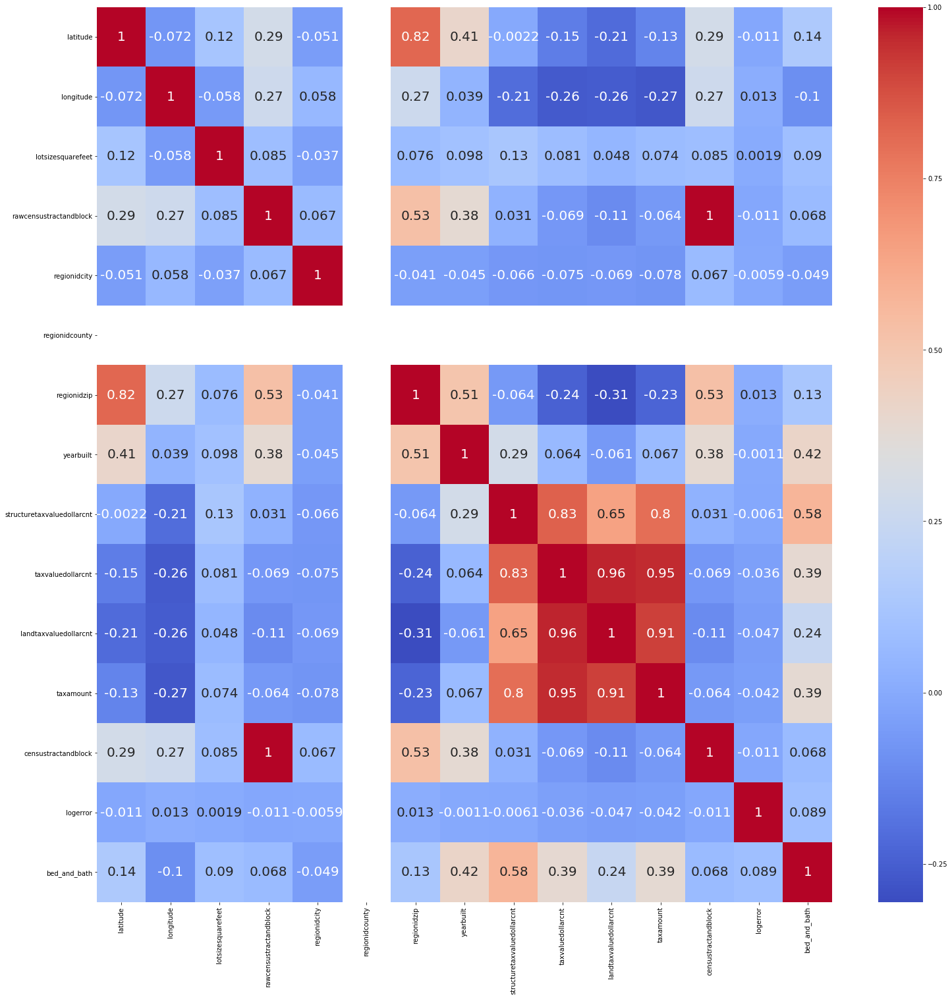

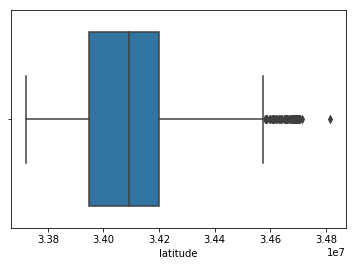

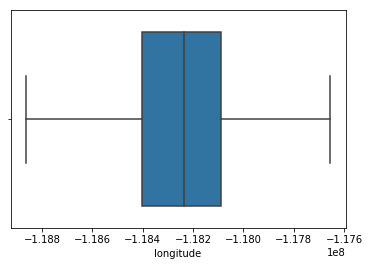

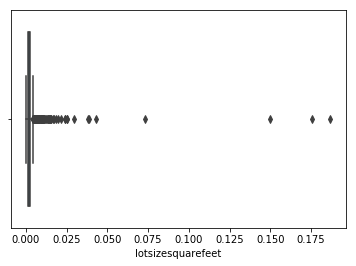

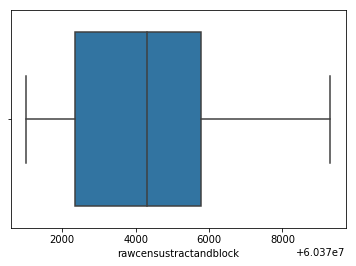

...

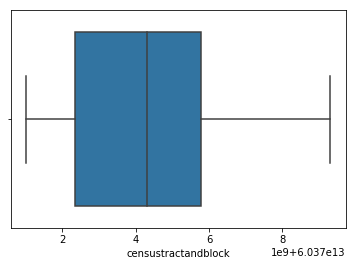

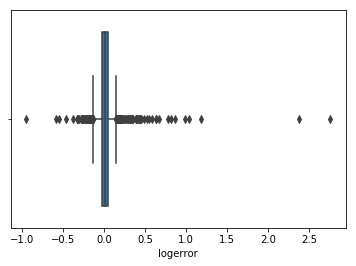

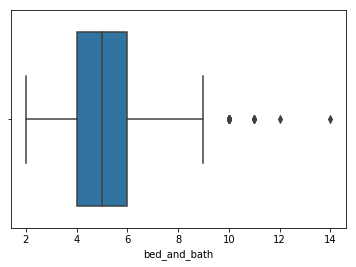

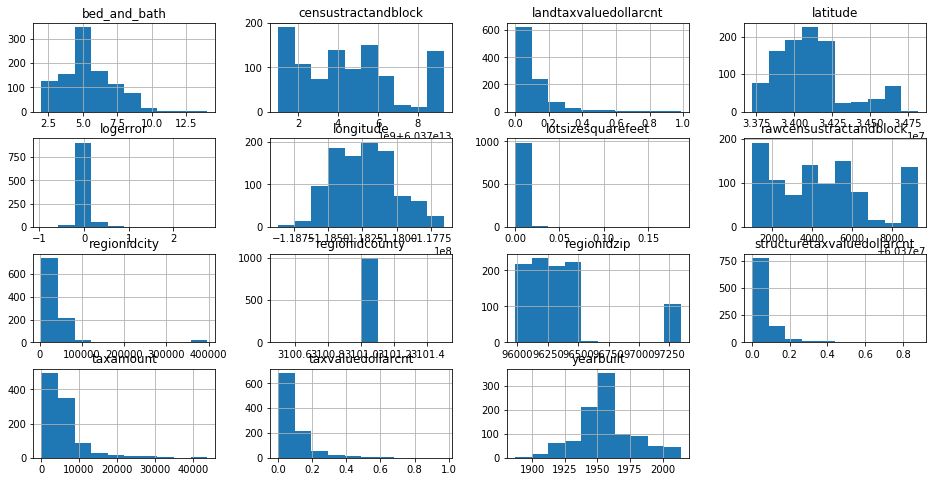

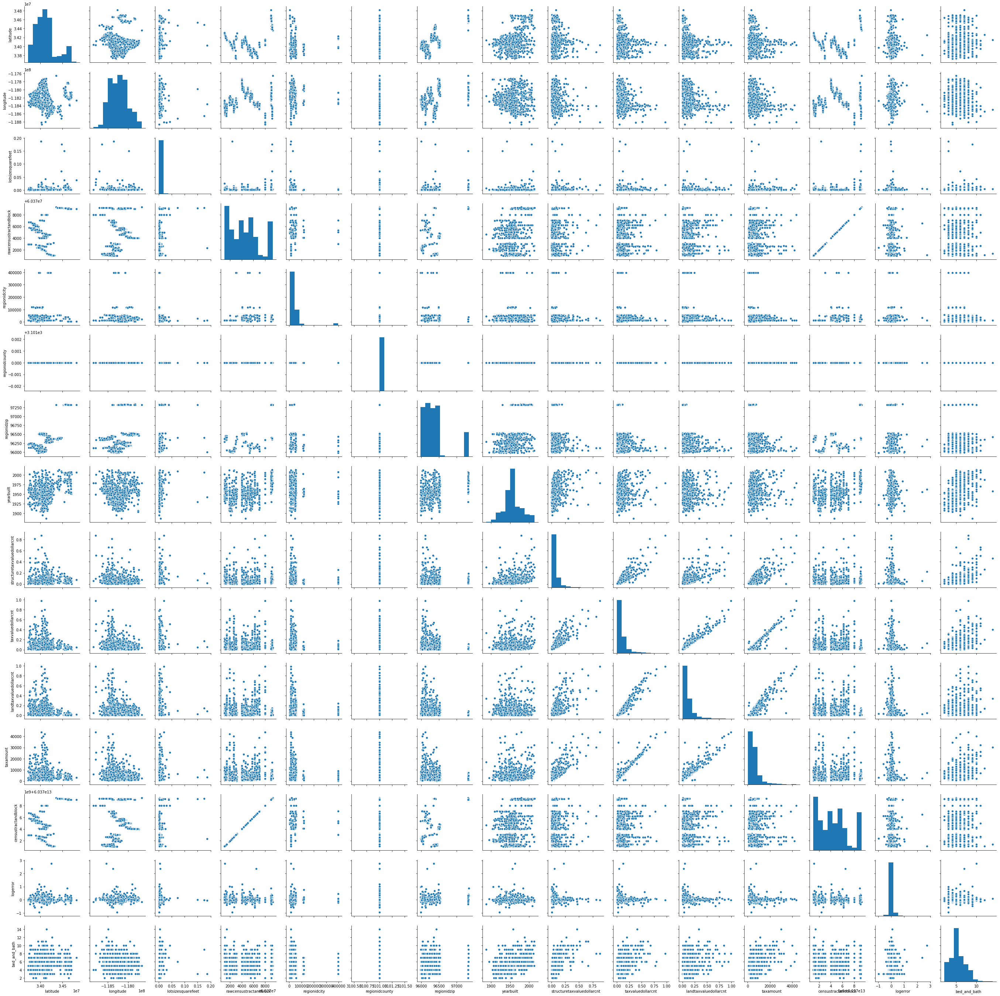

In [15]:
get_heat_pair_box(df.sample(1000), num_vars)

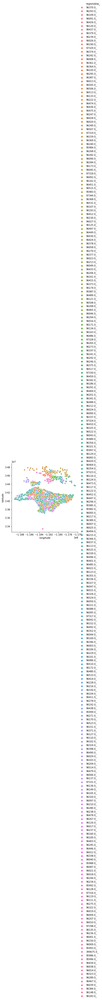

In [110]:
# relplot of latitude and longitude with zip codes for funsies
df['regionidzip_'] = df.regionidzip.astype('str') + '_'
sns.relplot(x='longitude',y='latitude', hue='regionidzip_', data = df)

In [17]:
# cat_vars.remove('regionidcounty')
# cat_vars.remove('propertylandusedesc')
cat_vars

['buildingqualitytypeid',
 'propertycountylandusecode',
 'rawcensustractandblock',
 'regionidcity',
 'regionidcounty',
 'transactiondate',
 'propertylandusedesc',
 'bed_and_bath']

In [18]:
cat_vars.remove('transactiondate')

/usr/local/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


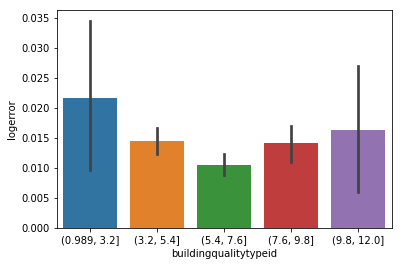

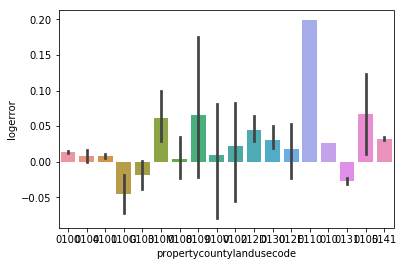

/usr/local/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


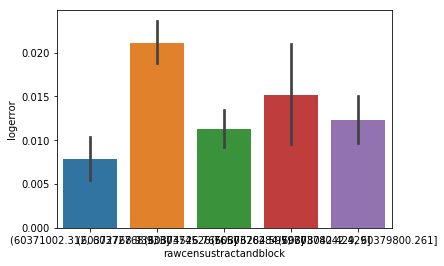

/usr/local/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


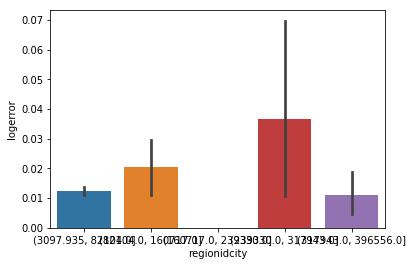

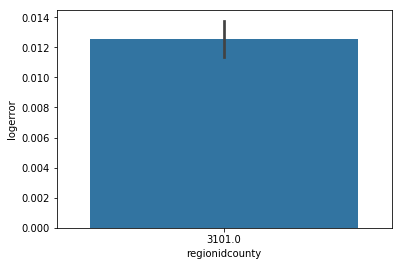

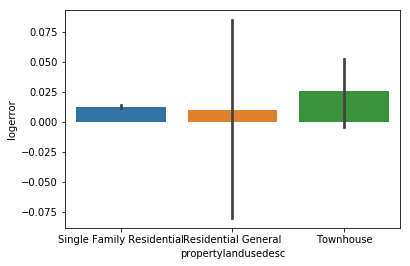

/usr/local/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


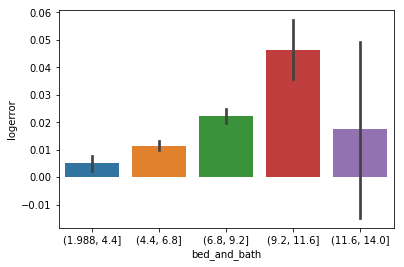

In [19]:
# bar plots of log error distribution for some of our categorical variables:
bars(df, cat_vars, cont_var='logerror')

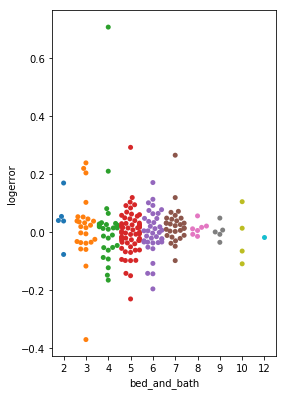

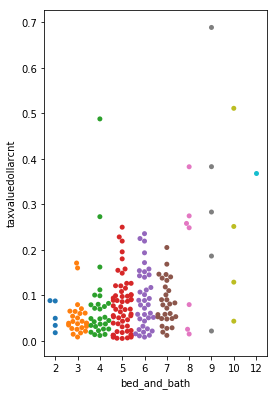

In [20]:
swarrrm(df.sample(200), 'bed_and_bath', ['logerror','taxvaluedollarcnt'])

### We will begin to test for difference between groups. to see if we can extrapolate any further meaning.

In [21]:
#let's try first a simple ttest between logerrors of establishments with 4 or less bed/bath and those with more
tstat, pval = stats.ttest_ind(df[df.bed_and_bath < 5].logerror, df[df.bed_and_bath > 4].logerror)
print('Our t-statistic is {:.4} and the p-value is {:.4}'.format(tstat, pval))

Our t-statistic is -7.434 and the p-value is 1.064e-13


as expected, something as simple as intuitive as this has a very low p-value and a significantly large t-stat by magnitude.  Let's run a few more of these to more finely discern our differences and run some categorical testing for variables using chi-squared methods.

In [ ]:
df.bed_and_bath.value_counts()

In [22]:
#There are 13 groups for bed and bath counts.  let's run a chi-squared test to see if there is 
#significance in the way that logerror is distributed here.

5     20717
6     12534
4      9742
7      8208
3      7764
8      3439
9      1631
10      868
2       569
11      391
12      126
13       60
14        9
Name: bed_and_bath, dtype: int64

In [23]:
df['logerror_abs'] = df.logerror.abs()
df['logerror_abs_bin'] = pd.qcut(df.logerror_abs, 13, labels=False)

tbl = pd.crosstab(df['bed_and_bath'], df['logerror_abs_bin'])
print(tbl)
stat, p, dof, expected = stats.chi2_contingency(tbl)
print('chi-squared statistic: {}'.format(stat))
print('p-statistic of logerror bins vs location clusters: {}'.format(p))

logerror_abs_bin    0     1     2     3     4     5     6     7     8     9   \
bed_and_bath                                                                   
2                   18    30    25    23    25    37    33    48    51    54   
3                  513   513   558   521   594   562   584   579   576   608   
4                  701   687   730   720   704   750   730   758   721   754   
5                 1691  1720  1696  1568  1700  1609  1682  1562  1599  1561   
6                 1031   992  1092   977  1027   981   999   987   966   950   
7                  698   691   698   675   668   618   647   606   618   621   
8                  257   266   263   260   263   240   247   244   291   281   
9                   97    99   102   101   112   113   118   118   131   128   
10                  42    56    51    51    66    35    64    71    81    75   
11                  24    17    20    14    22    12    28    25    35    47   
12                   7     4     5     5

In [24]:
df.drop(columns='logerror_abs_bin', inplace=True)

We can assess some value here suggesting that our distribution of logerror is not evenly distributed due to a very low p-statistic.  We can reject the null hypothesis that would suggest that there is no difference in distribution between these groups.

### First clustering attempt:

In [25]:
#only log error:
X = df[['logerror']]

intertias = []
for numclusters in range(1, 11):
    kmeans = KMeans(n_clusters=numclusters)
    kmeans.fit(X)
    intertias.append(kmeans.inertia_)
    
kmeans_perf = pd.DataFrame(list(zip(range(1, 11), intertias)), columns=['n_clusters', 'ssd'])

Text(0.5, 1.0, 'The elbow method for logerror only')

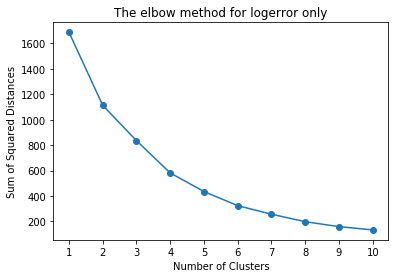

In [26]:
plt.scatter(kmeans_perf.n_clusters, kmeans_perf.ssd)
plt.plot(kmeans_perf.n_clusters, kmeans_perf.ssd)

plt.xticks(range(1, 11))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('The elbow method for logerror only')

#### It looks like 4 clusters is a good standard to use with this elbow model.  We will append the results of a 4 cluster model to our dataframe.

In [27]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
df['cluster_target'] = kmeans.predict(X)

In [28]:
df['cluster_target'].head()

0     0
2     0
5     3
6     0
10    1
Name: cluster_target, dtype: int32

### Let's test the significance of this clustering:

In [29]:
#if we bin everythging by clusters, our null hypothesis would be that 
# there is a roughly 25% distribution of entries across these clusters.
# Let's see the value counts in each of these clusters.
df.cluster_target.value_counts()

0    59844
1     3887
3     2163
2      164
Name: cluster_target, dtype: int64

### These numbers don't exactly look distributed evenly.  
### Let's run a chi^2 test for significance.

In [30]:
# first bin the logerrors so that they match our clusters: 
df['logerror_bin'] = pd.qcut(df.logerror, 4, labels=False)


tbl = pd.crosstab(df['cluster_target'], df['logerror_bin'])
tbl

logerror_bin,0,1,2,3
cluster_target,,,,
0,14522,16565,16293,12464
1,0,0,0,3887
2,0,0,0,164
3,2163,0,0,0


In [31]:
stat, p, dof, expected = stats.chi2_contingency(tbl)

In [32]:
print('p-statistic of logerror bins vs logerror clusters: {}'.format(p))

p-statistic of logerror bins vs logerror clusters: 0.0


In [33]:
#investigate again utilizing the absolute value of the log error this time

df['logerror_abs_bin'] = pd.qcut(df.logerror_abs, 4, labels=False)

tbl = pd.crosstab(df['cluster_target'], df['logerror_abs_bin'])
tbl


logerror_abs_bin,0,1,2,3
cluster_target,,,,
0,16515,16607,16421,10301
1,0,0,0,3887
2,0,0,0,164
3,0,0,0,2163


In [65]:
#small loop to look at the difference bewteen mean log error between our clusters:
stat, p, dof, expected = stats.chi2_contingency(tbl)
print('p-statistic of logerror bins vs logerror clusters: {}'.format(p))

for i in range(0,3):
    tstat, pval = stats.ttest_ind(df[df.cluster_target == i].logerror,
                    df[df.cluster_target == (i+1)].logerror)
    print('Our t-statistic is {:.4} and the p-value is {:.10}'.format(tstat, pval))

p-statistic of logerror bins vs logerror clusters: 1.5003642907222786e-40
Our t-statistic is -274.9 and the p-value is 0.0
Our t-statistic is -81.72 and the p-value is 0.0
Our t-statistic is 72.17 and the p-value is 0.0


### still reading as zero, which makes a lot of sense considering we are comparing logerror to clusters based only upon logerror.

Let's try a new clustering based on latitude, longitude and

/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


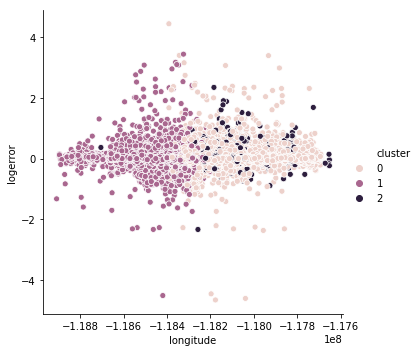

In [66]:
# Make a new X:
X = df[['longitude', 'latitude', 'logerror']]
#create kmeans object:
kmeans = KMeans(n_clusters=3)
# fit it: 
kmeans.fit(X)
X['cluster'] = kmeans.predict(X)
# visualize our clusters on top of the plotted points we observed initially in our pairplot:
sns.relplot(data=X, x='longitude', y='logerror', hue='cluster')
plt.show()
 

In [36]:
# build a loop for performance to process elbow method: 
X = df[['longitude', 'latitude', 'logerror']]

intertias = []
for numclusters in range(1, 11):
    kmeans = KMeans(n_clusters=numclusters)
    kmeans.fit(X)
    intertias.append(kmeans.inertia_)
    
kmeans_perf = pd.DataFrame(list(zip(range(1, 11), intertias)), columns=['n_clusters', 'ssd'])

Text(0.5, 1.0, 'The elbow method for latitude, longitude, and logerror')

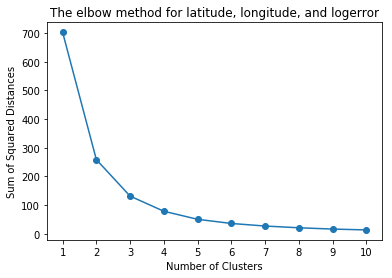

In [67]:
# elbow method visualization: 
plt.scatter(kmeans_perf.n_clusters, kmeans_perf.ssd)
plt.plot(kmeans_perf.n_clusters, kmeans_perf.ssd)

plt.xticks(range(1, 11))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('The elbow method for latitude, longitude, and logerror')

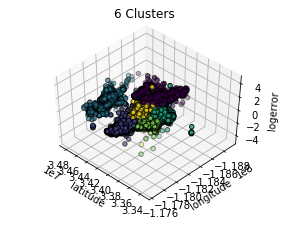

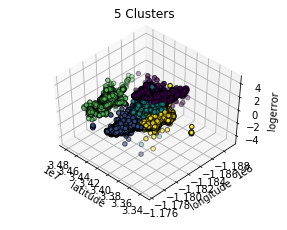

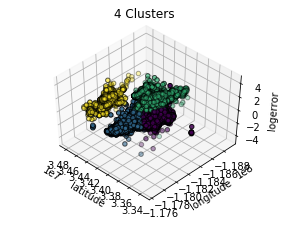

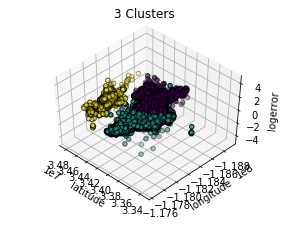

In [38]:
# visual comparison of Kmeans models using longitude/latitude and logerror

from mpl_toolkits.mplot3d import Axes3D


estimators = [('6 Clusters', KMeans(n_clusters=6)),
              ('5 Clusters', KMeans(n_clusters=5)),
              ('4 Clusters', KMeans(n_clusters=4)), 
             ('3 Clusters', KMeans(n_clusters=3))]

for i, (title, kmeans) in enumerate(estimators):
    # fit the model
    kmeans.fit(X)

    labels = kmeans.labels_

#     # setup the 3d plot
    fignum = i + 1
    fig = plt.figure(fignum, figsize=(4, 3))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

#     # plot the points
    ax.scatter(X.latitude, X.longitude, X.logerror,
               c=labels.astype(np.float), edgecolor='k')

#     ax.w_xaxis.set_ticklabels([])
#     ax.w_yaxis.set_ticklabels([])
#     ax.w_zaxis.set_ticklabels([])

    ax.set_xlabel('latitude')
    ax.set_ylabel('longitude')
    ax.set_zlabel('logerror')

    ax.set_title(title)
    ax.dist = 12

/usr/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


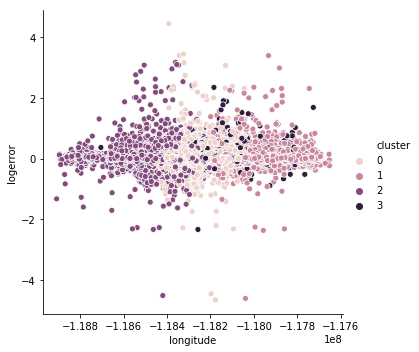

In [39]:
#plot our clusters again on top of our observed values to visualize our clusters
X = df[['longitude', 'latitude', 'logerror']]
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
X['cluster'] = kmeans.predict(X)

sns.relplot(data=X, x='longitude', y='logerror', hue='cluster')
 

Text(0.5, 1.0, 'The elbow method')

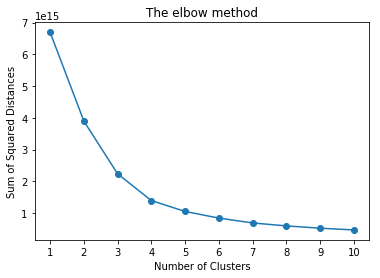

In [40]:
# clustering based strictly on location: 
X = df[['longitude', 'latitude']]

intertias = []
for numclusters in range(1, 11):
    kmeans = KMeans(n_clusters=numclusters)
    kmeans.fit(X)
    intertias.append(kmeans.inertia_)
    
kmeans_perf = pd.DataFrame(list(zip(range(1, 11), intertias)), columns=['n_clusters', 'ssd'])

plt.scatter(kmeans_perf.n_clusters, kmeans_perf.ssd)
plt.plot(kmeans_perf.n_clusters, kmeans_perf.ssd)

plt.xticks(range(1, 11))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('The elbow method')

In [41]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
df['cluster_target_loc'] = kmeans.predict(X)

In [42]:
#add a new column for locational clusters
df['logerror_abs_bin'] = pd.qcut(df.logerror_abs, 4, labels=False)

tbl = pd.crosstab(df['cluster_target_loc'], df['logerror_abs_bin'])
print(tbl)
stat, p, dof, expected = stats.chi2_contingency(tbl)
print('p-statistic of logerror bins vs location clusters: {}'.format(p))

logerror_abs_bin       0     1     2     3
cluster_target_loc                        
0                   5231  5517  5762  6033
1                   4277  4257  4114  3818
2                   4892  4936  4960  5124
3                   2115  1897  1585  1540
p-statistic of logerror bins vs location clusters: 2.462451088908005e-43


In [43]:
# We have a pretty low p-value here,
# we can reject the null hypothesis that these are proportionally distributed.

In [44]:
#splitting up the data into different frames based on clusters: 
df0 = df[df.cluster_target_loc == 0]
df1 = df[df.cluster_target_loc == 1]
df2 = df[df.cluster_target_loc == 2]
df3 = df[df.cluster_target_loc == 3]

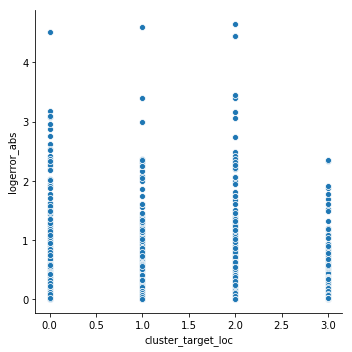

In [45]:
#relplot to visualize absolute logerror based on location clusters: 
sns.relplot(x='cluster_target_loc', y='logerror_abs', data=df)

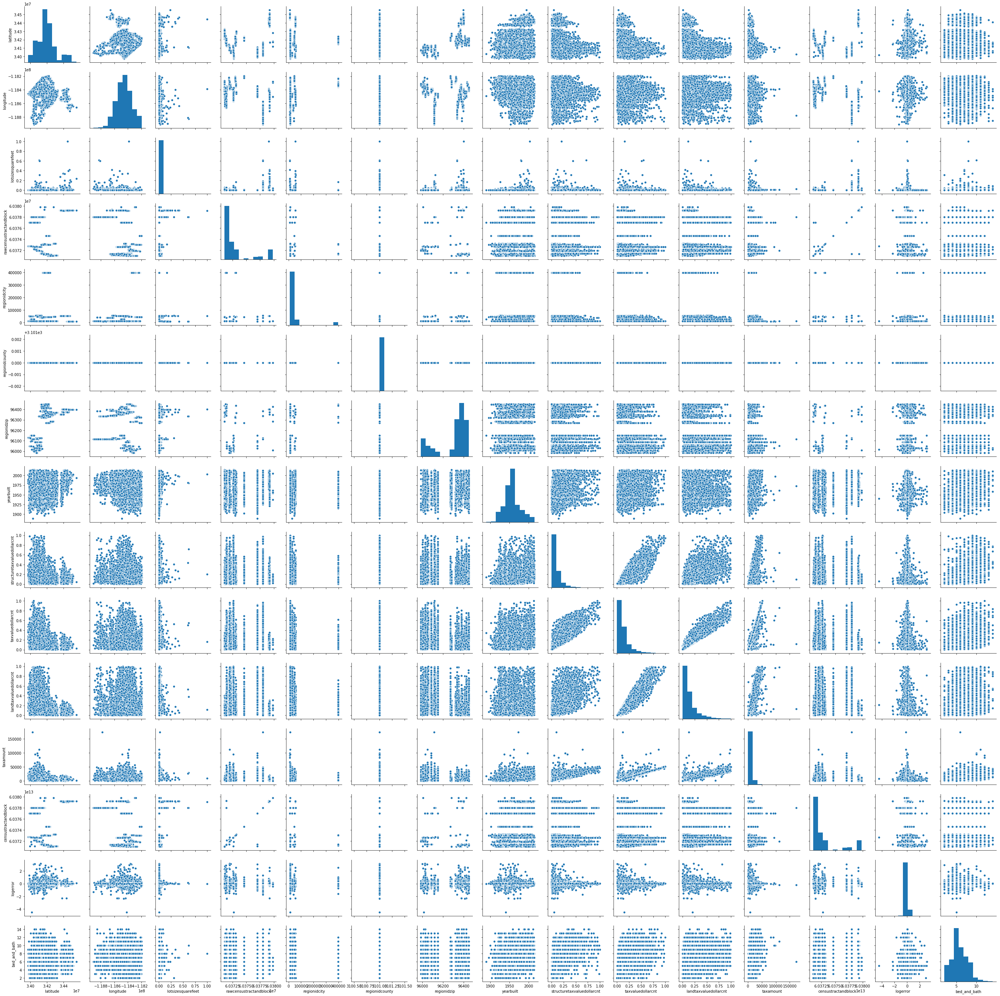

In [46]:
#pairplot of first cluster dataframe to see if we can visualize any more distinct linear correlations: 
sns.pairplot(df0[num_vars])

In [ ]:
# nope.

/usr/local/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


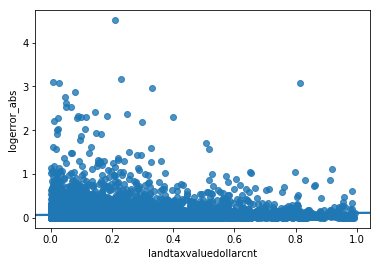

In [47]:
#We utilized landtaxvaluedollarcnt in our last linear regression project, lets zoom in on that to see if its 
#visually correlated.
sns.regplot(x='landtaxvaluedollarcnt', y='logerror_abs', data=df0)

In [ ]:
# nope!

In [48]:
#Let's make some dummy variables to see if one of the clusters has a more weighted significance than the others.
df_dumclusts = pd.get_dummies(df['cluster_target_loc'])
#create a new dataframe with our cluster variables
df_new = pd.concat([df, df_dumclusts], axis=1)

In [49]:
df_new.head()

,id,parcelid,buildingqualitytypeid,latitude,longitude,lotsizesquarefeet,propertycountylandusecode,rawcensustractandblock,regionidcity,regionidcounty,...,regionidzip_,logerror_abs,cluster_target,logerror_bin,logerror_abs_bin,cluster_target_loc,0,1,2,3
0,2931667,11016594,4.0,34280990.0,-118488536.0,0.002352,0100,6.037107e+07,12447.0,3101.0,...,96370.0_,0.0276,0,2,1,0,1,0,0,0
2,2444575,12098116,4.0,34136312.0,-118175032.0,0.003727,0100,6.037464e+07,47019.0,3101.0,...,96293.0_,0.0040,0,1,0,1,0,1,0,0
5,2843942,11509835,1.0,33870089.0,-118402768.0,0.000649,0100,6.037621e+07,29712.0,3101.0,...,96109.0_,0.2705,3,0,3,2,0,0,1,0
6,1628001,12286022,7.0,33899475.0,-118212720.0,0.002051,0100,6.037542e+07,24174.0,3101.0,...,96091.0_,0.0440,0,3,2,2,0,0,1,0
10,715639,10854446,7.0,34164671.0,-118477995.0,0.002617,0100,6.037141e+07,12447.0,3101.0,...,96426.0_,0.3825,1,3,3,0,1,0,0,0


### We will spit and model on the data with these clusters to see if there is anything meaningful here.

In [50]:

X = df_new[[0, 1, 2, 3]]
y = df_new[['logerror_abs']]

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=123)
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)



/usr/local/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [51]:
#list comprehension to check for correlation on the clusters
[[column, pearsonr(train[column], train.logerror_abs)] for column in X_train] 


[[0, (0.01810410101853367, 3.153893739115037e-05)],
 [1, (-0.021713014130316965, 5.978385648441535e-07)],
 [2, (0.014463527571485356, 0.0008841591176275397)],
 [3, (-0.01871346759960615, 1.691295524913776e-05)]]

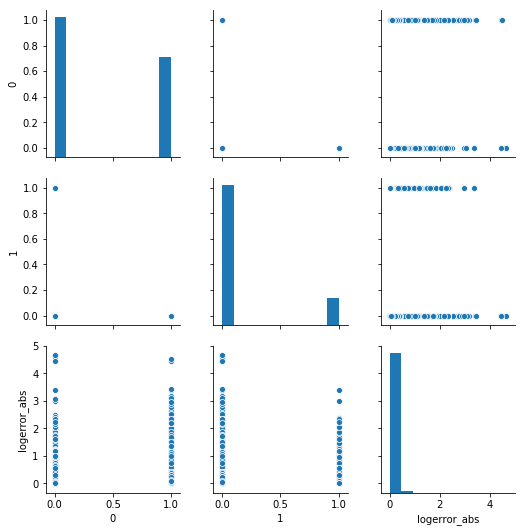

In [104]:
sns.pairplot(df_new[[0,1,'logerror_abs']])

## First attempt at a linear regression: 

In [53]:
#attempt to make a linear model based solely on cluster 1 as a feature,
# as it seems to have the most correlation. (still poor)

lm1 = LinearRegression()
lm1.fit(X_train[[1]], y_train)
lm1_y_intercept = lm1.intercept_
lm1_coefficients = lm1.coef_
y_pred_lm1 = lm1.predict(X_train[[1]])
mse_lm1 = mean_squared_error(y_train, y_pred_lm1)
r2_lm1 = r2_score(y_train, y_pred_lm1)
print('r^2 value for first regression model: {:.2}'.format(r2_lm1))
print('mean squared error for lmd on test data: {:.2}'.format(mse_lm1))
print('{:.2%} of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.'
      .format(r2_lm1))


r^2 value for first regression model: 0.00047
mean squared error for lmd on test data: 0.02
0.05% of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.


yep, that's a pretty horrible model.

Text(0.5, 1.0, 'The elbow method for regionidzip and latitude')

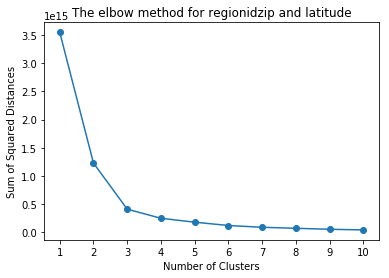

In [54]:
# clustering based on location zip code and latitude: 
X = df[['regionidzip', 'latitude']]

intertias = []
for numclusters in range(1, 11):
    kmeans = KMeans(n_clusters=numclusters)
    kmeans.fit(X)
    intertias.append(kmeans.inertia_)
    
kmeans_perf = pd.DataFrame(list(zip(range(1, 11), intertias)), columns=['n_clusters', 'ssd'])

plt.scatter(kmeans_perf.n_clusters, kmeans_perf.ssd)
plt.plot(kmeans_perf.n_clusters, kmeans_perf.ssd)

plt.xticks(range(1, 11))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('The elbow method for regionidzip and latitude')

### Here I am going to implement the difference from mean feature that I utilized in my first linear regression project model.  We will see if it creates any utility in making clusters.

In [55]:
from helper import *
df['diff_from_mean'] = df.taxvaluedollarcnt.mean() - df.taxvaluedollarcnt

In [56]:
X = df[['diff_from_mean']]

intertias = []
for numclusters in range(1, 11):
    kmeans = KMeans(n_clusters=numclusters)
    kmeans.fit(X)
    intertias.append(kmeans.inertia_)
    
kmeans_perf = pd.DataFrame(list(zip(range(1, 11), intertias)), columns=['n_clusters', 'ssd'])

Text(0.5, 1.0, 'The elbow method for Difference from mean ')

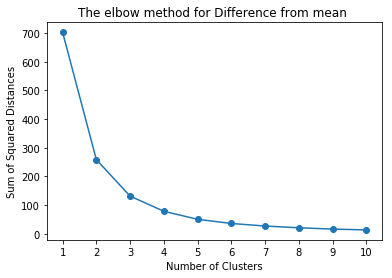

In [57]:
plt.scatter(kmeans_perf.n_clusters, kmeans_perf.ssd)
plt.plot(kmeans_perf.n_clusters, kmeans_perf.ssd)

plt.xticks(range(1, 11))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('The elbow method for Difference from mean ')

### It looks like 3 clusters is the best way to go here.  We will proceed with that

In [58]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
df['cluster_target_diffmean'] = kmeans.predict(X)

#### chi test for significance:

In [59]:
df['logerror_abs_bin'] = pd.qcut(df.logerror_abs, 3, labels=False)

tbl = pd.crosstab(df['cluster_target_loc'], df['logerror_abs_bin'])
print(tbl)
stat, p, dof, expected = stats.chi2_contingency(tbl)
print('p-statistic of logerror bins vs location clusters: {}'.format(p))
stat

logerror_abs_bin       0     1     2
cluster_target_loc                  
0                   7082  7476  7985
1                   5720  5570  5176
2                   6545  6569  6798
3                   2779  2298  2060
p-statistic of logerror bins vs location clusters: 1.5003642907222786e-40


200.4792533147562

### dummy variable creation: 

In [60]:
df_dumclusts = pd.get_dummies(df['cluster_target_diffmean'])

df_new = pd.concat([df, df_dumclusts], axis=1)

In [61]:
df_new.head()

,id,parcelid,buildingqualitytypeid,latitude,longitude,lotsizesquarefeet,propertycountylandusecode,rawcensustractandblock,regionidcity,regionidcounty,...,logerror_abs,cluster_target,logerror_bin,logerror_abs_bin,cluster_target_loc,diff_from_mean,cluster_target_diffmean,0,1,2
0,2931667,11016594,4.0,34280990.0,-118488536.0,0.002352,0100,6.037107e+07,12447.0,3101.0,...,0.0276,0,2,1,0,0.020184,0,1,0,0
2,2444575,12098116,4.0,34136312.0,-118175032.0,0.003727,0100,6.037464e+07,47019.0,3101.0,...,0.0040,0,1,0,1,0.076295,0,1,0,0
5,2843942,11509835,1.0,33870089.0,-118402768.0,0.000649,0100,6.037621e+07,29712.0,3101.0,...,0.2705,3,0,2,2,-0.467397,1,0,1,0
6,1628001,12286022,7.0,33899475.0,-118212720.0,0.002051,0100,6.037542e+07,24174.0,3101.0,...,0.0440,0,3,1,2,0.078254,0,1,0,0
10,715639,10854446,7.0,34164671.0,-118477995.0,0.002617,0100,6.037141e+07,12447.0,3101.0,...,0.3825,1,3,2,0,0.079554,0,1,0,0


### Train/test split:

In [62]:
X = df_new.drop(columns=['logerror_abs', 'logerror'])
y = df_new[['logerror_abs']]
# X[[0, 'lotsizesquarefeet']]

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=123)
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)

/usr/local/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


### correlation test:

In [68]:
[[column, pearsonr(train[column], train.logerror_abs)] for column in X_train[[0,1,2]]] 

[[0, (-0.0186248223063143, 1.8539401753881617e-05)],
 [1, (0.0318574406599618, 2.386200725404986e-13)],
 [2, (0.004184463290628186, 0.33609146458558203)]]

In [ ]:
# it looks like 1 has our most significant  correlation here. Let's implement it.
# we will include taxvaluedollarcnt and bed and bath as these are the other most 
# significant variables we are aware of currently.

In [70]:
lm2 = LinearRegression()
lm2.fit(X_train[[1, 'taxvaluedollarcnt', 'bed_and_bath']], y_train)
lm2_y_intercept = lm2.intercept_
lm2_coefficients = lm2.coef_
y_pred_lm2 = lm2.predict(X_train[[1, 'taxvaluedollarcnt', 'bed_and_bath']])
mse_lm2 = mean_squared_error(y_train, y_pred_lm2)
r2_lm2 = r2_score(y_train, y_pred_lm2)
print('r^2 value for first regression model: {:.2}'.format(r2_lm2))
print('mean squared error for lmd on test data: {:.2}'.format(mse_lm2))
print('{:.2%} of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.'
      .format(r2_lm2))

r^2 value for first regression model: 0.0016
mean squared error for lmd on test data: 0.02
0.16% of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.


Text(0.5, 1.0, 'The elbow method for regionidzip and longitude')

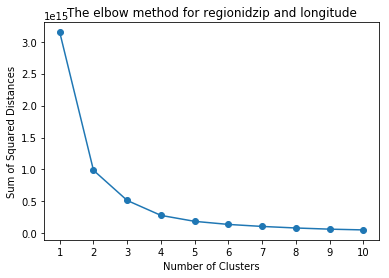

In [71]:
# clustering based on location zip code and longitude: 
X = df[['regionidzip', 'longitude']]

intertias = []
for numclusters in range(1, 11):
    kmeans = KMeans(n_clusters=numclusters)
    kmeans.fit(X)
    intertias.append(kmeans.inertia_)
    
kmeans_perf = pd.DataFrame(list(zip(range(1, 11), intertias)), columns=['n_clusters', 'ssd'])

plt.scatter(kmeans_perf.n_clusters, kmeans_perf.ssd)
plt.plot(kmeans_perf.n_clusters, kmeans_perf.ssd)

plt.xticks(range(1, 11))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('The elbow method for regionidzip and longitude')

In [74]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
df['cluster_target_zip'] = kmeans.predict(X)

In [75]:
df['logerror_abs_bin'] = pd.qcut(df.logerror_abs, 3, labels=False)

tbl = pd.crosstab(df['cluster_target_zip'], df['logerror_abs_bin'])
print(tbl)
stat, p, dof, expected = stats.chi2_contingency(tbl)
print('p-statistic of logerror bins vs longitudinal and zip clusters: {}'.format(p))
stat

logerror_abs_bin       0     1     2
cluster_target_zip                  
0                   8549  9197  9803
1                   4156  3696  2969
2                   9421  9020  9247
p-statistic of logerror bins vs longitudinal and zip clusters: 7.78665746670933e-62


291.39245610133327

In [76]:
df_dumclusts = pd.get_dummies(df['cluster_target_zip'])

df_new = pd.concat([df, df_dumclusts], axis=1)

In [77]:
X = df_new.drop(columns=['logerror_abs', 'logerror'])
y = df_new[['logerror_abs']]
# X[[0, 'lotsizesquarefeet']]

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.80, random_state=123)
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)

/usr/local/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [78]:
from sklearn import datasets
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

### First attempt at a Lasso Regression: 

In [80]:
clf = Lasso(alpha=0.05)

In [81]:
[[column, pearsonr(train[column], train.logerror_abs)] for column in X_train[[0,1,2]]] 

[[0, (0.023130972910849652, 1.0491788939422031e-07)],
 [1, (-0.03468963359737505, 1.5023134997112003e-15)],
 [2, (0.002889966126640349, 0.5064736606270341)]]

In [83]:
clf.fit(X_train[[0, 'bed_and_bath', 'taxvaluedollarcnt']], y_train)

Lasso(alpha=0.05, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [84]:
print(clf.coef_)

[ 0. -0.  0.]


### First attempt at a ridge regression:

In [88]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

In [90]:
reg = Ridge(alpha=.5)

In [91]:
reg.fit(X_train[[0, 'bed_and_bath', 'taxvaluedollarcnt']], y_train) 
reg.predict()

Ridge(alpha=0.5, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

In [92]:
reg.coef_

array([[ 0.00534544, -0.00231638,  0.04070751]])

In [109]:
y_pred_rm1 = reg.predict(X_train[[0, 'taxvaluedollarcnt', 'bed_and_bath']])
from math import sqrt
rms = sqrt(mean_squared_error(y_train, y_pred_rm1))
r2_rm1 = r2_score(y_train, y_pred_rm1)
print('r^2 value for first regression model: {:.2}'.format(r2_rm1))
print('mean squared error for lmd on test data: {:.2}'.format(rms))
print('{:.2%} of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.'
      .format(r2_rm1))

r^2 value for first regression model: -2.8
mean squared error for lmd on test data: 0.28
-282.32% of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.


## The second linear model with a very very low r^2 is our best model on the trainm, unformatunately.  Limited understanding with difficulties regarding Lasso and Ridge regression has resulted in lack of toubleshooting on those fronts.  

In [ ]:
# lm2 = LinearRegression()
# lm2.fit(X_train[[1, 'taxvaluedollarcnt', 'bed_and_bath']], y_train)
# lm2_y_intercept = lm2.intercept_
# lm2_coefficients = lm2.coef_
# y_pred_lm2 = lm2.predict(X_train[[1, 'taxvaluedollarcnt', 'bed_and_bath']])
# mse_lm2 = mean_squared_error(y_train, y_pred_lm2)
# r2_lm2 = r2_score(y_train, y_pred_lm2)
# print('r^2 value for first regression model: {:.2}'.format(r2_lm2))
# print('mean squared error for lmd on test data: {:.2}'.format(mse_lm2))
# print('{:.2%} of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.'
#       .format(r2_lm2))

In [96]:
y_pred_lm2 = lm2.predict(X_test[[1, 'taxvaluedollarcnt', 'bed_and_bath']])
mse_lm2_tst = mean_squared_error(y_test, y_pred_lm2)
print(f'mean squared error for lmd on test data: {mse_lm2_tst}')

r2_lm2_tst = r2_score(y_test, y_pred_lm2)
r2_lm2_tst
print('{:.2%} of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.'
      .format(r2_lm2_tst))

mean squared error for lmd on test data: 0.02143069210535646
-0.57% of the variance in the average absolute log error can be explained by the difference of the tax assessed house price by bins of 25,000.


Text(0.5, 1.0, 'Residuals on Test for Model lm2:')

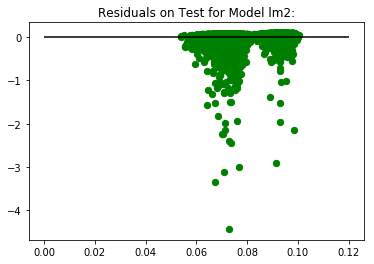

In [99]:
plt.scatter(y_pred_lm2, y_pred_lm2 - y_test, c='g', s=40)
plt.hlines(y=0, xmin=0, xmax=0.12)
plt.title("Residuals on Test for Model lm2:")

Wow!, its trash!